# ViEWS prediction competition LSTM notebook

## Author: Iris Malone

# Load Packages

In [45]:
import tensorflow as tf
from tensorflow.python.keras.layers import LSTM
from tensorflow.python.keras.layers import Input, Dense, Dropout, RepeatVector, TimeDistributed, Activation, Bidirectional
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping

#plots
from plotnine import ggplot, aes
from plotnine import options
import plotnine as p9
from matplotlib import pyplot as plt

#random number generators since rnn is stochastic
from random import seed

In [46]:
import sys
import logging
import os
import pandas as pd
import numpy as np
import math
import csv
from datetime import datetime
from joblib import dump, load

# Import any other sklearn estimator you would like. 
# See https://scikit-learn.org/stable/user_guide.html#user-guide
#from sklearn.ensemble import RandomForestRegressor

from sklearn import metrics
from sklearn.preprocessing import MinMaxScaler

#import views package

import views
from views import Period, Model, Downsampling
from views.utils.data import assign_into_df
from views.apps.transforms import lib as translib
from views.apps.evaluation import lib as evallib, feature_importance as fi
from views.apps.model import api
from views.apps.extras import extras


In [47]:

logging.basicConfig(
    #level=logging.DEBUG,
    level=logging.INFO, # uncomment this and comment debug above for less yelling in red
    format=views.config.LOGFMT,
)

In [48]:
# Do you wish to fetch the latest public data? If so, change False to True and run this cell
# Cells below will fail if this is not run if you haven't imported data yourself yet.
if False:
    path_zip = views.apps.data.public.fetch_latest_zip_from_website(path_dir_destination=views.DIR_SCRATCH)
    views.apps.data.public.import_tables_and_geoms(tables=views.TABLES, geometries=views.GEOMETRIES, path_zip=path_zip)

In [49]:
# Enter the level of analysis, and whether to predict Africa-only.
level = "cm"
pred_africa = False

In [50]:
model_path = "./models/{sub}"
out_paths = {
    "evaluation": model_path.format(sub="evaluation"),
    "features": model_path.format(sub="features")
}
for k, v in out_paths.items():
    if not os.path.isdir(v):
        os.makedirs(v)

In [51]:
if level == "pgm":
    dataset = views.DATASETS["pgm_africa_imp_0"]
elif level == "cm":
    dataset = views.DATASETS["cm_global_imp_0"]
df = dataset.df

In [52]:
df.reset_index(inplace=True)

# Clean Data

In [53]:
df["time"] = df["month_id"]
df["gwno"] = df["country_id"]

df = df.dropna(subset=['country_id'], how='all')
df = df.set_index(["month_id", "country_id"]).sort_index()

In [54]:
#from views.apps.transforms import lib as translib
#df['s_outcome'] = translib.delta(df['ln_ged_best_sb'], time=1)
#df = pd.DataFrame(df)
#header = ["s_outcome", "ln_ged_best_sb", "country_name", "gwno", "time"]
#df.to_csv('output.csv', columns = header)


df.head()

acled_count_ns  acled_count_os  acled_count_pr  \
month_id country_id                                                   
1        1                      0.0             0.0             0.0   
         2                      0.0             0.0             0.0   
         3                      0.0             0.0             0.0   
         4                      0.0             0.0             0.0   
         5                      0.0             0.0             0.0   

                     acled_count_sb  acled_dummy_ns  acled_dummy_os  \
month_id country_id                                                   
1        1                      0.0               0               0   
         2                      0.0               0               0   
         3                      0.0               0               0   
         4                      0.0               0               0   
         5                      0.0               0               0   

                     acled_dummy_pr  acled_dummy_sb  cdum_1  cdum_10  ...  \
month_id country_id                                                   ...   
1        1                        0               0       1        0  ...   
         2                        0               0       0        0  ...   
         3                        0               0       0        0  ...   
         4                        0               0       0        0  ...   
         5                        0               0       0        0  ...   

                     wdi_vc_idp_nwcv  wdi_vc_idp_nwds  wdi_vc_idp_tocv  \
month_id country_id                                                      
1        1              3.600000e+04            200.0          23000.0   
         2              2.667522e+05            300.0           2100.0   
         3              7.500000e+04             29.0         164000.0   
         4              1.672000e+06           4700.0         197000.0   
         5              1.500000e+02           5300.0           2100.0   

                     wdi_vc_ihr_psrc_fe_p5  wdi_vc_ihr_psrc_ma_p5  \
month_id country_id                                                 
1        1                             7.5                   30.3   
         2                             5.8                   11.9   
         3                             4.0                   36.6   
         4                             1.9                   22.9   
         5                             0.0                   10.0   

                     wdi_vc_ihr_psrc_p5  wdi_vc_pkp_totl_un  year  time  gwno  
month_id country_id                                                            
1        1                         12.1               141.0  1980     1     1  
         2                         14.4              9057.0  1980     1     2  
         3                          9.5               871.0  1980     1     3  
         4                         12.5              8536.0  1980     1     4  
         5                          8.7              1216.0  1980     1     5  

[5 rows x 3159 columns]

## Define Time Periods

In [55]:
# Define our 2017.01-2019.12 development period
# Keeping periods in a list lets us easily expand this as the 
# updated data becomes available
period_calib = {'train_start': 121,   # 1990-01
          'train_end': 408,     # 2016.12
          'predict_start': 409, # 2017.01
          'predict_end': 444}   # 2019.12

print(period_calib)


period_test = {'train_start': 121,   # 1990-01
          'train_end': 444,     # 2016.12
          'predict_start': 445, # 2017.01
          'predict_end': 480}   # 2019.12

print(period_test)

periods = [period_calib, period_test]


{'train_start': 121, 'train_end': 408, 'predict_start': 409, 'predict_end': 444}
{'train_start': 121, 'train_end': 444, 'predict_start': 445, 'predict_end': 480}


## Write Model Functions

In [56]:
scaler = MinMaxScaler()

#create training and test based on period predictions

def partition_dataset(dataset, period, look_back):
    #create delta/first diff
    from views.apps.transforms import lib as translib
    dataset['s_outcome'] = translib.delta(dataset['ln_ged_best_sb'], time=1)

    train_df = dataset[dataset['time'].between(period['train_start'] , period['train_end']-look_back, inclusive=True)].dropna()
    test_df = dataset[dataset['time'].between(period['predict_start'] - look_back, period['predict_end'], inclusive=True)].dropna()
    #print(train_df)
    #print(test_df) 
    #identify outcome of interest
    train_df = train_df[['s_outcome']]
    test_df = test_df[['s_outcome']]   
    
    return np.array(train_df), np.array(test_df)

def partition_delta(countryname, period, dataset, look_back):

    #s_actual = df.loc[:, self.model.col_outcome].copy()

    #if self.model.delta_outcome:
    #    s_actual = translib.delta(s_actual, time=step)
    
    dataset['s_outcome1'] = translib.delta(dataset['ln_ged_best_sb'], time=1)
    dataset['s_outcome2'] = translib.delta(dataset['ln_ged_best_sb'], time=2)
    dataset['s_outcome3'] = translib.delta(dataset['ln_ged_best_sb'], time=3)
    dataset['s_outcome4'] = translib.delta(dataset['ln_ged_best_sb'], time=4)
    dataset['s_outcome5'] = translib.delta(dataset['ln_ged_best_sb'], time=5)
    dataset['s_outcome6'] = translib.delta(dataset['ln_ged_best_sb'], time=6)
    dataset['s_outcome7'] = translib.delta(dataset['ln_ged_best_sb'], time=7)
    #translib.delta(dataset['ln_ged_best_sb'], time=1)
    
    train_df = dataset[dataset['time'].between(period['train_start'] , period['train_end']-look_back)].dropna()
    test_df = dataset[dataset['time'].between(period['predict_start'] - look_back , period['predict_end'])].dropna()
     
    #identify outcome of interest
    train_df = train_df[['s_outcome1', 's_outcome2', 's_outcome3', 's_outcome4', 's_outcome5', 's_outcome6', 's_outcome7']]
    test_df = test_df[['s_outcome1', 's_outcome2', 's_outcome3', 's_outcome4', 's_outcome5', 's_outcome6', 's_outcome7']]

    return train_df, test_df
    
     
# split a univariate sequence into samples
def create_dataset(dataset, look_back, look_forward):
    X, y = list(), list()
    for i in range(len(dataset)):
        # find the end of this pattern
        end_ix = i + look_back
        out_end_ix = end_ix + look_forward
        # check if we are beyond the sequence
        if out_end_ix > len(dataset):
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = dataset[i:end_ix], dataset[end_ix:out_end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)
 

#VANILLA LSTM
def create_vanilla_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building vanilla Model...')
    # simple early stopping
    es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh"))

    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh", stateful=True))
    #model.add(TimeDistributed(Dense(1)))

    # Dropout Regularization - randomly removes 20\%, helps with overfitting
    model.add(Dropout(0.2))
    #model.add(Dense(4)) 
    
    #Hidden Layers
    #
    model.add(Dense(num_neurons, activation="tanh")) # New hidden layer with 2 params, sigmoid function to constrainw weights
    #model.add(Dense(num_neurons, activation="tanh"))
    
    model.add(Dropout(0.2))
              
    # Output Layers
    model.add(Dense(units = y_train.shape[1]))

    #model.add(Activation('relu'))
    #model.add(Dropout(0.2))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    #model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split, callbacks=[es])
    #remove callback, train for more epochs (passes through the data)
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)

    return model

#STATEFUL LSTM


def create_stateful_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building stateful model...')
    # simple early stopping
    #es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    model.add(LSTM(units = num_neurons, batch_input_shape = (batch_size, X_train.shape[1], 1), activation="tanh",  stateful=True))
    model.add(Dense(num_neurons, activation="tanh"))
    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation="tanh", stateful=True))
    #model.add(TimeDistributed(Dense(1)))

    # Dropout Regularization - randomly removes 20\%, helps with overfitting
    model.add(Dropout(0.2))
    #model.add(Dense(4)) 
    
    #Hidden Layers
    #
    model.add(Dense(num_neurons, activation="tanh")) # New hidden layer, tanh function to constrainw weights
    model.add(Dropout(0.2))
    model.add(Dense(num_neurons, activation="tanh"))
    #model.add(TimeDistributed(Dense(1, activation='sigmoid')))
    
    #model.add(Dropout(0.2))
              
    # Output Layers
    model.add(Dense(units = y_train.shape[1]))

    #model.add(Activation('relu'))
    #model.add(Dropout(0.2))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)
    #remove callback, train for more epochs (passes through the data)
    #model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, validation_split=val_split)

    return model

#BIDIRECTIONAL LSTM
def create_bidirectional_model(X_train, y_train, epochs, num_neurons, batch_size, val_split):
    """BUILDING THE MODEL""" 
    print('Building bidirectional model...')
    # simple early stopping
    es = EarlyStopping(monitor='loss', mode='min', verbose=1)

    model = Sequential()

    #Input Layers
    #model.add(LSTM(units = num_neurons, input_shape = (X_train.shape[1], 1), activation = 'tanh'))
    model.add(Bidirectional(LSTM(num_neurons, return_sequences=True), input_shape = (X_train.shape[1], 1)))
    model.add(TimeDistributed(Dense(1, activation='tanh')))

    # Compiling the model
    model.compile(optimizer = 'adam', loss = 'mean_squared_error')

    #Summarize the model
    model.summary()

    # Fitting the model to the training set
    model.fit(X_train, y_train, epochs = epochs, batch_size = batch_size, callbacks=[es])
    
    return model


def make_forecasts(model, period, batch_size, X_train, y_train, test_df, X_test, y_test, look_back, look_forward):
    """FORECASTING""" 
    print('Forecasting...')
    forecasts = []
    futures = []

    for i in range(0, len(X_test)):
        X = X_test[i, 0:look_back]
        y = y_test[i, look_back:]  

        # forecast steps       
        forecast = forecast_lstm(model, X, look_back, batch_size)
        #print(forecast)
        # store the forecast
        forecasts.append(forecast)
    
    print(forecast[-1:])
    currentStep = forecast[-1:]
    #Make one-step predictions for data beyond test_set
    for i in range(look_forward):
        if i == 0:
            X = X.reshape(1, look_back, 1)
            yhat = forecast_lstm(model, X, look_back, batch_size)
            #print(yhat)
        else:
            x0_input = np.append(X, [currentStep[i-1]])
            x0_input = x0_input.reshape((1, look_back+1, 1))
            x_input = x0_input[:,1:]
            yhat = forecast_lstm(model, x_input, look_back, batch_size)
            currentStep = np.append(currentStep, yhat)        
        #print(period['predict_end'] + i - look_forward + 1)
        futures.append(yhat)
    #print(futures)
        
    return forecasts, futures

def forecast_lstm(model, X, look_back, batch_size): 
    #make predictions
    X = X.reshape(1, look_back, 1)
    
    testPredict = model.predict(X, batch_size)
    # convert to array
    return [x for x in testPredict[0, :]]

def eval_model(countryname, model, X_train, y_train, X_test, y_test, futures, forecasts, look_back, look_forward):
    """EVALUATING THE MODEL"""
    print('Evaluating...')
    testScore_values = []
    testScore_valuespercountry = []
    for i in range(look_forward):
        #print(type(y_test))
        s_actual = [row[i] for row in y_test]
        #print(s_actual)
        s_prediction = [forecast[i] for forecast in forecasts]
        #print(type(forecasts))
        #print(s_prediction)
        scores = {}
        scores["Country"] = countryname.ravel().tolist()[0]
        scores["Step"] = 't+%d' % ((i))
        scores["mse"] = evallib.mean_squared_error(actuals=s_actual, preds=s_prediction)
        scores["mae"] = evallib.mean_absolute_error(actuals=s_actual, preds=s_prediction)
        scores["r2"] = evallib.r2_score(actuals=s_actual, preds=s_prediction)
        scores["tadda_score"] = evallib.tadda_score(y_deltas=np.array(s_actual), f_deltas=np.array(s_prediction), epsilon=0.048)
        #scores["Future Prediction"] = flat_future2[i]
        print(scores)
            # calculate root mean squared error for scaled data
        
        testScore_values.append(scores)
    testScore_valuespercountry.append(testScore_values)
    return testScore_valuespercountry


        
def plot_forecasts(period, test_df, y_test, forecasts, look_back, look_forward):
    print('Plotting forecasts...')
    """PLOTTING THE MODEL"""
    plt.plot(range(period['predict_start']- look_back, period['predict_start'] + len(test_df)- look_back), test_df, color='blue', label = 'Real Ln BD')
    # show the plot
    # plot the forecasts in red
    #print(test_df.shape)
    #print(len(forecasts))
    #print(len(tot))
    print(y_test.shape)
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i  
        off_e = off_s + len(forecasts[i]) 
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]
        #print(xaxis)
        #print(yaxis)
        plt.plot(xaxis, yaxis, color='red')
    plt.title('Change in Ln Battle-Death Prediction')
    plt.xlabel('Time')
    plt.ylabel('Change in Ln Battle-Death')
    plt.legend()
    plt.show()
    
def store_forecasts(period, countryname, y_test, futures, forecasts, look_back, look_forward):
    print('Storing forecasts...')
    """STORING MODEL RESULTS"""
    storage =[]
    storagepredictions = []
    storagepredictionspercountry = []
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i 
        off_e = off_s + len(forecasts[i]) 
        #print(off_s)      
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]

        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["Month"] = off_s - 1
        storage["Future Months"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        storagepredictions.append(storage)
    #storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    for i in range(len(futures)):
        off_s = period['predict_end'] + i - look_forward + 1   
        off_e = off_s + len(futures[i]) 
        #print(off_s)
        
        xaxis = [x for x in range(off_s +1, off_e)]
        yaxis = futures[i:][0]
        #print(countryname)
        #print(xaxis)
        #print(yaxis)
        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["Month"] = off_s 
        storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        #print(storage)
        storagepredictions.append(storage)
    storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    return storagepredictionspercountry



def store_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward):
    print('Storing forecasts...')
    """STORING MODEL RESULTS"""
    storage =[]
    storagepredictions = []
    storagepredictionspercountry = []
    for i in range(len(forecasts)):
        off_s = period['predict_start'] + i 
        off_e = off_s + len(forecasts[i]) 
        #print(off_s)      
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = forecasts[i:][0]

        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["country_id"] = gwno.ravel().tolist()[0]
        storage["Last Month of Data"] = off_s 
        #storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        storagepredictions.append(storage)
    #storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    for i in range(1, len(futures)):
        off_s = period['predict_end'] + i - look_forward + 1   
        off_e = off_s + len(futures[i]) 
        #print(off_s)
        
        xaxis = [x for x in range(off_s +1, off_e)]
        yaxis = futures[i:][0]
        #print(countryname)
        #print(xaxis)
        #print(yaxis)
        storage = {}
        storage["Country"] = countryname.ravel().tolist()[0]
        storage["country_id"] = gwno.ravel().tolist()[0]
        storage["Last Month of Data"] = off_s 
        #storage["Future Month"] = xaxis
        storage["S=0"] = yaxis[0]
        storage["S=1"] = yaxis[1]
        storage["S=2"] = yaxis[2]
        storage["S=3"] = yaxis[3]
        storage["S=4"] = yaxis[4]
        storage["S=5"] = yaxis[5]
        storage["S=6"] = yaxis[6]
        storage["D=0"] = yaxis[0]
        storage["D=1"] = yaxis[0] + yaxis[1]
        storage["D=2"] = yaxis[0] + yaxis[1] + yaxis[2]
        storage["D=3"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3]
        storage["D=4"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4]
        storage["D=5"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5]
        storage["D=6"] = yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5] + yaxis[6]
        #print(storage)
        storagepredictions.append(storage)

    storagepredictionspercountry.append(storagepredictions)
    #print(storagepredictionspercountry)
    return storagepredictionspercountry

def export_results(modelname, period, batch_size, epochs, num_neurons, look_back, look_forward, scoresglobal, storagepredictionsglobal, scoresdeltaglobal):
    print('Exporting results...')
    #Write Tables
    if period == period_calib:
        period_print = 'calibration'
    elif period == period_test:
        period_print = 'test'
    #Write .csv file with evaluation metrics, one per country-step
    flattenscores_list = [item for sublist in scoresglobal for item in sublist]
    
    flattenscores_list_final = [item for sublist in flattenscores_list for item in sublist]
    keys = flattenscores_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    print(f"Wrote country-level error tables to {path_out}.")
 
    #Write .csv file with evaluation metrics, one per country-step
    flattenscores_listdelta = [item for sublist in scoresdeltaglobal for item in sublist]
    
    flattenscores_list_final = [item for sublist in flattenscores_listdelta for item in sublist]
    keys = flattenscores_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores_delta.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenscores_list_final)
    print(f"Wrote country-level delta error tables to {path_out}.")
    
    #write country predictions
    flattenstorage_list = [item for sublist in storagepredictionsglobal for item in sublist]
    flattenstorage_list_final = [item for sublist in flattenstorage_list for item in sublist]
    keys = flattenstorage_list_final[0].keys()
    with open('country.csv', 'w') as output_file:
        dict_writer = csv.DictWriter(output_file, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenstorage_list_final)
   
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"predictions_{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_countryscores.csv"
        )
    with open(path_out, "w") as f:
        dict_writer = csv.DictWriter(f, keys)
        dict_writer.writeheader()
        dict_writer.writerows(flattenstorage_list_final)
    print(f"Wrote country-level prediction tables to {path_out}.")

    #Write .tex file with evaluation metrics, averaged over countries    
    mselist = []
    mse2 = []
    scores2 = []
    sumscores = []
    scores = {
            "Step":[], 
            "MSE":[], 
            "MAE":[],
            "R2":[],
            "tadda_score":[]
        }
    
    for i in range(look_forward):
        evalmetrics = [a[i] for a in flattenscores_listdelta]
        mse = [d['mse'] for d in evalmetrics]
        mae = [d['mae'] for d in evalmetrics]
        r2 = [d['r2'] for d in evalmetrics]
        tadda = [d['tadda_score'] for d in evalmetrics]

        scores["Step"].append('t+%d' % ((i)))
        scores["MSE"].append(np.mean(mse))
        scores["MAE"].append(np.mean(mae))
        scores["R2"].append(np.mean(r2))
        scores["tadda_score"].append(np.mean(tadda))
        #print(scores)
        scores_summary = scores
        #print(scores2)
        
    out = pd.DataFrame([v for v in scores_summary.values()],
                    index = [k for k in scores_summary.keys()])
    #print(out)
    out_transpose = out.T
    tex = out_transpose.to_latex(index=False)
    
    now = datetime.now().strftime("%Y/%m/%d %H:%M:%S")
    meta = f"""
        %Output created by LSTM Multi-Step.ipynb.
        %Produced on {now}, written to {out_paths["evaluation"]}.
        \\
        """
    tex = meta + tex
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_delta_scores.tex"
        )
    with open(path_out, "w") as f:
        f.write(tex)
    print(f"Wrote scores table to {path_out}.")
#Write .tex file with evaluation metrics, averaged over countries    
    mselist = []
    mse2 = []
    scores2 = []
    sumscores = []
    scores = {
            "Step":[], 
            "MSE":[], 
            "MAE":[],
            "R2":[],
            "tadda_score":[]
        }
    
    for i in range(look_forward):
        evalmetrics = [a[i] for a in flattenscores_list]
        mse = [d['mse'] for d in evalmetrics]
        mae = [d['mae'] for d in evalmetrics]
        r2 = [d['r2'] for d in evalmetrics]
        tadda = [d['tadda_score'] for d in evalmetrics]

        scores["Step"].append('t+%d' % ((i)))
        scores["MSE"].append(np.mean(mse))
        scores["MAE"].append(np.mean(mae))
        scores["R2"].append(np.mean(r2))
        scores["tadda_score"].append(np.mean(tadda))
        #print(scores)
        scores_summary = scores
        #print(scores2)
        
    out = pd.DataFrame([v for v in scores_summary.values()],
                    index = [k for k in scores_summary.keys()])
    #print(out)
    out_transpose = out.T
    tex = out_transpose.to_latex(index=False)
    
    now = datetime.now().strftime("%Y/%m/%d %H:%M:%S")
    meta = f"""
        %Output created by LSTM Multi-Step.ipynb.
        %Produced on {now}, written to {out_paths["evaluation"]}.
        \\
        """
    tex = meta + tex
    path_out = os.path.join(
        out_paths["evaluation"], 
        f"{modelname}_{period_print}_epochs{epochs}_batchsize{batch_size}_neurons{num_neurons}_lookback{look_back}_scores.tex"
        )
    with open(path_out, "w") as f:
        f.write(tex)
    print(f"Wrote scores table to {path_out}.")

def eval_delta_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward):
    print('Evaluating delta multi-step forecasts...')
    storage_pred2 = []
    storage_actual2 = []
    testScore_values = []
    testScore_valuespercountry = []
    for i in range(len(forecasts)):
        
        yaxis = forecasts[i:][0]  
        storage_pred = (yaxis[0], yaxis[0] + yaxis[1], yaxis[0] + yaxis[1] + yaxis[2] ,yaxis[0] + yaxis[1] + yaxis[2] + yaxis[3],yaxis[0] + yaxis[2] + yaxis[3] + yaxis[4], yaxis[0] + yaxis[2] + yaxis[3] + yaxis[4] + yaxis[5], yaxis[0] + yaxis[2] + yaxis[3] +yaxis[4] + yaxis[5] + yaxis[6]) 
        storage_pred = list(storage_pred)
        storage_pred2.append(storage_pred)

    for index, row in test_step.iterrows(): 
        #yaxis = test_step[i:, 0]
        #print(yaxis)
        storage_actual = (row.loc['s_outcome1'], row.loc['s_outcome2'], row.loc['s_outcome3'], row.loc['s_outcome4'], row.loc['s_outcome5'], row.loc['s_outcome6'], row.loc['s_outcome7'])
        storage_actual = list(storage_actual)
        storage_actual2.append(storage_actual)
        #print(storage_actual2)
        
    for i in range(look_forward):
        s_actual = [item[i] for item in storage_actual2]
        s_prediction = [item[i] for item in storage_pred2]
        
        scores = {}
        scores["country"] = countryname.ravel().tolist()[0]
        scores["country_id"] = gwno.ravel().tolist()[0]
        scores["step"] = 't+%d' % ((i+1))
        scores["mse"] = evallib.mean_squared_error(actuals=s_actual, preds=s_prediction)
        scores["mae"] = evallib.mean_absolute_error(actuals=s_actual, preds=s_prediction)
        scores["r2"] = evallib.r2_score(actuals=s_actual, preds=s_prediction)
        scores["tadda_score"] = evallib.tadda_score(y_deltas=np.array(s_actual), f_deltas=np.array(s_prediction), epsilon=0.048)
        print(scores)
        # calculate root mean squared error for scaled data
        
        testScore_values.append(scores)
    testScore_valuespercountry.append(testScore_values)
    return testScore_valuespercountry

#print(storagepredictionspercountry)
    return storagepredictionspercountry

In [57]:

#list to store country-specific MSE

def summary_model(dataset, modelname, pred_africa, period, epochs, batch_size, look_back, look_forward, num_neurons, val_split):
    
    if pred_africa == False:
        dataset = dataset
    elif pred_africa == True:
        dataset = dataset[(dataset.in_africa==1)]

    if period == period_calib:
        period_print = 'calibration'
    elif period == period_test:
        period_print = 'test'
    elif period == period_task1:
        period_print = 'task1'    
    #create unique list of names
    gwnonames = dataset.gwno.unique()
    
    #create a data frame dictionary to store data frame for each unique country
    gwno_dict = {elem : pd.DataFrame for elem in gwnonames}

    for key in gwno_dict.keys():
        gwno_dict[key] = dataset[:][dataset.gwno == key]
    
    #model needs to be global
    forecasts = []
    predictions = []
    forecastsglobal = []
    storagepredictionsglobal = []
    scoresglobal = []
    
    scores = []
    scoresdelta = []
    scoresdeltaglobal = []
    futures = []
    storage = []
    for key in gwno_dict:
    #for key in range(53, 57):
        forecasts = []
        dfgwno = pd.DataFrame(gwno_dict[key])
        dfgwno = dfgwno[['gwno','time','ln_ged_best_sb','country_name']]
        countryname = dfgwno.country_name.unique()
        gwno = dfgwno.gwno.unique()

        print(countryname)
        #print(gwno)
        
        train_df, test_df = partition_dataset(dfgwno, period, look_back)
        
        train_step, test_step = partition_delta(countryname, period, dfgwno, look_back)        
        
        test_step = test_step.iloc[look_back: -look_forward+1]
        X_train, y_train = create_dataset(train_df, look_back, look_forward)
    
        # reshape it [samples, time steps, features]
        X_train = np.reshape(X_train, (X_train.shape[0], look_back, 1))
    
        # Create the data to test our model on:
        X_test, y_test = create_dataset(test_df, look_back, look_forward)
        
        # LSTM input shape: (samples, time steps, features)
        X_test = np.reshape(X_test, (X_test.shape[0], look_back, 1))
    
        #Create the model to predict:
        if modelname == "Vanilla":
            model = create_vanilla_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Stateful":
            model = create_stateful_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Bidirectional":
            model = create_bidirectional_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        elif modelname == "Stacked":
            model = create_stacked_model(X_train, y_train, epochs, num_neurons, batch_size, val_split)
        
        #Make Multi-Step Predictions for Test Data 
        forecasts, futures = make_forecasts(model, period, batch_size, X_train, y_train, test_df, X_test, y_test, look_back, look_forward)

        forecastsglobal.append(forecasts)
        
        #Evaluate out-of-sample forecasting by different metrics

        scores = eval_model(countryname,model, X_train, y_train, X_test, y_test, futures, forecasts, look_back, look_forward)
        # plot the forecasts in red
        plot_forecasts(period, test_df, y_test, forecasts, look_back, look_forward)
        scoresglobal.append(scores)
        #eval_delta_model(countryname, dataset, model, train_step, test_step, X_train, y_train, X_test, y_test, futures, forecasts, look_back, look_forward)
        # Store the Predictions for Write-Out
        storage = store_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward)
    
        storagepredictionsglobal.append(storage)
        scoresdelta = eval_delta_forecasts(period, countryname, gwno, train_step, test_step, y_test, futures, forecasts, look_back, look_forward)
        scoresdeltaglobal.append(scoresdelta)
    export_results(modelname, period, batch_size, epochs, num_neurons, look_back, look_forward, scoresglobal, storagepredictionsglobal, scoresdeltaglobal)
    #https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
    

# Vanilla LSTM

['Cape Verde']
Building vanilla Model...
Model: "sequential_716"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_702 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1404 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1404 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1405 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1405 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 98ms/step - loss: 0.0000e

Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [======================

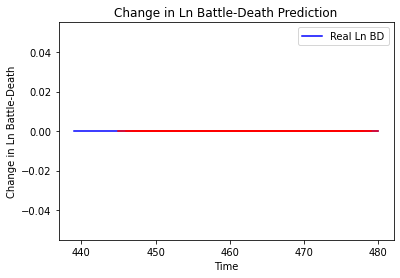

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_717"
_________________________________________________________________
Layer 

Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5647 - val_loss: 0.2853
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5598 - val_loss: 0.2853
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5608 - val_loss: 0.2852
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5574 - val_loss: 0.2852
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5577 - val_loss: 0.2851
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5549 - val_loss: 0.2851
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5574 - val_loss: 0.2850
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5565 - val_loss: 0.2848
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5573 - val_loss: 0.2848
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5584 - val_loss: 0.2847
Epoch 75/1

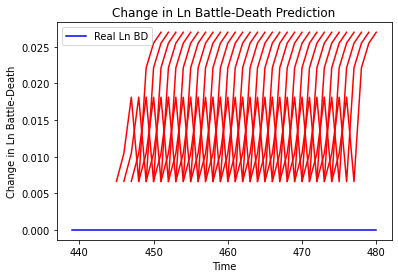

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 4.411838851949793e-05, 'mae': 0.006642167456448078, 'r2': 0.0, 'tadda_score': 0.006642167456448078}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.00029226422901823534, 'mae': 0.017095737159252167, 'r2': 0.0, 'tadda_score': 0.017095737159252167}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0012401225717582204, 'mae': 0.03521537408232689, 'r2': 0.0, 'tadda_score': 0.03521537408232689}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0017482230058397108, 'mae': 0.041811756789684296, 'r2': 0.0, 'tadda_score': 0.041811756789684296}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0028622169572472544, 'mae': 0.05349969118833542, 'r2': 0.0, 'tadda_score': 0.05349969118833542}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.006241622147209525, 'mae'

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9

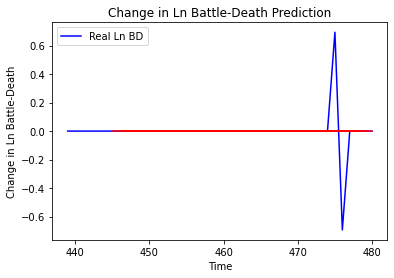

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_719"
_________________________________________________________________
Layer (type)                 Output Shape      

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2239 - val_loss: 3.4476e-04
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2143 - val_loss: 3.6639e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2134 - val_loss: 3.3533e-04
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2170 - val_loss: 3.7443e-04
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2234 - val_loss: 3.6432e-04
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2130 - val_loss: 3.7173e-04
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2234 - val_loss: 3.4514e-04
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2179 - val_loss: 2.9673e-04
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2155 - val_loss: 2.5544e-04
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2206 

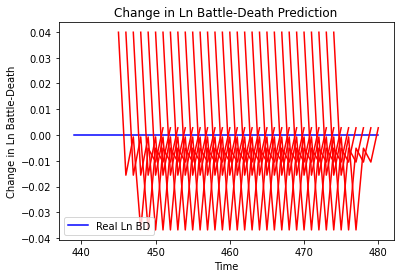

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0015897955445588613, 'mae': 0.03987224027514458, 'r2': 0.0, 'tadda_score': 0.03987224027514458}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.0005909049322701115, 'mae': 0.02430853620171547, 'r2': 0.0, 'tadda_score': 0.02430853620171547}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0005555772657936942, 'mae': 0.02357068657875061, 'r2': 0.0, 'tadda_score': 0.02357068657875061}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00017501130540781284, 'mae': 0.013229183852672577, 'r2': 0.0, 'tadda_score': 0.013229183852672577}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 7.623485235086491e-06, 'mae': 0.00276106595993042, 'r2': 0.0, 'tadda_score': 0.00276106595993042}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0001753648643198014, 'mae': 0.013242539949715137, 'r2': 0.0, 'tad

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==========================

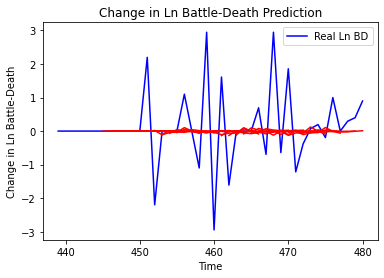

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6742776543631133, 'mae': 0.8335248412330749, 'r2': -0.015278527382594831, 'tadda_score': 0.8465746639916477}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2153790525381603, 'mae': 0.7374995573037526, 'r2': -0.027045985543387108, 'tadda_score': 0.749499747397866}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.079107497536221, 'mae': 0.9197378957385883, 'r2': -0.042883405759973625, 'tadda_score': 0.9401895886028871}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.449831263009633, 'mae': 1.0383192531516663, 'r2': -0.10361105329287468, 'tadda_score': 1.069929188651394}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.3406549435409576, 'mae': 0.950955364773219, 'r2': -0.12284161414109773, 'tadda_score': 0.968839185729171}
{'country': 'Burkina Faso', 'country_id': 47, 'step

4/4 [==============================] - 0s 9ms/step - loss: 0.2645 - val_loss: 1.7168e-05
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2645 - val_loss: 2.2888e-05
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2625 - val_loss: 2.5965e-05
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2642 - val_loss: 2.2698e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2633 - val_loss: 2.1495e-05
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2635 - val_loss: 1.8529e-05
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2641 - val_loss: 2.2307e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2640 - val_loss: 2.2723e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2644 - val_loss: 1.7457e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2621 - val_loss: 1.1

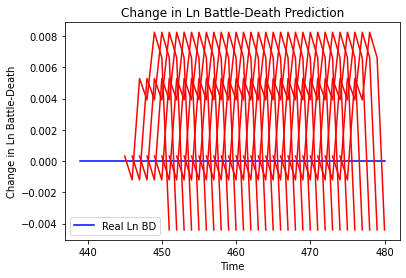

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 1.0265981215205194e-07, 'mae': 0.0003204056993126869, 'r2': 0.0, 'tadda_score': 0.0003204056993126869}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 7.835225483733554e-07, 'mae': 0.0008851680904626846, 'r2': 0.0, 'tadda_score': 0.0008851680904626846}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 1.9374135748425692e-05, 'mae': 0.0044016060419380665, 'r2': 0.0, 'tadda_score': 0.0044016060419380665}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 6.926362908643569e-05, 'mae': 0.008322477340698242, 'r2': 0.0, 'tadda_score': 0.008322477340698242}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0003161247692787944, 'mae': 0.017779897898435593, 'r2': 0.0, 'tadda_score': 0.017779897898435593}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.0005954910578270245, 'mae': 0.024402685463428497, 'r2': 

Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6861 - val_loss: 5.7829e-05
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6827 - val_loss: 6.3167e-05
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6861 - val_loss: 7.3678e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6788 - val_loss: 7.7636e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6817 - val_loss: 6.7561e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6866 - val_loss: 7.7879e-05
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6936 - val_loss: 7.7926e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6855 - val_loss: 8.1165e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6798 - val_loss: 1.0211e-04
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.

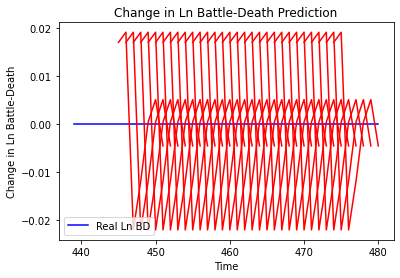

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00028761761275558975, 'mae': 0.01695929281413555, 'r2': 0.0, 'tadda_score': 0.01695929281413555}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.001298098761315425, 'mae': 0.036029137670993805, 'r2': 0.0, 'tadda_score': 0.036029137670993805}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.0001943875051012324, 'mae': 0.013942291960120201, 'r2': 0.0, 'tadda_score': 0.013942291960120201}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 3.991326092304265e-06, 'mae': 0.001997830346226692, 'r2': 0.0, 'tadda_score': 0.001997830346226692}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.00027863049614490487, 'mae': 0.016692228615283966, 'r2': 0.0, 'tadda_score': 0.016692228615283966}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.00013579736927116573, '

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3190 - val_loss: 3.0664
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3160 - val_loss: 3.0652
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3150 - val_loss: 3.0640
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3109 - val_loss: 3.0628
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3148 - val_loss: 3.0616
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3206 - val_loss: 3.0603
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3180 - val_loss: 3.0592
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3093 - val_loss: 3.0578
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3106 - val_loss: 3.0567
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3182 - val_loss: 3.0554
Epoch 71/100
4/

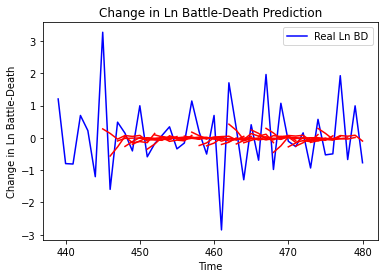

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.9793763499843268, 'mae': 0.70516293164089, 'r2': 0.22420427026111012, 'tadda_score': 0.7425887329230176}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.2550832918946326, 'mae': 0.876083653243627, 'r2': -0.29633399319318876, 'tadda_score': 1.057204332336531}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.242465561233843, 'mae': 0.9222755065691762, 'r2': -0.09441330805072079, 'tadda_score': 1.0888354558380737}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.7862451835849549, 'mae': 1.1112474495843587, 'r2': -0.1944641702022385, 'tadda_score': 1.3202530226658324}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.494578844408465, 'mae': 1.0042742099976818, 'r2': -0.3803149986595358, 'tadda_score': 1.1773006291958226}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.8372201088409323, 'mae': 1.11386314

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6597 - val_loss: 0.4300
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6559 - val_loss: 0.4300
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6687 - val_loss: 0.4301
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6614 - val_loss: 0.4301
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6542 - val_loss: 0.4301
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6518 - val_loss: 0.4301
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6461 - val_loss: 0.4299
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6492 - val_loss: 0.4297
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6485 - val_loss: 0.4295
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6614 - val_loss: 0.4293
Epoch 71/100


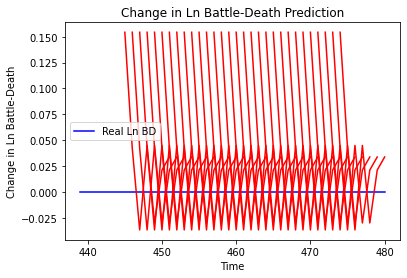

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.023833371084302835, 'mae': 0.15438060462474823, 'r2': 0.0, 'tadda_score': 0.15438060462474823}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.03864952888433493, 'mae': 0.19659483432769775, 'r2': 0.0, 'tadda_score': 0.19659483432769775}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.025553066231873922, 'mae': 0.1598532646894455, 'r2': 0.0, 'tadda_score': 0.1598532646894455}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.0419425434975631, 'mae': 0.20479878783226013, 'r2': 0.0, 'tadda_score': 0.20479878783226013}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.017579826447777558, 'mae': 0.1325889378786087, 'r2': 0.0, 'tadda_score': 0.1325889378786087}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.02364158345923162, 'mae': 0.1537581980228424, 'r2': 0.0, 'tadda_score': 0.153758

4/4 [==============================] - 0s 10ms/step - loss: 2.2175 - val_loss: 3.3414e-04
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1972 - val_loss: 3.4261e-04
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1973 - val_loss: 3.2015e-04
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2081 - val_loss: 3.2488e-04
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1976 - val_loss: 3.2655e-04
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1898 - val_loss: 3.1515e-04
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2029 - val_loss: 3.1807e-04
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 2.1898 - val_loss: 3.0815e-04
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1922 - val_loss: 2.8811e-04
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1974 - val_lo

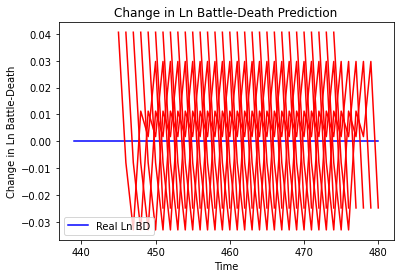

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.0016474025915452217, 'mae': 0.04058820754289627, 'r2': 0.0, 'tadda_score': 0.04058820754289627}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.001065838203745395, 'mae': 0.03264717757701874, 'r2': 0.0, 'tadda_score': 0.03264717757701874}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 1.0322576161903019e-07, 'mae': 0.0003212876617908478, 'r2': 0.0, 'tadda_score': 0.0003212876617908478}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.00011913336200250826, 'mae': 0.010914823040366173, 'r2': 0.0, 'tadda_score': 0.010914823040366173}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0004248023130544766, 'mae': 0.020610732957720757, 'r2': 0.0, 'tadda_score': 0.020610732957720757}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.002532840978177797, 'mae': 0.

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms

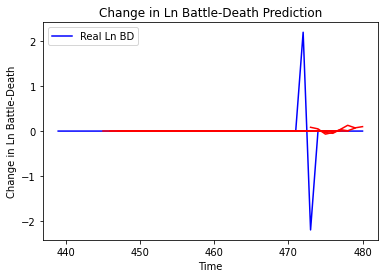

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6436 - val_loss: 8.6873e-05
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6406 - val_loss: 8.5169e-05
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6409 - val_loss: 7.5348e-05
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6418 - val_loss: 7.7334e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6394 - val_loss: 7.9378e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6407 - val_loss: 6.6428e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6421 - val_loss: 4.6268e-05
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6397 - val_loss: 3.3841e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6406 - val_loss: 2.8098e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6

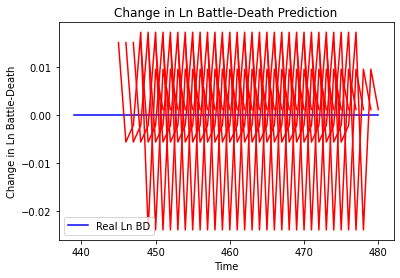

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.0002269329672758497, 'mae': 0.015064294449985027, 'r2': 0.0, 'tadda_score': 0.015064294449985027}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 8.89818996930615e-05, 'mae': 0.009433021768927574, 'r2': 0.0, 'tadda_score': 0.009433021768927574}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 5.2766458980079735e-05, 'mae': 0.007264052517712116, 'r2': 0.0, 'tadda_score': 0.007264052517712116}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.0005989788003008117, 'mae': 0.024474043399095535, 'r2': 0.0, 'tadda_score': 0.024474043399095535}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 3.8412158284831244e-05, 'mae': 0.006197754293680191, 'r2': 0.0, 'tadda_score': 0.006197754293680191}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.00024698046363286555, 'mae': 0.01571561209857464, '

4/4 [==============================] - 0s 11ms/step - loss: 1.9920 - val_loss: 0.0292
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0050 - val_loss: 0.0292
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9829 - val_loss: 0.0292
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9949 - val_loss: 0.0292
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9845 - val_loss: 0.0293
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0018 - val_loss: 0.0293
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9973 - val_loss: 0.0293
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9928 - val_loss: 0.0294
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9777 - val_loss: 0.0294
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9952 - val_loss: 0.0294
Epoch 71/100
4/4 [=====

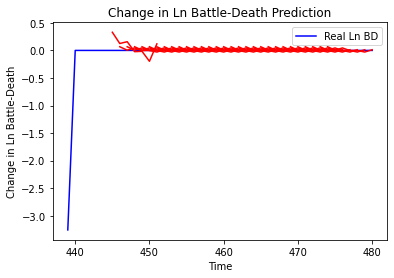

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.007924010723637437, 'mae': 0.07543829406301181, 'r2': 0.0, 'tadda_score': 0.07543829406301181}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.01181342922691054, 'mae': 0.08401716301838556, 'r2': 0.0, 'tadda_score': 0.08401716301838556}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.025588447304839407, 'mae': 0.1327424831688404, 'r2': 0.0, 'tadda_score': 0.1327424831688404}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.024072246026696907, 'mae': 0.12937070777018864, 'r2': 0.0, 'tadda_score': 0.12937070777018864}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.018045750062127407, 'mae': 0.11961563850442568, 'r2': 0.0, 'tadda_score': 0.11961563850442568}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.00810797023024618, 'mae': 0.08454216346144676, 'r2': 0.0, 'tadda_score': 0.0

4/4 [==============================] - 0s 11ms/step - loss: 4.7428 - val_loss: 2.6921
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7364 - val_loss: 2.6905
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7332 - val_loss: 2.6889
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7193 - val_loss: 2.6873
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7240 - val_loss: 2.6856
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7457 - val_loss: 2.6841
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 4.7321 - val_loss: 2.6827
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 4.6949 - val_loss: 2.6811
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 4.6943 - val_loss: 2.6797
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7234 - val_loss: 2.6782
Epoch 71/100
4/4 [=====

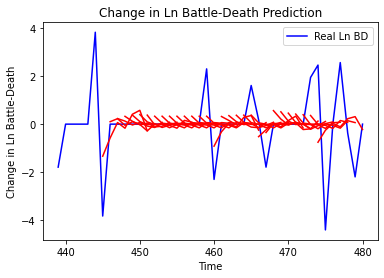

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0657922843534786, 'mae': 0.7306465045726304, 'r2': 0.21876545381750434, 'tadda_score': 0.7731606221314276}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.848686135319684, 'mae': 1.1566705970646647, 'r2': -0.42774428146173826, 'tadda_score': 1.2679620513003773}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.90190927990522, 'mae': 1.164419778057109, 'r2': -0.454419399994894, 'tadda_score': 1.2922010390641}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 3.018896784817525, 'mae': 1.184926005073558, 'r2': -0.5130528307088313, 'tadda_score': 1.3176109620612568}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.4263112246416454, 'mae': 0.9514205971044011, 'r2': -0.2160525278927523, 'tadda_score': 1.0169893099548128}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 1.980987044524119,

4/4 [==============================] - 0s 9ms/step - loss: 0.9337 - val_loss: 1.0081
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9314 - val_loss: 1.0077
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9368 - val_loss: 1.0073
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9353 - val_loss: 1.0070
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9381 - val_loss: 1.0066
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9325 - val_loss: 1.0064
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9326 - val_loss: 1.0060
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9305 - val_loss: 1.0057
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9379 - val_loss: 1.0053
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9316 - val_loss: 1.0050
Epoch 70/100
4/4 [==============

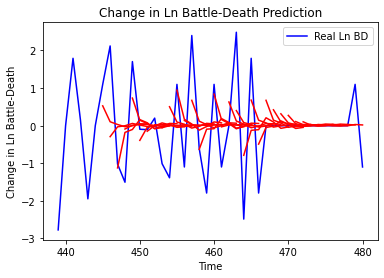

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.1323381212557526, 'mae': 0.7940800189824995, 'r2': 0.29001199300084823, 'tadda_score': 0.8252157300563748}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.472165684385016, 'mae': 1.169892788330354, 'r2': -0.46785739981838126, 'tadda_score': 1.4331206698215384}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.612119446419551, 'mae': 1.2607011128486207, 'r2': -0.4561386996857877, 'tadda_score': 1.5367409025277705}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.71181199644871, 'mae': 1.254925917505724, 'r2': -0.32835020593419206, 'tadda_score': 1.4776335894261827}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.8169045544646216, 'mae': 0.979238892621779, 'r2': -0.3500849692708068, 'tadda_score': 1.139496152471238}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.037939883172763, 'm

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1940 - val_loss: 1.4690
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1939 - val_loss: 1.4687
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1945 - val_loss: 1.4684
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1944 - val_loss: 1.4681
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1941 - val_loss: 1.4677
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1932 - val_loss: 1.4674
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1922 - val_loss: 1.4671
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1945 - val_loss: 1.4670
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1921 - val_loss: 1.4668
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1900 - val_loss: 1.4666
Epoch 71/100
4/4 [==

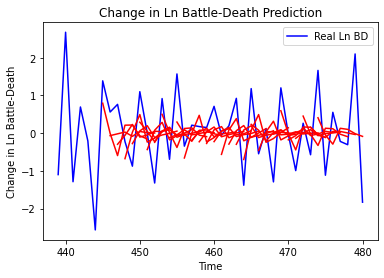

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5420527082624934, 'mae': 0.6484595705335511, 'r2': 0.26397288024661425, 'tadda_score': 0.7156344077751212}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.151099316687391, 'mae': 0.9310078599634628, 'r2': -0.5594896767712227, 'tadda_score': 1.1717474004708588}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.075569674125191, 'mae': 0.8261960306372299, 'r2': -0.09751671439783616, 'tadda_score': 0.8674298154978508}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.1291029852497882, 'mae': 0.8559000128333349, 'r2': -0.2820669171635928, 'tadda_score': 0.9660006715679744}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.4320269943158057, 'mae': 0.9690818423813191, 'r2': -0.43967864027129133, 'tadda_score': 1.1539318705385535}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.7881394

4/4 [==============================] - 0s 9ms/step - loss: 0.7638 - val_loss: 2.4336
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7552 - val_loss: 2.4331
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7530 - val_loss: 2.4326
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7560 - val_loss: 2.4321
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7550 - val_loss: 2.4315
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7567 - val_loss: 2.4307
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7548 - val_loss: 2.4302
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7540 - val_loss: 2.4298
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7530 - val_loss: 2.4294
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7507 - val_loss: 2.4290
Epoch 70/100
4/4 [=============

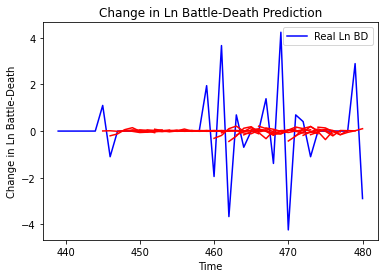

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.395360307137314, 'mae': 0.923921660679472, 'r2': 0.09429097446143042, 'tadda_score': 0.9454026168563888}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.4370092267407588, 'mae': 0.7766434441578163, 'r2': 0.018418350271974138, 'tadda_score': 0.800709114901401}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.223449669196057, 'mae': 0.8965150902026771, 'r2': 0.05135626907409818, 'tadda_score': 0.9205381743588923}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.457685963654524, 'mae': 0.8464943310449143, 'r2': -0.01656120561122254, 'tadda_score': 0.8591349703152598}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.684585958054161, 'mae': 0.9242582243732044, 'r2': -0.05936162670734957, 'tadda_score': 0.97897421949122

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.3727
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss:

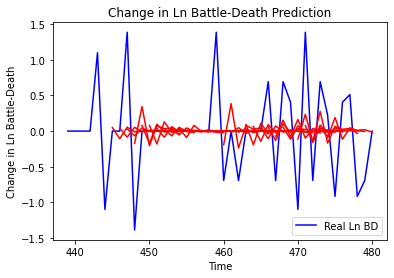

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3649384011527977, 'mae': 0.39834876279585935, 'r2': 0.11603089817663537, 'tadda_score': 0.4041252351855574}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.3930873097815621, 'mae': 0.426775848610437, 'r2': 0.044736481344820445, 'tadda_score': 0.4388514028794925}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.48776451344712574, 'mae': 0.47029963307192185, 'r2': -0.02084588504496665, 'tadda_score': 0.47488972337405144}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.49442527304955186, 'mae': 0.4590380735742362, 'r2': -0.023931869145592533, 'tadda_score': 0.4608115183546952}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.5035340868003977, 'mae': 0.5061849248203899, 'r2': -0.1445553108840325, 'tadda_score': 0.5466983739826347}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.59789

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

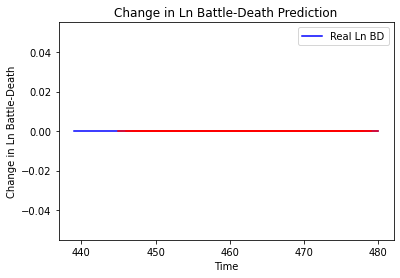

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_735"
_________________________________________________________________
Layer (type)                 Output S

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

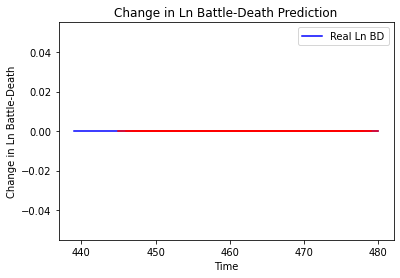

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_736"
_______________________________

4/4 [==============================] - 0s 9ms/step - loss: 0.8619 - val_loss: 1.6626
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8682 - val_loss: 1.6618
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8630 - val_loss: 1.6610
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8670 - val_loss: 1.6603
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8636 - val_loss: 1.6596
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8641 - val_loss: 1.6588
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8609 - val_loss: 1.6581
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8692 - val_loss: 1.6574
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8643 - val_loss: 1.6566
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.8591 - val_loss: 1.6559
Epoch 74/100
4/4 [==============

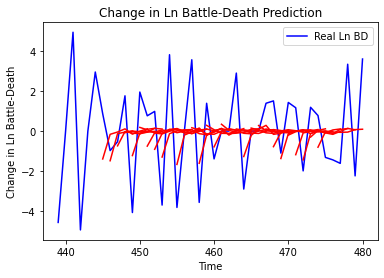

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.2508400047574146, 'mae': 1.4958671193223714, 'r2': 0.24955234570856044, 'tadda_score': 1.7088244583111523}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 5.587752135459323, 'mae': 1.9697923804619804, 'r2': -0.42297594876268296, 'tadda_score': 2.287153734793156}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.2365366790870755, 'mae': 1.7721953879491552, 'r2': -0.3520500644473714, 'tadda_score': 2.1288978577351636}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 5.5125964017523, 'mae': 1.9519500800132434, 'r2': -0.2149701694634627, 'tadda_score': 2.259407560592858}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 6.8570673447333945, 'mae': 2.10813212728116, 'r2': -0.24655181840022244, 'tadda_score': 2.436293609545759}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 6.183885564739169, 'mae': 1.957069

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5395 - val_loss: 1.1677
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5424 - val_loss: 1.1673
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5380 - val_loss: 1.1669
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5386 - val_loss: 1.1665
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5411 - val_loss: 1.1661
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5462 - val_loss: 1.1660
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5391 - val_loss: 1.1659
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5412 - val_loss: 1.1660
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5387 - val_loss: 1.1660
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5422 - val_loss: 1.1661
Epoch 71/100
4/4 

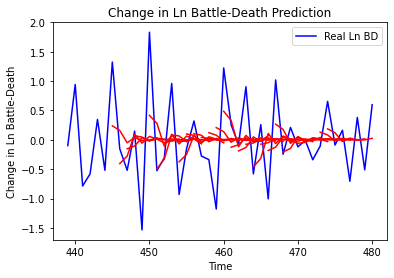

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.4237442433102276, 'mae': 0.490996188219068, 'r2': 0.25854838850707307, 'tadda_score': 0.5221609084389384}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.858769897355068, 'mae': 0.7259646532598386, 'r2': -0.587169081367624, 'tadda_score': 0.8964906312687446}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.7852924719396508, 'mae': 0.6970700870662654, 'r2': -0.28171283255641, 'tadda_score': 0.8343427027970278}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.988896476972864, 'mae': 0.7647039551032555, 'r2': -0.3293837303968241, 'tadda_score': 0.9477394851290158}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6414337020640168, 'mae': 0.6196654722340379, 'r2': -0.25289052953471813, 'tadda_score': 0.7158845038088634}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.6874337307299605, 

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [=======================

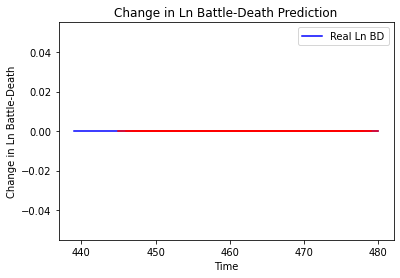

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_739"
____

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] -

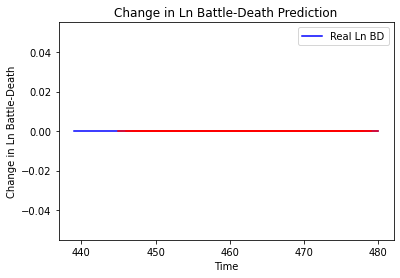

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_740"
_________________________________________________________________
Layer (type)                 Output Shape             

4/4 [==============================] - 0s 9ms/step - loss: 2.6196 - val_loss: 0.3658
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6183 - val_loss: 0.3657
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6159 - val_loss: 0.3657
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6117 - val_loss: 0.3657
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6205 - val_loss: 0.3657
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6166 - val_loss: 0.3657
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6081 - val_loss: 0.3657
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6116 - val_loss: 0.3657
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6215 - val_loss: 0.3657
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6099 - val_loss: 0.3656
Epoch 75/100
4/4 [===============

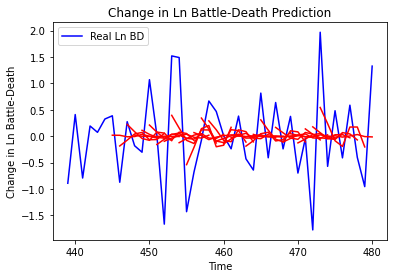

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.598200086449071, 'mae': 0.6088118599881152, 'r2': 0.2147396250347361, 'tadda_score': 0.6557161281659621}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.1640679565507215, 'mae': 0.8039092981830405, 'r2': -0.18705910314553154, 'tadda_score': 0.9250995836484102}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.0378585752175222, 'mae': 0.7627527140291901, 'r2': -0.3004222617761674, 'tadda_score': 0.8832205175322663}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.7915534401086064, 'mae': 0.7355572035893599, 'r2': -0.14191841959234797, 'tadda_score': 0.8026287891328135}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8153166383656761, 'mae': 0.6607992797881539, 'r2': -0.05762291265526498, 'tadda_score': 0.7334083124942008}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.767641

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/

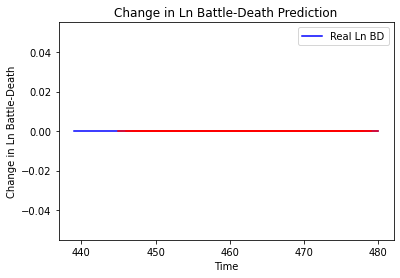

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_742"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 10ms/step - loss: 1.9412 - val_loss: 1.6179
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9448 - val_loss: 1.6173
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9364 - val_loss: 1.6167
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9581 - val_loss: 1.6164
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9463 - val_loss: 1.6159
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9230 - val_loss: 1.6154
Epoch 70/100
4/4 [==============================] - ETA: 0s - loss: 1.986 - 0s 11ms/step - loss: 1.9435 - val_loss: 1.6152
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9351 - val_loss: 1.6148
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9447 - val_loss: 1.6145
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9364 - val_loss: 1.6142

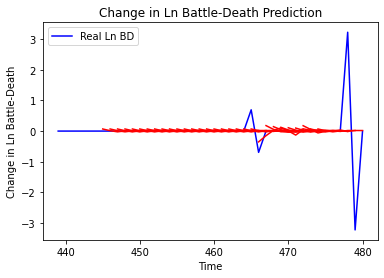

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.024315670965917684, 'mae': 0.10999964189746064, 'r2': 0.240851750488004, 'tadda_score': 0.10999964189746064}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.059426379548180676, 'mae': 0.15584241710323177, 'r2': -0.8553233456757399, 'tadda_score': 0.16369572492657186}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.05165535282673865, 'mae': 0.13094748916445256, 'r2': -0.6127077361471127, 'tadda_score': 0.13638410033998968}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.04622974411800104, 'mae': 0.12905227429884752, 'r2': -0.4433173311055074, 'tadda_score': 0.13307225294131123}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03729752982222927, 'mae': 0.0962226410678832, 'r2': -0.1644488246017941, 'tadda_score': 0.09832947055218698}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 'm

4/4 [==============================] - 0s 9ms/step - loss: 2.4601 - val_loss: 0.1852
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4850 - val_loss: 0.1850
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4858 - val_loss: 0.1847
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4765 - val_loss: 0.1846
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4742 - val_loss: 0.1843
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4591 - val_loss: 0.1842
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4781 - val_loss: 0.1841
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4767 - val_loss: 0.1839
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4759 - val_loss: 0.1837
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4695 - val_loss: 0.1834
Epoch 70/100
4/4 [=========

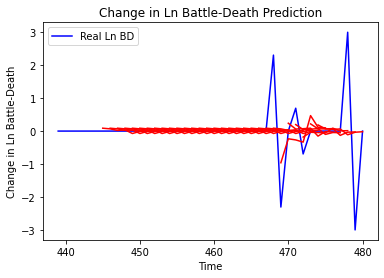

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.2510697006781312, 'mae': 0.2404857568207836, 'r2': 0.34869996145988746, 'tadda_score': 0.2404857568207836}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.48804438314563847, 'mae': 0.38017838421100936, 'r2': -0.2660361831535272, 'tadda_score': 0.39978335124884606}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.41151439034513204, 'mae': 0.38325745548224927, 'r2': -0.4744966308729901, 'tadda_score': 0.40349502548989136}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.44002171410723867, 'mae': 0.41042897481745005, 'r2': -0.1926610209822388, 'tadda_score': 0.41042897481745005}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.43502532669248234, 'mae': 0.28594165324196735, 'r2': -0.1791185154097663, 'tadda_score': 0.29356962769255557}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.4

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

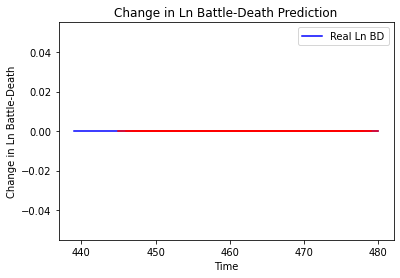

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_745"
_________________________________________________________________
Layer (type)                 Out

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 

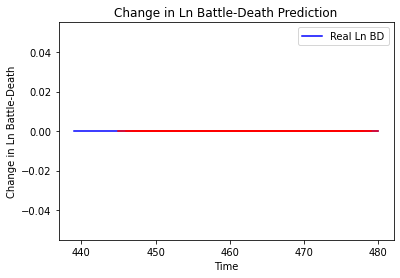

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_746"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 9ms/step - loss: 0.1291 - val_loss: 4.8325e-06
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1296 - val_loss: 4.9658e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1300 - val_loss: 6.3741e-06
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1321 - val_loss: 7.0641e-06
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1301 - val_loss: 5.3588e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1321 - val_loss: 5.8624e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1299 - val_loss: 9.0112e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1300 - val_loss: 1.1746e-05
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1302 - val_loss: 1.3844e-05
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1285 - val_loss: 

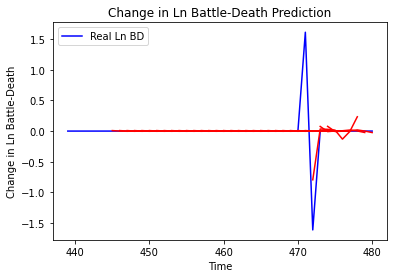

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.10811645294426754, 'mae': 0.09271015259199733, 'r2': 0.37391313424436534, 'tadda_score': 0.09271015259199733}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.1985801843738768, 'mae': 0.14428695357788002, 'r2': -0.14994935414599753, 'tadda_score': 0.1465185152187784}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.19761323633189593, 'mae': 0.14040854745306966, 'r2': -0.1443498967788155, 'tadda_score': 0.1426791230658531}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.10320852666541673, 'mae': 0.08687845273600715, 'r2': -0.23654986668068534, 'tadda_score': 0.08687845273600715}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.11195248931548436, 'mae': 0.09673665102918146, 'r2': -0.3413120040596411, 'tadda_score': 0.09673665102918146}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'm

4/4 [==============================] - 0s 9ms/step - loss: 0.1455 - val_loss: 5.5691e-06
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1442 - val_loss: 3.3184e-06
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1454 - val_loss: 3.3376e-06
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1455 - val_loss: 6.5713e-06
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1471 - val_loss: 7.1205e-06
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1463 - val_loss: 8.7566e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1450 - val_loss: 6.3842e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1449 - val_loss: 2.2755e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1446 - val_loss: 2.6663e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1443 - val_loss: 5.46

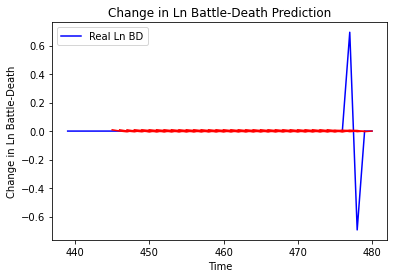

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 7.658758555163792e-05, 'mae': 0.008751433342695236, 'r2': 0.0, 'tadda_score': 0.008751433342695236}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 8.637780392201089e-05, 'mae': 0.009293965995311737, 'r2': 0.0, 'tadda_score': 0.009293965995311737}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 1.8662221528813758e-05, 'mae': 0.004319979343563318, 'r2': 0.0, 'tadda_score': 0.004319979343563318}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 9.447915082518021e-05, 'mae': 0.009720038622617722, 'r2': 0.0, 'tadda_score': 0.009720038622617722}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.000179008609519693, 'mae': 0.013379409909248352, 'r2': 0.0, 'tadda_score': 0.013379409909248352}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 8.845269616853182e-05, 'mae': 0.009404929354786873, 'r

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9

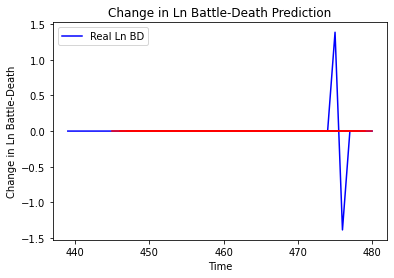

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_749"
_________________________________________________________________
Layer (type)                 O

4/4 [==============================] - 0s 9ms/step - loss: 1.0832 - val_loss: 0.6912
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0928 - val_loss: 0.6912
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1162 - val_loss: 0.6912
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0834 - val_loss: 0.6912
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0735 - val_loss: 0.6911
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1153 - val_loss: 0.6912
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.0807 - val_loss: 0.6912
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.0900 - val_loss: 0.6912
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 1.1242 - val_loss: 0.6911
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.0860 - val_loss: 0.6911
Epoch 75/100
4/4 [===============

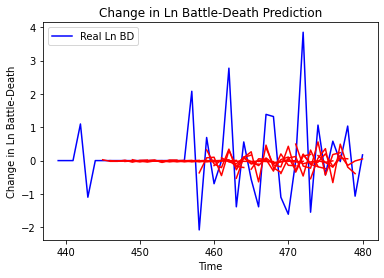

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.3516328567999905, 'mae': 0.7259153873357026, 'r2': 0.14103145477433376, 'tadda_score': 0.7353587192180603}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.1803806166938586, 'mae': 0.9392306624573418, 'r2': -0.139579355172065, 'tadda_score': 1.0136426504052627}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.0750391948436335, 'mae': 1.0210310243414322, 'r2': -0.0842350698888068, 'tadda_score': 1.0557331860409658}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.870121362502717, 'mae': 0.9485261391390325, 'r2': -0.2409328691254291, 'tadda_score': 1.0818051851827863}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.0100684563539446, 'mae': 0.6628304294146777, 'r2': -0.23330092823337312, 'tadda_score': 0.7148628695704224}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6',

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/

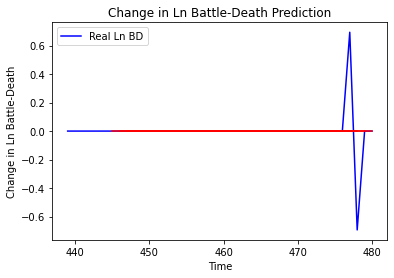

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_751"
_______________________________________________________

Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [========================

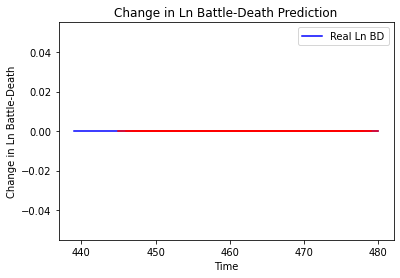

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_752"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 11ms/step - loss: 3.3727 - val_loss: 0.0877
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3717 - val_loss: 0.0877
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3573 - val_loss: 0.0876
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3798 - val_loss: 0.0875
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3764 - val_loss: 0.0874
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3715 - val_loss: 0.0874
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3689 - val_loss: 0.0872
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3809 - val_loss: 0.0871
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3713 - val_loss: 0.0870
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3712 - val_loss: 0.0869
Epoch 74/100
4/4 [==============

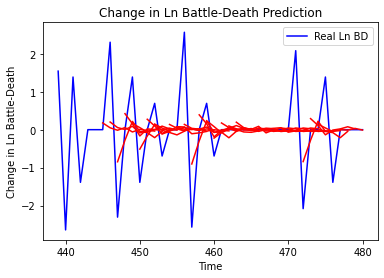

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.8389842669786505, 'mae': 0.5909606330034177, 'r2': 0.34068581603105375, 'tadda_score': 0.5921529725131432}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.6596771723302988, 'mae': 0.8806334506036878, 'r2': -0.30425413633493603, 'tadda_score': 0.9595331953775923}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.0080978523559811, 'mae': 0.675113048347315, 'r2': -0.14932679553853068, 'tadda_score': 0.7053099187140472}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.012162239220161, 'mae': 0.7073500810170501, 'r2': 0.05702866151179853, 'tadda_score': 0.7277280020817448}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.0264905741749828, 'mae': 0.6250567910607371, 'r2': -0.04840519861937187, 'tadda_score': 0.6394881715412649}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.369857455838

4/4 [==============================] - 0s 10ms/step - loss: 1.9438 - val_loss: 0.2232
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9353 - val_loss: 0.2231
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9400 - val_loss: 0.2231
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9388 - val_loss: 0.2231
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9425 - val_loss: 0.2230
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9460 - val_loss: 0.2230
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9425 - val_loss: 0.2230
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9277 - val_loss: 0.2230
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9396 - val_loss: 0.2230
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9316 - val_loss: 0.2230
Epoch 70/100
4/4 [=========

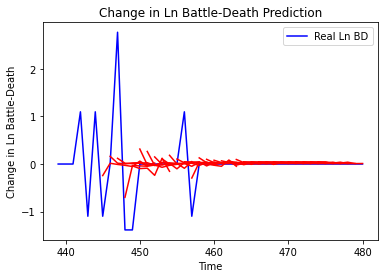

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.40587328179288396, 'mae': 0.3248014102922466, 'r2': 0.1942422355349006, 'tadda_score': 0.3248014102922466}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8750707286119748, 'mae': 0.5181108655894997, 'r2': -0.15147269920726059, 'tadda_score': 0.563979937371135}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.7594684055759672, 'mae': 0.48536108796998045, 'r2': -0.28050723560690205, 'tadda_score': 0.5340864053885557}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.818530428856743, 'mae': 0.5220441953858155, 'r2': -0.17836387779804141, 'tadda_score': 0.5773261568467238}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.7922669951079446, 'mae': 0.5283219545106508, 'r2': -0.3358075363238844, 'tadda_score': 0.5804386848231572}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8109309634829757,

4/4 [==============================] - 0s 9ms/step - loss: 3.0092 - val_loss: 3.3031
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0015 - val_loss: 3.3019
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0023 - val_loss: 3.3006
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0071 - val_loss: 3.2994
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0115 - val_loss: 3.2983
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0218 - val_loss: 3.2974
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0009 - val_loss: 3.2964
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0005 - val_loss: 3.2953
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9919 - val_loss: 3.2943
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0079 - val_loss: 3.2932
Epoch 70/100
4/4 [============

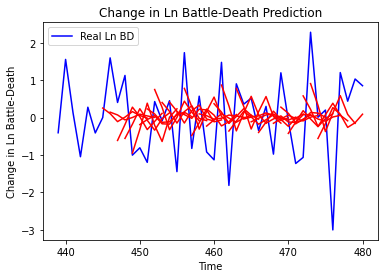

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8767178459331478, 'mae': 0.7794760361693603, 'r2': 0.19896456221416225, 'tadda_score': 0.9049628869078857}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.3512753706284446, 'mae': 1.2311308526196494, 'r2': -0.6629430649389585, 'tadda_score': 1.55909245964869}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.3211940840386966, 'mae': 1.2040621026226848, 'r2': -0.3456697655053784, 'tadda_score': 1.4601432707278896}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.699508789545381, 'mae': 1.3044695295471367, 'r2': -0.549501786778769, 'tadda_score': 1.607148838051003}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.2086945436306293, 'mae': 1.409926697583192, 'r2': -0.7479139190440693, 'tadda_score': 1.78781820706645}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse':

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [====================

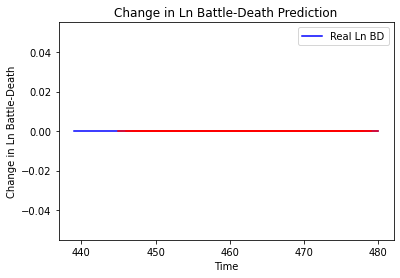

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_756"
_________________________________________________________________
Layer (type)                 Output Shap

4/4 [==============================] - 0s 9ms/step - loss: 0.1425 - val_loss: 3.7230e-06
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1428 - val_loss: 4.0557e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1426 - val_loss: 4.5653e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1419 - val_loss: 5.2968e-06
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1427 - val_loss: 6.7534e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1427 - val_loss: 3.9658e-06
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1420 - val_loss: 5.3356e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1427 - val_loss: 4.5859e-06
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1426 - val_loss: 4.1980e-06
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1423 - val_loss: 2

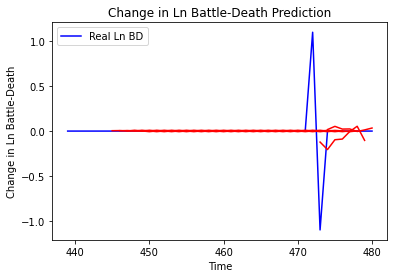

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07172903399614507, 'mae': 0.07346774936984671, 'r2': 0.10854928843237988, 'tadda_score': 0.07346774936984671}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.08864921086529334, 'mae': 0.09500769784694604, 'r2': -0.10173520683438819, 'tadda_score': 0.0973179107968578}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.04583789791081159, 'mae': 0.06285499013660198, 'r2': -0.17863762146723872, 'tadda_score': 0.06285499013660198}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04842234207036907, 'mae': 0.07310985484170761, 'r2': -0.24509187124463216, 'tadda_score': 0.07310985484170761}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04273595737989336, 'mae': 0.06132910992650038, 'r2': -0.09887689996975624, 'tadda_score': 0.06132910992650038}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6'

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

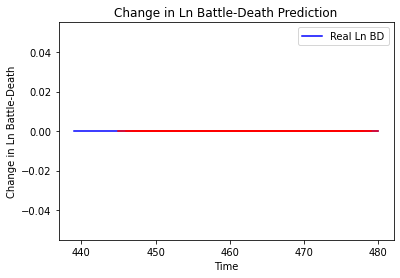

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_758"
_________________________________________________________________
Lay

Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

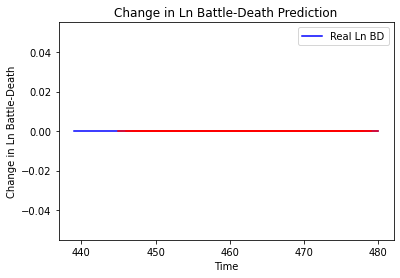

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_759"
_________________________________________________________________
Layer (ty

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

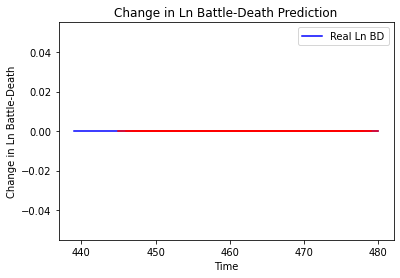

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_760"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2945
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2945
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2946
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2948
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0314 - val_loss: 2.2947
Epoch 74/100
4/4 [=====

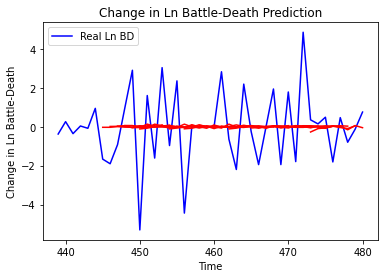

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.700516484658435, 'mae': 1.676618455730681, 'r2': 0.029948454805167612, 'tadda_score': 1.6909786357932333}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.57866564362524, 'mae': 1.8141057794559967, 'r2': -0.02980059847266614, 'tadda_score': 1.8589218424279463}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.569751307287333, 'mae': 2.1362493683105392, 'r2': -0.019832966830166665, 'tadda_score': 2.1827786224415586}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.023868835307147, 'mae': 2.002685297774272, 'r2': -0.04096068654104146, 'tadda_score': 2.0407051791096693}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.473208385416766, 'mae': 2.293372119554401, 'r2': -0.027078597773178004, 'tadda_score': 2.3360220922415653}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.497648025748522, 'mae

Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 5.2068 - val_loss: 0.8418
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 5.1593 - val_loss: 0.8415
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1694 - val_loss: 0.8412
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1974 - val_loss: 0.8408
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1654 - val_loss: 0.8403
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 5.1601 - val_loss: 0.8401
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1674 - val_loss: 0.8398
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1372 - val_loss: 0.8396
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 5.1371 - val_loss: 0.8395
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1674 - val_loss: 0.8394
Epoch 71/1

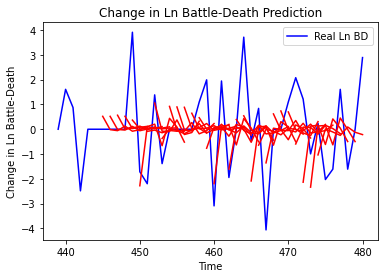

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.6544870595234547, 'mae': 1.3056856775952261, 'r2': 0.0957092348388463, 'tadda_score': 1.4781619911067567}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.490174766073367, 'mae': 2.000305858985018, 'r2': -0.5289883972878824, 'tadda_score': 2.43964435729924}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 7.980678267402877, 'mae': 2.236582463832699, 'r2': -0.5280802608849642, 'tadda_score': 2.685263162704312}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.103013654235497, 'mae': 2.8326335562038594, 'r2': -0.8207834682877764, 'tadda_score': 3.4938028358189444}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 9.576114651092382, 'mae': 2.4963765083403344, 'r2': -1.0156590197441164, 'tadda_score': 3.0777181176991215}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.450856413197759, 'mae': 2.15755303

4/4 [==============================] - 0s 9ms/step - loss: 0.5972 - val_loss: 2.2396
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5919 - val_loss: 2.2380
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5902 - val_loss: 2.2366
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5893 - val_loss: 2.2351
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5893 - val_loss: 2.2337
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5885 - val_loss: 2.2322
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5839 - val_loss: 2.2308
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5934 - val_loss: 2.2293
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5895 - val_loss: 2.2281
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5904 - val_loss: 2.2268
Epoch 71/100
4/4 [==============

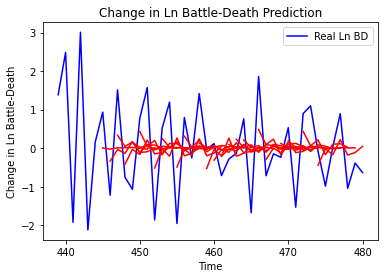

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8112182084205621, 'mae': 0.7681779850517331, 'r2': 0.28022536559557576, 'tadda_score': 0.8017418631905932}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.339271770024842, 'mae': 0.9721119534686345, 'r2': -0.23839743845179528, 'tadda_score': 1.1241976454695206}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.1993263393440032, 'mae': 0.8827488155148906, 'r2': -0.29318029763590747, 'tadda_score': 1.0474287890873832}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2414843193203629, 'mae': 0.933109767785053, 'r2': -0.007881278461058017, 'tadda_score': 1.0550244037562415}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.4595448811238856, 'mae': 1.0133472035965823, 'r2': -0.2302732532329279, 'tadda_score': 1.216988005304486}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.2910999802890646, 

4/4 [==============================] - 0s 8ms/step - loss: 2.7071 - val_loss: 7.8353e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7182 - val_loss: 7.8777e-04
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7158 - val_loss: 8.0013e-04
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7241 - val_loss: 8.4514e-04
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7018 - val_loss: 9.3275e-04
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6996 - val_loss: 9.8346e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6949 - val_loss: 0.0010
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7179 - val_loss: 0.0010
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7144 - val_loss: 9.0532e-04
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7191 - val_loss: 8.3877e-04
E

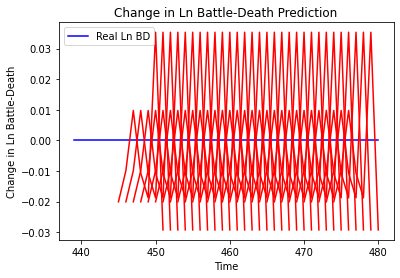

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.0004028168475003792, 'mae': 0.02007029764354229, 'r2': 0.0, 'tadda_score': 0.02007029764354229}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.0008989601220102394, 'mae': 0.029982663691043854, 'r2': 0.0, 'tadda_score': 0.029982663691043854}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.0004085338384620142, 'mae': 0.020212220028042793, 'r2': 0.0, 'tadda_score': 0.020212220028042793}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0009550489655499629, 'mae': 0.03090386651456356, 'r2': 0.0, 'tadda_score': 0.03090386651456356}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.001580835758496768, 'mae': 0.03975972533226013, 'r2': 0.0, 'tadda_score': 0.03975972533226013}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 1.966819249688001e-05, 'mae': 0.0044348835945129395, 'r2': 0.0, 'ta

4/4 [==============================] - 0s 10ms/step - loss: 0.1200 - val_loss: 1.6902
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1196 - val_loss: 1.6895
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1195 - val_loss: 1.6886
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1184 - val_loss: 1.6877
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1184 - val_loss: 1.6866
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1185 - val_loss: 1.6858
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1189 - val_loss: 1.6847
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1193 - val_loss: 1.6837
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1183 - val_loss: 1.6828
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1181 - val_loss: 1.6816
Epoch 71/100
4/4 [========

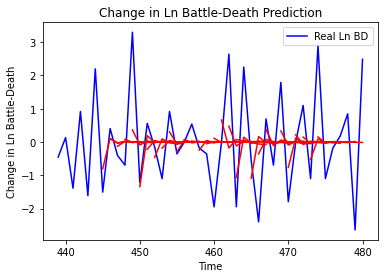

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4670166593731817, 'mae': 0.9068331695137531, 'r2': 0.29202423544056777, 'tadda_score': 0.9207210187155118}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.3566092890085586, 'mae': 1.2604885057556108, 'r2': -0.23453749190013107, 'tadda_score': 1.4573762378044401}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.43489033218754, 'mae': 1.1961497230021698, 'r2': -0.11509004303295645, 'tadda_score': 1.3283493672995315}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.115216349723338, 'mae': 1.4249615608444985, 'r2': -0.10928530519530222, 'tadda_score': 1.5606862571131366}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.0354865334014023, 'mae': 1.1047597899952701, 'r2': -0.3438858438783532, 'tadda_score': 1.2941378479122294}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.4113183629873225, '

3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] 

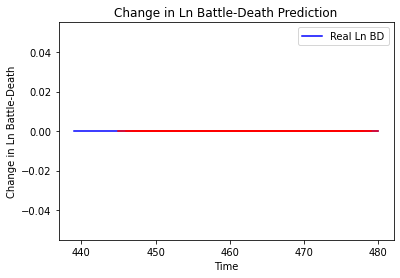

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_766"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 10ms/step - loss: 0.0734 - val_loss: 1.5840e-06
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0711 - val_loss: 2.8124e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0714 - val_loss: 4.9149e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0719 - val_loss: 4.1682e-06
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0719 - val_loss: 6.5594e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0710 - val_loss: 5.0384e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0715 - val_loss: 9.9160e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0717 - val_loss: 1.6108e-05
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0717 - val_loss: 1.4802e-05
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0721 - val_loss: 1.5

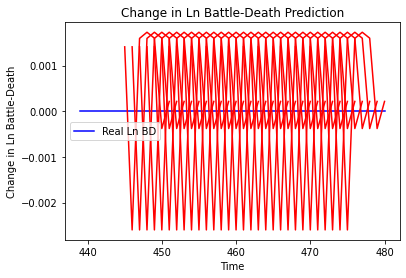

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 1.994191909078047e-06, 'mae': 0.0014121585991233587, 'r2': 0.0, 'tadda_score': 0.0014121585991233587}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 1.4091872410421286e-06, 'mae': 0.001187091926112771, 'r2': 0.0, 'tadda_score': 0.001187091926112771}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 1.6798249114635547e-07, 'mae': 0.00040985667146742344, 'r2': 0.0, 'tadda_score': 0.00040985667146742344}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 4.585620915804759e-06, 'mae': 0.0021414062939584255, 'r2': 0.0, 'tadda_score': 0.0021414062939584255}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 4.0226945707933816e-05, 'mae': 0.006342471577227116, 'r2': 0.0, 'tadda_score': 0.006342471577227116}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 3.557257608301592e-05, 'mae': 0.00596427498

4/4 [==============================] - 0s 10ms/step - loss: 0.0656 - val_loss: 0.1176
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0657 - val_loss: 0.1175
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0659 - val_loss: 0.1174
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0666 - val_loss: 0.1173
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0659 - val_loss: 0.1173
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0671 - val_loss: 0.1172
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0654 - val_loss: 0.1172
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0655 - val_loss: 0.1171
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0662 - val_loss: 0.1171
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0664 - val_loss: 0.1170
Epoch 71/100
4/4 [=======

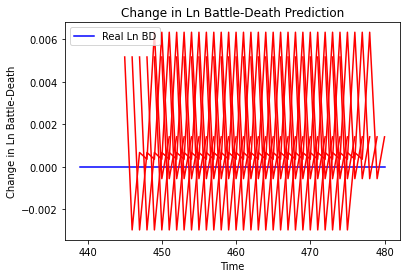

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 2.6644308584209547e-05, 'mae': 0.005161812528967857, 'r2': 0.0, 'tadda_score': 0.005161812528967857}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 4.832902055331714e-06, 'mae': 0.002198386238887906, 'r2': 0.0, 'tadda_score': 0.002198386238887906}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 8.249499312850718e-06, 'mae': 0.0028721941635012627, 'r2': 0.0, 'tadda_score': 0.0028721941635012627}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 1.0431038978053894e-05, 'mae': 0.003229711903259158, 'r2': 0.0, 'tadda_score': 0.003229711903259158}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.00015668451218600957, 'mae': 0.012517368420958519, 'r2': 0.0, 'tadda_score': 0.012517368420958519}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.0001431167684763958, 'mae': 0

Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 3.2066 - val_loss: 0.9278
Epoch 62/100
1/1 [==============================] - 0s 20ms/step - loss: 3.2080 - val_loss: 0.9278
Epoch 63/100
1/1 [==============================] - 0s 20ms/step - loss: 3.2363 - val_loss: 0.9278
Epoch 64/100
1/1 [==============================] - 0s 21ms/step - loss: 3.2494 - val_loss: 0.9278
Epoch 65/100
1/1 [==============================] - 0s 22ms/step - loss: 3.2143 - val_loss: 0.9278
Epoch 66/100
1/1 [==============================] - 0s 23ms/step - loss: 3.2083 - val_loss: 0.9278
Epoch 67/100
1/1 [==============================] - 0s 25ms/step - loss: 3.2012 - val_loss: 0.9278
Epoch 68/100
1/1 [==============================] - 0s 25ms/step - loss: 3.2159 - val_loss: 0.9278
Epoch 69/100
1/1 [==============================] - 0s 24ms/step - loss: 3.2540 - val_loss: 0.9278
Epoch 70/100
1/1 [==============================] - 0s 24ms/step - loss: 3.2318 - val_loss: 0.9278
Epoch 71/1

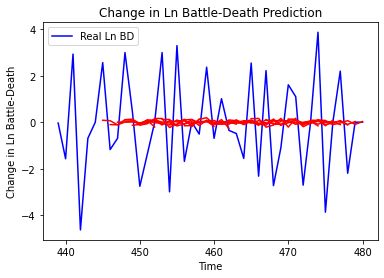

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.780058396883817, 'mae': 1.6368645293482669, 'r2': 0.05530290753072442, 'tadda_score': 1.6493623090752492}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.360768032111554, 'mae': 1.7127226264565643, 'r2': -0.022034587823914542, 'tadda_score': 1.7888553660402156}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.9264428206486346, 'mae': 1.6716008959379467, 'r2': -0.012477596696346849, 'tadda_score': 1.6979959672358307}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.33536089376351, 'mae': 1.4415154194163409, 'r2': -0.004599296789850937, 'tadda_score': 1.4552302964356667}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.278021068577445, 'mae': 1.9439176919866183, 'r2': -0.0067180156850805695, 'tadda_score': 1.9613735728893258}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.730321667878919

1/1 [==============================] - 0s 21ms/step - loss: 6.4249 - val_loss: 4.1972
Epoch 61/100
1/1 [==============================] - 0s 22ms/step - loss: 6.5381 - val_loss: 4.1961
Epoch 62/100
1/1 [==============================] - 0s 20ms/step - loss: 6.5269 - val_loss: 4.1951
Epoch 63/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5741 - val_loss: 4.1940
Epoch 64/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5432 - val_loss: 4.1929
Epoch 65/100
1/1 [==============================] - 0s 23ms/step - loss: 6.4739 - val_loss: 4.1919
Epoch 66/100
1/1 [==============================] - 0s 21ms/step - loss: 6.5137 - val_loss: 4.1909
Epoch 67/100
1/1 [==============================] - 0s 22ms/step - loss: 6.5112 - val_loss: 4.1897
Epoch 68/100
1/1 [==============================] - 0s 22ms/step - loss: 6.4916 - val_loss: 4.1887
Epoch 69/100
1/1 [==============================] - 0s 22ms/step - loss: 6.4122 - val_loss: 4.1876
Epoch 70/100
1/1 [=====

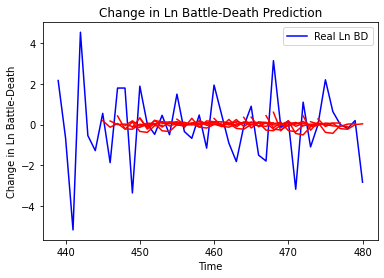

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.050047195458267, 'mae': 1.1283616188282068, 'r2': 0.078465566071235, 'tadda_score': 1.1914595302804605}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.892223933535206, 'mae': 1.3591716344890978, 'r2': -0.07024731632303194, 'tadda_score': 1.4746039878068353}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.987672524972317, 'mae': 1.41096989527643, 'r2': -0.14269883806642825, 'tadda_score': 1.5214159182240592}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.3856521232376537, 'mae': 1.5373033767182178, 'r2': -0.0740577534521849, 'tadda_score': 1.6074692316590296}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.6321006275810053, 'mae': 1.2751175558753376, 'r2': -0.04349779363762285, 'tadda_score': 1.3092395889200334}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+

In [58]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=6, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

# Change Look Back

['Cape Verde']
Building vanilla Model...
Model: "sequential_771"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_756 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1512 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1512 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1513 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1513 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 79ms/step - loss: 0.0000e

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [==============================] - 0s 7ms/

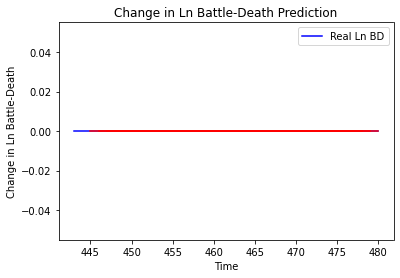

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_772"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 10ms/step - loss: 0.6044 - val_loss: 0.0988
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6107 - val_loss: 0.0988
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6055 - val_loss: 0.0989
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6069 - val_loss: 0.0989
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6099 - val_loss: 0.0988
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6066 - val_loss: 0.0988
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6099 - val_loss: 0.0987
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6061 - val_loss: 0.0987
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6063 - val_loss: 0.0987
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6046 - val_loss: 0.0988
Epoch 75/100
4/4 [===========

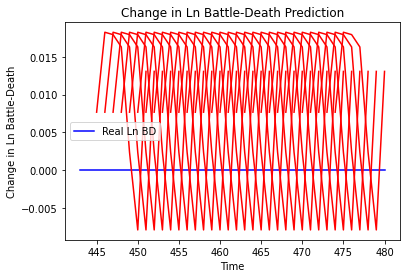

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 5.878380919901397e-05, 'mae': 0.007667060010135174, 'r2': 0.0, 'tadda_score': 0.007667060010135174}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.000671784406445719, 'mae': 0.025918804109096527, 'r2': 0.0, 'tadda_score': 0.025918804109096527}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0019233267265473253, 'mae': 0.04385574907064438, 'r2': 0.0, 'tadda_score': 0.04385574907064438}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0036189795128258595, 'mae': 0.060157954692840576, 'r2': 0.0, 'tadda_score': 0.060157954692840576}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0019604521730335472, 'mae': 0.044276993721723557, 'r2': 0.0, 'tadda_score': 0.044276993721723557}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.0013220655345256294, 'mae

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

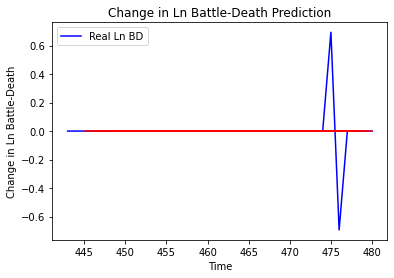

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_774"
_________________________________________________________________
Layer (type)                 Output Shape      

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2345 - val_loss: 3.8705e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2369 - val_loss: 3.5823e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2314 - val_loss: 3.4509e-04
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2278 - val_loss: 3.7514e-04
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2240 - val_loss: 3.5231e-04
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2248 - val_loss: 3.5654e-04
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2281 - val_loss: 3.6236e-04
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2313 - val_loss: 3.7808e-04
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2211 - val_loss: 3.9962e-04
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 1.2292 - v

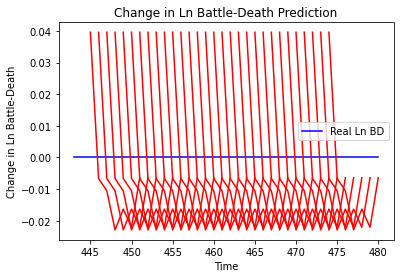

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0015695868402865326, 'mae': 0.03961801156401634, 'r2': 0.0, 'tadda_score': 0.03961801156401634}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.0010863572706441144, 'mae': 0.03295993432402611, 'r2': 0.0, 'tadda_score': 0.03295993432402611}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0005017926757791558, 'mae': 0.02240072935819626, 'r2': 0.0, 'tadda_score': 0.02240072935819626}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 2.7168221684858995e-07, 'mae': 0.0005212314426898956, 'r2': 0.0, 'tadda_score': 0.0005212314426898956}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0001042033678273803, 'mae': 0.010208005085587502, 'r2': 0.0, 'tadda_score': 0.010208005085587502}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0010422229185361176, 'mae': 0.0322834774851799, 'r2': 0.0, 't

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/

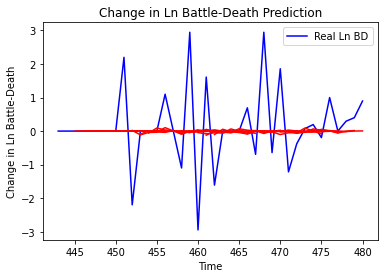

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6692265957187808, 'mae': 0.8240968598517704, 'r2': -0.012215575805371692, 'tadda_score': 0.833609159694282}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2152150843760867, 'mae': 0.7363260241615187, 'r2': -0.026907425608309277, 'tadda_score': 0.7472619650343966}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.1297408535250786, 'mae': 0.9331257858210619, 'r2': -0.06828117225415054, 'tadda_score': 0.9579566384562667}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.4234088538869543, 'mae': 1.0352242463641377, 'r2': -0.09170816708078866, 'tadda_score': 1.0613754721421016}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.360066473901793, 'mae': 0.9464171919793339, 'r2': -0.13215356938826295, 'tadda_score': 0.9604922622884762}
{'country': 'Burkina Faso', 'country_id': 47, 's

4/4 [==============================] - 0s 7ms/step - loss: 0.2564 - val_loss: 6.0433e-06
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2548 - val_loss: 6.7159e-06
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2529 - val_loss: 4.2521e-06
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2544 - val_loss: 3.1443e-06
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2533 - val_loss: 1.5839e-06
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2533 - val_loss: 2.9661e-06
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2541 - val_loss: 3.2519e-06
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2526 - val_loss: 4.3717e-06
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2546 - val_loss: 2.8717e-06
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.2535 - val_loss: 3.38

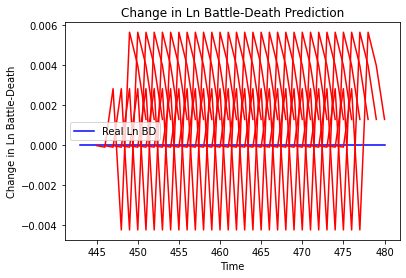

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 2.3747386918571687e-10, 'mae': 1.541018718853593e-05, 'r2': 0.0, 'tadda_score': 1.541018718853593e-05}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 1.158980184238928e-08, 'mae': 0.00010765594197437167, 'r2': 0.0, 'tadda_score': 0.00010765594197437167}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 7.433710415041296e-06, 'mae': 0.0027264831587672234, 'r2': 0.0, 'tadda_score': 0.0027264831587672234}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 2.2748332159409305e-06, 'mae': 0.001508255023509264, 'r2': 0.0, 'tadda_score': 0.001508255023509264}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 1.8014363744742884e-05, 'mae': 0.004244333133101463, 'r2': 0.0, 'tadda_score': 0.004244333133101463}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 6.778180690963313e-05, 'mae': 0.008232970722019672, 'r2

4/4 [==============================] - 0s 7ms/step - loss: 0.6563 - val_loss: 1.8521e-05
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6614 - val_loss: 1.6946e-05
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6635 - val_loss: 1.9892e-05
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6686 - val_loss: 2.6092e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6732 - val_loss: 2.4842e-05
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6557 - val_loss: 2.9714e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6567 - val_loss: 2.4108e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6655 - val_loss: 2.1786e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6453 - val_loss: 2.3078e-05
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6522 - val_loss: 2.81

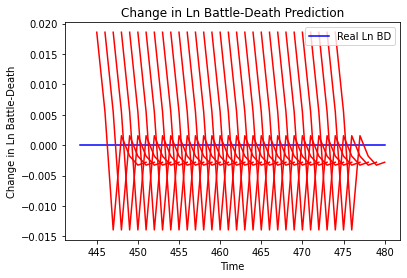

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.0003449780239066537, 'mae': 0.018573584035038948, 'r2': 0.0, 'tadda_score': 0.018573584035038948}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.0005794447203205967, 'mae': 0.02407165803015232, 'r2': 0.0, 'tadda_score': 0.02407165803015232}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.00010303837181376094, 'mae': 0.010150781832635403, 'r2': 0.0, 'tadda_score': 0.010150781832635403}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.00013723547595101762, 'mae': 0.0117147546261549, 'r2': 0.0, 'tadda_score': 0.0117147546261549}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 1.9536771617367776e-05, 'mae': 0.004420042037963867, 'r2': 0.0, 'tadda_score': 0.004420042037963867}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 1.3177856169992717e-06, 'ma

4/4 [==============================] - 0s 8ms/step - loss: 1.3660 - val_loss: 3.0275
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3595 - val_loss: 3.0266
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3627 - val_loss: 3.0256
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3587 - val_loss: 3.0246
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3590 - val_loss: 3.0235
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3583 - val_loss: 3.0225
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3658 - val_loss: 3.0216
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3617 - val_loss: 3.0206
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.3545 - val_loss: 3.0196
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.3560 - val_loss: 3.0187
Epoch 71/100
4/4 [===============

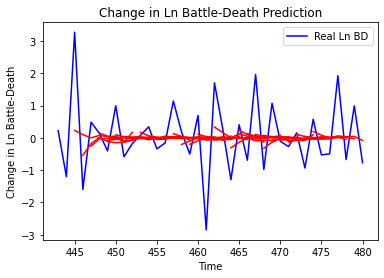

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 1.0630676629132336, 'mae': 0.7216332109189307, 'r2': 0.15790967045019355, 'tadda_score': 0.7513637967572884}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.125072113670848, 'mae': 0.8351351216636149, 'r2': -0.16204975013536682, 'tadda_score': 0.9623046261769581}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.385982905308451, 'mae': 0.9512795319042894, 'r2': -0.22082911883212208, 'tadda_score': 1.1214071140818092}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.5685895365310116, 'mae': 1.0278409680726803, 'r2': -0.04891759337321577, 'tadda_score': 1.172375585983463}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.3868666707035484, 'mae': 0.9821539643710523, 'r2': -0.2808376579629588, 'tadda_score': 1.132071539467143}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7434459876571091, 'mae': 1.10834

4/4 [==============================] - 0s 7ms/step - loss: 1.6810 - val_loss: 0.3944
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6636 - val_loss: 0.3945
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6614 - val_loss: 0.3946
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6810 - val_loss: 0.3947
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6729 - val_loss: 0.3949
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6605 - val_loss: 0.3949
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.6675 - val_loss: 0.3951
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6591 - val_loss: 0.3952
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6646 - val_loss: 0.3953
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.6680 - val_loss: 0.3955
Epoch 71/100
4/4 [===============

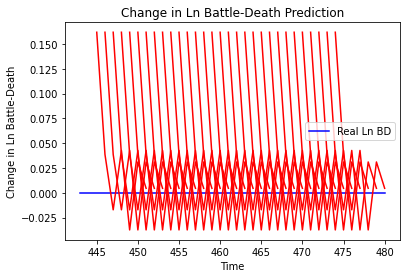

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.026181929812626237, 'mae': 0.1618083119392395, 'r2': 0.0, 'tadda_score': 0.1618083119392395}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.040174409311256376, 'mae': 0.2004355490207672, 'r2': 0.0, 'tadda_score': 0.2004355490207672}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.03359898411696349, 'mae': 0.18330025672912598, 'r2': 0.0, 'tadda_score': 0.18330025672912598}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.051068286566150256, 'mae': 0.2259829342365265, 'r2': 0.0, 'tadda_score': 0.2259829342365265}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.02248776363843774, 'mae': 0.14995920658111572, 'r2': 0.0, 'tadda_score': 0.14995920658111572}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.03277600097222888, 'mae': 0.1810414344072342, 'r2': 0.0, 'tadda_score': 0.1810414

4/4 [==============================] - 0s 8ms/step - loss: 2.1206 - val_loss: 1.2861e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.1189 - val_loss: 1.4041e-04
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.1291 - val_loss: 1.5257e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.1242 - val_loss: 1.6360e-04
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1224 - val_loss: 1.6771e-04
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1226 - val_loss: 1.6249e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1101 - val_loss: 1.8572e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.1268 - val_loss: 1.9643e-04
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 2.1199 - val_loss: 1.9878e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.1171 - val_loss: 2.10

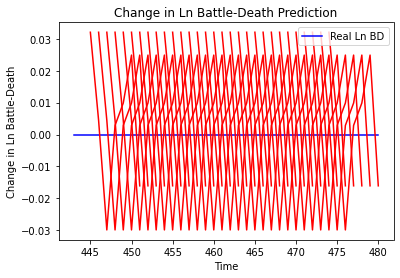

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.001026011190868259, 'mae': 0.032031409442424774, 'r2': 0.0, 'tadda_score': 0.032031409442424774}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.0013317841577426132, 'mae': 0.03649361804127693, 'r2': 0.0, 'tadda_score': 0.03649361804127693}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 4.386289414083644e-05, 'mae': 0.0066229067742824554, 'r2': 0.0, 'tadda_score': 0.0066229067742824554}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 8.979417843830387e-05, 'mae': 0.009475979022681713, 'r2': 0.0, 'tadda_score': 0.009475979022681713}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0002215229403260445, 'mae': 0.014883646741509438, 'r2': 0.0, 'tadda_score': 0.014883646741509438}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.0015808950056594995, 'mae': 0

Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

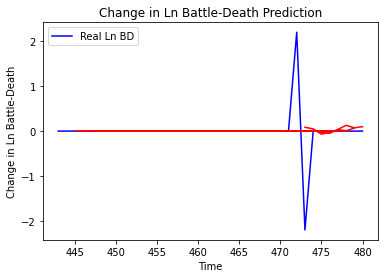

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

4/4 [==============================] - 0s 7ms/step - loss: 0.6912 - val_loss: 4.2237e-05
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6879 - val_loss: 3.9638e-05
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6901 - val_loss: 3.6952e-05
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6916 - val_loss: 3.4660e-05
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6915 - val_loss: 3.2632e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6881 - val_loss: 3.2323e-05
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6875 - val_loss: 3.4931e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6882 - val_loss: 3.5190e-05
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6896 - val_loss: 3.4162e-05
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.6873 - val_loss: 3.46

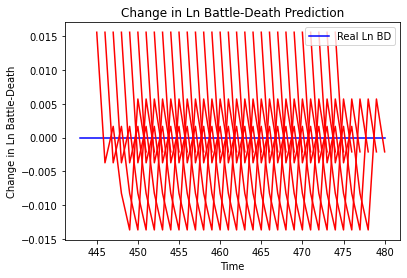

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.0002440298683855681, 'mae': 0.015621455386281013, 'r2': 0.0, 'tadda_score': 0.015621455386281013}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.00014128520275064407, 'mae': 0.011886345222592354, 'r2': 0.0, 'tadda_score': 0.011886345222592354}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.0001835845880472503, 'mae': 0.013549339026212692, 'r2': 0.0, 'tadda_score': 0.013549339026212692}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 2.7876454415030373e-05, 'mae': 0.0052798157557845116, 'r2': 0.0, 'tadda_score': 0.0052798157557845116}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 2.1854144450988468e-05, 'mae': 0.004674841649830341, 'r2': 0.0, 'tadda_score': 0.004674841649830341}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 1.0973673483813482e-06, 'mae': 0.0010475530289113

4/4 [==============================] - 0s 8ms/step - loss: 2.0162 - val_loss: 0.2486
Epoch 62/100
4/4 [==============================] - ETA: 0s - loss: 2.107 - 0s 8ms/step - loss: 2.0046 - val_loss: 0.2486
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9797 - val_loss: 0.2487
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9748 - val_loss: 0.2487
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9810 - val_loss: 0.2488
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.0091 - val_loss: 0.2489
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9935 - val_loss: 0.2489
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9895 - val_loss: 0.2488
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9870 - val_loss: 0.2488
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9993 - val_loss: 0.2487
Epoch 71/

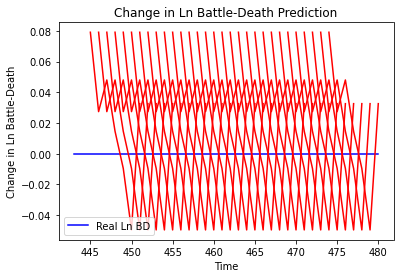

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.00624807161289298, 'mae': 0.07904474437236786, 'r2': 0.0, 'tadda_score': 0.07904474437236786}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.01133027146233112, 'mae': 0.10644374787807465, 'r2': 0.0, 'tadda_score': 0.10644374787807465}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.023851221318559546, 'mae': 0.15443840622901917, 'r2': 0.0, 'tadda_score': 0.15443840622901917}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.028571421579768108, 'mae': 0.1690308302640915, 'r2': 0.0, 'tadda_score': 0.1690308302640915}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.01743996726037622, 'mae': 0.1320604681968689, 'r2': 0.0, 'tadda_score': 0.1320604681968689}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.0068042751254902, 'mae': 0.0824880301952362, 'r2': 0.0, 'tadda_score': 0.0824880

Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7848 - val_loss: 2.5110
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7444 - val_loss: 2.5094
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7374 - val_loss: 2.5076
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7572 - val_loss: 2.5058
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7382 - val_loss: 2.5041
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7445 - val_loss: 2.5024
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7499 - val_loss: 2.5008
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7200 - val_loss: 2.4995
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7329 - val_loss: 2.4980
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 4.7497 - val_loss: 2.4966
Epoch 72/100
4/4 [==

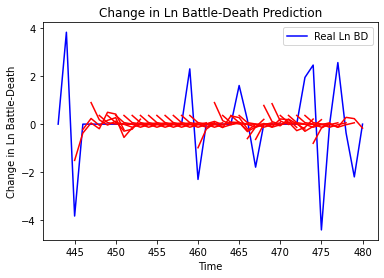

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0869429786868554, 'mae': 0.768955960173508, 'r2': 0.20326182019999917, 'tadda_score': 0.8156555993349358}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.742241459575784, 'mae': 1.179455548393896, 'r2': -0.3743948530353778, 'tadda_score': 1.2699253726682769}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 3.2813257381482828, 'mae': 1.2158833544633496, 'r2': -0.6445806367252465, 'tadda_score': 1.3999119779648095}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 3.113139729396389, 'mae': 1.2515277523479569, 'r2': -0.5602868251887072, 'tadda_score': 1.390433808036815}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.4739068080949966, 'mae': 1.029449724523396, 'r2': -0.23990714678383318, 'tadda_score': 1.0964609735887951}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.058770685668

4/4 [==============================] - 0s 7ms/step - loss: 0.9174 - val_loss: 1.0883
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9164 - val_loss: 1.0881
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9160 - val_loss: 1.0878
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9192 - val_loss: 1.0876
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9162 - val_loss: 1.0874
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9155 - val_loss: 1.0872
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9130 - val_loss: 1.0870
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9161 - val_loss: 1.0868
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9186 - val_loss: 1.0866
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.9118 - val_loss: 1.0865
Epoch 71/100
4/4 [===============

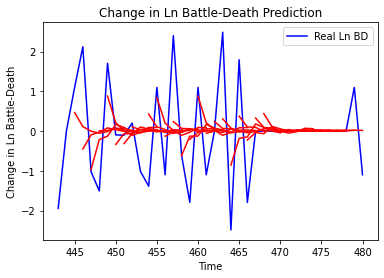

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.196071225517158, 'mae': 0.77256260674324, 'r2': 0.2500506609349078, 'tadda_score': 0.8020313715425765}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.3769152967960823, 'mae': 1.1316530325460226, 'r2': -0.41130213447306274, 'tadda_score': 1.3568116116347702}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.718114942368656, 'mae': 1.2657548263317357, 'r2': -0.515226404827082, 'tadda_score': 1.552648987834256}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.451337272715385, 'mae': 1.190414899010959, 'r2': -0.20075963056800705, 'tadda_score': 1.3638666677420368}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.6086031769934845, 'mae': 0.9064792283119404, 'r2': -0.19530272817226213, 'tadda_score': 1.0319395909636362}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.8969070434622046, '

4/4 [==============================] - 0s 6ms/step - loss: 0.1826 - val_loss: 1.5447
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1851 - val_loss: 1.5444
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1869 - val_loss: 1.5442
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1854 - val_loss: 1.5440
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1838 - val_loss: 1.5439
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1864 - val_loss: 1.5437
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1877 - val_loss: 1.5436
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1845 - val_loss: 1.5435
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1828 - val_loss: 1.5435
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1883 - val_loss: 1.5435
Epoch 71/100
4/4 [===============

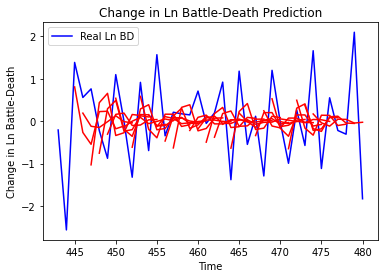

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.6719007508699761, 'mae': 0.6811730453242748, 'r2': 0.0876585120141451, 'tadda_score': 0.8069459468245396}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 0.9700874130287718, 'mae': 0.842412030188777, 'r2': -0.31425784400401957, 'tadda_score': 0.9951409978057324}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 0.9704726547139135, 'mae': 0.7838369819420845, 'r2': 0.009724813707804092, 'tadda_score': 0.7912857426105212}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.0061798986151098, 'mae': 0.8181216535414964, 'r2': -0.1424909663524354, 'tadda_score': 0.8774739634191702}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.4843339655960395, 'mae': 1.0044177754361951, 'r2': -0.49226509959667286, 'tadda_score': 1.2130219536413276}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.755533

Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7802 - val_loss: 2.2295
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7751 - val_loss: 2.2287
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7706 - val_loss: 2.2282
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7697 - val_loss: 2.2275
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7701 - val_loss: 2.2267
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7738 - val_loss: 2.2261
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7684 - val_loss: 2.2255
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7720 - val_loss: 2.2250
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7697 - val_loss: 2.2245
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7660 - val_loss: 2.2236
Epoch 71/100
4/4 [==

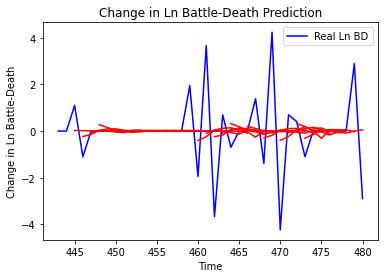

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.4399544599786718, 'mae': 0.918449032528095, 'r2': 0.0774294916213254, 'tadda_score': 0.9395405923057522}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.4845980478779202, 'mae': 0.7857244788926614, 'r2': -0.01408827020837844, 'tadda_score': 0.7971505730670465}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.6236470397114435, 'mae': 0.9867443978765487, 'r2': -0.11938954628304543, 'tadda_score': 1.0586952341078597}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.377016850349123, 'mae': 0.8972059230833869, 'r2': 0.016805584243160143, 'tadda_score': 0.9128756969749551}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.7473517071201026, 'mae': 0.9418462392246202, 'r2': -0.08412955258899868, 'tadda_score': 0.9903930170

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.6530
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 

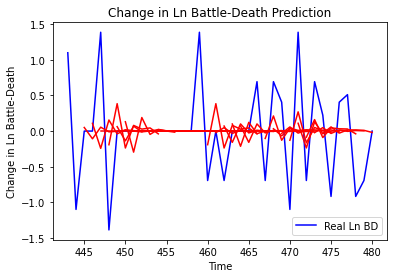

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3709967550696659, 'mae': 0.3994285951237219, 'r2': 0.10135609921465993, 'tadda_score': 0.404685072805021}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39652973364025673, 'mae': 0.42672815912041673, 'r2': 0.03637085404999241, 'tadda_score': 0.4365479343814016}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.4941954765025056, 'mae': 0.47132961244742333, 'r2': -0.034305294229051375, 'tadda_score': 0.47618262212833024}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4976740942308994, 'mae': 0.4599414156486404, 'r2': -0.030660027526775435, 'tadda_score': 0.46225229579804455}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4834247250299955, 'mae': 0.4921763920454448, 'r2': -0.09884583973570527, 'tadda_score': 0.5161722863632704}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.5761

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/

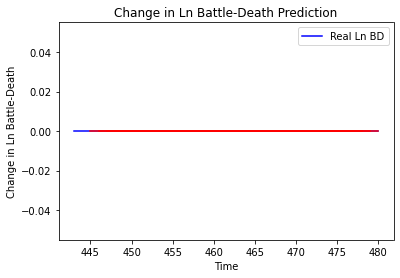

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_790"
_________________________________________________________________
Layer (type)                 Output S

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

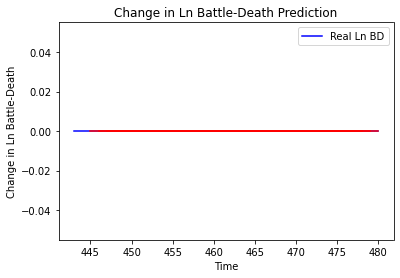

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_791"
_______________________________

4/4 [==============================] - 0s 7ms/step - loss: 0.8393 - val_loss: 2.1766
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8432 - val_loss: 2.1760
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8417 - val_loss: 2.1754
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8373 - val_loss: 2.1749
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8427 - val_loss: 2.1744
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8441 - val_loss: 2.1740
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8391 - val_loss: 2.1735
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8420 - val_loss: 2.1730
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8470 - val_loss: 2.1726
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 0.8403 - val_loss: 2.1722
Epoch 74/100
4/4 [===============

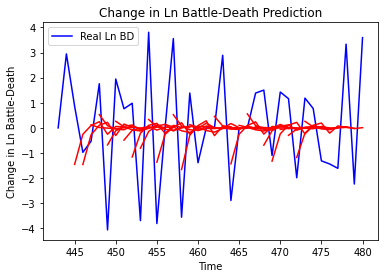

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.1313657774614745, 'mae': 1.4728050231687633, 'r2': 0.2771326491043934, 'tadda_score': 1.6147027070077664}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 5.341057515055076, 'mae': 1.9585645934242897, 'r2': -0.36015274132355657, 'tadda_score': 2.215773255656053}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.508751563269531, 'mae': 1.8173235626360322, 'r2': -0.42233471521135457, 'tadda_score': 2.161588751657858}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 4.575797254934743, 'mae': 1.75892852954911, 'r2': -0.008500670299628199, 'tadda_score': 1.9079351585392834}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 5.939322906405193, 'mae': 1.9622797935392768, 'r2': -0.07971431471092627, 'tadda_score': 2.1629263757851036}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 5.533480470568659, 'mae': 1.892

4/4 [==============================] - 0s 7ms/step - loss: 0.5534 - val_loss: 1.0459
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5538 - val_loss: 1.0462
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5540 - val_loss: 1.0466
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5636 - val_loss: 1.0469
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5560 - val_loss: 1.0471
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5564 - val_loss: 1.0475
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5554 - val_loss: 1.0477
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5574 - val_loss: 1.0481
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5539 - val_loss: 1.0484
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.5579 - val_loss: 1.0487
Epoch 71/100
4/4 [===============

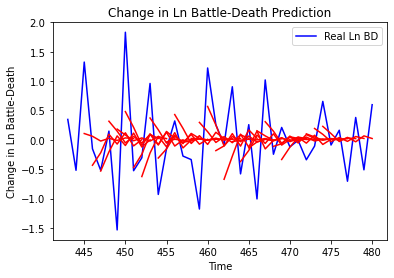

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.47657788675877183, 'mae': 0.5251803877526203, 'r2': 0.1661020822871997, 'tadda_score': 0.5815068136973859}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.8947011773672776, 'mae': 0.7409588767024801, 'r2': -0.6535768779904279, 'tadda_score': 0.9338149814986115}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 1.129774922946625, 'mae': 0.8224048919485618, 'r2': -0.8439588667703413, 'tadda_score': 1.0642013878381857}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.0305373965141476, 'mae': 0.8225990507131308, 'r2': -0.3853620478910875, 'tadda_score': 1.0476778782904634}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6671111597698828, 'mae': 0.6571207749780382, 'r2': -0.30304543015607166, 'tadda_score': 0.7866375074844922}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.7522069955942

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

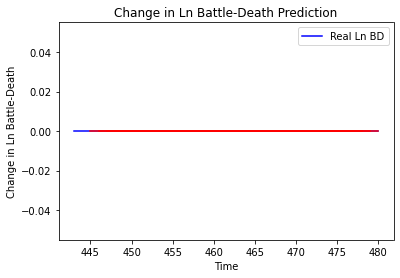

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_794"
____

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 7ms/

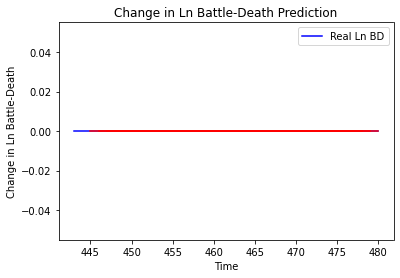

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_795"
_________________________________________________________________
Layer (type)                 Output Shape             

4/4 [==============================] - 0s 7ms/step - loss: 2.5932 - val_loss: 0.3853
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 2.6300 - val_loss: 0.3854
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 2.6234 - val_loss: 0.3854
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5933 - val_loss: 0.3854
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5952 - val_loss: 0.3855
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5944 - val_loss: 0.3856
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 2.6103 - val_loss: 0.3857
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 2.6096 - val_loss: 0.3858
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5927 - val_loss: 0.3859
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6074 - val_loss: 0.3860
Epoch 75/100
4/4 [===============

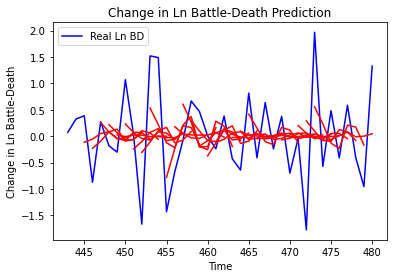

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5969710188009237, 'mae': 0.6297038373380323, 'r2': 0.21635302854988914, 'tadda_score': 0.718401733118238}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.2987196452308503, 'mae': 0.8741241516811302, 'r2': -0.32437025573089207, 'tadda_score': 1.0687324877473365}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.2287517670381982, 'mae': 0.8276511163871942, 'r2': -0.5396087580799502, 'tadda_score': 1.0131531972548822}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.798888308921463, 'mae': 0.7410191083063483, 'r2': -0.15249991842525712, 'tadda_score': 0.8170422319680254}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8076115053831988, 'mae': 0.6585168211080021, 'r2': -0.0476278692526686, 'tadda_score': 0.7381543071610118}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.7699309

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

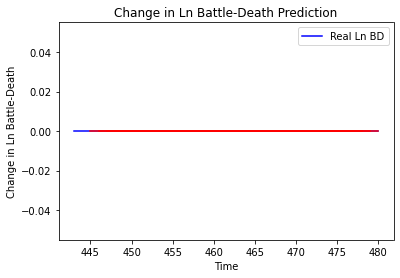

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_797"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 7ms/step - loss: 1.9089 - val_loss: 1.6581
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9086 - val_loss: 1.6582
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9069 - val_loss: 1.6583
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.8955 - val_loss: 1.6583
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9255 - val_loss: 1.6583
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9173 - val_loss: 1.6585
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9021 - val_loss: 1.6586
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9170 - val_loss: 1.6588
Epoch 73/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9165 - val_loss: 1.6589
Epoch 74/100
4/4 [==============================] - 0s 7ms/step - loss: 1.9195 - val_loss: 1.6591
Epoch 75/100
4/4 [===============

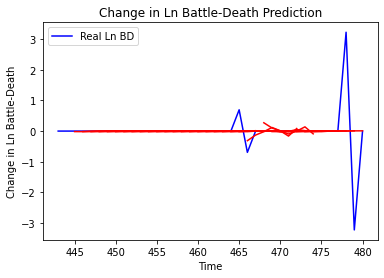

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.02431393177722205, 'mae': 0.060445321814150424, 'r2': 0.2409060488890521, 'tadda_score': 0.061009315864176364}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.046010320817780274, 'mae': 0.10518542661361975, 'r2': -0.43646681834366663, 'tadda_score': 0.10644640680122457}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.06410533471981274, 'mae': 0.10731016173678717, 'r2': -1.0014028280420009, 'tadda_score': 0.12104685951985997}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.03959204288448067, 'mae': 0.0947395916379301, 'r2': -0.23608474931602785, 'tadda_score': 0.09583902153837762}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03480094605468926, 'mae': 0.07346001323032461, 'r2': -0.08650414441819554, 'tadda_score': 0.07402611821609817}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6

4/4 [==============================] - 0s 8ms/step - loss: 2.5188 - val_loss: 0.1819
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5156 - val_loss: 0.1819
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5139 - val_loss: 0.1818
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5077 - val_loss: 0.1818
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5098 - val_loss: 0.1818
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5172 - val_loss: 0.1817
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5155 - val_loss: 0.1817
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5060 - val_loss: 0.1817
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.5049 - val_loss: 0.1816
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 2.5003 - val_loss: 0.1816
Epoch 70/100
4/4 [===============

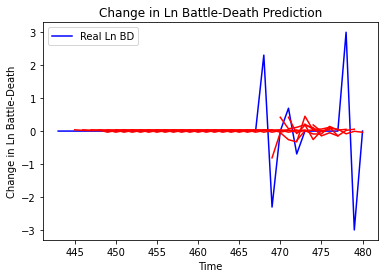

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.26274280097332514, 'mae': 0.20440030964845976, 'r2': 0.31841876603245123, 'tadda_score': 0.20440030964845976}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.4928637847371815, 'mae': 0.30080381902689296, 'r2': -0.27853819527937995, 'tadda_score': 0.3259436396026071}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.41223978657087396, 'mae': 0.31582962806439874, 'r2': -0.47709579706498495, 'tadda_score': 0.3414849885842848}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.3844810008095484, 'mae': 0.3203781572880896, 'r2': -0.04212016878338298, 'tadda_score': 0.3203781572880896}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.4295423951580634, 'mae': 0.27134759355610133, 'r2': -0.16425725172171557, 'tadda_score': 0.27933700908249137}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.4

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

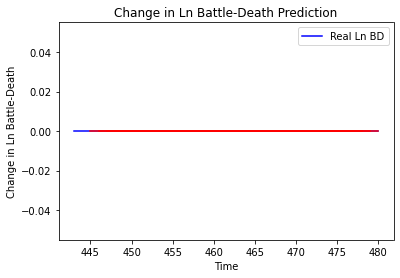

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_800"
_________________________________________________________________
Layer (type)                 Out

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - ETA: 0s - loss: 0.0000e+0 - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [=============

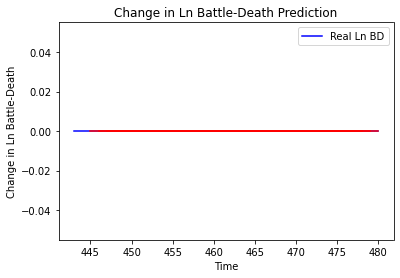

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_801"
_________________________________________________________________
Layer (type)       

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1271 - val_loss: 9.7265e-07
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1265 - val_loss: 1.6885e-06
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1270 - val_loss: 1.5489e-06
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1280 - val_loss: 1.2619e-06
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1252 - val_loss: 8.8393e-07
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1269 - val_loss: 1.4463e-06
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1278 - val_loss: 7.3462e-07
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1272 - val_loss: 1.2328e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1261 - val_loss: 1.8473e-06
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1279 - v

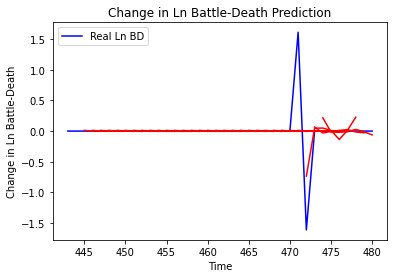

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.1124256200885565, 'mae': 0.10205739632321789, 'r2': 0.3489593656188281, 'tadda_score': 0.10205739632321789}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.1926203597998269, 'mae': 0.1459904499173005, 'r2': -0.11543686519166796, 'tadda_score': 0.14715247338710621}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.20582276742428948, 'mae': 0.1438275783454219, 'r2': -0.19189011337850048, 'tadda_score': 0.14986124726085262}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.09941464704322328, 'mae': 0.09063364505493837, 'r2': -0.1910950821527142, 'tadda_score': 0.09063364505493837}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10866851138061404, 'mae': 0.10366265046446718, 'r2': -0.301966393684729, 'tadda_score': 0.10366265046446718}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse'

4/4 [==============================] - 0s 9ms/step - loss: 0.1408 - val_loss: 9.4566e-06
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1398 - val_loss: 1.0452e-05
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1406 - val_loss: 7.7546e-06
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1400 - val_loss: 5.5464e-06
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1411 - val_loss: 5.3241e-06
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1417 - val_loss: 8.4492e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1402 - val_loss: 1.2458e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1404 - val_loss: 8.3060e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1414 - val_loss: 8.2460e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1404 - val_loss: 5.32

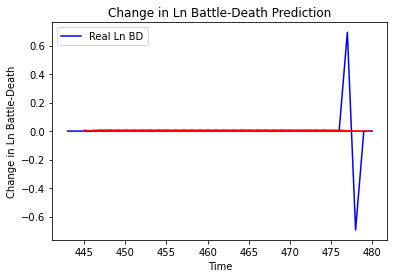

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 3.198074178909719e-05, 'mae': 0.005655151791870594, 'r2': 0.0, 'tadda_score': 0.005655151791870594}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 5.0854322994239344e-05, 'mae': 0.007131221704185009, 'r2': 0.0, 'tadda_score': 0.007131221704185009}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.00019989047270908833, 'mae': 0.01413826271891594, 'r2': 0.0, 'tadda_score': 0.01413826271891594}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00023739575846198988, 'mae': 0.015407652594149113, 'r2': 0.0, 'tadda_score': 0.015407652594149113}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.00017135857282102665, 'mae': 0.013090400025248528, 'r2': 0.0, 'tadda_score': 0.013090400025248528}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 0.0001599524547355952, 'mae': 0.012647231109440327, 

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

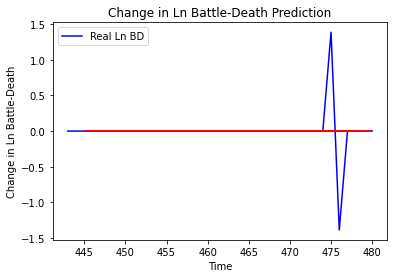

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_804"
_________________________________________________________________
Layer (type)                 O

4/4 [==============================] - 0s 9ms/step - loss: 1.4574 - val_loss: 0.8676
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 1.4373 - val_loss: 0.8674
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.4439 - val_loss: 0.8672
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 1.4332 - val_loss: 0.8670
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.4585 - val_loss: 0.8669
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.4479 - val_loss: 0.8666
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.4575 - val_loss: 0.8664
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.4270 - val_loss: 0.8662
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 1.4675 - val_loss: 0.8660
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.4624 - val_loss: 0.8657
Epoch 75/100
4/4 [===============

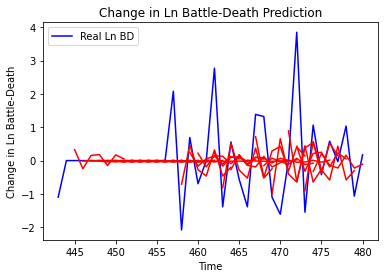

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.246643888796083, 'mae': 0.7198876538011282, 'r2': 0.2077523994875069, 'tadda_score': 0.7585997086647003}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.0535863531773755, 'mae': 0.8916196652970659, 'r2': -0.07331013412352805, 'tadda_score': 0.9384938723690259}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.512919198243213, 'mae': 1.134669444123554, 'r2': -0.3130330883882262, 'tadda_score': 1.276081082073001}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.1691937210948264, 'mae': 1.0379469806491297, 'r2': -0.43938454582685305, 'tadda_score': 1.2399102535882554}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.400480974202509, 'mae': 0.8405729073092264, 'r2': -0.7099974507588112, 'tadda_score': 0.9627968954846186}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6', 'm

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

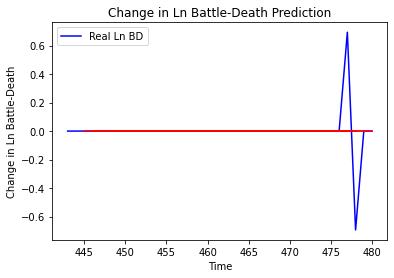

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_806"
_______________________________________________________

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 7ms/

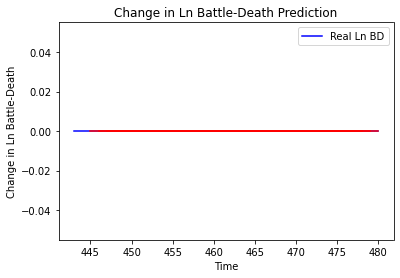

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_807"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 8ms/step - loss: 3.3075 - val_loss: 0.1532
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3016 - val_loss: 0.1532
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3149 - val_loss: 0.1531
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3078 - val_loss: 0.1531
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2965 - val_loss: 0.1531
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 3.2988 - val_loss: 0.1531
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 3.2914 - val_loss: 0.1531
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3088 - val_loss: 0.1531
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3013 - val_loss: 0.1531
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3085 - val_loss: 0.1531
Epoch 75/100
4/4 [===============

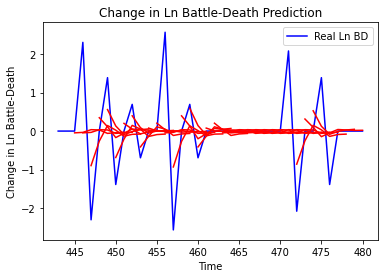

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.8409364153362481, 'mae': 0.5532756036084933, 'r2': 0.3391517239723184, 'tadda_score': 0.5578588100087685}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.70398982987109, 'mae': 0.8985392830610507, 'r2': -0.3390771536380073, 'tadda_score': 0.9668907400806976}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.3224607241815056, 'mae': 0.7651163971101054, 'r2': -0.5077301700394565, 'tadda_score': 0.858888443874797}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 0.9429523321437991, 'mae': 0.6472871256350804, 'r2': 0.12150741420931477, 'tadda_score': 0.6487138356372047}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.0263805155752546, 'mae': 0.6381530029113802, 'r2': -0.04829279037032319, 'tadda_score': 0.6491121639843497}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.4293207896815057

4/4 [==============================] - 0s 8ms/step - loss: 1.8915 - val_loss: 0.4877
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8821 - val_loss: 0.4877
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8908 - val_loss: 0.4877
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 1.8849 - val_loss: 0.4876
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8794 - val_loss: 0.4876
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8817 - val_loss: 0.4876
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 1.8839 - val_loss: 0.4875
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8823 - val_loss: 0.4875
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 1.8868 - val_loss: 0.4875
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.8850 - val_loss: 0.4874
Epoch 71/100
4/4 [===============

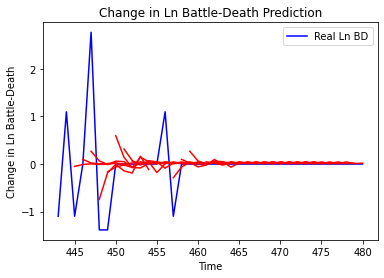

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.3872480619062646, 'mae': 0.3176736572058585, 'r2': 0.23121785381709037, 'tadda_score': 0.3176736572058585}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8931846542068494, 'mae': 0.5078898851936263, 'r2': -0.17530813343673612, 'tadda_score': 0.5714087615276578}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.8852298013319786, 'mae': 0.49487985722923455, 'r2': -0.4925481527053128, 'tadda_score': 0.5711391255528151}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.8415073375055406, 'mae': 0.5204036436001875, 'r2': -0.21144164524649778, 'tadda_score': 0.5818458459298231}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.757005723639003, 'mae': 0.5088375069469628, 'r2': -0.2763550127940395, 'tadda_score': 0.5574408434600053}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8039170476752502,

4/4 [==============================] - 0s 9ms/step - loss: 2.9417 - val_loss: 3.1621
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9613 - val_loss: 3.1616
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9355 - val_loss: 3.1614
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9352 - val_loss: 3.1610
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9616 - val_loss: 3.1609
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9590 - val_loss: 3.1608
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9452 - val_loss: 3.1610
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9614 - val_loss: 3.1612
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.9494 - val_loss: 3.1614
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 2.9513 - val_loss: 3.1616
Epoch 71/100
4/4 [===============

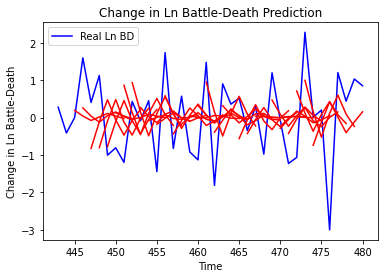

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 1.0397013843475071, 'mae': 0.8692521014941039, 'r2': 0.050050529436977964, 'tadda_score': 1.055047846002609}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.422883401013602, 'mae': 1.2155117926592847, 'r2': -0.7135879528200018, 'tadda_score': 1.5443974989250517}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.302760148220953, 'mae': 1.2010779931123428, 'r2': -0.3349830287694118, 'tadda_score': 1.4053506033098073}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.399321062668133, 'mae': 1.2009773621519966, 'r2': -0.3771958395017141, 'tadda_score': 1.3973064345181545}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 2.943861604864309, 'mae': 1.3465941444322331, 'r2': -0.6036480272315001, 'tadda_score': 1.67276528331487}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/

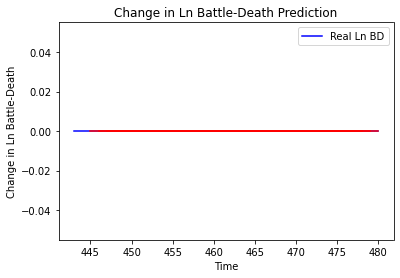

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_811"
_________________________________________________________________
Layer (type)                 Output Shap

Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1400 - val_loss: 3.6301e-06
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1378 - val_loss: 3.8636e-06
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1381 - val_loss: 2.7821e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1389 - val_loss: 2.3730e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1395 - val_loss: 1.8625e-06
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1387 - val_loss: 2.9564e-06
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1379 - val_loss: 1.7787e-06
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1379 - val_loss: 2.1972e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1382 - val_loss: 4.9694e-06
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1368 - v

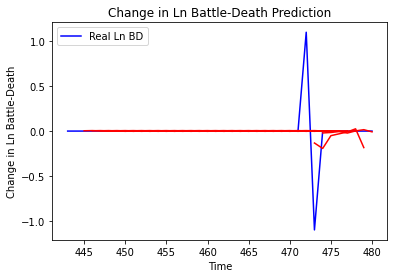

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07110132887237568, 'mae': 0.07258291189889801, 'r2': 0.11635042763730674, 'tadda_score': 0.07258291189889801}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.08080077553502253, 'mae': 0.09056231048599574, 'r2': -0.004194603398429919, 'tadda_score': 0.09056231048599574}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.044382059448199715, 'mae': 0.059221189118403655, 'r2': -0.14120340085459038, 'tadda_score': 0.059221189118403655}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04534693329865223, 'mae': 0.05949569520550813, 'r2': -0.16601336535876654, 'tadda_score': 0.05949569520550813}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04156575921601987, 'mae': 0.05072556736268447, 'r2': -0.0687873966684307, 'tadda_score': 0.05072556736268447}
{'country': 'Namibia', 'country_id': 170, 'step': '

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9

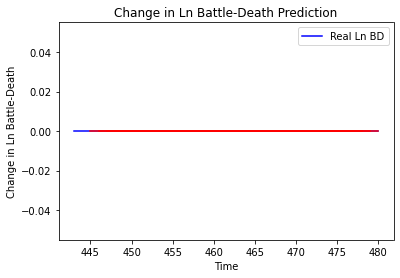

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_813"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

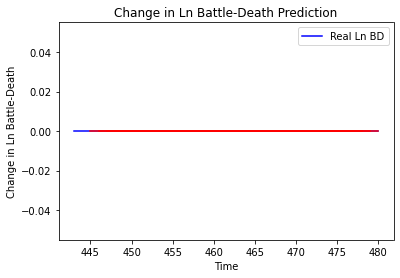

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_814"
_________________________________________________________________
Layer (ty

4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 6ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - ETA: 0s - loss: 0.0000e+0 - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [=============

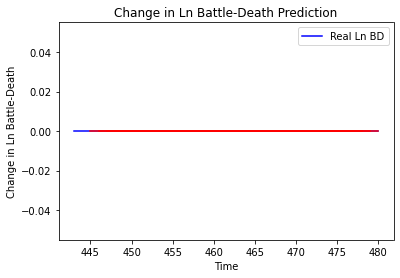

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_815"
_________________________________________________________________
Layer (

Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0756 - val_loss: 2.1772
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1772
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1772
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1772
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1771
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1771
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0755 - val_loss: 2.1771
Epoch 72/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0756 - val_loss: 2.1772
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0755 - val_loss: 2.1772
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0756 - val_loss: 2.1772
Epoch 75/100
4/4 [==

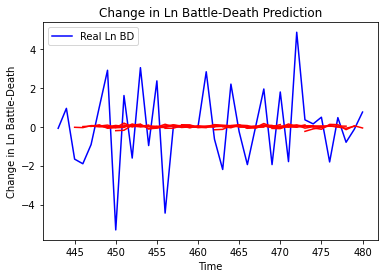

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.716273266755107, 'mae': 1.6781069276582679, 'r2': 0.02669670771097865, 'tadda_score': 1.6924669935833583}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.608184223862593, 'mae': 1.8257438075375032, 'r2': -0.03524961684666139, 'tadda_score': 1.8772409231048297}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.646506861112252, 'mae': 2.151289629919398, 'r2': -0.030173840790266748, 'tadda_score': 2.207401153800953}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.000737932072108, 'mae': 2.002735995746649, 'r2': -0.03696352764363442, 'tadda_score': 2.0497608864029213}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.448753506329895, 'mae': 2.311609554627061, 'r2': -0.023717647345210757, 'tadda_score': 2.3630281337484917}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.472990150113481, 'mae'

4/4 [==============================] - 0s 7ms/step - loss: 5.1557 - val_loss: 0.8670
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1359 - val_loss: 0.8667
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 5.1283 - val_loss: 0.8663
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 5.1366 - val_loss: 0.8660
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1166 - val_loss: 0.8657
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 5.1118 - val_loss: 0.8655
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 5.0897 - val_loss: 0.8653
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0597 - val_loss: 0.8654
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 5.0956 - val_loss: 0.8654
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 5.1007 - val_loss: 0.8654
Epoch 71/100
4/4 [===============

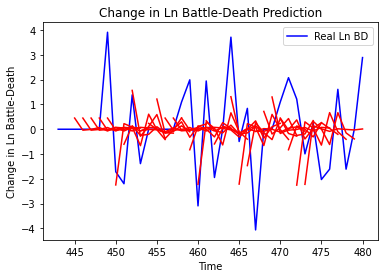

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.9122268376462035, 'mae': 1.3147395722299084, 'r2': 0.007906320021499713, 'tadda_score': 1.4939451567559703}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.338793094819831, 'mae': 1.964179087708293, 'r2': -0.4933251328533652, 'tadda_score': 2.4008241663673506}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 8.83933484970083, 'mae': 2.2736800142645865, 'r2': -0.6924893662673615, 'tadda_score': 2.7578754930218095}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 10.753489628199931, 'mae': 2.6829094791923094, 'r2': -0.7634650151007742, 'tadda_score': 3.286320197782331}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 8.85630774412317, 'mae': 2.3294775224851816, 'r2': -0.8641481682798327, 'tadda_score': 2.847651722741847}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.221314025811023, 'mae': 2.111816

4/4 [==============================] - 0s 8ms/step - loss: 0.5762 - val_loss: 2.6266
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5708 - val_loss: 2.6252
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5724 - val_loss: 2.6238
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5773 - val_loss: 2.6226
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5725 - val_loss: 2.6213
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5742 - val_loss: 2.6199
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5730 - val_loss: 2.6183
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5699 - val_loss: 2.6169
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5745 - val_loss: 2.6153
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5721 - val_loss: 2.6138
Epoch 71/100
4/4 [==============

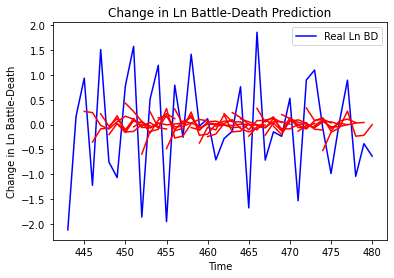

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8295955208175754, 'mae': 0.7876492623793203, 'r2': 0.2639196131178916, 'tadda_score': 0.824205206141583}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.2329101261356616, 'mae': 0.9345326912093099, 'r2': -0.14004698390630765, 'tadda_score': 1.0902194789735413}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.364498643546695, 'mae': 0.9542199336506972, 'r2': -0.47127825354912223, 'tadda_score': 1.1567894410856614}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.1046640291491143, 'mae': 0.8926335501674617, 'r2': 0.10319431615676355, 'tadda_score': 0.9865248704208737}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.3346658674222203, 'mae': 0.9513646158359237, 'r2': -0.12501077557005247, 'tadda_score': 1.1011533201020745}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.2034366440028217, '

4/4 [==============================] - 0s 9ms/step - loss: 2.7089 - val_loss: 8.4578e-04
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6955 - val_loss: 9.0971e-04
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7166 - val_loss: 9.2129e-04
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7056 - val_loss: 9.9576e-04
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6985 - val_loss: 9.8790e-04
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6964 - val_loss: 9.9803e-04
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 2.7120 - val_loss: 0.0010
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6970 - val_loss: 0.0011
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6863 - val_loss: 0.0012
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7023 - val_loss: 0.0012
Epoch 69/

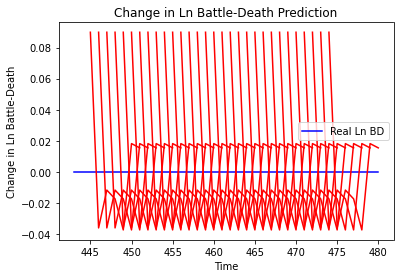

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.008076465286397161, 'mae': 0.08986915647983551, 'r2': 0.0, 'tadda_score': 0.08986915647983551}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.0028933972923011475, 'mae': 0.05379030853509903, 'r2': 0.0, 'tadda_score': 0.05379030853509903}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.0017690538537282752, 'mae': 0.04206012189388275, 'r2': 0.0, 'tadda_score': 0.04206012189388275}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0006093541482334874, 'mae': 0.024685099720954895, 'r2': 0.0, 'tadda_score': 0.024685099720954895}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.0005474509238114766, 'mae': 0.023397669196128845, 'r2': 0.0, 'tadda_score': 0.023397669196128845}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.001730129523767554, 'mae': 0.04159482568502426, 'r2': 0.0, 'tadda

Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1168 - val_loss: 1.7497
Epoch 63/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1168 - val_loss: 1.7489
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1174 - val_loss: 1.7481
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1168 - val_loss: 1.7473
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1171 - val_loss: 1.7466
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1160 - val_loss: 1.7459
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1173 - val_loss: 1.7452
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1165 - val_loss: 1.7445
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1152 - val_loss: 1.7437
Epoch 71/100
4/4 [==============================] - 0s 7ms/step - loss: 0.1160 - val_loss: 1.7426
Epoch 72/100
4/4 [==

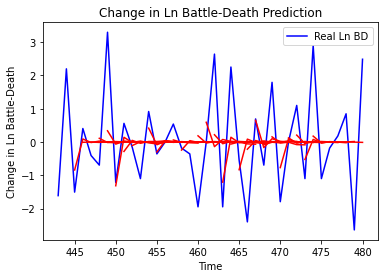

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.5596144538835037, 'mae': 0.9018209609258634, 'r2': 0.24733694852661192, 'tadda_score': 0.9235896377258958}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.430597105135746, 'mae': 1.2761611021909838, 'r2': -0.27329687954187887, 'tadda_score': 1.475361258816965}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.588599330399475, 'mae': 1.2444898219190335, 'r2': -0.18548309982279232, 'tadda_score': 1.4038760171614384}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.0657949432692813, 'mae': 1.4148518999117057, 'r2': -0.09168702829025244, 'tadda_score': 1.5268040163064316}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 1.9558117513013744, 'mae': 1.0755565881493612, 'r2': -0.29128229675520223, 'tadda_score': 1.2469195328727785}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.3029603314446487, 

3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] - 0s 8ms/

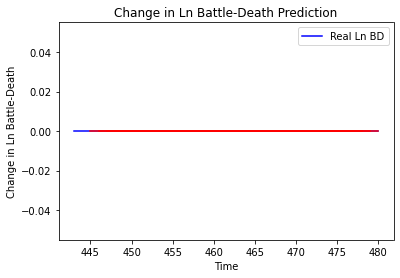

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_821"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 7ms/step - loss: 0.0696 - val_loss: 6.0359e-06
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0700 - val_loss: 1.5011e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0692 - val_loss: 6.1684e-07
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0701 - val_loss: 4.2437e-07
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0698 - val_loss: 1.6845e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0695 - val_loss: 1.5200e-06
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0689 - val_loss: 1.8688e-06
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0691 - val_loss: 2.0463e-06
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0699 - val_loss: 3.2703e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0697 - val_loss: 3.64

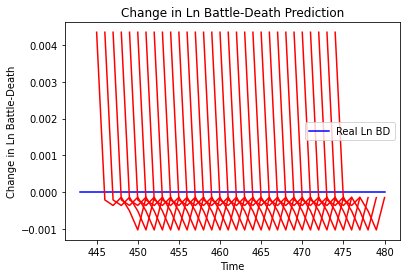

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 1.8930243268381686e-05, 'mae': 0.004350889939814806, 'r2': 0.0, 'tadda_score': 0.004350889939814806}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 1.7130681815866753e-05, 'mae': 0.004138922784477472, 'r2': 0.0, 'tadda_score': 0.004138922784477472}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 1.4257972895748551e-05, 'mae': 0.003775973105803132, 'r2': 0.0, 'tadda_score': 0.003775973105803132}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 1.3211628647383288e-05, 'mae': 0.0036347804125398397, 'r2': 0.0, 'tadda_score': 0.0036347804125398397}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 1.1116035786778522e-05, 'mae': 0.0033340719528496265, 'r2': 0.0, 'tadda_score': 0.0033340719528496265}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 5.314573293217989e-06, 'mae': 0.0023053358308

4/4 [==============================] - 0s 7ms/step - loss: 0.0782 - val_loss: 0.0630
Epoch 62/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0766 - val_loss: 0.0629
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0762 - val_loss: 0.0629
Epoch 64/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0766 - val_loss: 0.0627
Epoch 65/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0769 - val_loss: 0.0627
Epoch 66/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0773 - val_loss: 0.0626
Epoch 67/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0779 - val_loss: 0.0625
Epoch 68/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0768 - val_loss: 0.0624
Epoch 69/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0773 - val_loss: 0.0623
Epoch 70/100
4/4 [==============================] - 0s 7ms/step - loss: 0.0776 - val_loss: 0.0623
Epoch 71/100
4/4 [===============

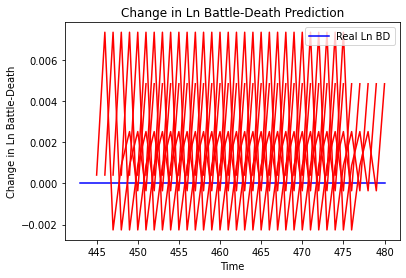

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 1.6763493441686534e-07, 'mae': 0.0004094324540346861, 'r2': 0.0, 'tadda_score': 0.0004094324540346861}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 6.0227320008190456e-05, 'mae': 0.0077606262639164925, 'r2': 0.0, 'tadda_score': 0.0077606262639164925}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 3.029676360522069e-05, 'mae': 0.005504249595105648, 'r2': 0.0, 'tadda_score': 0.005504249595105648}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 4.0699618896406506e-05, 'mae': 0.006379625294357538, 'r2': 0.0, 'tadda_score': 0.006379625294357538}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 2.4083424845058377e-06, 'mae': 0.001551883528009057, 'r2': 0.0, 'tadda_score': 0.001551883528009057}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 1.436274837349769e-06, 'mae'

1/1 [==============================] - 0s 30ms/step - loss: 2.9068 - val_loss: 1.3177
Epoch 61/100
1/1 [==============================] - 0s 30ms/step - loss: 2.9060 - val_loss: 1.3183
Epoch 62/100
1/1 [==============================] - 0s 21ms/step - loss: 2.8989 - val_loss: 1.3188
Epoch 63/100
1/1 [==============================] - 0s 20ms/step - loss: 2.8798 - val_loss: 1.3193
Epoch 64/100
1/1 [==============================] - 0s 20ms/step - loss: 2.9235 - val_loss: 1.3198
Epoch 65/100
1/1 [==============================] - 0s 20ms/step - loss: 2.9078 - val_loss: 1.3203
Epoch 66/100
1/1 [==============================] - 0s 22ms/step - loss: 2.9045 - val_loss: 1.3207
Epoch 67/100
1/1 [==============================] - 0s 22ms/step - loss: 2.8996 - val_loss: 1.3212
Epoch 68/100
1/1 [==============================] - 0s 21ms/step - loss: 2.8810 - val_loss: 1.3217
Epoch 69/100
1/1 [==============================] - 0s 22ms/step - loss: 2.8975 - val_loss: 1.3222
Epoch 70/100
1/1 [=====

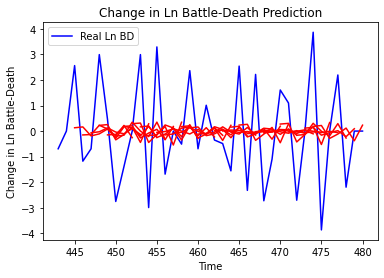

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.705451241600732, 'mae': 1.634391732995066, 'r2': 0.07394842970875137, 'tadda_score': 1.663636851295186}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.3114531787819, 'mae': 1.7002257620949732, 'r2': -0.010476649996168153, 'tadda_score': 1.8181495257376816}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.9620076633268786, 'mae': 1.6689209558731986, 'r2': -0.021648392779862302, 'tadda_score': 1.7045408201134873}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.3299327689793667, 'mae': 1.4375939331652847, 'r2': -0.0029643641649483854, 'tadda_score': 1.4435542159728336}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.279218250075574, 'mae': 1.9427689010583935, 'r2': -0.006946363424991553, 'tadda_score': 1.9796550600164708}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.866545760895714, 

1/1 [==============================] - 0s 19ms/step - loss: 6.5285 - val_loss: 4.1609
Epoch 61/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5155 - val_loss: 4.1609
Epoch 62/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5600 - val_loss: 4.1608
Epoch 63/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5569 - val_loss: 4.1608
Epoch 64/100
1/1 [==============================] - 0s 20ms/step - loss: 6.5403 - val_loss: 4.1606
Epoch 65/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5399 - val_loss: 4.1605
Epoch 66/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5103 - val_loss: 4.1604
Epoch 67/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5024 - val_loss: 4.1604
Epoch 68/100
1/1 [==============================] - 0s 20ms/step - loss: 6.4667 - val_loss: 4.1605
Epoch 69/100
1/1 [==============================] - 0s 19ms/step - loss: 6.5408 - val_loss: 4.1605
Epoch 70/100
1/1 [=====

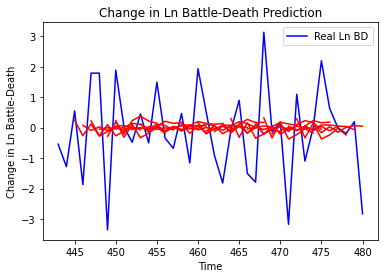

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.052473832741127, 'mae': 1.1234427706680685, 'r2': 0.07737474737215089, 'tadda_score': 1.1631288934530806}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.759067559978518, 'mae': 1.2878106191254874, 'r2': -0.020973727996086433, 'tadda_score': 1.3058220451819122}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.9130136141603873, 'mae': 1.4122728056242095, 'r2': -0.11414395130323207, 'tadda_score': 1.4870294714003829}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.2187509618927317, 'mae': 1.5142596569829516, 'r2': -0.021110350742876927, 'tadda_score': 1.5753805348945988}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.71391712982627, 'mae': 1.286134216804064, 'r2': -0.07593399257373434, 'tadda_score': 1.3247903467404412}
{'country': 'South Sudan', 'country_id': 246, 'step'

In [59]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=2, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_826"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_810 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1620 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1620 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1621 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1621 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 76ms/step - loss: 0.0000e

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [==============================] - 0s 9m

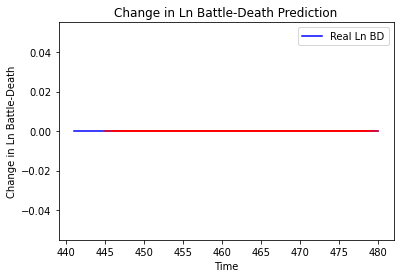

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_827"
_________________________________________________________________
Layer 

Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6014 - val_loss: 0.1550
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5912 - val_loss: 0.1550
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5927 - val_loss: 0.1549
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5924 - val_loss: 0.1548
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5952 - val_loss: 0.1547
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5961 - val_loss: 0.1547
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5918 - val_loss: 0.1546
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5970 - val_loss: 0.1546
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5936 - val_loss: 0.1545
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5908 - val_loss: 0.1545
Epoch 75/100
4

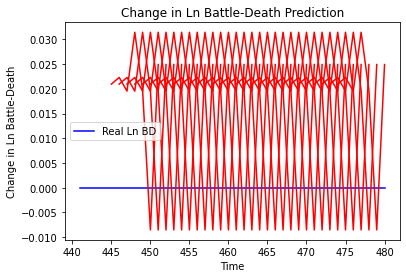

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.000439763396732077, 'mae': 0.020970536395907402, 'r2': 0.0, 'tadda_score': 0.020970536395907402}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.0018737419273442413, 'mae': 0.04328674077987671, 'r2': 0.0, 'tadda_score': 0.04328674077987671}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0039484966455951565, 'mae': 0.06283706426620483, 'r2': 0.0, 'tadda_score': 0.06283706426620483}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.008893315210243335, 'mae': 0.09430437535047531, 'r2': 0.0, 'tadda_score': 0.09430437535047531}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.008402656573825384, 'mae': 0.09166600555181503, 'r2': 0.0, 'tadda_score': 0.09166600555181503}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.006909380853317382, 'mae': 0.0831

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 

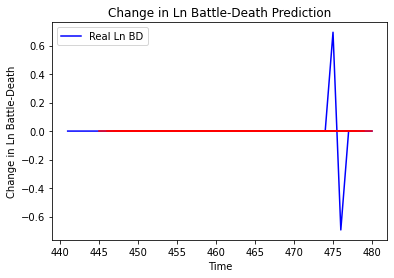

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_829"
_________________________________________________________________
Layer (type)                 Output Shape      

4/4 [==============================] - 0s 8ms/step - loss: 1.2147 - val_loss: 4.2052e-04
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2206 - val_loss: 4.5681e-04
Epoch 64/100
4/4 [==============================] - ETA: 0s - loss: 0.439 - 0s 8ms/step - loss: 1.2331 - val_loss: 4.7663e-04
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2205 - val_loss: 4.7017e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2129 - val_loss: 4.9301e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2328 - val_loss: 5.4302e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2179 - val_loss: 5.2019e-04
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2322 - val_loss: 5.2451e-04
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2220 - val_loss: 5.1425e-04
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss:

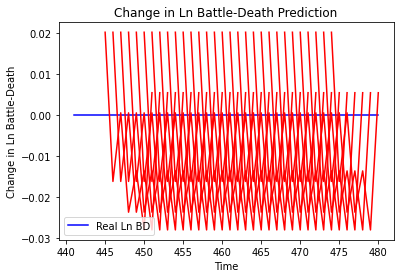

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.00040591915187176975, 'mae': 0.02014743536710739, 'r2': 0.0, 'tadda_score': 0.02014743536710739}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 1.5921706251090934e-05, 'mae': 0.0039902012795209885, 'r2': 0.0, 'tadda_score': 0.0039902012795209885}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 2.0462329111348154e-05, 'mae': 0.004523530602455139, 'r2': 0.0, 'tadda_score': 0.004523530602455139}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00036548324599700033, 'mae': 0.01911761611700058, 'r2': 0.0, 'tadda_score': 0.01911761611700058}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0002742100776317903, 'mae': 0.016559289768338203, 'r2': 0.0, 'tadda_score': 0.016559289768338203}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.00198188362516305, 'mae': 0.044518351554870605, 'r2': 0.

Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [============================

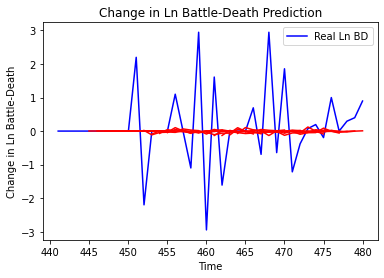

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6728777602327898, 'mae': 0.831422920400816, 'r2': -0.014429634460072283, 'tadda_score': 0.8434600011755206}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2150332826070618, 'mae': 0.7370785756426464, 'r2': -0.026753795531625046, 'tadda_score': 0.7494999330570212}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0932917999095317, 'mae': 0.9241985806626644, 'r2': -0.04999827287720415, 'tadda_score': 0.9472416889750774}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.4440794884031924, 'mae': 1.0379702950424712, 'r2': -0.10101996788729517, 'tadda_score': 1.0679206189451627}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.340032703851661, 'mae': 0.9477005131985199, 'r2': -0.12254311793641759, 'tadda_score': 0.9634859783396573}
{'country': 'Burkina Faso', 'country_id': 47, 's

4/4 [==============================] - 0s 8ms/step - loss: 0.2572 - val_loss: 6.1912e-06
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2590 - val_loss: 7.7226e-06
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2567 - val_loss: 6.2294e-06
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2576 - val_loss: 4.8803e-06
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2583 - val_loss: 5.0500e-06
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2581 - val_loss: 3.7149e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.2576 - val_loss: 5.8872e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2580 - val_loss: 6.7027e-06
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2574 - val_loss: 8.4266e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2605 - val_loss: 1.23

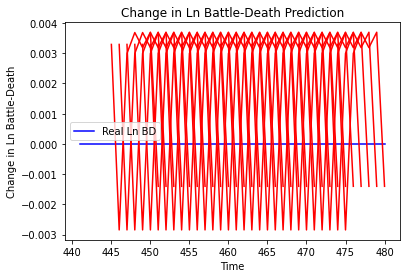

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 1.0838670781336069e-05, 'mae': 0.003292213659733534, 'r2': 0.0, 'tadda_score': 0.003292213659733534}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 1.9831843854709735e-07, 'mae': 0.00044532958418130875, 'r2': 0.0, 'tadda_score': 0.00044532958418130875}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 1.1834276804611197e-05, 'mae': 0.0034400983713567257, 'r2': 0.0, 'tadda_score': 0.0034400983713567257}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 5.076764895362799e-05, 'mae': 0.007125142030417919, 'r2': 0.0, 'tadda_score': 0.007125142030417919}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.00017316828477215163, 'mae': 0.013159342110157013, 'r2': 0.0, 'tadda_score': 0.013159342110157013}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.00028408222057644053, 'mae': 0.01685473881661892, 'r2'

Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6753 - val_loss: 6.7107e-05
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6805 - val_loss: 5.6386e-05
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6803 - val_loss: 5.8743e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6843 - val_loss: 6.2381e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6626 - val_loss: 6.3431e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6689 - val_loss: 5.4764e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6788 - val_loss: 5.5804e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6634 - val_loss: 4.4607e-05
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6783 - val_loss: 4.1786e-05
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6739 - 

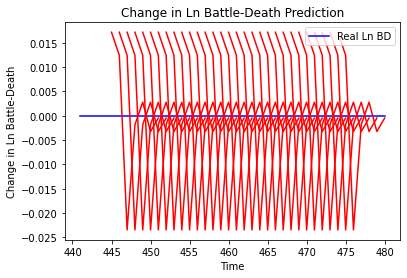

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.000294421694081462, 'mae': 0.017158720642328262, 'r2': 0.0, 'tadda_score': 0.017158720642328262}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.0008751564028173543, 'mae': 0.029583042487502098, 'r2': 0.0, 'tadda_score': 0.029583042487502098}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 3.762839710836144e-05, 'mae': 0.0061341989785432816, 'r2': 0.0, 'tadda_score': 0.0061341989785432816}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 1.8532635676169612e-05, 'mae': 0.004304954782128334, 'r2': 0.0, 'tadda_score': 0.004304954782128334}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 2.8402110498204625e-05, 'mae': 0.00532936304807663, 'r2': 0.0, 'tadda_score': 0.00532936304807663}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 7.328747193315055e-05, 

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3460 - val_loss: 3.1024
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3414 - val_loss: 3.1015
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3396 - val_loss: 3.1006
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.3485 - val_loss: 3.0999
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3469 - val_loss: 3.0991
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3385 - val_loss: 3.0983
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 1.3455 - val_loss: 3.0976
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.3494 - val_loss: 3.0969
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.3488 - val_loss: 3.0964
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.3393 - val_loss: 3.0957
Epoch 71/100

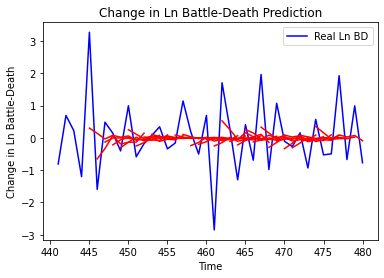

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.943690119435488, 'mae': 0.6881006764994436, 'r2': 0.2524724893892417, 'tadda_score': 0.7222630091137066}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.2237533194037726, 'mae': 0.8659071646327161, 'r2': -0.2639743015233238, 'tadda_score': 1.0473004451338832}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.254043805025991, 'mae': 0.9352101707714093, 'r2': -0.10461188778229813, 'tadda_score': 1.1171584478772971}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.6988050237257313, 'mae': 1.0674710114681318, 'r2': -0.13599283662025985, 'tadda_score': 1.2667947037650744}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.6044753365008124, 'mae': 1.0583594262433091, 'r2': -0.4818096617899872, 'tadda_score': 1.2722770329087516}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7299745921002825, 'mae': 1.11084

4/4 [==============================] - 0s 9ms/step - loss: 1.6788 - val_loss: 0.4016
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6755 - val_loss: 0.4016
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6736 - val_loss: 0.4016
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6706 - val_loss: 0.4017
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6664 - val_loss: 0.4018
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6760 - val_loss: 0.4019
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6654 - val_loss: 0.4021
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6616 - val_loss: 0.4021
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6574 - val_loss: 0.4022
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6614 - val_loss: 0.4021
Epoch 71/100
4/4 [===============

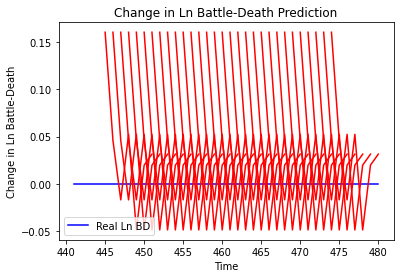

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.025812803463169054, 'mae': 0.1606636345386505, 'r2': 0.0, 'tadda_score': 0.1606636345386505}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.042718297741433986, 'mae': 0.20668405294418335, 'r2': 0.0, 'tadda_score': 0.20668405294418335}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.035962578101603526, 'mae': 0.18963801860809326, 'r2': 0.0, 'tadda_score': 0.18963801860809326}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.05859837757300945, 'mae': 0.2420710176229477, 'r2': 0.0, 'tadda_score': 0.2420710176229477}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.021653392915857106, 'mae': 0.147150918841362, 'r2': 0.0, 'tadda_score': 0.147150918841362}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.027862198952107953, 'mae': 0.1669197380542755, 'r2': 0.0, 'tadda_score': 0.1669197

4/4 [==============================] - 0s 8ms/step - loss: 2.1611 - val_loss: 2.9681e-04
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1594 - val_loss: 2.7608e-04
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1618 - val_loss: 2.5687e-04
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1497 - val_loss: 2.6602e-04
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1594 - val_loss: 2.6800e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1610 - val_loss: 2.8551e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1511 - val_loss: 2.8054e-04
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.1659 - val_loss: 2.8023e-04
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1571 - val_loss: 3.0205e-04
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.1651 - val_loss: 2.9

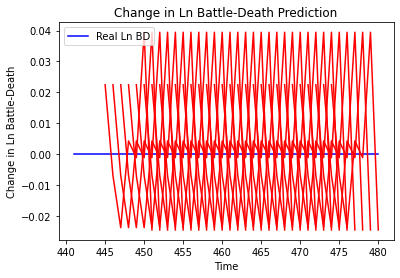

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.0005053488840778275, 'mae': 0.022479966282844543, 'r2': 0.0, 'tadda_score': 0.022479966282844543}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.00024309447586667865, 'mae': 0.015591487288475037, 'r2': 0.0, 'tadda_score': 0.015591487288475037}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 6.596744232206797e-05, 'mae': 0.0081220343708992, 'r2': 0.0, 'tadda_score': 0.0081220343708992}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 1.4473229800333366e-05, 'mae': 0.003804369829595089, 'r2': 0.0, 'tadda_score': 0.003804369829595089}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 3.981496890099502e-06, 'mae': 0.0019953688606619835, 'r2': 0.0, 'tadda_score': 0.0019953688606619835}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.0017182011248084855, 'mae': 

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - ETA: 0s - loss: 0.0000e+0 - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [=============

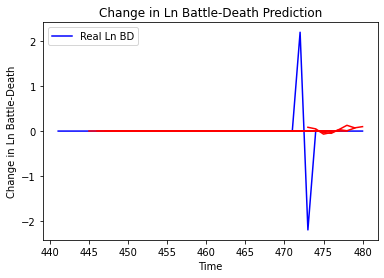

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6615 - val_loss: 9.6212e-05
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6607 - val_loss: 9.2445e-05
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6581 - val_loss: 9.4111e-05
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6580 - val_loss: 8.7215e-05
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.6580 - val_loss: 9.0753e-05
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6591 - val_loss: 7.9009e-05
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6571 - val_loss: 7.7212e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6593 - val_loss: 9.3514e-05
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6573 - val_loss: 9.7405e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.6571 - v

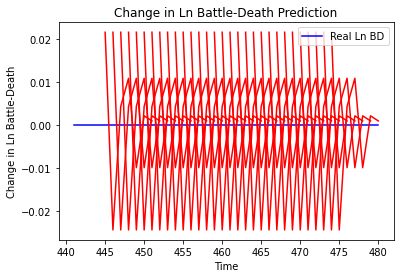

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.000463850084762938, 'mae': 0.02153717912733555, 'r2': 0.0, 'tadda_score': 0.02153717912733555}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 8.210422037666781e-06, 'mae': 0.0028653834015130997, 'r2': 0.0, 'tadda_score': 0.0028653834015130997}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 2.131491051480562e-06, 'mae': 0.0014599626883864403, 'r2': 0.0, 'tadda_score': 0.0014599626883864403}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.00015128075722476656, 'mae': 0.012299624271690845, 'r2': 0.0, 'tadda_score': 0.012299624271690845}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.0007166576009282194, 'mae': 0.026770461350679398, 'r2': 0.0, 'tadda_score': 0.026770461350679398}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.0008340966885949687, 'mae': 0.028880732133984566, 

4/4 [==============================] - 0s 8ms/step - loss: 1.9963 - val_loss: 0.1415
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9798 - val_loss: 0.1415
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0019 - val_loss: 0.1415
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9916 - val_loss: 0.1415
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9780 - val_loss: 0.1415
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9905 - val_loss: 0.1415
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9912 - val_loss: 0.1416
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9759 - val_loss: 0.1417
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 2.0180 - val_loss: 0.1419
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9738 - val_loss: 0.1421
Epoch 71/100
4/4 [===============

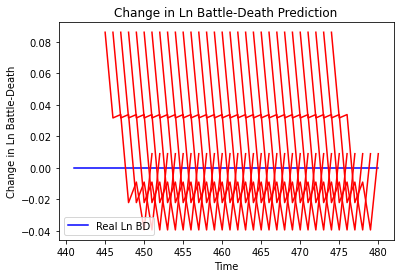

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.0074201533952905074, 'mae': 0.08614031225442886, 'r2': 0.0, 'tadda_score': 0.08614031225442886}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.013898238391549578, 'mae': 0.11789079010486603, 'r2': 0.0, 'tadda_score': 0.11789079010486603}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.023037030988828144, 'mae': 0.15177954733371735, 'r2': 0.0, 'tadda_score': 0.15177954733371735}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.01684632811981146, 'mae': 0.12979340553283691, 'r2': 0.0, 'tadda_score': 0.12979340553283691}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.00793264729352089, 'mae': 0.08906541019678116, 'r2': 0.0, 'tadda_score': 0.08906541019678116}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.0024728412480037876, 'mae': 0.0497276708483696, 'r2': 0.0, 'tadda_score': 

4/4 [==============================] - 0s 8ms/step - loss: 4.7632 - val_loss: 2.6131
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7553 - val_loss: 2.6110
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7766 - val_loss: 2.6087
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7469 - val_loss: 2.6064
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7352 - val_loss: 2.6041
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7680 - val_loss: 2.6018
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7202 - val_loss: 2.5996
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 4.7117 - val_loss: 2.5975
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7499 - val_loss: 2.5956
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7341 - val_loss: 2.5935
Epoch 71/100
4/4 [==============

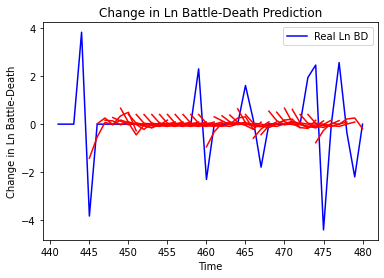

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0759669264131753, 'mae': 0.7636757923777904, 'r2': 0.2113073571613645, 'tadda_score': 0.8090217305835093}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.8499527750727065, 'mae': 1.1893710264247366, 'r2': -0.42837911365389414, 'tadda_score': 1.2969322441698816}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.9199643323755877, 'mae': 1.2092901909035154, 'r2': -0.4634684832183662, 'tadda_score': 1.33223737912195}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.961338922333877, 'mae': 1.1970706988058197, 'r2': -0.4842051777521579, 'tadda_score': 1.3253470389725475}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.5114909055838877, 'mae': 1.0020148578963386, 'r2': -0.2587440693911889, 'tadda_score': 1.0882790976446577}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.0105698753

4/4 [==============================] - 0s 9ms/step - loss: 0.9230 - val_loss: 1.0500
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9214 - val_loss: 1.0496
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9268 - val_loss: 1.0493
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9211 - val_loss: 1.0490
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9245 - val_loss: 1.0488
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9189 - val_loss: 1.0485
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9215 - val_loss: 1.0483
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9220 - val_loss: 1.0480
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.9191 - val_loss: 1.0477
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9130 - val_loss: 1.0474
Epoch 70/100
4/4 [===============

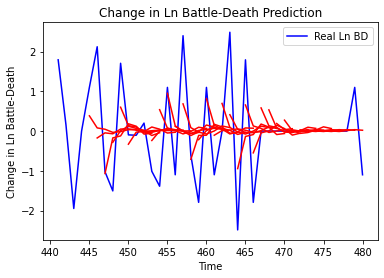

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.0546641193166708, 'mae': 0.769608627882064, 'r2': 0.33871441571114147, 'tadda_score': 0.798340753156901}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.368536358318697, 'mae': 1.1481253225601094, 'r2': -0.4063271091645497, 'tadda_score': 1.401220243510741}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.5255777041386174, 'mae': 1.222347734585008, 'r2': -0.4078955842163807, 'tadda_score': 1.47694088310212}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.6196335581861736, 'mae': 1.2215722651352512, 'r2': -0.2831976483051668, 'tadda_score': 1.4217158788015474}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.8078769620541586, 'mae': 0.9773658653029942, 'r2': -0.3433768475964347, 'tadda_score': 1.1337102639108045}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.8983907611786028, 'm

4/4 [==============================] - 0s 9ms/step - loss: 0.1897 - val_loss: 1.5137
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1904 - val_loss: 1.5134
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1902 - val_loss: 1.5131
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1898 - val_loss: 1.5128
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1922 - val_loss: 1.5126
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1889 - val_loss: 1.5124
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1889 - val_loss: 1.5122
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1892 - val_loss: 1.5118
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1890 - val_loss: 1.5115
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1881 - val_loss: 1.5111
Epoch 70/100
4/4 [==============

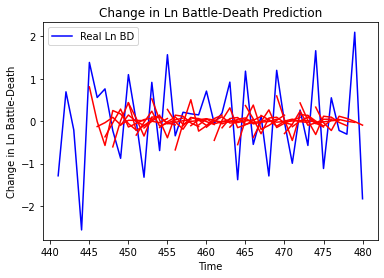

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.530817151981328, 'mae': 0.628364033022422, 'r2': 0.2792290979582849, 'tadda_score': 0.6749056754821524}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.1960315595587157, 'mae': 0.9473678682502664, 'r2': -0.6203631113186932, 'tadda_score': 1.1884918661049562}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.078154822258255, 'mae': 0.8311477537886418, 'r2': -0.10015461257727276, 'tadda_score': 0.8787112868389604}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.104118743769122, 'mae': 0.8409389501511633, 'r2': -0.2536979642237489, 'tadda_score': 0.9433507812593956}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.3422167033891585, 'mae': 0.9312517644106869, 'r2': -0.3493884725322254, 'tadda_score': 1.080570027097019}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.651336298281

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7728 - val_loss: 2.3063
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7767 - val_loss: 2.3056
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7718 - val_loss: 2.3049
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7726 - val_loss: 2.3044
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7723 - val_loss: 2.3038
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7702 - val_loss: 2.3031
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7694 - val_loss: 2.3024
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.7697 - val_loss: 2.3018
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7677 - val_loss: 2.3009
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7730 - val_loss: 2.3003
Epoch 71/100
4/4 [==

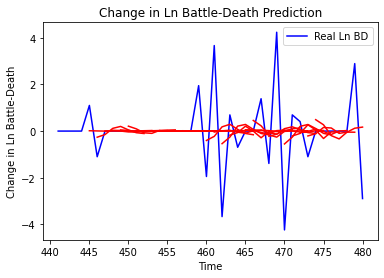

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.32630611975853, 'mae': 0.9301290802388316, 'r2': 0.12040103421897097, 'tadda_score': 0.9471083293710078}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.5022660319901038, 'mae': 0.8173522970275852, 'r2': -0.026156786310769897, 'tadda_score': 0.8504595297025416}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.327742212041414, 'mae': 0.9352615547345458, 'r2': 0.006859436821384346, 'tadda_score': 0.9772439003901063}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.4554666686500983, 'mae': 0.8513704005211215, 'r2': -0.015643248948463695, 'tadda_score': 0.8582828806295614}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.590302935485298, 'mae': 0.8962700786372497, 'r2': -0.022156702849433385, 'tadda_score': 0.92688308

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.5430
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 

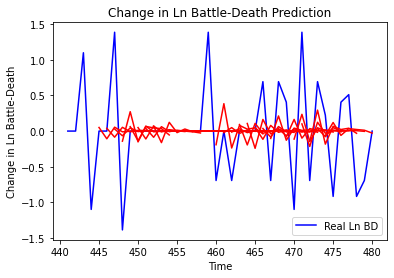

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3651853187789254, 'mae': 0.3967220090508796, 'r2': 0.11543280394620359, 'tadda_score': 0.40145818294886126}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.3962125943951655, 'mae': 0.4276153207999826, 'r2': 0.03714155191693158, 'tadda_score': 0.43987269556098785}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.48748609489700107, 'mae': 0.46950833708157397, 'r2': -0.020263180843699047, 'tadda_score': 0.47343516738573965}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4946966004659346, 'mae': 0.4581962783557486, 'r2': -0.024493775673739115, 'tadda_score': 0.46024838757860775}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.5285502142988981, 'mae': 0.5035188730104034, 'r2': -0.20141807814592538, 'tadda_score': 0.5497895432554946}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.57

Epoch 56/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [============================

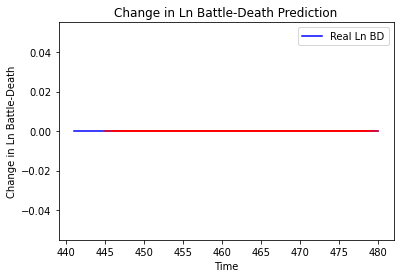

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_845"
_________________________________________________________________
Layer (type)                 Output S

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms/

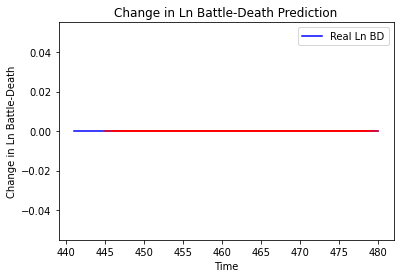

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_846"
_______________________________

4/4 [==============================] - 0s 8ms/step - loss: 0.8550 - val_loss: 1.8615
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8505 - val_loss: 1.8609
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8556 - val_loss: 1.8602
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8497 - val_loss: 1.8596
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8579 - val_loss: 1.8589
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8527 - val_loss: 1.8582
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.8514 - val_loss: 1.8576
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8419 - val_loss: 1.8570
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8500 - val_loss: 1.8562
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.8425 - val_loss: 1.8555
Epoch 74/100
4/4 [===============

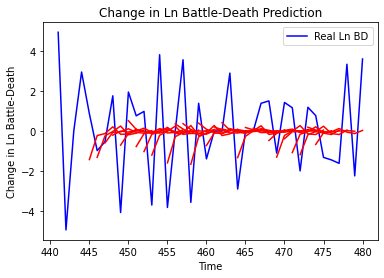

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.230886069173771, 'mae': 1.4824710557511964, 'r2': 0.2541586579634587, 'tadda_score': 1.682703266009839}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 5.806049014072685, 'mae': 2.03798626117894, 'r2': -0.478567392410576, 'tadda_score': 2.3957088952560124}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.368936374496969, 'mae': 1.8048120481964018, 'r2': -0.386235066421418, 'tadda_score': 2.1864159169987896}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 5.1607827969078155, 'mae': 1.89745980992016, 'r2': -0.13743083882035934, 'tadda_score': 2.148646998967695}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 6.80347662342524, 'mae': 2.089901504088075, 'r2': -0.23680951783096127, 'tadda_score': 2.379542754882208}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 6.108697496372914, 'mae': 1.9377469986958

4/4 [==============================] - 0s 8ms/step - loss: 0.5601 - val_loss: 1.0751
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5553 - val_loss: 1.0746
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5525 - val_loss: 1.0741
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5617 - val_loss: 1.0737
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5548 - val_loss: 1.0733
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5519 - val_loss: 1.0730
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5600 - val_loss: 1.0728
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5570 - val_loss: 1.0726
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5593 - val_loss: 1.0724
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5490 - val_loss: 1.0721
Epoch 71/100
4/4 [===============

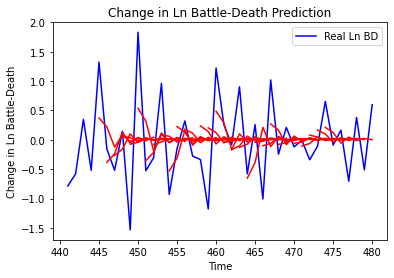

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.40113434482303634, 'mae': 0.48530635723757015, 'r2': 0.29811033166896816, 'tadda_score': 0.5236142051273313}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.8403822678097487, 'mae': 0.7295162556601793, 'r2': -0.5531852666299886, 'tadda_score': 0.9099371282292634}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.7876862384772465, 'mae': 0.7076789467918135, 'r2': -0.2856198116743969, 'tadda_score': 0.8567281647907949}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.9879763276566639, 'mae': 0.7494870063991053, 'r2': -0.3281467641834983, 'tadda_score': 0.9428170670897467}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.7101750705316019, 'mae': 0.6574830254799285, 'r2': -0.3871606953572466, 'tadda_score': 0.7784983728029985}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.68552523570

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

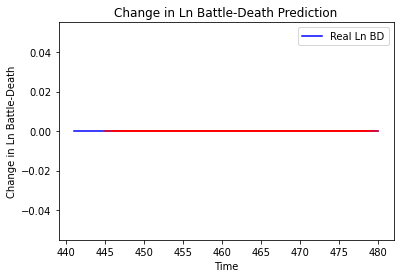

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_849"
____

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

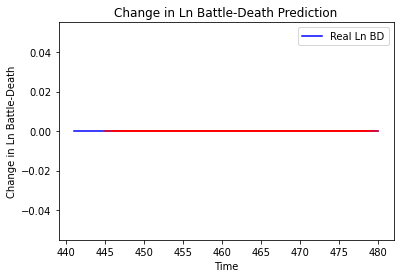

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_850"
_________________________________________________________________
Layer (type)                 Output Shape             

4/4 [==============================] - 0s 9ms/step - loss: 2.6224 - val_loss: 0.3780
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6123 - val_loss: 0.3779
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6250 - val_loss: 0.3779
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6216 - val_loss: 0.3779
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 2.6137 - val_loss: 0.3778
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6063 - val_loss: 0.3778
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 2.6150 - val_loss: 0.3777
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 2.6284 - val_loss: 0.3777
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6166 - val_loss: 0.3776
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6094 - val_loss: 0.3776
Epoch 75/100
4/4 [============

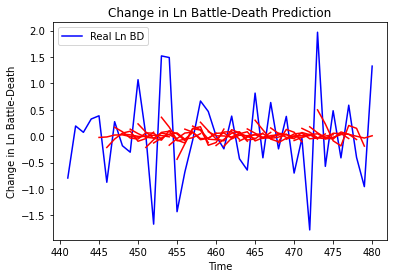

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.6189557709984376, 'mae': 0.6190847942138135, 'r2': 0.1874935296210004, 'tadda_score': 0.6742303141235728}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.18319657873958, 'mae': 0.7994256312276055, 'r2': -0.20656552884184487, 'tadda_score': 0.9291114749635389}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.0078309724668393, 'mae': 0.7714877670531344, 'r2': -0.26279809600138915, 'tadda_score': 0.8985658792058498}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.7873068473888083, 'mae': 0.7266826841716766, 'r2': -0.1357921592522009, 'tadda_score': 0.7924782575155099}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8803143213853128, 'mae': 0.695491757455858, 'r2': -0.14193744224571825, 'tadda_score': 0.7938623277727687}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.75100527

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/

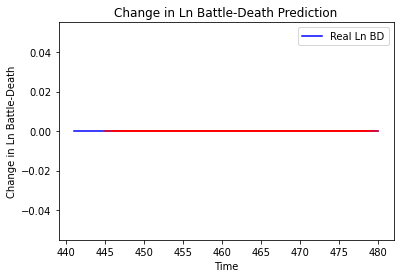

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_852"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 8ms/step - loss: 1.9370 - val_loss: 1.6314
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9120 - val_loss: 1.6309
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9158 - val_loss: 1.6301
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9311 - val_loss: 1.6295
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9252 - val_loss: 1.6290
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9208 - val_loss: 1.6284
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9283 - val_loss: 1.6278
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9170 - val_loss: 1.6273
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9363 - val_loss: 1.6268
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9168 - val_loss: 1.6263
Epoch 75/100
4/4 [===============

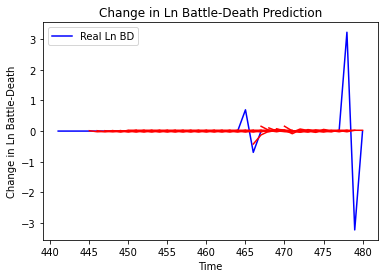

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.020208649006182924, 'mae': 0.05729849710780463, 'r2': 0.36907517215751584, 'tadda_score': 0.05729849710780463}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.05343006652473662, 'mae': 0.09055690013833922, 'r2': -0.6681152467647937, 'tadda_score': 0.09692562247035982}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.05031438081784579, 'mae': 0.09955500705508473, 'r2': -0.570841872991517, 'tadda_score': 0.10357270774461907}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.04548901886568432, 'mae': 0.08485008384752354, 'r2': -0.4201914926512138, 'tadda_score': 0.0871131678394286}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.04170388870307583, 'mae': 0.07430735565441929, 'r2': -0.3020177050083832, 'tadda_score': 0.07791620716172538}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 'm

4/4 [==============================] - 0s 8ms/step - loss: 2.5064 - val_loss: 0.1836
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4976 - val_loss: 0.1836
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 2.5072 - val_loss: 0.1835
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.5042 - val_loss: 0.1834
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4982 - val_loss: 0.1833
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 2.4953 - val_loss: 0.1833
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4959 - val_loss: 0.1832
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.5131 - val_loss: 0.1832
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4823 - val_loss: 0.1831
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4966 - val_loss: 0.1830
Epoch 70/100
4/4 [===============

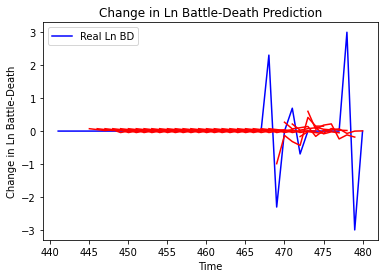

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.2591877010448764, 'mae': 0.24007938402528126, 'r2': 0.32764105256945164, 'tadda_score': 0.24007938402528126}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.5131044850370594, 'mae': 0.3602950495743211, 'r2': -0.33104460624726295, 'tadda_score': 0.39332018318409284}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.4217381759654369, 'mae': 0.36775671775556085, 'r2': -0.5111294626902785, 'tadda_score': 0.38543799803074674}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.47859561382971677, 'mae': 0.4066882081729722, 'r2': -0.29721401268997316, 'tadda_score': 0.4066882081729722}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.5519613275792261, 'mae': 0.3215071094932707, 'r2': -0.49606880612467963, 'tadda_score': 0.34681662647948186}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.441

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

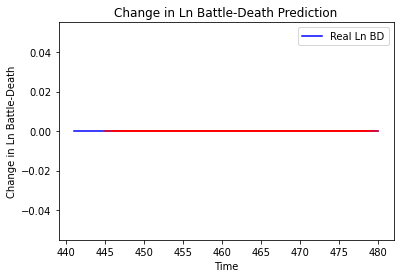

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_855"
_________________________________________________________________
Layer (type)                 Out

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - ETA: 0s - loss: 0.0000e+0 - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [=============

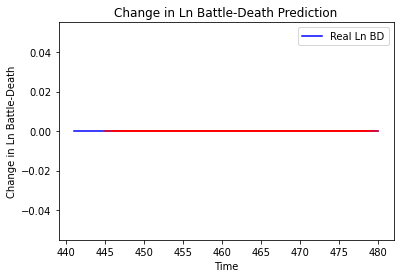

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_856"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 10ms/step - loss: 0.1271 - val_loss: 1.9070e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1281 - val_loss: 1.1122e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1283 - val_loss: 6.5785e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1288 - val_loss: 8.9229e-06
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1291 - val_loss: 4.8639e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1270 - val_loss: 3.8936e-06
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1279 - val_loss: 3.0686e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1298 - val_loss: 1.5421e-06
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1279 - val_loss: 1.8903e-06
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1276 - val_loss: 

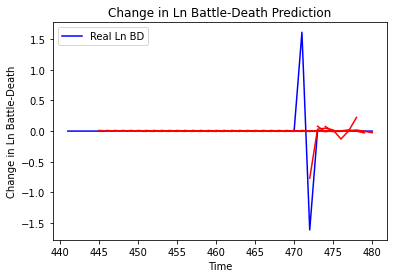

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.10932548644192398, 'mae': 0.09563983018893395, 'r2': 0.36691179473934576, 'tadda_score': 0.09563983018893395}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.19754995850604157, 'mae': 0.14413807852887509, 'r2': -0.14398346396880268, 'tadda_score': 0.14641983473125494}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.1949312939101089, 'mae': 0.1445693731749892, 'r2': -0.1288191530366094, 'tadda_score': 0.14679708857783075}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.10075037194247605, 'mae': 0.08888907472018598, 'r2': -0.2070985122902993, 'tadda_score': 0.08888907472018598}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10868440382310336, 'mae': 0.09953679500494597, 'r2': -0.30215680234839604, 'tadda_score': 0.09953679500494597}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', '

4/4 [==============================] - 0s 8ms/step - loss: 0.1422 - val_loss: 9.3142e-06
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1418 - val_loss: 7.7019e-06
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1416 - val_loss: 4.2569e-06
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1418 - val_loss: 4.1838e-06
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1434 - val_loss: 7.0080e-06
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1409 - val_loss: 9.3813e-06
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1408 - val_loss: 1.0578e-05
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1430 - val_loss: 9.6109e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1423 - val_loss: 7.5733e-06
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1420 - val_loss: 7.13

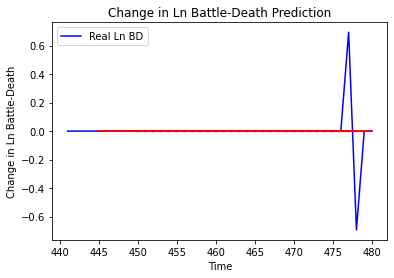

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 7.309486219964946e-06, 'mae': 0.0027036061510443687, 'r2': 0.0, 'tadda_score': 0.0027036061510443687}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 1.183411661308969e-05, 'mae': 0.0034400750882923603, 'r2': 0.0, 'tadda_score': 0.0034400750882923603}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 6.711714699067029e-06, 'mae': 0.0025906977243721485, 'r2': 0.0, 'tadda_score': 0.0025906977243721485}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 7.496185707005015e-06, 'mae': 0.0027379163075238466, 'r2': 0.0, 'tadda_score': 0.0027379163075238466}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 6.907894133798692e-06, 'mae': 0.002628287300467491, 'r2': 0.0, 'tadda_score': 0.002628287300467491}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 1.5813640024406675e-08, 'mae': 0.0001257522962

Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [===========================

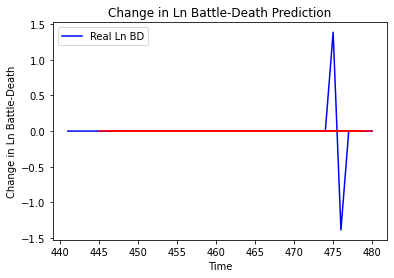

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_859"
_________________________________________________________________
Layer (type)                 O

4/4 [==============================] - 0s 8ms/step - loss: 1.2780 - val_loss: 0.7901
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2376 - val_loss: 0.7899
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2837 - val_loss: 0.7898
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2813 - val_loss: 0.7897
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2373 - val_loss: 0.7895
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2590 - val_loss: 0.7894
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2490 - val_loss: 0.7892
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2866 - val_loss: 0.7890
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 1.2577 - val_loss: 0.7887
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2395 - val_loss: 0.7885
Epoch 75/100
4/4 [===============

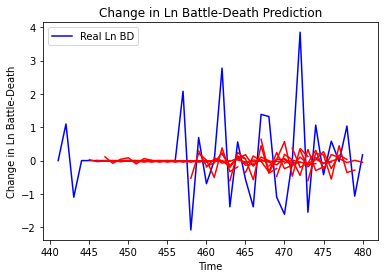

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.2164313762682541, 'mae': 0.6853685497158862, 'r2': 0.22695258229090665, 'tadda_score': 0.6914336787699756}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.05845275610005, 'mae': 0.910427152983541, 'r2': -0.07585356725725201, 'tadda_score': 0.9595981093716569}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.0479369220498365, 'mae': 1.0233059099909148, 'r2': -0.07007377852151642, 'tadda_score': 1.0698262523583053}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.792255859437914, 'mae': 0.9521831400234463, 'r2': -0.18926463835628282, 'tadda_score': 1.0781932999232375}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.0774807344912278, 'mae': 0.689338354734572, 'r2': -0.31561180991474713, 'tadda_score': 0.7684033922533117}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6',

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/

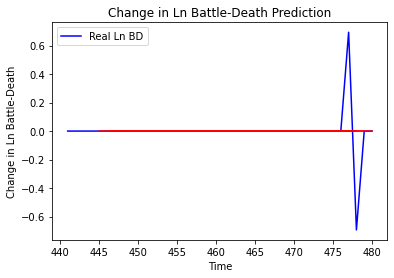

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_861"
_______________________________________________________

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/

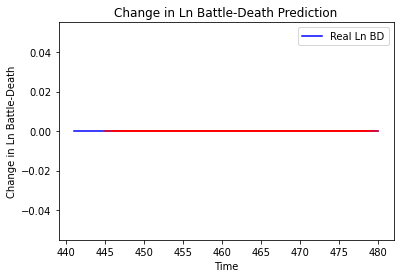

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_862"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 9ms/step - loss: 3.3400 - val_loss: 0.0967
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3300 - val_loss: 0.0966
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3264 - val_loss: 0.0966
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3249 - val_loss: 0.0966
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3232 - val_loss: 0.0967
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3282 - val_loss: 0.0968
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3228 - val_loss: 0.0968
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3210 - val_loss: 0.0969
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3235 - val_loss: 0.0970
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 3.3329 - val_loss: 0.0970
Epoch 74/100
4/4 [===============

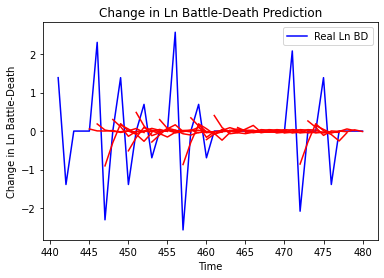

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.8607541919503808, 'mae': 0.5943988196489255, 'r2': 0.3235779620667709, 'tadda_score': 0.595375385563775}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.7123269679973256, 'mae': 0.9018094899070304, 'r2': -0.34562887771279915, 'tadda_score': 0.9948683379155437}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.0442944541430288, 'mae': 0.6939195708110738, 'r2': -0.19059434138645237, 'tadda_score': 0.7158877744699327}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.004139463760187, 'mae': 0.7027360763380258, 'r2': 0.06450300408331244, 'tadda_score': 0.7070520022242595}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.148670886055505, 'mae': 0.6429402680482181, 'r2': -0.17319394716431447, 'tadda_score': 0.6788247616376194}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.35737216184186

4/4 [==============================] - 0s 8ms/step - loss: 1.9152 - val_loss: 0.3569
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9127 - val_loss: 0.3569
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9128 - val_loss: 0.3569
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9177 - val_loss: 0.3568
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9191 - val_loss: 0.3568
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9073 - val_loss: 0.3568
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 1.9138 - val_loss: 0.3567
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9080 - val_loss: 0.3567
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 1.9065 - val_loss: 0.3567
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9010 - val_loss: 0.3567
Epoch 71/100
4/4 [============

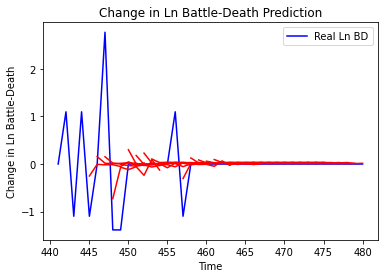

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.39814835389026443, 'mae': 0.30589925852446126, 'r2': 0.20957810738626603, 'tadda_score': 0.30589925852446126}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8814298350005153, 'mae': 0.5069012148792746, 'r2': -0.15984040842017588, 'tadda_score': 0.5542501681660814}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.7602271403808292, 'mae': 0.472107350480598, 'r2': -0.28178650594968335, 'tadda_score': 0.5210823957145629}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.8066682556333492, 'mae': 0.5091600446920015, 'r2': -0.16128698493511662, 'tadda_score': 0.565886485479317}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.8089533011485425, 'mae': 0.5076324412246961, 'r2': -0.3639416041319221, 'tadda_score': 0.5646201033413827}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.803121994438961

4/4 [==============================] - 0s 9ms/step - loss: 3.0209 - val_loss: 3.1955
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0025 - val_loss: 3.1944
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0186 - val_loss: 3.1934
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0050 - val_loss: 3.1924
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0010 - val_loss: 3.1915
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0068 - val_loss: 3.1907
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0133 - val_loss: 3.1900
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0153 - val_loss: 3.1893
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0090 - val_loss: 3.1888
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 3.0158 - val_loss: 3.1883
Epoch 71/100
4/4 [===============

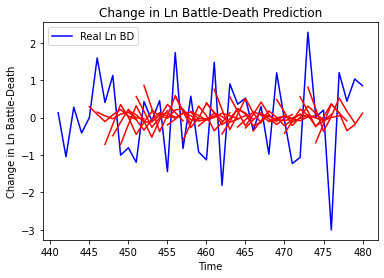

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.9334053431690822, 'mae': 0.8246953510127766, 'r2': 0.14717059637212027, 'tadda_score': 0.9679885300876998}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.4432315105369926, 'mae': 1.2451259367262542, 'r2': -0.7279791840808032, 'tadda_score': 1.590906320273401}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.2806212370422534, 'mae': 1.174157855765136, 'r2': -0.32214840041185977, 'tadda_score': 1.399023226753982}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.498393076230504, 'mae': 1.24922915301654, 'r2': -0.4340625786022443, 'tadda_score': 1.4769824482692606}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 2.9395264195832285, 'mae': 1.33879378935616, 'r2': -0.6012864653590939, 'tadda_score': 1.6552708824567077}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse'

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 9m

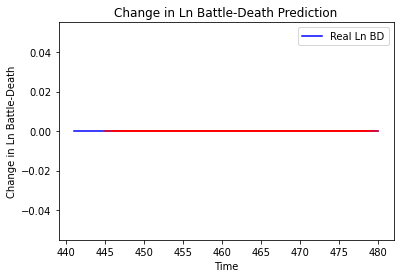

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_866"
_________________________________________________________________
Layer (type)                 Output Shap

4/4 [==============================] - 0s 9ms/step - loss: 0.1405 - val_loss: 1.3327e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1398 - val_loss: 1.6689e-05
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1413 - val_loss: 1.9029e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1400 - val_loss: 2.2737e-05
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1400 - val_loss: 1.8779e-05
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1409 - val_loss: 9.5021e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1399 - val_loss: 3.4993e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1391 - val_loss: 1.6409e-06
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1394 - val_loss: 2.3582e-06
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1406 - val_loss: 3.

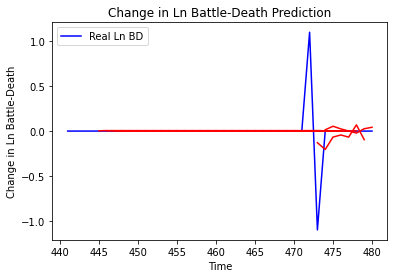

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07136503104706902, 'mae': 0.07180552218440366, 'r2': 0.11307312863889918, 'tadda_score': 0.07180552218440366}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.0887308201745629, 'mae': 0.09411707605566275, 'r2': -0.10274944992070667, 'tadda_score': 0.09637819514319988}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.04513011839943911, 'mae': 0.06316249347923046, 'r2': -0.16043836718576054, 'tadda_score': 0.06316249347923046}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.046403722431401576, 'mae': 0.06376053885567036, 'r2': -0.19318676306211824, 'tadda_score': 0.06376053885567036}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04314231204582838, 'mae': 0.050234647939705314, 'r2': -0.10932556622102418, 'tadda_score': 0.050234647939705314}
{'country': 'Namibia', 'country_id': 170, 'step': 't

Epoch 56/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [============================

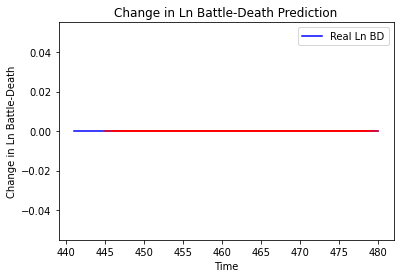

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_868"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 8ms

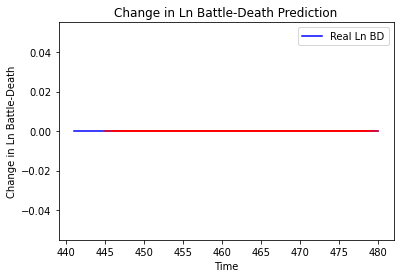

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_869"
_________________________________________________________________
Layer (ty

4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/

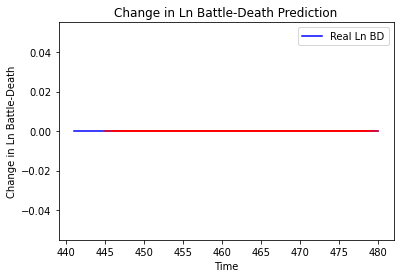

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_870"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 8ms/step - loss: 0.0612 - val_loss: 2.2455
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2455
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0612 - val_loss: 2.2455
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2456
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0612 - val_loss: 2.2456
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2455
Epoch 71/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0612 - val_loss: 2.2456
Epoch 72/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2456
Epoch 73/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2456
Epoch 74/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0611 - val_loss: 2.2456
Epoch 75/100
4/4 [===============

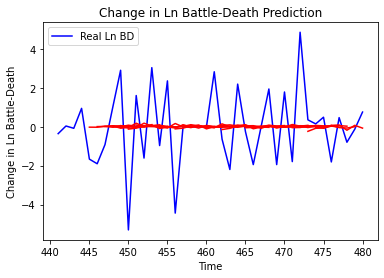

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.7112517631831485, 'mae': 1.6786799583273548, 'r2': 0.02773300176825466, 'tadda_score': 1.6904836938367145}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.567675113433157, 'mae': 1.8132192446147313, 'r2': -0.027771788127620267, 'tadda_score': 1.8532016849373687}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.511554037177684, 'mae': 2.129216543180191, 'r2': -0.011992353284487667, 'tadda_score': 2.166164483718518}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 5.946959498033578, 'mae': 1.9926422981515493, 'r2': -0.0276702914945115, 'tadda_score': 2.0243505834882423}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.48378100186341, 'mae': 2.303227617307028, 'r2': -0.028531642772699817, 'tadda_score': 2.3498192696159284}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.495969983772579, 'mae

4/4 [==============================] - 0s 8ms/step - loss: 5.1940 - val_loss: 0.8597
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1962 - val_loss: 0.8591
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1907 - val_loss: 0.8584
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1714 - val_loss: 0.8580
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1790 - val_loss: 0.8574
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1729 - val_loss: 0.8569
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1705 - val_loss: 0.8564
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1710 - val_loss: 0.8558
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 5.1551 - val_loss: 0.8553
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1682 - val_loss: 0.8547
Epoch 71/100
4/4 [===============

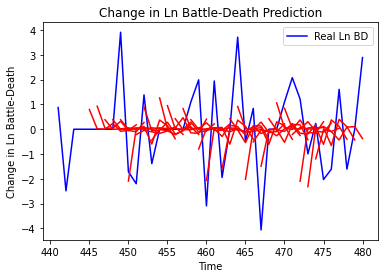

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.5351676347515233, 'mae': 1.294191930658905, 'r2': 0.13635718357850568, 'tadda_score': 1.4545700266632322}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.30483087582921, 'mae': 1.9864249385748616, 'r2': -0.48532414048344363, 'tadda_score': 2.411813119287721}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 8.122467120131734, 'mae': 2.250077825389309, 'r2': -0.5552289241700712, 'tadda_score': 2.7189548620104826}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.55682224534377, 'mae': 2.9099915617722445, 'r2': -0.8952035497349162, 'tadda_score': 3.617909939117052}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 10.60630318586647, 'mae': 2.6264203674664963, 'r2': -1.2325015375931994, 'tadda_score': 3.339556152827627}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.426701056956751, 'mae': 2.16950542

4/4 [==============================] - 0s 8ms/step - loss: 0.5817 - val_loss: 2.4409
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5781 - val_loss: 2.4389
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5802 - val_loss: 2.4369
Epoch 64/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5780 - val_loss: 2.4350
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5768 - val_loss: 2.4333
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5796 - val_loss: 2.4313
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5841 - val_loss: 2.4297
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5774 - val_loss: 2.4280
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5792 - val_loss: 2.4263
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.5773 - val_loss: 2.4246
Epoch 71/100
4/4 [===============

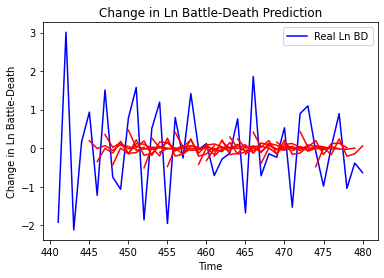

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.823242410163125, 'mae': 0.7663633104967196, 'r2': 0.2695565771938596, 'tadda_score': 0.8109222494619209}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.3649146933464051, 'mae': 0.9770363848342388, 'r2': -0.262108929477437, 'tadda_score': 1.138021878121683}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.2191193092117742, 'mae': 0.8835779817048748, 'r2': -0.3145221775104903, 'tadda_score': 1.0529385972662806}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.20871421811026, 'mae': 0.9265338975194896, 'r2': 0.018722659251999674, 'tadda_score': 1.043569051772734}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.5442313075793639, 'mae': 1.043817813540369, 'r2': -0.30165676923678353, 'tadda_score': 1.2754834262975752}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.2533445488083403, 'mae': 

Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6937 - val_loss: 8.0372e-04
Epoch 60/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6715 - val_loss: 8.5790e-04
Epoch 61/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6987 - val_loss: 8.6158e-04
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 2.7123 - val_loss: 8.4462e-04
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7001 - val_loss: 7.9207e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.6829 - val_loss: 7.7750e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 2.7045 - val_loss: 6.7712e-04
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6932 - val_loss: 5.9198e-04
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6928 - val_loss: 5.4977e-04
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 2.6975 - v

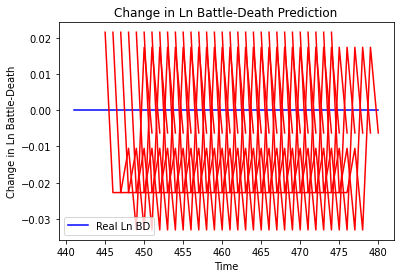

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.0004651614435452617, 'mae': 0.021567601710557938, 'r2': 0.0, 'tadda_score': 0.021567601710557938}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 1.3890889290074648e-06, 'mae': 0.001178596168756485, 'r2': 0.0, 'tadda_score': 0.001178596168756485}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.0005716632042060965, 'mae': 0.02390947937965393, 'r2': 0.0, 'tadda_score': 0.02390947937965393}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0011848234928244494, 'mae': 0.03442126512527466, 'r2': 0.0, 'tadda_score': 0.03442126512527466}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.0020010592021242474, 'mae': 0.0447332002222538, 'r2': 0.0, 'tadda_score': 0.0447332002222538}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.0007468240345903099, 'mae': 0.02732808142900467, 'r2': 0.0, 'tadd

4/4 [==============================] - 0s 8ms/step - loss: 0.1188 - val_loss: 1.7359
Epoch 62/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1172 - val_loss: 1.7352
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1179 - val_loss: 1.7344
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1176 - val_loss: 1.7337
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1178 - val_loss: 1.7330
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1180 - val_loss: 1.7321
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1176 - val_loss: 1.7313
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1165 - val_loss: 1.7304
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1172 - val_loss: 1.7295
Epoch 70/100
4/4 [==============================] - 0s 8ms/step - loss: 0.1173 - val_loss: 1.7286
Epoch 71/100
4/4 [===============

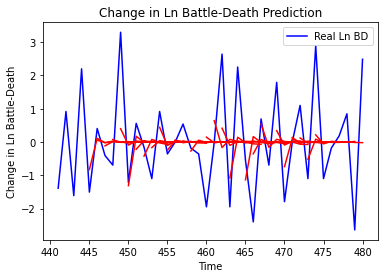

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4643358596676195, 'mae': 0.9001082931620986, 'r2': 0.29331797754571, 'tadda_score': 0.9146517365836214}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.375291550013826, 'mae': 1.2668073073660309, 'r2': -0.24432441404799787, 'tadda_score': 1.4694721320653932}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.459782351931181, 'mae': 1.205676991387064, 'r2': -0.1264896707698564, 'tadda_score': 1.3456591026423916}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.1121565141716445, 'mae': 1.4283424847800212, 'r2': -0.1081957402236402, 'tadda_score': 1.5613536686677414}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.0836637231479114, 'mae': 1.1114035595748992, 'r2': -0.3756937886796303, 'tadda_score': 1.3126556082858813}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.363101451932034, 'mae': 

3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] - 0

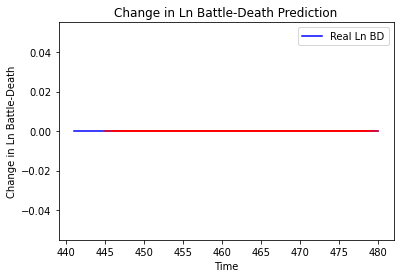

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_876"
_________________________________________________________________
Layer (type)       

Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0698 - val_loss: 9.4593e-07
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0712 - val_loss: 2.9429e-06
Epoch 65/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0705 - val_loss: 7.6801e-06
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0699 - val_loss: 9.8954e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0706 - val_loss: 9.0873e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0720 - val_loss: 8.5246e-06
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0705 - val_loss: 6.3948e-06
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0719 - val_loss: 1.4442e-06
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0697 - val_loss: 5.6233e-07
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0704 - v

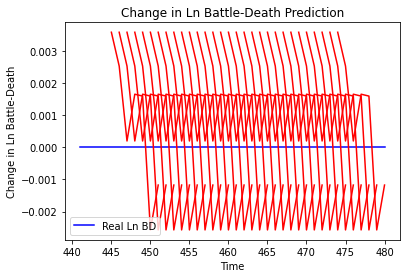

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 1.2865009478351406e-05, 'mae': 0.003586782608181238, 'r2': 0.0, 'tadda_score': 0.003586782608181238}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 3.745603625323842e-05, 'mae': 0.006120133679360151, 'r2': 0.0, 'tadda_score': 0.006120133679360151}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 3.991956188843793e-05, 'mae': 0.006318192929029465, 'r2': 0.0, 'tadda_score': 0.006318192929029465}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 6.358697367049582e-05, 'mae': 0.007974144071340561, 'r2': 0.0, 'tadda_score': 0.007974144071340561}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 4.9535935357281936e-05, 'mae': 0.007038176991045475, 'r2': 0.0, 'tadda_score': 0.007038176991045475}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 1.993300453246097e-05, 'mae': 0.004464639350771904, 

4/4 [==============================] - 0s 9ms/step - loss: 0.0723 - val_loss: 0.0839
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0722 - val_loss: 0.0838
Epoch 63/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0722 - val_loss: 0.0837
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0719 - val_loss: 0.0836
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0726 - val_loss: 0.0834
Epoch 66/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0741 - val_loss: 0.0833
Epoch 67/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0726 - val_loss: 0.0832
Epoch 68/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0717 - val_loss: 0.0832
Epoch 69/100
4/4 [==============================] - 0s 8ms/step - loss: 0.0724 - val_loss: 0.0831
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0736 - val_loss: 0.0831
Epoch 71/100
4/4 [===============

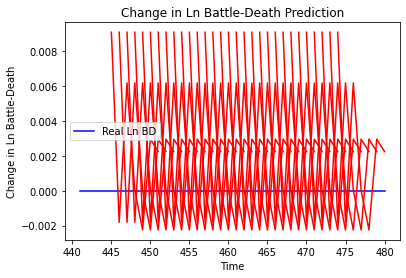

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 8.23496065697699e-05, 'mae': 0.009074668399989605, 'r2': 0.0, 'tadda_score': 0.009074668399989605}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 5.28085399967139e-05, 'mae': 0.007266948465257883, 'r2': 0.0, 'tadda_score': 0.007266948465257883}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 0.00018058688680039348, 'mae': 0.013438262045383453, 'r2': 0.0, 'tadda_score': 0.013438262045383453}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 0.00018110153398873466, 'mae': 0.013457396999001503, 'r2': 0.0, 'tadda_score': 0.013457396999001503}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.00016946199378137586, 'mae': 0.01301775686442852, 'r2': 0.0, 'tadda_score': 0.01301775686442852}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.0002550026793564225, 'mae': 0.01596

Epoch 61/100
1/1 [==============================] - 0s 22ms/step - loss: 3.0889 - val_loss: 0.8631
Epoch 62/100
1/1 [==============================] - 0s 22ms/step - loss: 3.0912 - val_loss: 0.8633
Epoch 63/100
1/1 [==============================] - 0s 22ms/step - loss: 3.0986 - val_loss: 0.8635
Epoch 64/100
1/1 [==============================] - 0s 20ms/step - loss: 3.0974 - val_loss: 0.8638
Epoch 65/100
1/1 [==============================] - 0s 22ms/step - loss: 3.1080 - val_loss: 0.8640
Epoch 66/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1184 - val_loss: 0.8642
Epoch 67/100
1/1 [==============================] - 0s 20ms/step - loss: 3.1073 - val_loss: 0.8644
Epoch 68/100
1/1 [==============================] - 0s 20ms/step - loss: 3.1075 - val_loss: 0.8646
Epoch 69/100
1/1 [==============================] - 0s 19ms/step - loss: 3.1139 - val_loss: 0.8648
Epoch 70/100
1/1 [==============================] - 0s 19ms/step - loss: 3.0935 - val_loss: 0.8649
Epoch 71/1

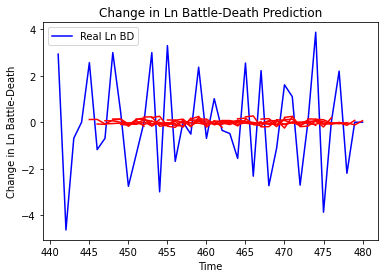

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.76210294220581, 'mae': 1.6439461917771427, 'r2': 0.059790263028263846, 'tadda_score': 1.6672221701436767}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.392317882616405, 'mae': 1.706730425237562, 'r2': -0.029428936300877284, 'tadda_score': 1.809317578379259}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.957038321567308, 'mae': 1.6507489760137273, 'r2': -0.02036699192119351, 'tadda_score': 1.7067569771822961}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.3429562564641975, 'mae': 1.4424987414555874, 'r2': -0.006886994064901897, 'tadda_score': 1.4826269189841674}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.1847252803601505, 'mae': 1.9271367114964701, 'r2': 0.011077015741575824, 'tadda_score': 1.936654731165228}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.680386452837642, 'm

1/1 [==============================] - 0s 24ms/step - loss: 6.5779 - val_loss: 3.8024
Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5557 - val_loss: 3.8020
Epoch 62/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5888 - val_loss: 3.8014
Epoch 63/100
1/1 [==============================] - 0s 21ms/step - loss: 6.5323 - val_loss: 3.8010
Epoch 64/100
1/1 [==============================] - 0s 21ms/step - loss: 6.5772 - val_loss: 3.8004
Epoch 65/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5307 - val_loss: 3.7998
Epoch 66/100
1/1 [==============================] - 0s 25ms/step - loss: 6.5696 - val_loss: 3.7992
Epoch 67/100
1/1 [==============================] - 0s 22ms/step - loss: 6.5970 - val_loss: 3.7986
Epoch 68/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5717 - val_loss: 3.7980
Epoch 69/100
1/1 [==============================] - 0s 20ms/step - loss: 6.5478 - val_loss: 3.7974
Epoch 70/100
1/1 [=====

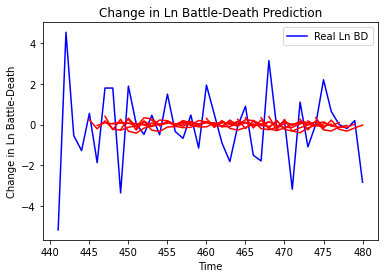

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 1.9993768610360623, 'mae': 1.109225361358553, 'r2': 0.10124282605441781, 'tadda_score': 1.1544774736577565}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.7931624296591133, 'mae': 1.324436613990663, 'r2': -0.033590296980576806, 'tadda_score': 1.3835248692073412}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.94980308599966, 'mae': 1.4087044578323789, 'r2': -0.12821486649639002, 'tadda_score': 1.516370040206117}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.4490700648981507, 'mae': 1.546195819997643, 'r2': -0.09417633902124756, 'tadda_score': 1.644753965759133}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.6992567655634017, 'mae': 1.263153953099009, 'r2': -0.070121882807898, 'tadda_score': 1.323877165211992}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+6'

In [60]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=4, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_881"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_864 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1728 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1728 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1729 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1729 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 87ms/step - loss: 0.0000e

Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [====================

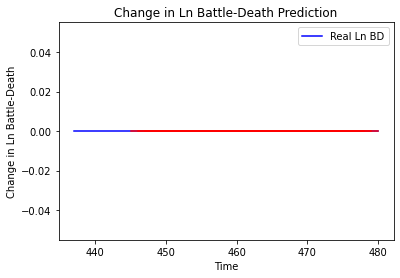

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_882"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 12ms/step - loss: 0.5383 - val_loss: 0.3436
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5431 - val_loss: 0.3435
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5397 - val_loss: 0.3435
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5370 - val_loss: 0.3434
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5439 - val_loss: 0.3434
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5363 - val_loss: 0.3434
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5422 - val_loss: 0.3433
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5355 - val_loss: 0.3431
Epoch 72/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5416 - val_loss: 0.3430
Epoch 73/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5407 - val_loss: 0.3430
Epoch 74/100
4/4 [=====

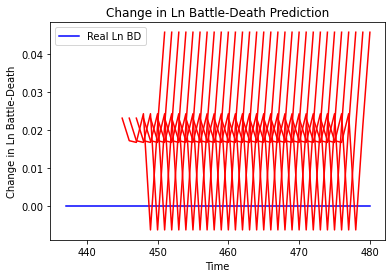

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.0005349736186783943, 'mae': 0.023129496723413467, 'r2': 0.0, 'tadda_score': 0.023129496723413467}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.0016262745504325715, 'mae': 0.04032709449529648, 'r2': 0.0, 'tadda_score': 0.04032709449529648}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.003257850897885106, 'mae': 0.05707758665084839, 'r2': 0.0, 'tadda_score': 0.05707758665084839}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0066217504318624165, 'mae': 0.0813741385936737, 'r2': 0.0, 'tadda_score': 0.0813741385936737}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0033502952773170613, 'mae': 0.057881735265254974, 'r2': 0.0, 'tadda_score': 0.057881735265254974}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.006243322212547364, 'mae': 0.07

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

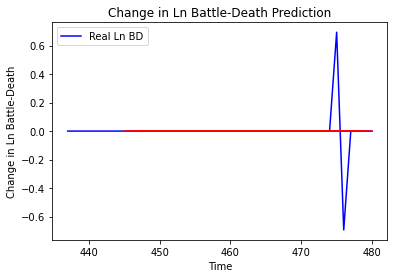

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_884"
_________________________________________________________________
Layer (type)                 Output Shape      

4/4 [==============================] - 0s 10ms/step - loss: 1.2165 - val_loss: 3.3869e-04
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2034 - val_loss: 3.2730e-04
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2111 - val_loss: 3.1830e-04
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2030 - val_loss: 2.8445e-04
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2048 - val_loss: 3.0709e-04
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2084 - val_loss: 2.8295e-04
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1987 - val_loss: 2.5900e-04
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2029 - val_loss: 2.3303e-04
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1944 - val_loss: 2.1580e-04
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2011 - val_los

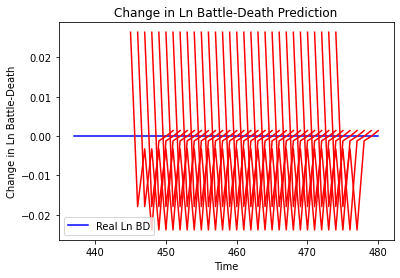

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0006970443772961327, 'mae': 0.026401598006486893, 'r2': 0.0, 'tadda_score': 0.026401598006486893}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 7.190176551952199e-05, 'mae': 0.008479490876197815, 'r2': 0.0, 'tadda_score': 0.008479490876197815}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 2.7392994302266604e-05, 'mae': 0.005233831703662872, 'r2': 0.0, 'tadda_score': 0.005233831703662872}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.00034701825136901343, 'mae': 0.018628425896167755, 'r2': 0.0, 'tadda_score': 0.018628425896167755}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 3.684354913088082e-06, 'mae': 0.001919467351399362, 'r2': 0.0, 'tadda_score': 0.001919467351399362}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 3.9190307088139784e-06, 'mae': 0.001979654189199209, 'r2':

4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

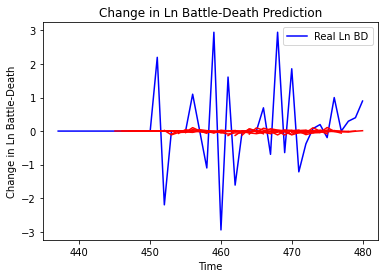

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6737873754183707, 'mae': 0.83318995273043, 'r2': -0.014981223238489605, 'tadda_score': 0.8468556179198551}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2098504003865616, 'mae': 0.7353205602695456, 'r2': -0.02237404390846498, 'tadda_score': 0.7463743638947518}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.0692341204449773, 'mae': 0.9196672756742751, 'r2': -0.037930905160812545, 'tadda_score': 0.93836671736924}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.439838326975272, 'mae': 1.0379227378468228, 'r2': -0.09910939032984234, 'tadda_score': 1.068693836815706}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.359647653205005, 'mae': 0.9567437295313131, 'r2': -0.13195265583262983, 'tadda_score': 0.9777756541168146}
{'country': 'Burkina Faso', 'country_id': 47, 'step':

Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2674 - val_loss: 4.8133e-06
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2663 - val_loss: 6.5939e-06
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2678 - val_loss: 6.9808e-06
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2680 - val_loss: 9.7430e-06
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2667 - val_loss: 1.8984e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2666 - val_loss: 1.9987e-05
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2653 - val_loss: 1.7626e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.2666 - val_loss: 1.8912e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2668 - val_loss: 1.5932e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.

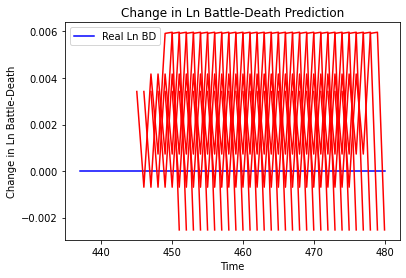

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 1.1686338525355273e-05, 'mae': 0.0034185287076979876, 'r2': 0.0, 'tadda_score': 0.0034185287076979876}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 7.424753422963194e-06, 'mae': 0.002724840072914958, 'r2': 0.0, 'tadda_score': 0.002724840072914958}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 4.7536159237250054e-05, 'mae': 0.006894647143781185, 'r2': 0.0, 'tadda_score': 0.006894647143781185}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 5.814713131118234e-05, 'mae': 0.007625426631420851, 'r2': 0.0, 'tadda_score': 0.007625426631420851}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.00020263265666606647, 'mae': 0.014234909787774086, 'r2': 0.0, 'tadda_score': 0.014234909787774086}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.00040804485953466543, 'mae': 0.02020012028515339, 'r2': 0.0

4/4 [==============================] - 0s 11ms/step - loss: 0.6983 - val_loss: 9.3343e-05
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7130 - val_loss: 9.2053e-05
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6865 - val_loss: 1.1832e-04
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6904 - val_loss: 1.1342e-04
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7034 - val_loss: 1.0807e-04
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6925 - val_loss: 1.0214e-04
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7020 - val_loss: 7.6932e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6895 - val_loss: 6.8192e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6946 - val_loss: 6.2900e-05
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6803 - val_

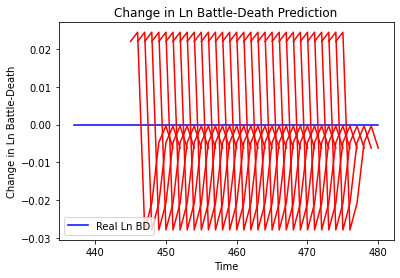

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00048637069261850754, 'mae': 0.022053813561797142, 'r2': 0.0, 'tadda_score': 0.022053813561797142}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.002166835051200744, 'mae': 0.046549275517463684, 'r2': 0.0, 'tadda_score': 0.046549275517463684}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 0.0003465663511244138, 'mae': 0.018616292625665665, 'r2': 0.0, 'tadda_score': 0.018616292625665665}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 4.943964899820075e-06, 'mae': 0.0022235028445720673, 'r2': 0.0, 'tadda_score': 0.0022235028445720673}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.0009887711768264001, 'mae': 0.0314447320997715, 'r2': 0.0, 'tadda_score': 0.0314447320997715}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.001011977100065009, 'mae

Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2302 - val_loss: 3.1018
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2326 - val_loss: 3.1006
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 1.2246 - val_loss: 3.0994
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2357 - val_loss: 3.0983
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2292 - val_loss: 3.0972
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2374 - val_loss: 3.0960
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2220 - val_loss: 3.0948
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2277 - val_loss: 3.0933
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2311 - val_loss: 3.0921
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.2205 - val_loss: 3.0909
Epoch 71/100


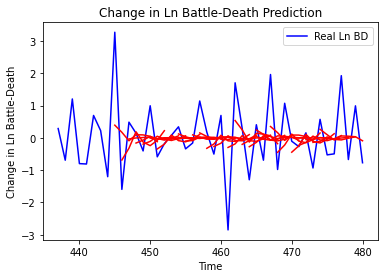

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.9087001487037644, 'mae': 0.6833268965631194, 'r2': 0.2801891785637295, 'tadda_score': 0.7170608282436397}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.2785081139500136, 'mae': 0.8711748644478864, 'r2': -0.32052871661194415, 'tadda_score': 1.0653174586984264}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.2163667685865287, 'mae': 0.9269667345913545, 'r2': -0.07142444873061815, 'tadda_score': 1.0914897768951748}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.7086390052321425, 'mae': 1.0867634294697928, 'r2': -0.14256883115213315, 'tadda_score': 1.281499905603681}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.4535356641250403, 'mae': 0.9765923510399631, 'r2': -0.34240965994164396, 'tadda_score': 1.1454766795443665}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.785248524570147, 'mae': 1.103

Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6349 - val_loss: 0.4551
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6453 - val_loss: 0.4548
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6553 - val_loss: 0.4546
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6503 - val_loss: 0.4546
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.6439 - val_loss: 0.4545
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6312 - val_loss: 0.4544
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6454 - val_loss: 0.4542
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6410 - val_loss: 0.4538
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6414 - val_loss: 0.4535
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 1.6419 - val_loss: 0.4534
Epoch 71/100


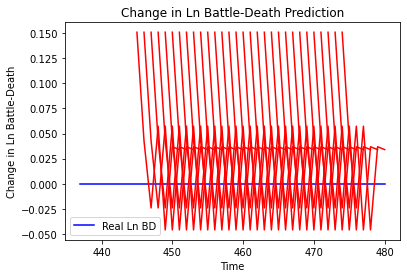

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.02274818326442607, 'mae': 0.15082500874996185, 'r2': 0.0, 'tadda_score': 0.15082500874996185}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.037481213462342566, 'mae': 0.19360065460205078, 'r2': 0.0, 'tadda_score': 0.19360065460205078}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.02872293363998324, 'mae': 0.1694784164428711, 'r2': 0.0, 'tadda_score': 0.1694784164428711}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.051436750593247815, 'mae': 0.2267967164516449, 'r2': 0.0, 'tadda_score': 0.2267967164516449}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.019050230326876694, 'mae': 0.13802257180213928, 'r2': 0.0, 'tadda_score': 0.13802257180213928}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.030563243202411883, 'mae': 0.17482346296310425, 'r2': 0.0, 'tadda_score': 0.174

4/4 [==============================] - 0s 9ms/step - loss: 2.2347 - val_loss: 3.3737e-04
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2142 - val_loss: 3.5503e-04
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2244 - val_loss: 3.6698e-04
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2277 - val_loss: 3.6264e-04
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2270 - val_loss: 3.7977e-04
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2353 - val_loss: 3.8286e-04
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2254 - val_loss: 3.7819e-04
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2131 - val_loss: 4.0375e-04
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2189 - val_loss: 4.2335e-04
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.2145 - val_loss: 

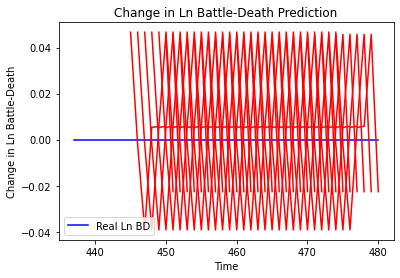

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.0021802499047431922, 'mae': 0.04669314622879028, 'r2': 0.0, 'tadda_score': 0.04669314622879028}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.001991323057218844, 'mae': 0.044624242931604385, 'r2': 0.0, 'tadda_score': 0.044624242931604385}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 2.904205688004924e-05, 'mae': 0.005389068275690079, 'r2': 0.0, 'tadda_score': 0.005389068275690079}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.00011489690886047621, 'mae': 0.010718997567892075, 'r2': 0.0, 'tadda_score': 0.010718997567892075}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.0003453197093373911, 'mae': 0.0185827799141407, 'r2': 0.0, 'tadda_score': 0.0185827799141407}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.004145155356348518, 'mae': 0.06438

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s

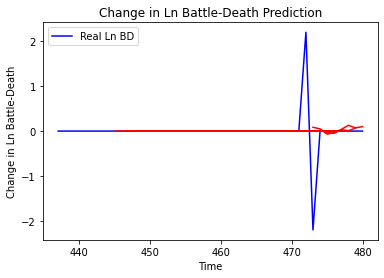

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6537 - val_loss: 4.8006e-05
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6492 - val_loss: 5.8375e-05
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6494 - val_loss: 7.4152e-05
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6507 - val_loss: 7.7203e-05
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6490 - val_loss: 7.6402e-05
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6486 - val_loss: 8.3850e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6487 - val_loss: 9.3065e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6500 - val_loss: 1.2120e-04
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6499 - val_loss: 1.0977e-04
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 

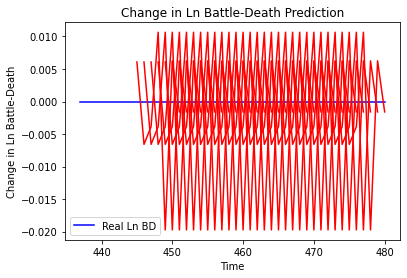

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 3.695976063368411e-05, 'mae': 0.0060794539749622345, 'r2': 0.0, 'tadda_score': 0.0060794539749622345}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 2.596458091065623e-07, 'mae': 0.0005095545202493668, 'r2': 0.0, 'tadda_score': 0.0005095545202493668}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 1.907977965022456e-05, 'mae': 0.004368040710687637, 'r2': 0.0, 'tadda_score': 0.004368040710687637}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 3.9443773333789484e-05, 'mae': 0.006280427798628807, 'r2': 0.0, 'tadda_score': 0.006280427798628807}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 4.720820843623699e-05, 'mae': 0.006870822980999947, 'r2': 0.0, 'tadda_score': 0.006870822980999947}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 3.812664819283565e-07, 'mae': 0.00061746779829263

4/4 [==============================] - 0s 11ms/step - loss: 2.0153 - val_loss: 5.9893e-04
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0261 - val_loss: 5.7325e-04
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0213 - val_loss: 5.4977e-04
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0094 - val_loss: 5.3858e-04
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0041 - val_loss: 5.5966e-04
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0176 - val_loss: 6.6981e-04
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0070 - val_loss: 8.2434e-04
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0088 - val_loss: 9.0756e-04
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0080 - val_loss: 0.0010
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0189 - val_loss

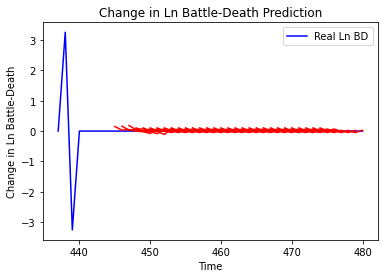

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.012621275889054507, 'mae': 0.11068462977806727, 'r2': 0.0, 'tadda_score': 0.11068462977806727}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.01611614938804212, 'mae': 0.1240680565436681, 'r2': 0.0, 'tadda_score': 0.1240680565436681}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.03697754536276228, 'mae': 0.19054731726646423, 'r2': 0.0, 'tadda_score': 0.19054731726646423}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.0349018581767122, 'mae': 0.18477329164743422, 'r2': 0.0, 'tadda_score': 0.18477329164743422}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.029593384137234374, 'mae': 0.17131725052992502, 'r2': 0.0, 'tadda_score': 0.17131725052992502}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.014220603822935803, 'mae': 0.1191297968228658, 'r2': 0.0, 'tadda_score': 0.1191

4/4 [==============================] - 0s 10ms/step - loss: 4.7687 - val_loss: 2.6658
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7650 - val_loss: 2.6640
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7914 - val_loss: 2.6624
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7478 - val_loss: 2.6610
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 4.7814 - val_loss: 2.6596
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7669 - val_loss: 2.6583
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7231 - val_loss: 2.6571
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7393 - val_loss: 2.6558
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 4.7332 - val_loss: 2.6544
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 4.7184 - val_loss: 2.6528
Epoch 71/100
4/4 [=======

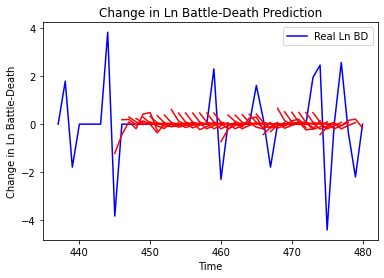

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0440546134209494, 'mae': 0.761356936009328, 'r2': 0.23469934612968268, 'tadda_score': 0.7900892437613014}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.629097044952748, 'mae': 1.1488249012511678, 'r2': -0.31768755595744014, 'tadda_score': 1.2422298052590794}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.6765890489108797, 'mae': 1.157317012417486, 'r2': -0.3414902614312645, 'tadda_score': 1.2650820174497075}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.7631909902546696, 'mae': 1.210037970411947, 'r2': -0.3848946312507586, 'tadda_score': 1.320422831046751}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.3096745505850746, 'mae': 0.9868007474821515, 'r2': -0.15759493148426018, 'tadda_score': 1.046275168029637}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 1.89318945541

4/4 [==============================] - 0s 10ms/step - loss: 0.9400 - val_loss: 1.0099
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9413 - val_loss: 1.0094
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9446 - val_loss: 1.0090
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9387 - val_loss: 1.0086
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9418 - val_loss: 1.0082
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9433 - val_loss: 1.0077
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9377 - val_loss: 1.0074
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9417 - val_loss: 1.0070
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9365 - val_loss: 1.0067
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9373 - val_loss: 1.0063
Epoch 70/100
4/4 [======

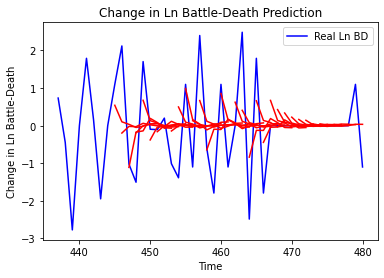

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.1064379902145423, 'mae': 0.7924822875462071, 'r2': 0.3062516497551159, 'tadda_score': 0.8226515334573483}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.4137914566402685, 'mae': 1.163545889928577, 'r2': -0.433197488998073, 'tadda_score': 1.4237460154043018}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.612865052132939, 'mae': 1.2617596765628467, 'r2': -0.45655434121989114, 'tadda_score': 1.539371558429898}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.720839948695598, 'mae': 1.2559274393265474, 'r2': -0.3327724454707168, 'tadda_score': 1.4808081383948555}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.8151640480312468, 'mae': 0.989455455413196, 'r2': -0.3487916533567461, 'tadda_score': 1.1506120519670184}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.9946738015327057, '

4/4 [==============================] - 0s 11ms/step - loss: 0.1958 - val_loss: 1.3813
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1987 - val_loss: 1.3812
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1967 - val_loss: 1.3811
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1953 - val_loss: 1.3810
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1954 - val_loss: 1.3808
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1956 - val_loss: 1.3806
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1961 - val_loss: 1.3805
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1979 - val_loss: 1.3804
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1926 - val_loss: 1.3803
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1919 - val_loss: 1.3802
Epoch 70/100
4/4 [=====

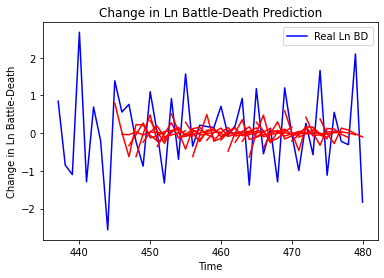

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.532778979585814, 'mae': 0.6353578193935426, 'r2': 0.27656522726974775, 'tadda_score': 0.6925078964372647}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.1606054819026186, 'mae': 0.9351842544185976, 'r2': -0.5723684669015925, 'tadda_score': 1.1789555750000338}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.0772338387957503, 'mae': 0.8298542859200194, 'r2': -0.09921483641204665, 'tadda_score': 0.8741171511057572}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.125550704972272, 'mae': 0.8532522479146302, 'r2': -0.27803339578973074, 'tadda_score': 0.9601133798633595}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.3623496252371394, 'mae': 0.9445377511483455, 'r2': -0.3696289691610182, 'tadda_score': 1.1011766416531827}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.7098228

4/4 [==============================] - 0s 9ms/step - loss: 0.7554 - val_loss: 2.5130
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7539 - val_loss: 2.5125
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7489 - val_loss: 2.5117
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7547 - val_loss: 2.5110
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7542 - val_loss: 2.5103
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7551 - val_loss: 2.5097
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7537 - val_loss: 2.5090
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7554 - val_loss: 2.5085
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7552 - val_loss: 2.5080
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7494 - val_loss: 2.5074
Epoch 70/100
4/4 [========

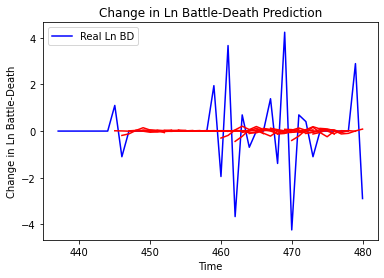

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.3423687705826186, 'mae': 0.9073819305478459, 'r2': 0.11432758974295476, 'tadda_score': 0.9151476269008145}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.4591006095517856, 'mae': 0.7709865818989051, 'r2': 0.003328331654903094, 'tadda_score': 0.7891073334288372}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.1675181609035192, 'mae': 0.8854461492639163, 'r2': 0.0752196717128144, 'tadda_score': 0.9014666461985686}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.42737217586321, 'mae': 0.8483256802787006, 'r2': -0.004022654665535974, 'tadda_score': 0.8568762325574577}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.5696448364899243, 'mae': 0.8905338811060265, 'r2': -0.014004832245043008, 'tadda_score': 0.916178511

Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.2063
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 

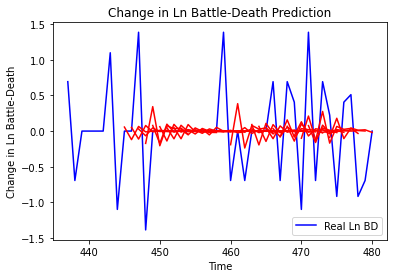

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3661329064106695, 'mae': 0.40043318099581576, 'r2': 0.1131375174400816, 'tadda_score': 0.4055297004858988}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39204839242078143, 'mae': 0.4271733466468613, 'r2': 0.047261212693188726, 'tadda_score': 0.43784055044823494}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.48811847756843935, 'mae': 0.4714817603812641, 'r2': -0.021586699119658048, 'tadda_score': 0.4755620973568187}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.49462812297132003, 'mae': 0.4605018306725782, 'r2': -0.02435196195005407, 'tadda_score': 0.4628131825058224}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.5040693714172675, 'mae': 0.5057852919442719, 'r2': -0.14577203655789073, 'tadda_score': 0.5462322911166415}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.5945

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

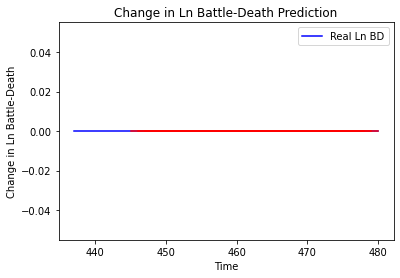

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_900"
_________________________________________________________________
Layer (type)                 Output S

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] 

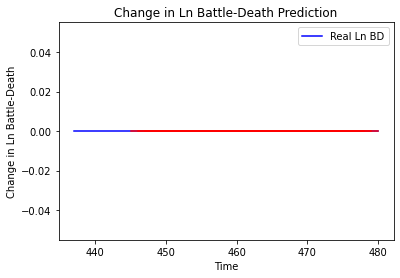

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_901"
_______________________________

4/4 [==============================] - 0s 10ms/step - loss: 0.8774 - val_loss: 1.5673
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8746 - val_loss: 1.5665
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8700 - val_loss: 1.5657
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.8794 - val_loss: 1.5650
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8740 - val_loss: 1.5642
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.8735 - val_loss: 1.5635
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8728 - val_loss: 1.5629
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8768 - val_loss: 1.5624
Epoch 72/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8768 - val_loss: 1.5620
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8771 - val_loss: 1.5616
Epoch 74/100
4/4 [=====

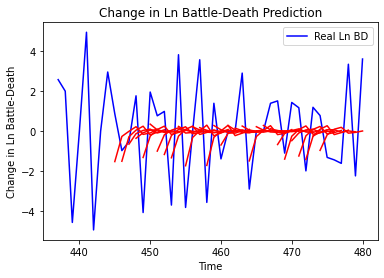

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.264439966516677, 'mae': 1.5136852750829377, 'r2': 0.2464128311874657, 'tadda_score': 1.7685121103775023}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 6.126481462092554, 'mae': 2.0724965070981676, 'r2': -0.5601686617012978, 'tadda_score': 2.4743354762890832}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.510933211811715, 'mae': 1.8160258758262857, 'r2': -0.4228980069885022, 'tadda_score': 2.2242705253954784}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 5.348659724669215, 'mae': 1.9375900631804943, 'r2': -0.17883870656993417, 'tadda_score': 2.230980627055931}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 6.689347673406183, 'mae': 2.073362137482694, 'r2': -0.21606192370274635, 'tadda_score': 2.367708957549067}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 6.311841984143085, 'mae': 1.997288

4/4 [==============================] - 0s 16ms/step - loss: 0.5404 - val_loss: 1.2063
Epoch 61/100
4/4 [==============================] - 0s 19ms/step - loss: 0.5478 - val_loss: 1.2061
Epoch 62/100
4/4 [==============================] - 0s 14ms/step - loss: 0.5439 - val_loss: 1.2058
Epoch 63/100
4/4 [==============================] - 0s 15ms/step - loss: 0.5423 - val_loss: 1.2055
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5442 - val_loss: 1.2052
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5416 - val_loss: 1.2048
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5415 - val_loss: 1.2045
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5407 - val_loss: 1.2043
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5380 - val_loss: 1.2046
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5459 - val_loss: 1.2047
Epoch 70/100
4/4 [=======

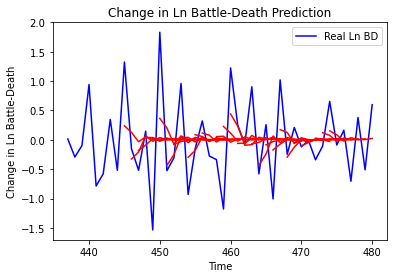

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.44259145179138665, 'mae': 0.49422304633110214, 'r2': 0.225570257662549, 'tadda_score': 0.5214620014314796}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.7869066366596036, 'mae': 0.6928911880717775, 'r2': -0.4543521931494947, 'tadda_score': 0.8364005703762025}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.7567266866656894, 'mae': 0.669521267762163, 'r2': -0.23508926889578574, 'tadda_score': 0.7885122461124051}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.95580402022896, 'mae': 0.7399530131735376, 'r2': -0.2848971995833325, 'tadda_score': 0.8995083747797182}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6499805245116896, 'mae': 0.6277782349796255, 'r2': -0.2695847457379621, 'tadda_score': 0.7286360690319199}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.721488390857839

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

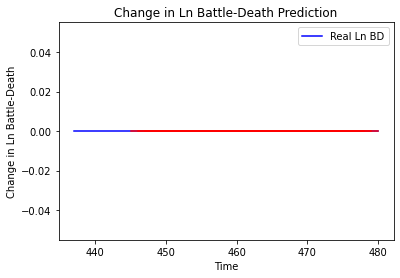

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_904"
____

Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [===================

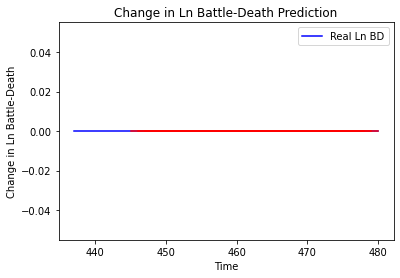

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_905"
_________________________________________________________________
Layer (type)                 Output Shape             

4/4 [==============================] - 0s 9ms/step - loss: 2.6052 - val_loss: 0.3558
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5868 - val_loss: 0.3558
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5937 - val_loss: 0.3557
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5808 - val_loss: 0.3557
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5838 - val_loss: 0.3556
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.5675 - val_loss: 0.3556
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5791 - val_loss: 0.3555
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5780 - val_loss: 0.3555
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5911 - val_loss: 0.3555
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 2.5777 - val_loss: 0.3555
Epoch 75/100
4/4 [=======

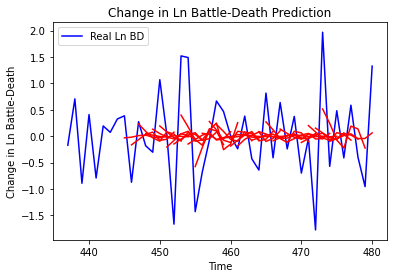

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5970964489916571, 'mae': 0.610517551827373, 'r2': 0.21618837568400284, 'tadda_score': 0.662349858088237}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.1993438145006812, 'mae': 0.8140649165953401, 'r2': -0.22303168366810477, 'tadda_score': 0.9559847585852149}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.061648651839133, 'mae': 0.7787431181619436, 'r2': -0.33023089465432176, 'tadda_score': 0.9189633210400613}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.7951630216327565, 'mae': 0.7386357349390587, 'r2': -0.14712570872860842, 'tadda_score': 0.8108348563050032}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8296993506735951, 'mae': 0.6648606289468594, 'r2': -0.07628006420496947, 'tadda_score': 0.7408883712855364}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.756709

Epoch 56/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

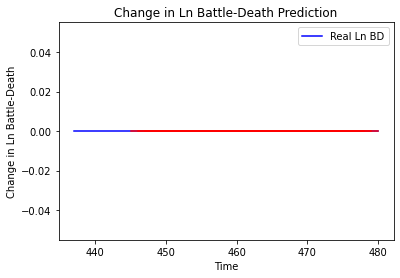

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_907"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 12ms/step - loss: 1.9616 - val_loss: 1.4990
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9581 - val_loss: 1.4986
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9577 - val_loss: 1.4982
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 1.9809 - val_loss: 1.4978
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9503 - val_loss: 1.4976
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9564 - val_loss: 1.4973
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9445 - val_loss: 1.4971
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9626 - val_loss: 1.4968
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9711 - val_loss: 1.4964
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9590 - val_loss: 1.4961
Epoch 74/100
4/4 [=====

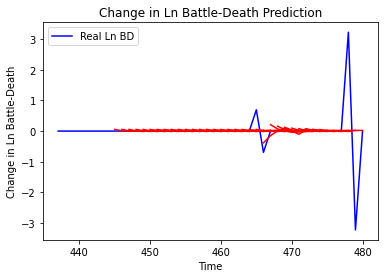

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.02241774318194017, 'mae': 0.09562147880313875, 'r2': 0.30010607075439655, 'tadda_score': 0.09562147880313875}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.0603479465870757, 'mae': 0.13932466817118805, 'r2': -0.8840951614058392, 'tadda_score': 0.14863389941273214}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.056234499347985016, 'mae': 0.1355975837729184, 'r2': -0.7556711390791415, 'tadda_score': 0.1424353158694315}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.04924571737044269, 'mae': 0.13270048709927085, 'r2': -0.5374776287331271, 'tadda_score': 0.13738577030319057}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.03904466927955013, 'mae': 0.10112828351277195, 'r2': -0.21899545268117349, 'tadda_score': 0.10350684063849928}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 'm

4/4 [==============================] - 0s 11ms/step - loss: 2.4394 - val_loss: 0.1864
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4414 - val_loss: 0.1863
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4449 - val_loss: 0.1862
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4385 - val_loss: 0.1861
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4330 - val_loss: 0.1859
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4183 - val_loss: 0.1858
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4340 - val_loss: 0.1858
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4289 - val_loss: 0.1862
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4365 - val_loss: 0.1863
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4335 - val_loss: 0.1863
Epoch 70/100
4/4 [=====

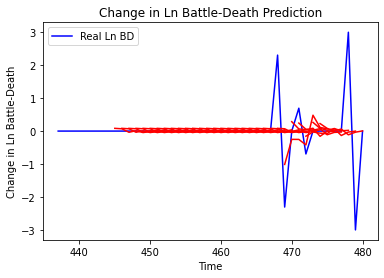

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.24825155798928814, 'mae': 0.23939032676452954, 'r2': 0.3560105068458801, 'tadda_score': 0.23939032676452954}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.505063079111392, 'mae': 0.38348514211808205, 'r2': -0.31018439103547957, 'tadda_score': 0.4066784746709919}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.41675369296246867, 'mae': 0.3447421673478333, 'r2': -0.49326956868181804, 'tadda_score': 0.36619405384278775}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.44729488188062905, 'mae': 0.35319144009575765, 'r2': -0.21237464743357526, 'tadda_score': 0.35319144009575765}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.4491079871307206, 'mae': 0.24712803715492804, 'r2': -0.2172889957245674, 'tadda_score': 0.25482792510614316}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.4

Epoch 56/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [======================

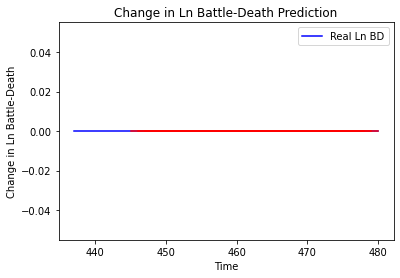

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_910"
_________________________________________________________________
Layer (type)                 Out

Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

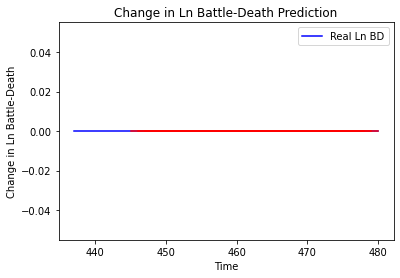

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_911"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 11ms/step - loss: 0.1319 - val_loss: 8.7539e-06
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1308 - val_loss: 1.2666e-05
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1336 - val_loss: 8.1744e-06
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1309 - val_loss: 4.1437e-06
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1322 - val_loss: 2.0036e-06
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1319 - val_loss: 3.3620e-06
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1358 - val_loss: 3.9496e-06
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1328 - val_loss: 2.5737e-06
Epoch 70/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1309 - val_loss: 2.3240e-06
Epoch 71/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1323 - val_

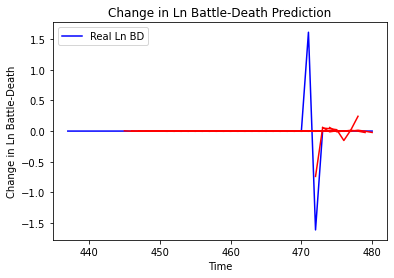

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.11143626300737251, 'mae': 0.09012113815556859, 'r2': 0.35468859051664203, 'tadda_score': 0.09012113815556859}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.19368286313820302, 'mae': 0.13487133487511074, 'r2': -0.12158966956938566, 'tadda_score': 0.13648075577565427}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.19190106741224663, 'mae': 0.13464651451363807, 'r2': -0.11127154618389268, 'tadda_score': 0.1362692117279236}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.09963848088120675, 'mae': 0.07806894261426427, 'r2': -0.1937768538188709, 'tadda_score': 0.07806894261426427}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10940752072929502, 'mae': 0.0885332738115062, 'r2': -0.310820525616577, 'tadda_score': 0.0885332738115062}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'ms

4/4 [==============================] - 0s 10ms/step - loss: 0.1474 - val_loss: 4.2388e-06
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1456 - val_loss: 4.8417e-06
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1458 - val_loss: 5.1981e-06
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1469 - val_loss: 5.8056e-06
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1453 - val_loss: 5.1939e-06
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1461 - val_loss: 6.8232e-06
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1477 - val_loss: 5.8426e-06
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1450 - val_loss: 7.5415e-06
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1467 - val_loss: 1.0438e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1449 - val_

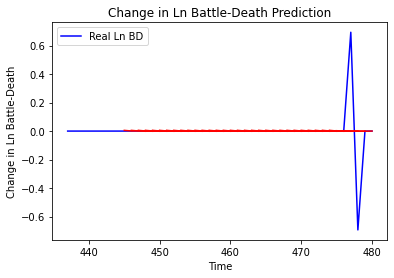

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 2.557350893862831e-05, 'mae': 0.005057025700807571, 'r2': 0.0, 'tadda_score': 0.005057025700807571}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 3.3968478676708186e-05, 'mae': 0.0058282483369112015, 'r2': 0.0, 'tadda_score': 0.0058282483369112015}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 7.51617200393526e-05, 'mae': 0.008669585920870304, 'r2': 0.0, 'tadda_score': 0.008669585920870304}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 5.084017765169882e-05, 'mae': 0.0071302298456430435, 'r2': 0.0, 'tadda_score': 0.0071302298456430435}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 5.160882881253084e-05, 'mae': 0.00718392850831151, 'r2': 0.0, 'tadda_score': 0.00718392850831151}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 3.9771932699217416e-05, 'mae': 0.006306499242782593,

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] -

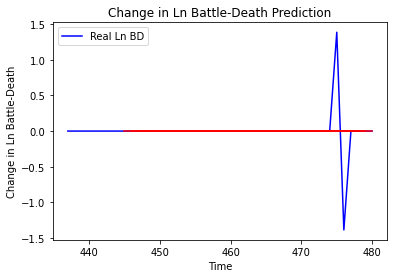

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_914"
_________________________________________________________________
Layer (type)                 O

Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9977 - val_loss: 0.6040
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 1.0294 - val_loss: 0.6040
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9924 - val_loss: 0.6041
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9855 - val_loss: 0.6042
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9851 - val_loss: 0.6043
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9903 - val_loss: 0.6043
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.9739 - val_loss: 0.6043
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 1.0035 - val_loss: 0.6044
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9847 - val_loss: 0.6045
Epoch 74/100
4/4 [==============================] - 0s 9ms/step - loss: 0.9890 - val_loss: 0.6045
Epoch 75/100

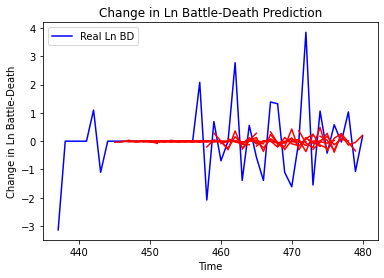

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.4197824808512924, 'mae': 0.7559603433442958, 'r2': 0.09772207298879965, 'tadda_score': 0.7615402145319033}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.1561928146801415, 'mae': 0.9370495075952955, 'r2': -0.12693756244524423, 'tadda_score': 1.0064152894513754}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.0605241073682676, 'mae': 1.0148784783702574, 'r2': -0.0766507471818414, 'tadda_score': 1.046047085868466}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.7614083839999337, 'mae': 0.8994508400722306, 'r2': -0.1687955677558053, 'tadda_score': 0.9957295051628314}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 0.9658768403572139, 'mae': 0.6396848963720283, 'r2': -0.1793426438358623, 'tadda_score': 0.6782697950946968}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6'

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

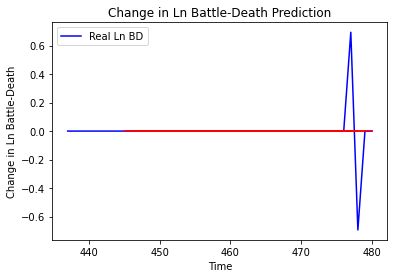

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_916"
_______________________________________________________

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

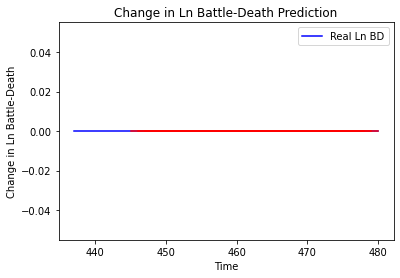

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_917"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 10ms/step - loss: 3.3956 - val_loss: 0.1034
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3835 - val_loss: 0.1034
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 3.4051 - val_loss: 0.1033
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3961 - val_loss: 0.1033
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3776 - val_loss: 0.1033
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3818 - val_loss: 0.1033
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3774 - val_loss: 0.1033
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3811 - val_loss: 0.1033
Epoch 72/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3875 - val_loss: 0.1033
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3834 - val_loss: 0.1033
Epoch 74/100
4/4 [=====

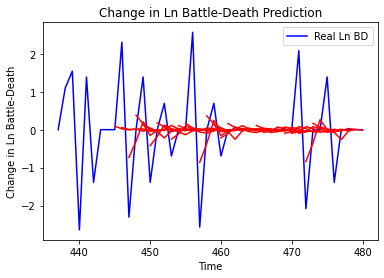

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.9127902236849262, 'mae': 0.6022921912620008, 'r2': 0.2826855459031231, 'tadda_score': 0.6056823888110162}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.6861697459608085, 'mae': 0.898018677712683, 'r2': -0.32507327472872105, 'tadda_score': 0.9666666774016659}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.0413179422718777, 'mae': 0.6774964705779958, 'r2': -0.1872008366361373, 'tadda_score': 0.7042719208374428}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.0308963040770676, 'mae': 0.7022507449591486, 'r2': 0.03957524789003308, 'tadda_score': 0.7099865928892621}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.03440672616371, 'mae': 0.613863161020728, 'r2': -0.056490353132079285, 'tadda_score': 0.6255943394583982}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.408731398308977

4/4 [==============================] - 0s 11ms/step - loss: 1.9637 - val_loss: 0.0889
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 1.9677 - val_loss: 0.0888
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9567 - val_loss: 0.0887
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9647 - val_loss: 0.0887
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9604 - val_loss: 0.0886
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9628 - val_loss: 0.0886
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9525 - val_loss: 0.0885
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9682 - val_loss: 0.0885
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9708 - val_loss: 0.0886
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9530 - val_loss: 0.0886
Epoch 70/100
4/4 [=====

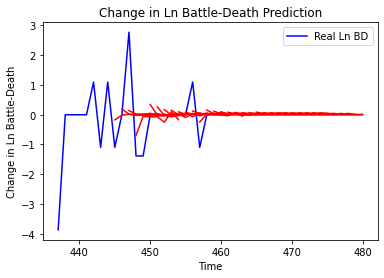

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.4053285444094963, 'mae': 0.3352315254431552, 'r2': 0.1953236725152313, 'tadda_score': 0.3352315254431552}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8775273069437773, 'mae': 0.5246756593252423, 'r2': -0.154705218351195, 'tadda_score': 0.574053892479857}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.7682564714174575, 'mae': 0.500750545563342, 'r2': -0.2953244180129089, 'tadda_score': 0.5517818837384798}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.8148514764769135, 'mae': 0.5291151020944533, 'r2': -0.17306762436665069, 'tadda_score': 0.5859077894707937}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.7992500069496534, 'mae': 0.5371909503162322, 'r2': -0.34758129428930684, 'tadda_score': 0.5945621459703067}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8226330559139908, 'ma

4/4 [==============================] - 0s 10ms/step - loss: 3.0231 - val_loss: 3.3737
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0232 - val_loss: 3.3718
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0249 - val_loss: 3.3700
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0264 - val_loss: 3.3681
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0198 - val_loss: 3.3666
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0064 - val_loss: 3.3649
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 3.0134 - val_loss: 3.3631
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0273 - val_loss: 3.3614
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0261 - val_loss: 3.3597
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0139 - val_loss: 3.3584
Epoch 70/100
4/4 [======

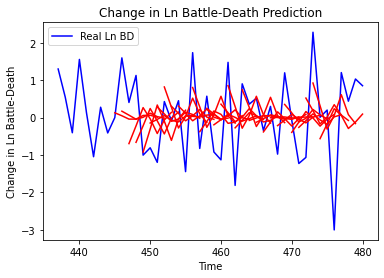

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.8695888979711178, 'mae': 0.7721398736419581, 'r2': 0.20547810585674553, 'tadda_score': 0.8936369757237338}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.3476398495366464, 'mae': 1.209555846420836, 'r2': -0.6603718371437941, 'tadda_score': 1.5363734605092918}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.3927459645191016, 'mae': 1.2121497676515547, 'r2': -0.38715065798637527, 'tadda_score': 1.4736341755334506}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.6917399264661315, 'mae': 1.2826765736090557, 'r2': -0.5450425061610669, 'tadda_score': 1.5553782306757984}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.083485283070188, 'mae': 1.3550279818189077, 'r2': -0.6797070497547362, 'tadda_score': 1.6932020848330789}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6',

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

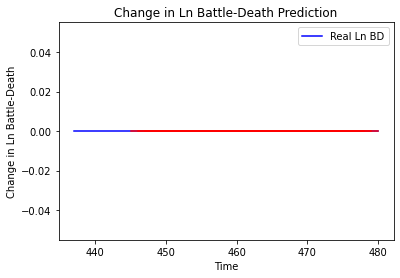

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_921"
_________________________________________________________________
Layer (type)                 Output Shap

4/4 [==============================] - 0s 10ms/step - loss: 0.1448 - val_loss: 9.9988e-06
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1438 - val_loss: 7.9642e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1436 - val_loss: 1.0818e-05
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1437 - val_loss: 7.9845e-06
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1434 - val_loss: 6.8341e-06
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1439 - val_loss: 5.1928e-06
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1435 - val_loss: 5.2156e-06
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1437 - val_loss: 6.6471e-06
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1431 - val_loss: 6.8592e-06
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1439 - val_loss: 

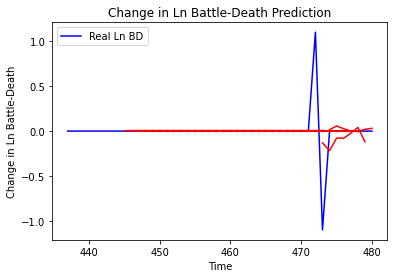

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07124797719026295, 'mae': 0.07190508019510103, 'r2': 0.11452787768720107, 'tadda_score': 0.07190508019510103}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.0892176465533178, 'mae': 0.09617201957251323, 'r2': -0.10879974361034805, 'tadda_score': 0.09853768843557131}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.04587759444360498, 'mae': 0.06365432474462038, 'r2': -0.17965834512876322, 'tadda_score': 0.06365432474462038}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04852035573692654, 'mae': 0.06340076273627923, 'r2': -0.24761211322971088, 'tadda_score': 0.06340076273627923}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04332911663515179, 'mae': 0.0500547836287354, 'r2': -0.11412890422024291, 'tadda_score': 0.0500547836287354}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

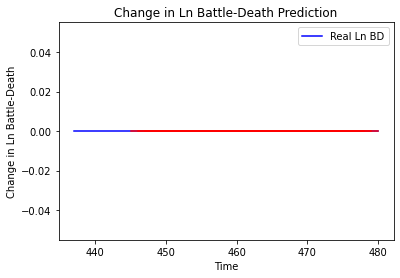

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_923"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

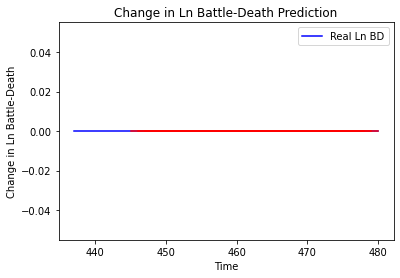

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_924"
_________________________________________________________________
Layer (ty

Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

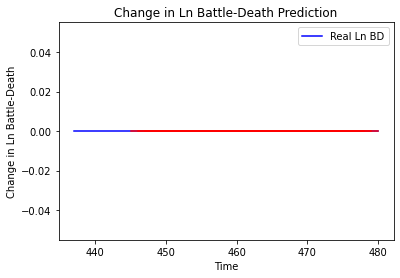

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_925"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 12ms/step - loss: 0.0164 - val_loss: 2.2641
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0165 - val_loss: 2.2641
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0165 - val_loss: 2.2642
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0165 - val_loss: 2.2643
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0164 - val_loss: 2.2643
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0164 - val_loss: 2.2643
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0164 - val_loss: 2.2642
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0164 - val_loss: 2.2643
Epoch 72/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0164 - val_loss: 2.2643
Epoch 73/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0165 - val_loss: 2.2643
Epoch 74/100
4/4 [=====

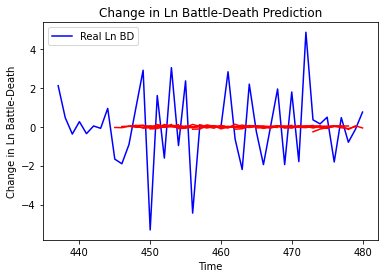

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.692875047673437, 'mae': 1.6753918293009742, 'r2': 0.03152542784185397, 'tadda_score': 1.688966122168729}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.598401052745815, 'mae': 1.8184760244830422, 'r2': -0.033443680424834143, 'tadda_score': 1.8678470834736}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.557211728996584, 'mae': 2.1346551212003515, 'r2': -0.0181435750903427, 'tadda_score': 2.183943741565514}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.0034514499568825, 'mae': 1.9990483514934745, 'r2': -0.03743243981909883, 'tadda_score': 2.0344810635442503}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.42239535730411, 'mae': 2.2873226437976166, 'r2': -0.020095121470764532, 'tadda_score': 2.317806013388952}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.433710271637151, 'mae': 1

4/4 [==============================] - 0s 10ms/step - loss: 5.2079 - val_loss: 0.8026
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1383 - val_loss: 0.8021
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1791 - val_loss: 0.8017
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1647 - val_loss: 0.8012
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1799 - val_loss: 0.8007
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1306 - val_loss: 0.8002
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1482 - val_loss: 0.7999
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1432 - val_loss: 0.7995
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1285 - val_loss: 0.7991
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1444 - val_loss: 0.7987
Epoch 70/100
4/4 [========

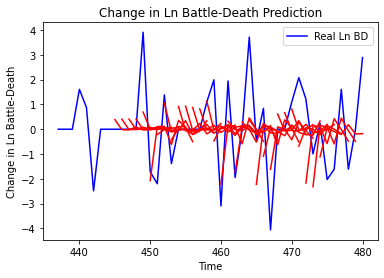

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.5412710332949167, 'mae': 1.245312077600093, 'r2': 0.13427796947230497, 'tadda_score': 1.4294691451374006}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.3275856973752385, 'mae': 1.9477954125071308, 'r2': -0.4906848371334176, 'tadda_score': 2.3891365553602317}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 8.021312864090808, 'mae': 2.185129726114915, 'r2': -0.5358606678914049, 'tadda_score': 2.6514493268559836}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.08691320339193, 'mae': 2.795771876084666, 'r2': -0.8181431549781766, 'tadda_score': 3.4553012590685097}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 9.49518455612075, 'mae': 2.440782573517301, 'r2': -0.9986241907093873, 'tadda_score': 3.026220607952415}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.550058364055074, 'mae': 2.16458653

Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5972 - val_loss: 2.0672
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5964 - val_loss: 2.0661
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5947 - val_loss: 2.0651
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5984 - val_loss: 2.0641
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5929 - val_loss: 2.0631
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5997 - val_loss: 2.0620
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6012 - val_loss: 2.0610
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5973 - val_loss: 2.0599
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5939 - val_loss: 2.0587
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5971 - val_loss: 2.0575
Epoch 71/1

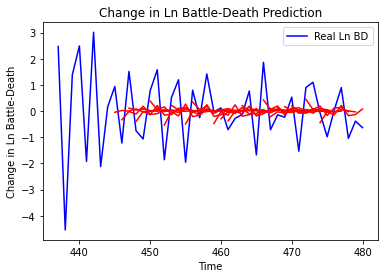

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8245973801034724, 'mae': 0.7737359901201842, 'r2': 0.2683543445722062, 'tadda_score': 0.8063482778079429}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.3087012892408292, 'mae': 0.9602723326348203, 'r2': -0.21012953499672649, 'tadda_score': 1.10483996568252}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.1838523745244651, 'mae': 0.8754189278975112, 'r2': -0.2764954089825964, 'tadda_score': 1.0250923203969977}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2240441872322803, 'mae': 0.9233937487601627, 'r2': 0.006277243198795857, 'tadda_score': 1.03517602961256}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.408655326266254, 'mae': 0.9917091722616557, 'r2': -0.18737764993906825, 'tadda_score': 1.1779469153239333}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.3610269338662035, 'mae

4/4 [==============================] - 0s 12ms/step - loss: 2.7399 - val_loss: 0.0013
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 2.7207 - val_loss: 0.0012
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.7243 - val_loss: 0.0011
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 2.7386 - val_loss: 0.0011
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 2.7116 - val_loss: 0.0010
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 2.7237 - val_loss: 9.9933e-04
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 2.7260 - val_loss: 9.5580e-04
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.7114 - val_loss: 9.9065e-04
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.7264 - val_loss: 9.9035e-04
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 2.7178 - val_loss: 9.9478e-04
Epo

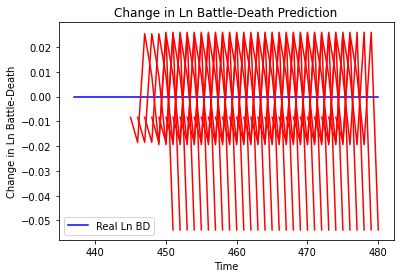

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 7.007038525021214e-05, 'mae': 0.008370805531740189, 'r2': 0.0, 'tadda_score': 0.008370805531740189}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.000721361873808668, 'mae': 0.02685818076133728, 'r2': 0.0, 'tadda_score': 0.02685818076133728}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 2.301954916964638e-06, 'mae': 0.0015172194689512253, 'r2': 0.0, 'tadda_score': 0.0015172194689512253}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 4.740759231431583e-05, 'mae': 0.006885317154228687, 'r2': 0.0, 'tadda_score': 0.006885317154228687}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 3.541877296125984e-05, 'mae': 0.0059513673186302185, 'r2': 0.0, 'tadda_score': 0.0059513673186302185}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.0010170985798269166, 'mae': 0.03189198300242424, 'r2': 0.

4/4 [==============================] - 0s 11ms/step - loss: 0.1225 - val_loss: 1.6780
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1214 - val_loss: 1.6773
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1211 - val_loss: 1.6765
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1213 - val_loss: 1.6758
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1211 - val_loss: 1.6751
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1194 - val_loss: 1.6743
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1197 - val_loss: 1.6734
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1211 - val_loss: 1.6724
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1199 - val_loss: 1.6713
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1193 - val_loss: 1.6701
Epoch 71/100
4/4 [=====

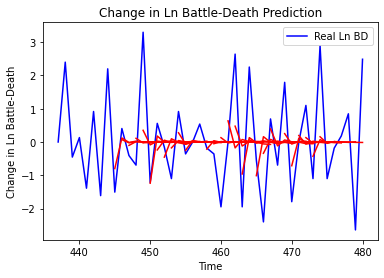

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4992519505708293, 'mae': 0.9164474771333845, 'r2': 0.2764676261916983, 'tadda_score': 0.932428214293034}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.3097365863433206, 'mae': 1.243614792716128, 'r2': -0.209982675343642, 'tadda_score': 1.4262197772826974}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.416672365413173, 'mae': 1.1939986229440613, 'r2': -0.10674688560781287, 'tadda_score': 1.317976054350639}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.0887568620277106, 'mae': 1.4183239198020277, 'r2': -0.09986344886536802, 'tadda_score': 1.541614250470318}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 1.9864882593685147, 'mae': 1.0948933436455006, 'r2': -0.31153579598231795, 'tadda_score': 1.2697428988833401}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.4236621570355017, 'mae'

3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] 

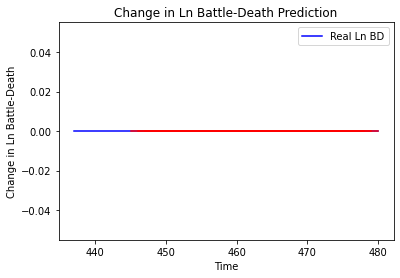

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_931"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 11ms/step - loss: 0.0719 - val_loss: 1.5094e-06
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0721 - val_loss: 7.2458e-06
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0725 - val_loss: 1.1564e-05
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0738 - val_loss: 1.0430e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0727 - val_loss: 3.5603e-06
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0728 - val_loss: 1.1438e-06
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0718 - val_loss: 1.3713e-06
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0716 - val_loss: 8.5594e-07
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0724 - val_loss: 2.4351e-06
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0734 - val_

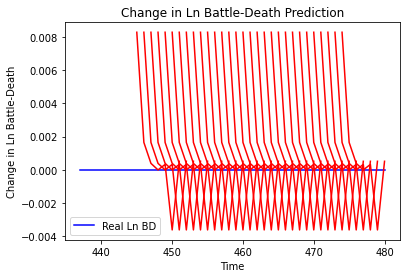

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 6.868485805569882e-05, 'mae': 0.008287632837891579, 'r2': 0.0, 'tadda_score': 0.008287632837891579}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 9.872896784613241e-05, 'mae': 0.009936245158314705, 'r2': 0.0, 'tadda_score': 0.009936245158314705}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.0001065805610230711, 'mae': 0.010323786176741123, 'r2': 0.0, 'tadda_score': 0.010323786176741123}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.00010644251834980578, 'mae': 0.01031709834933281, 'r2': 0.0, 'tadda_score': 0.01031709834933281}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 8.08666918409454e-05, 'mae': 0.008992590941488743, 'r2': 0.0, 'tadda_score': 0.008992590941488743}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 2.8846917328830858e-05, 'mae': 0.0053709326311945915, 'r

Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0638 - val_loss: 0.1336
Epoch 62/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0634 - val_loss: 0.1336
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0624 - val_loss: 0.1335
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0629 - val_loss: 0.1334
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0627 - val_loss: 0.1333
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0619 - val_loss: 0.1332
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0618 - val_loss: 0.1332
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0641 - val_loss: 0.1331
Epoch 69/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0623 - val_loss: 0.1330
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0642 - val_loss: 0.1329
Epoch 71/1

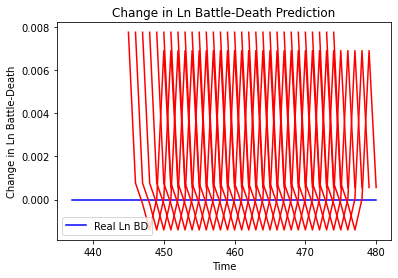

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 6.013703719800426e-05, 'mae': 0.007754807360470295, 'r2': 0.0, 'tadda_score': 0.007754807360470295}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 7.258111109789776e-05, 'mae': 0.00851945485919714, 'r2': 0.0, 'tadda_score': 0.00851945485919714}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 6.93778780835189e-05, 'mae': 0.008329338394105434, 'r2': 0.0, 'tadda_score': 0.008329338394105434}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 4.798325010294349e-05, 'mae': 0.006926994305104017, 'r2': 0.0, 'tadda_score': 0.006926994305104017}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 3.840863737934134e-05, 'mae': 0.006197470240294933, 'r2': 0.0, 'tadda_score': 0.006197470240294933}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.0001716207390313508, 'mae': 0.0131004

Epoch 61/100
1/1 [==============================] - 0s 25ms/step - loss: 3.3350 - val_loss: 1.0772
Epoch 62/100
1/1 [==============================] - 0s 25ms/step - loss: 3.3198 - val_loss: 1.0776
Epoch 63/100
1/1 [==============================] - 0s 22ms/step - loss: 3.3221 - val_loss: 1.0780
Epoch 64/100
1/1 [==============================] - 0s 26ms/step - loss: 3.2847 - val_loss: 1.0786
Epoch 65/100
1/1 [==============================] - 0s 24ms/step - loss: 3.2928 - val_loss: 1.0791
Epoch 66/100
1/1 [==============================] - 0s 26ms/step - loss: 3.3575 - val_loss: 1.0795
Epoch 67/100
1/1 [==============================] - 0s 24ms/step - loss: 3.3088 - val_loss: 1.0800
Epoch 68/100
1/1 [==============================] - 0s 23ms/step - loss: 3.3513 - val_loss: 1.0805
Epoch 69/100
1/1 [==============================] - 0s 24ms/step - loss: 3.3356 - val_loss: 1.0808
Epoch 70/100
1/1 [==============================] - 0s 37ms/step - loss: 3.3135 - val_loss: 1.0810
Epoch 71/1

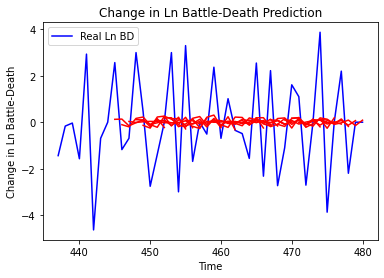

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.7468384072610657, 'mae': 1.6320207947088805, 'r2': 0.06360511461682228, 'tadda_score': 1.6483940465841223}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.406600389198947, 'mae': 1.7216879223823007, 'r2': -0.03277633190199403, 'tadda_score': 1.832785935207154}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.948320370515446, 'mae': 1.6683845227625642, 'r2': -0.01811896984821515, 'tadda_score': 1.7117210603670947}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.3304280172083027, 'mae': 1.4403744114266959, 'r2': -0.00311353123812963, 'tadda_score': 1.4779261509902404}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.2933871367650935, 'mae': 1.9514592539204734, 'r2': -0.0096489054018436, 'tadda_score': 2.0147780916028797}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.66543758806105, 'ma

1/1 [==============================] - 0s 22ms/step - loss: 6.6588 - val_loss: 4.7240
Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5912 - val_loss: 4.7236
Epoch 62/100
1/1 [==============================] - 0s 22ms/step - loss: 6.5808 - val_loss: 4.7232
Epoch 63/100
1/1 [==============================] - 0s 21ms/step - loss: 6.6121 - val_loss: 4.7229
Epoch 64/100
1/1 [==============================] - 0s 20ms/step - loss: 6.5802 - val_loss: 4.7225
Epoch 65/100
1/1 [==============================] - 0s 19ms/step - loss: 6.6177 - val_loss: 4.7220
Epoch 66/100
1/1 [==============================] - 0s 21ms/step - loss: 6.6865 - val_loss: 4.7214
Epoch 67/100
1/1 [==============================] - 0s 21ms/step - loss: 6.6057 - val_loss: 4.7209
Epoch 68/100
1/1 [==============================] - 0s 23ms/step - loss: 6.5653 - val_loss: 4.7205
Epoch 69/100
1/1 [==============================] - 0s 24ms/step - loss: 6.5539 - val_loss: 4.7202
Epoch 70/100
1/1 [=====

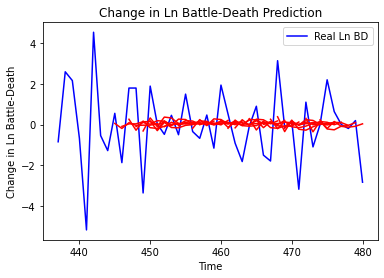

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.0084443492479935, 'mae': 1.1243177730621885, 'r2': 0.09716682105558161, 'tadda_score': 1.161407303564945}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.763516740538523, 'mae': 1.2951494997488677, 'r2': -0.022620116264633117, 'tadda_score': 1.3200776556628169}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.8429122173906283, 'mae': 1.3886841606626936, 'r2': -0.0873321826217297, 'tadda_score': 1.4481213104258008}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.425259078073325, 'mae': 1.5429516901809521, 'r2': -0.08662258745858109, 'tadda_score': 1.6330659926174629}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.8717801122942475, 'mae': 1.2743560999569858, 'r2': -0.13851886192722174, 'tadda_score': 1.3750291419463916}
{'country': 'South Sudan', 'country_id': 246, 'step'

In [61]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=8, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_936"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_918 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1836 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1836 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1837 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1837 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 101ms/step - loss: 0.0000

Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [===================

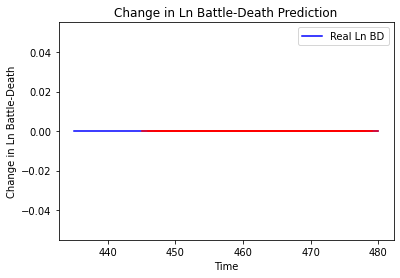

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_937"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 11ms/step - loss: 0.5250 - val_loss: 0.3961
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5256 - val_loss: 0.3961
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5254 - val_loss: 0.3960
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5223 - val_loss: 0.3959
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5234 - val_loss: 0.3958
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5277 - val_loss: 0.3958
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5283 - val_loss: 0.3957
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5257 - val_loss: 0.3956
Epoch 72/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5261 - val_loss: 0.3956
Epoch 73/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5211 - val_loss: 0.3955
Epoch 74/100
4/4 [=====

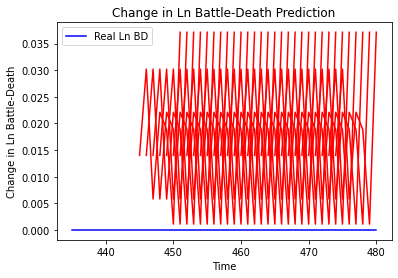

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.00019586902297919276, 'mae': 0.013995321467518806, 'r2': 0.0, 'tadda_score': 0.013995321467518806}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.0019538042808591727, 'mae': 0.04420185834169388, 'r2': 0.0, 'tadda_score': 0.04420185834169388}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0025007038313740737, 'mae': 0.050007037818431854, 'r2': 0.0, 'tadda_score': 0.050007037818431854}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0052002911957061415, 'mae': 0.0721130445599556, 'r2': 0.0, 'tadda_score': 0.0721130445599556}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.003692860845255233, 'mae': 0.060768913477659225, 'r2': 0.0, 'tadda_score': 0.060768913477659225}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.0038263658748205476, 'mae': 

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

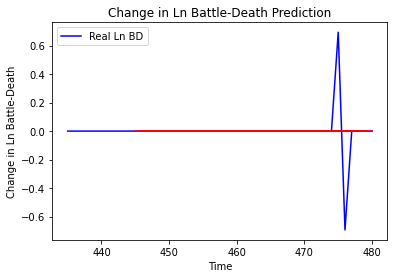

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_939"
_________________________________________________________________
Layer (type)                 Output Shape      

4/4 [==============================] - 0s 11ms/step - loss: 1.1831 - val_loss: 1.7908e-04
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2018 - val_loss: 1.5953e-04
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 1.1989 - val_loss: 1.2919e-04
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.1981 - val_loss: 1.2457e-04
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 1.1980 - val_loss: 1.1862e-04
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2087 - val_loss: 1.4352e-04
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 1.1955 - val_loss: 2.0997e-04
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.1929 - val_loss: 2.8708e-04
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1868 - val_loss: 4.0332e-04
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 1.1944 - val_

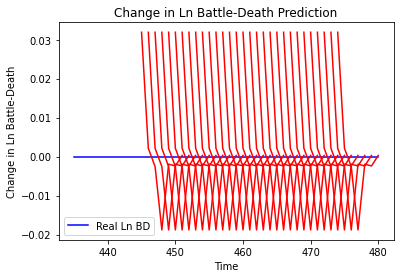

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.0010184669823667392, 'mae': 0.031913429498672485, 'r2': 0.0, 'tadda_score': 0.031913429498672485}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.001159001884297517, 'mae': 0.034044116735458374, 'r2': 0.0, 'tadda_score': 0.034044116735458374}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.00099137341147916, 'mae': 0.03148608282208443, 'r2': 0.0, 'tadda_score': 0.03148608282208443}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.0001603505614422053, 'mae': 0.012662960216403008, 'r2': 0.0, 'tadda_score': 0.012662960216403008}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 7.364748968877524e-05, 'mae': 0.008581811562180519, 'r2': 0.0, 'tadda_score': 0.008581811562180519}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 3.822274397130565e-05, 'mae': 0.006182454526424408, 'r2': 0.0, 't

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

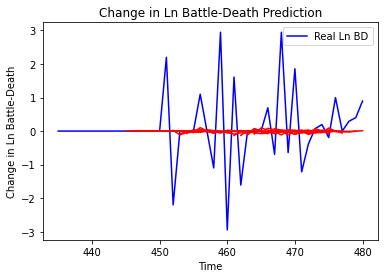

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.674238710279276, 'mae': 0.8332332137816079, 'r2': -0.015254911770222757, 'tadda_score': 0.8472674486381737}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2093439206894272, 'mae': 0.7352241713633051, 'r2': -0.02194604744216533, 'tadda_score': 0.7456920468017371}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.064665441603437, 'mae': 0.9182340956190045, 'r2': -0.03563924907485494, 'tadda_score': 0.9354294198151742}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.4313412448200458, 'mae': 1.0361026264789712, 'r2': -0.09528158637908168, 'tadda_score': 1.0650280897257738}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.3729660415105696, 'mae': 0.959166640335863, 'r2': -0.13834165420423705, 'tadda_score': 0.9828544773603928}
{'country': 'Burkina Faso', 'country_id': 47, 'ste

Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2681 - val_loss: 8.5068e-06
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2709 - val_loss: 6.8682e-06
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2702 - val_loss: 7.6880e-06
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2699 - val_loss: 8.5167e-06
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2720 - val_loss: 1.3299e-05
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2693 - val_loss: 1.4985e-05
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2691 - val_loss: 1.9359e-05
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2696 - val_loss: 1.7068e-05
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.2697 - val_loss: 1.8156e-05
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 

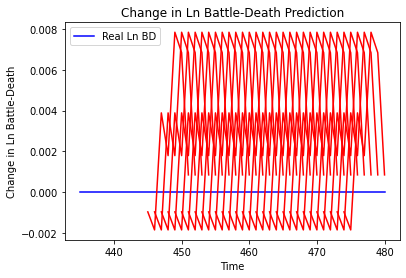

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 9.265173966431593e-07, 'mae': 0.0009625577367842197, 'r2': 0.0, 'tadda_score': 0.0009625577367842197}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 7.888225919895858e-06, 'mae': 0.002808598568663001, 'r2': 0.0, 'tadda_score': 0.002808598568663001}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 1.161569150576506e-06, 'mae': 0.0010777611751109362, 'r2': 0.0, 'tadda_score': 0.0010777611751109362}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 8.241338754831943e-06, 'mae': 0.002870773198083043, 'r2': 0.0, 'tadda_score': 0.002870773198083043}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.00015755847012955196, 'mae': 0.012552229687571526, 'r2': 0.0, 'tadda_score': 0.012552229687571526}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.0003758040328927237, 'mae': 0.01938566565513611, 'r2': 0.0,

Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7063 - val_loss: 5.7637e-05
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7049 - val_loss: 7.1906e-05
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7049 - val_loss: 8.0690e-05
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7098 - val_loss: 1.0187e-04
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7006 - val_loss: 1.1567e-04
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7026 - val_loss: 9.8957e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6996 - val_loss: 9.0870e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6968 - val_loss: 8.1862e-05
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6942 - val_loss: 7.5178e-05
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 

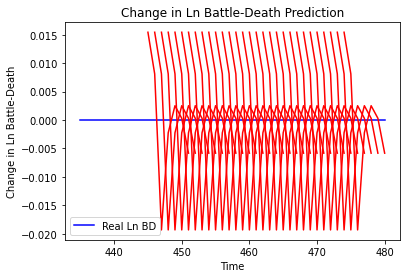

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00023844589399640848, 'mae': 0.015441693365573883, 'r2': 0.0, 'tadda_score': 0.015441693365573883}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.0005548798530161138, 'mae': 0.02355588786303997, 'r2': 0.0, 'tadda_score': 0.02355588786303997}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 1.7803255785653338e-05, 'mae': 0.004219390451908112, 'r2': 0.0, 'tadda_score': 0.004219390451908112}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 3.904272010705134e-06, 'mae': 0.001975923078134656, 'r2': 0.0, 'tadda_score': 0.001975923078134656}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 1.3116978948247851e-05, 'mae': 0.0036217370070517063, 'r2': 0.0, 'tadda_score': 0.0036217370070517063}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 1.1008026277628416e-0

4/4 [==============================] - 0s 10ms/step - loss: 1.1534 - val_loss: 3.1494
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1473 - val_loss: 3.1482
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1441 - val_loss: 3.1469
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1500 - val_loss: 3.1456
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1393 - val_loss: 3.1444
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 1.1392 - val_loss: 3.1429
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 1.1466 - val_loss: 3.1415
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1491 - val_loss: 3.1404
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.1452 - val_loss: 3.1393
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 1.1418 - val_loss: 3.1383
Epoch 70/100
4/4 [======

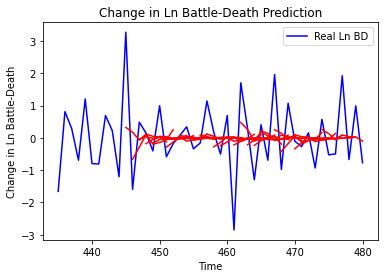

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.9601904891088895, 'mae': 0.7015900233486758, 'r2': 0.23940201210852852, 'tadda_score': 0.7313580026886828}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.2583121508739015, 'mae': 0.8744665790665981, 'r2': -0.29966897476858234, 'tadda_score': 1.0474439679651297}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.2285662983577361, 'mae': 0.9250735260429276, 'r2': -0.08217028197553455, 'tadda_score': 1.0797528862215375}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.7187922640323285, 'mae': 1.0830615000166532, 'r2': -0.14935832677068706, 'tadda_score': 1.2713329203414958}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.4582002524210886, 'mae': 0.9882671384234897, 'r2': -0.34671763018469615, 'tadda_score': 1.1515665511384279}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7747810489352303, 'mae': 1.

4/4 [==============================] - 0s 10ms/step - loss: 1.6401 - val_loss: 0.4829
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6577 - val_loss: 0.4827
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6478 - val_loss: 0.4826
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6438 - val_loss: 0.4825
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6556 - val_loss: 0.4825
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6488 - val_loss: 0.4824
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6426 - val_loss: 0.4823
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6592 - val_loss: 0.4821
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 1.6445 - val_loss: 0.4819
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6557 - val_loss: 0.4819
Epoch 70/100
4/4 [=====

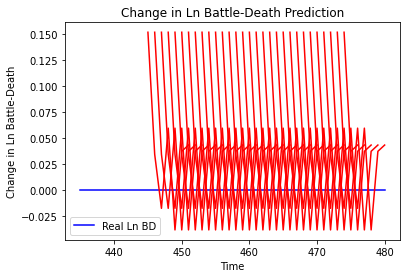

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.02311077582058929, 'mae': 0.15202228724956512, 'r2': 0.0, 'tadda_score': 0.15202228724956512}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.0347546863667445, 'mae': 0.1864260882139206, 'r2': 0.0, 'tadda_score': 0.1864260882139206}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.02851867801291519, 'mae': 0.16887474060058594, 'r2': 0.0, 'tadda_score': 0.16887474060058594}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.0522280334927514, 'mae': 0.228534534573555, 'r2': 0.0, 'tadda_score': 0.228534534573555}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.02426732096161288, 'mae': 0.15577971935272217, 'r2': 0.0, 'tadda_score': 0.15577971935272217}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.03730350861147613, 'mae': 0.1931411623954773, 'r2': 0.0, 'tadda_score': 0.193141162395

4/4 [==============================] - 0s 11ms/step - loss: 2.2340 - val_loss: 4.2691e-04
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2609 - val_loss: 4.0221e-04
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2277 - val_loss: 4.0996e-04
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 2.2375 - val_loss: 3.9521e-04
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2449 - val_loss: 3.9667e-04
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2351 - val_loss: 4.0133e-04
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2355 - val_loss: 4.0546e-04
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2516 - val_loss: 3.8839e-04
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2616 - val_loss: 3.6417e-04
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2374 - val_

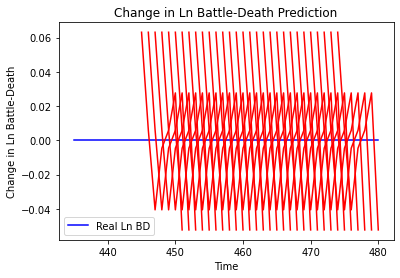

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.003986416536538917, 'mae': 0.06313807517290115, 'r2': 0.0, 'tadda_score': 0.06313807517290115}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.004794706403438376, 'mae': 0.06924381852149963, 'r2': 0.0, 'tadda_score': 0.06924381852149963}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.0008225449902460463, 'mae': 0.028680045157670975, 'r2': 0.0, 'tadda_score': 0.028680045157670975}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.0005816798417208752, 'mae': 0.02411803975701332, 'r2': 0.0, 'tadda_score': 0.02411803975701332}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.000569893779788392, 'mae': 0.02387244813144207, 'r2': 0.0, 'tadda_score': 0.02387244813144207}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.002661116382532358, 'mae': 0.0515860095

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

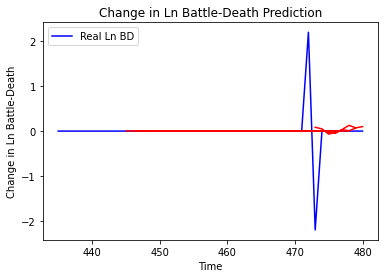

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6581 - val_loss: 5.0581e-05
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6563 - val_loss: 5.2305e-05
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6555 - val_loss: 4.1709e-05
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6587 - val_loss: 3.4022e-05
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6576 - val_loss: 3.5003e-05
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6592 - val_loss: 5.3262e-05
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6565 - val_loss: 5.5861e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6592 - val_loss: 6.4362e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6582 - val_loss: 7.4934e-05
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 

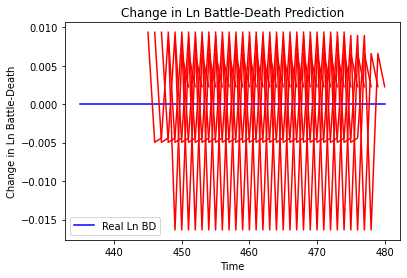

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 8.748736726746711e-05, 'mae': 0.00935346819460392, 'r2': 0.0, 'tadda_score': 0.00935346819460392}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 1.9313713934551203e-05, 'mae': 0.00439473707228899, 'r2': 0.0, 'tadda_score': 0.00439473707228899}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 1.269589487793571e-10, 'mae': 1.1267606168985367e-05, 'r2': 0.0, 'tadda_score': 1.1267606168985367e-05}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 7.970251555372912e-05, 'mae': 0.00892762653529644, 'r2': 0.0, 'tadda_score': 0.00892762653529644}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 6.066230853765675e-06, 'mae': 0.002462971955537796, 'r2': 0.0, 'tadda_score': 0.002462971955537796}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 1.7028005042121763e-05, 'mae': 0.004126500338315964, 'r

4/4 [==============================] - 0s 13ms/step - loss: 2.0561 - val_loss: 4.8624e-04
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0708 - val_loss: 4.3662e-04
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0463 - val_loss: 3.8592e-04
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0586 - val_loss: 3.3665e-04
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0364 - val_loss: 3.5884e-04
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0413 - val_loss: 4.0024e-04
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0681 - val_loss: 4.3313e-04
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0496 - val_loss: 5.0024e-04
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0583 - val_loss: 6.3807e-04
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0606 - val_

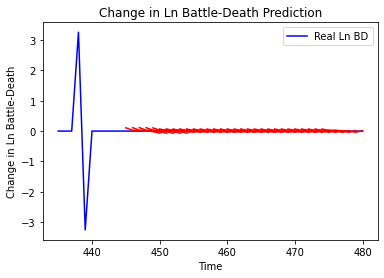

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.006198778120364063, 'mae': 0.07724616602063179, 'r2': 0.0, 'tadda_score': 0.07724616602063179}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.009193561177794204, 'mae': 0.09361013919115066, 'r2': 0.0, 'tadda_score': 0.09361013919115066}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.01550556699770776, 'mae': 0.12336408197879792, 'r2': 0.0, 'tadda_score': 0.12336408197879792}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.01729284972378619, 'mae': 0.13001146018505097, 'r2': 0.0, 'tadda_score': 0.13001146018505097}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.012802999175971152, 'mae': 0.1126819334924221, 'r2': 0.0, 'tadda_score': 0.1126819334924221}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.004536472196419716, 'mae': 0.06710391988356908, 'r2': 0.0, 'tadda_score': 0.0

4/4 [==============================] - 0s 13ms/step - loss: 4.7960 - val_loss: 2.5692
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 4.8326 - val_loss: 2.5681
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 4.8308 - val_loss: 2.5670
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 4.7958 - val_loss: 2.5657
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 4.8075 - val_loss: 2.5645
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 4.8233 - val_loss: 2.5636
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 4.7831 - val_loss: 2.5628
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 4.8147 - val_loss: 2.5619
Epoch 69/100
4/4 [==============================] - 0s 15ms/step - loss: 4.8008 - val_loss: 2.5612
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 4.7962 - val_loss: 2.5602
Epoch 71/100
4/4 [=====

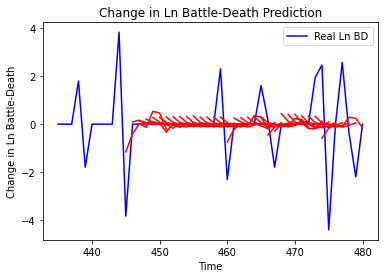

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0636426461219979, 'mae': 0.6938876331961159, 'r2': 0.22034115639377716, 'tadda_score': 0.7283796828107043}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.5676515283230685, 'mae': 1.0724960941753494, 'r2': -0.2868914342289781, 'tadda_score': 1.1557507056675065}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.6159336404522007, 'mae': 1.08622714814362, 'r2': -0.31109013714488465, 'tadda_score': 1.1811617715837268}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.719468221454364, 'mae': 1.1064188523771075, 'r2': -0.3629810436672305, 'tadda_score': 1.2098635170540917}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.2754326869063815, 'mae': 0.9104661001445559, 'r2': -0.140433116271381, 'tadda_score': 0.9597837570986855}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 1.8476959824

4/4 [==============================] - 0s 13ms/step - loss: 0.9543 - val_loss: 1.0128
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9580 - val_loss: 1.0124
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9555 - val_loss: 1.0120
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9538 - val_loss: 1.0117
Epoch 64/100
4/4 [==============================] - 0s 15ms/step - loss: 0.9522 - val_loss: 1.0114
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.9514 - val_loss: 1.0110
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9526 - val_loss: 1.0105
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9469 - val_loss: 1.0101
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9497 - val_loss: 1.0097
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9541 - val_loss: 1.0093
Epoch 70/100
4/4 [=====

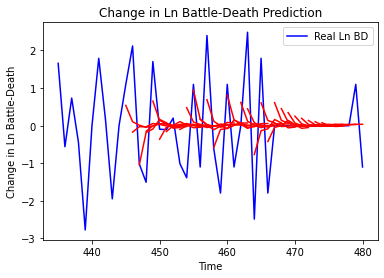

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.1174831490346162, 'mae': 0.8005661160424755, 'r2': 0.29932621807490656, 'tadda_score': 0.8295342287719654}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.3615923914729695, 'mae': 1.1550527020602304, 'r2': -0.40220410350074043, 'tadda_score': 1.4016661618770538}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.547171909236063, 'mae': 1.2478811868425221, 'r2': -0.41993337895599114, 'tadda_score': 1.509925161266924}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.6692957126167443, 'mae': 1.2532438072507608, 'r2': -0.30752408876319803, 'tadda_score': 1.4666859426046441}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.7827092675722451, 'mae': 0.9749101469222847, 'r2': -0.3246755206897809, 'tadda_score': 1.1242233561281507}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 1.999275140174

4/4 [==============================] - 0s 13ms/step - loss: 0.1987 - val_loss: 1.2356
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1973 - val_loss: 1.2355
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1985 - val_loss: 1.2355
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1984 - val_loss: 1.2356
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1994 - val_loss: 1.2355
Epoch 65/100
4/4 [==============================] - 0s 15ms/step - loss: 0.1990 - val_loss: 1.2355
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1981 - val_loss: 1.2355
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1960 - val_loss: 1.2355
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1955 - val_loss: 1.2356
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1972 - val_loss: 1.2357
Epoch 70/100
4/4 [=====

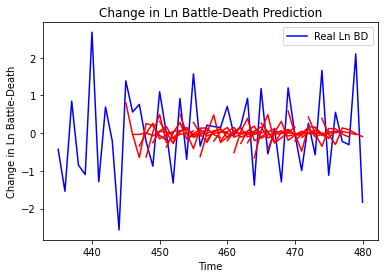

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5375177541242923, 'mae': 0.6411021449183596, 'r2': 0.27013067483314646, 'tadda_score': 0.7032084737484825}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.1318682741407244, 'mae': 0.9219493257647116, 'r2': -0.5334357890742156, 'tadda_score': 1.1537744785492976}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.0634676586057497, 'mae': 0.8210493586504017, 'r2': -0.08516775678958832, 'tadda_score': 0.8540208932800646}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.1282112831123463, 'mae': 0.8601856987997472, 'r2': -0.2810544127018093, 'tadda_score': 0.9697565548196018}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.3980674123629673, 'mae': 0.9604489182322744, 'r2': -0.40553760454772747, 'tadda_score': 1.1305513769278452}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.74978

4/4 [==============================] - 0s 12ms/step - loss: 0.7528 - val_loss: 2.5843
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7541 - val_loss: 2.5838
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7512 - val_loss: 2.5831
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7532 - val_loss: 2.5825
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7506 - val_loss: 2.5817
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7544 - val_loss: 2.5811
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7493 - val_loss: 2.5805
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7547 - val_loss: 2.5799
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7507 - val_loss: 2.5794
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7524 - val_loss: 2.5789
Epoch 70/100
4/4 [=====

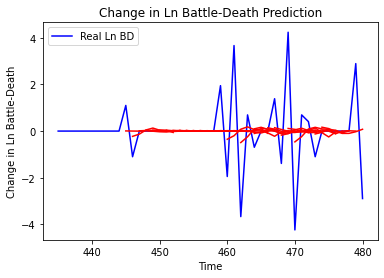

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.2849558028488404, 'mae': 0.8950271978084172, 'r2': 0.13603599114899712, 'tadda_score': 0.8980075226206506}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.5001177469627247, 'mae': 0.7857381930521898, 'r2': -0.02468935164019115, 'tadda_score': 0.8062978016159706}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.1620732624742347, 'mae': 0.8833443264455972, 'r2': 0.0775427594948449, 'tadda_score': 0.9009457917552569}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.424804096067113, 'mae': 0.8647989061553896, 'r2': -0.002960431772850436, 'tadda_score': 0.8761818849374473}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.5623657987569746, 'mae': 0.8894173411645467, 'r2': -0.011132458860794614, 'tadda_score': 0.91055744

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0806
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - 

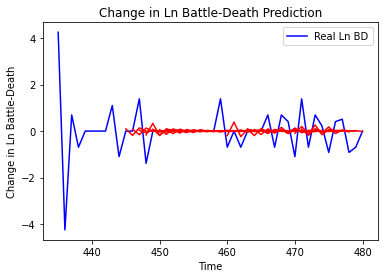

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.36703953588254273, 'mae': 0.4039917720040021, 'r2': 0.11094144150670016, 'tadda_score': 0.40911916570666806}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39054648293232525, 'mae': 0.42700857662234315, 'r2': 0.050911087178939884, 'tadda_score': 0.4379237537515522}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.49063587688161764, 'mae': 0.4747542079921589, 'r2': -0.02685538238591545, 'tadda_score': 0.47992262539873776}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4947445666900635, 'mae': 0.4642731966808251, 'r2': -0.02459311150506749, 'tadda_score': 0.46651946409144124}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.5022399680821172, 'mae': 0.514010594094124, 'r2': -0.14161372164360153, 'tadda_score': 0.5525924635969862}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.595

Epoch 56/100
4/4 [==============================] - ETA: 0s - loss: 0.0000e+0 - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/

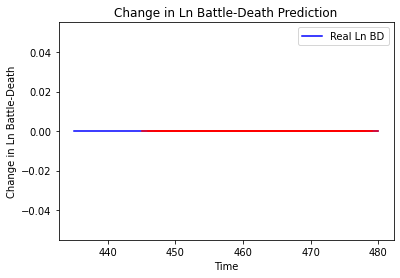

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_955"
_________________________________________________________________
Layer (type)                 Output S

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] 

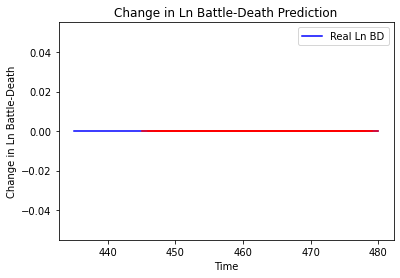

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_956"
_______________________________

4/4 [==============================] - 0s 12ms/step - loss: 0.8859 - val_loss: 1.4874
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8829 - val_loss: 1.4867
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8920 - val_loss: 1.4861
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8873 - val_loss: 1.4855
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8836 - val_loss: 1.4849
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8850 - val_loss: 1.4844
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8917 - val_loss: 1.4840
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8804 - val_loss: 1.4835
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8877 - val_loss: 1.4830
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8845 - val_loss: 1.4826
Epoch 74/100
4/4 [=====

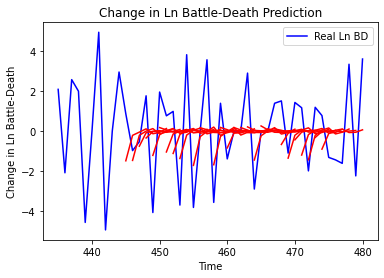

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.380772090527297, 'mae': 1.5242905472990391, 'r2': 0.21955787386728054, 'tadda_score': 1.7749063922367014}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 5.943371488909194, 'mae': 2.032749862535557, 'r2': -0.5135379090297529, 'tadda_score': 2.3999771749613292}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.38511867397705, 'mae': 1.7969944667762583, 'r2': -0.3904132628890047, 'tadda_score': 2.1805138609753114}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 5.503711777491583, 'mae': 1.9748374367167234, 'r2': -0.2130120080714495, 'tadda_score': 2.2811226716299533}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 6.87936094953699, 'mae': 2.0936890172640674, 'r2': -0.250604590847902, 'tadda_score': 2.4074021507233576}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 6.390515764526301, 'mae': 1.98187791

4/4 [==============================] - 0s 12ms/step - loss: 0.5484 - val_loss: 1.2310
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5509 - val_loss: 1.2306
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5461 - val_loss: 1.2303
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5432 - val_loss: 1.2300
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5419 - val_loss: 1.2297
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5463 - val_loss: 1.2294
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5416 - val_loss: 1.2291
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5386 - val_loss: 1.2289
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5414 - val_loss: 1.2285
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5377 - val_loss: 1.2283
Epoch 70/100
4/4 [=====

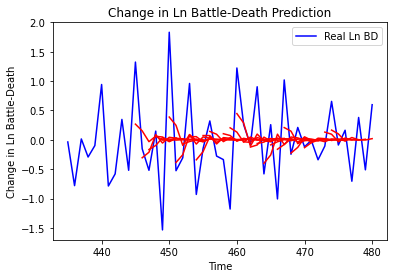

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.42919763090637375, 'mae': 0.48863106493271513, 'r2': 0.2490062576460813, 'tadda_score': 0.514342852424752}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.7766602337744015, 'mae': 0.6978936937920601, 'r2': -0.43541490400520044, 'tadda_score': 0.8417160283125789}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.7476749846568154, 'mae': 0.6650532551114137, 'r2': -0.22031555969086414, 'tadda_score': 0.782829022656319}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.9520084704765185, 'mae': 0.7387164206453564, 'r2': -0.27979480291563164, 'tadda_score': 0.9053639362154803}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6466678887923062, 'mae': 0.6277508205372293, 'r2': -0.26311428759511934, 'tadda_score': 0.7288481035528778}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.6998537696

Epoch 56/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

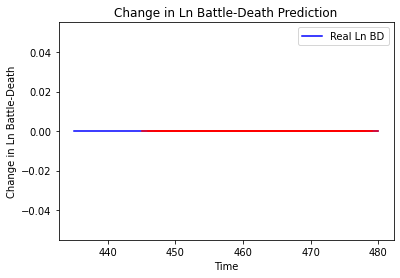

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_959"
____

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

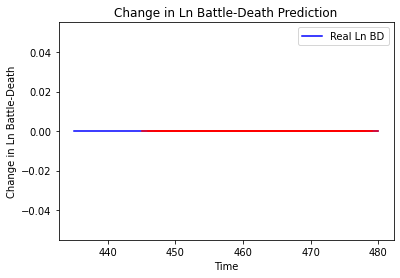

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_960"
_________________________________________________________________
Layer (type)                 Output Shape             

Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5061 - val_loss: 0.3408
Epoch 66/100
4/4 [==============================] - 0s 23ms/step - loss: 2.5179 - val_loss: 0.3407
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5187 - val_loss: 0.3407
Epoch 68/100
4/4 [==============================] - 0s 14ms/step - loss: 2.5166 - val_loss: 0.3406
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5071 - val_loss: 0.3405
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4954 - val_loss: 0.3404
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 2.5021 - val_loss: 0.3403
Epoch 72/100
4/4 [==============================] - 0s 12ms/step - loss: 2.4958 - val_loss: 0.3402
Epoch 73/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5058 - val_loss: 0.3401
Epoch 74/100
4/4 [==============================] - 0s 11ms/step - loss: 2.5047 - val_loss: 0.3400
Epoch 75/1

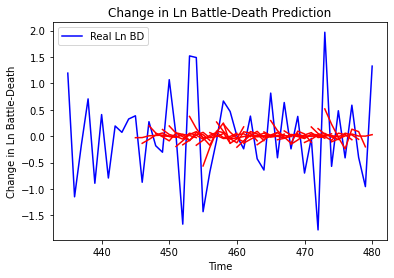

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.6006693053730231, 'mae': 0.6129984425534227, 'r2': 0.21149826846856812, 'tadda_score': 0.66505541858866}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.1932429677200957, 'mae': 0.8208608168115348, 'r2': -0.2168103409474882, 'tadda_score': 0.959037845917059}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.0720963870151694, 'mae': 0.7799460985908778, 'r2': -0.343321760531893, 'tadda_score': 0.9209934896379581}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.8007135352598251, 'mae': 0.7412502537838915, 'r2': -0.15513304396055227, 'tadda_score': 0.8170613158230782}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8241314072887891, 'mae': 0.6654149434476023, 'r2': -0.06905736786463423, 'tadda_score': 0.7367854193110192}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.731114981

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

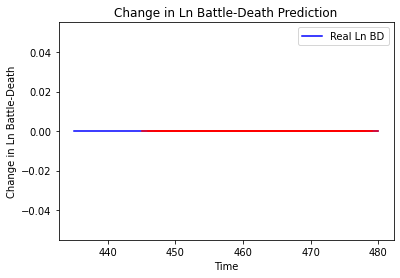

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_962"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 11ms/step - loss: 1.9959 - val_loss: 1.3645
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9927 - val_loss: 1.3639
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9900 - val_loss: 1.3634
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9905 - val_loss: 1.3630
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9793 - val_loss: 1.3626
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9917 - val_loss: 1.3622
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9784 - val_loss: 1.3617
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9727 - val_loss: 1.3612
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9946 - val_loss: 1.3609
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 1.9727 - val_loss: 1.3605
Epoch 74/100
4/4 [=====

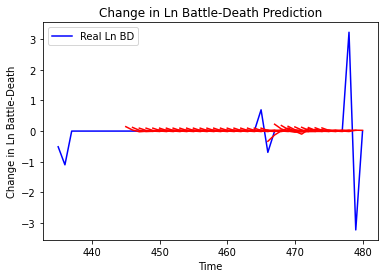

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.028668748798973298, 'mae': 0.13579409283616226, 'r2': 0.10494633288362798, 'tadda_score': 0.13579409283616226}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.0670588710147939, 'mae': 0.18657985118248147, 'r2': -1.0936138104717208, 'tadda_score': 0.19630837129769804}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.061938942091279814, 'mae': 0.17827424766836644, 'r2': -0.9337668917763864, 'tadda_score': 0.18587650221802873}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.05588132789135361, 'mae': 0.17390847640452864, 'r2': -0.7446449373570039, 'tadda_score': 0.17976223565358004}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.04275369669832984, 'mae': 0.1323110142073838, 'r2': -0.33479327196838393, 'tadda_score': 0.13579474625208063}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 

4/4 [==============================] - 0s 12ms/step - loss: 2.4090 - val_loss: 0.1894
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 2.4085 - val_loss: 0.1893
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.4081 - val_loss: 0.1892
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 2.3993 - val_loss: 0.1890
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 2.3935 - val_loss: 0.1889
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.3939 - val_loss: 0.1888
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 2.3923 - val_loss: 0.1887
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.3920 - val_loss: 0.1887
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.3932 - val_loss: 0.1887
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 2.3960 - val_loss: 0.1886
Epoch 70/100
4/4 [=====

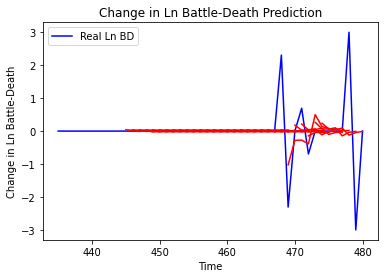

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.24963276200187146, 'mae': 0.20466593501602173, 'r2': 0.35242752481261386, 'tadda_score': 0.20466593501602173}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.48333002162241717, 'mae': 0.3165605035685953, 'r2': -0.2538066555224636, 'tadda_score': 0.3347379070782121}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.4204458985282062, 'mae': 0.29482709800617374, 'r2': -0.5064991052299919, 'tadda_score': 0.3164031558773565}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.4565474700145872, 'mae': 0.3149017018976362, 'r2': -0.23745341254171115, 'tadda_score': 0.3149017018976362}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.45374388415424677, 'mae': 0.25167036706234536, 'r2': -0.22985440670312607, 'tadda_score': 0.2609782562059712}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.4337

Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

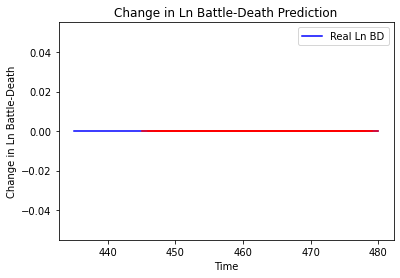

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_965"
_________________________________________________________________
Layer (type)                 Out

Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

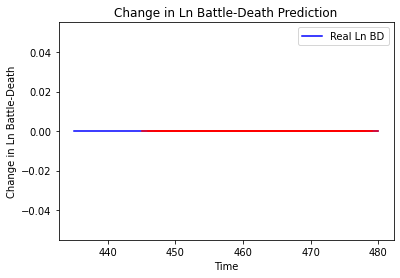

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_966"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 11ms/step - loss: 0.1326 - val_loss: 2.8031e-05
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1336 - val_loss: 2.7445e-05
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1344 - val_loss: 2.9676e-05
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1345 - val_loss: 2.4946e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1324 - val_loss: 2.2014e-05
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1322 - val_loss: 1.5630e-05
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1323 - val_loss: 1.0035e-05
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1321 - val_loss: 8.2240e-06
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1345 - val_loss: 1.2921e-05
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1320 - val_

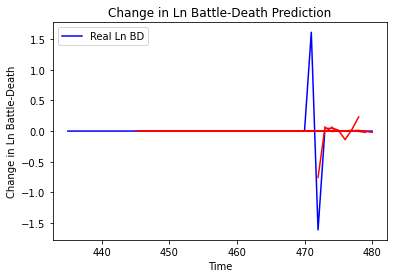

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.11050524850051867, 'mae': 0.08986364231828246, 'r2': 0.3600799619378783, 'tadda_score': 0.08986364231828246}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.19580093012590766, 'mae': 0.1380313873655314, 'r2': -0.1338550915812977, 'tadda_score': 0.13996963988907282}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.19335285247102402, 'mae': 0.13568449994932508, 'r2': -0.11967862514780703, 'tadda_score': 0.1375036781630009}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.10042099489331245, 'mae': 0.08204384789062488, 'r2': -0.2031522187098156, 'tadda_score': 0.08204384789062488}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10952840876877833, 'mae': 0.08905618171244063, 'r2': -0.3122688951838608, 'tadda_score': 0.08905618171244063}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'ms

Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1481 - val_loss: 8.1416e-06
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1494 - val_loss: 5.3531e-06
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1483 - val_loss: 3.1937e-06
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1491 - val_loss: 2.7413e-06
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1489 - val_loss: 2.7483e-06
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1505 - val_loss: 4.3997e-06
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1497 - val_loss: 3.4269e-06
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1499 - val_loss: 4.5983e-06
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1472 - val_loss: 7.7292e-06
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 

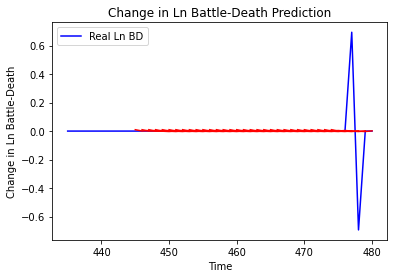

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 9.285640492493266e-05, 'mae': 0.009636202827095985, 'r2': 0.0, 'tadda_score': 0.009636202827095985}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 0.00010066537380802685, 'mae': 0.010033213533461094, 'r2': 0.0, 'tadda_score': 0.010033213533461094}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.00019557784389513666, 'mae': 0.013984914869070053, 'r2': 0.0, 'tadda_score': 0.013984914869070053}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00020331106892955506, 'mae': 0.01425871904939413, 'r2': 0.0, 'tadda_score': 0.01425871904939413}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.00016868664869090864, 'mae': 0.012987942434847355, 'r2': 0.0, 'tadda_score': 0.012987942434847355}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 9.739546870005458e-05, 'mae': 0.009868914261460304, 

4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

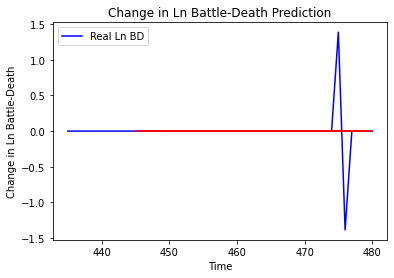

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_969"
_________________________________________________________________
Layer (type)                 O

4/4 [==============================] - 0s 11ms/step - loss: 0.9389 - val_loss: 0.5774
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9423 - val_loss: 0.5773
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9767 - val_loss: 0.5773
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9393 - val_loss: 0.5772
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9430 - val_loss: 0.5772
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9634 - val_loss: 0.5771
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9165 - val_loss: 0.5771
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9370 - val_loss: 0.5771
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9693 - val_loss: 0.5770
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.9169 - val_loss: 0.5771
Epoch 74/100
4/4 [=====

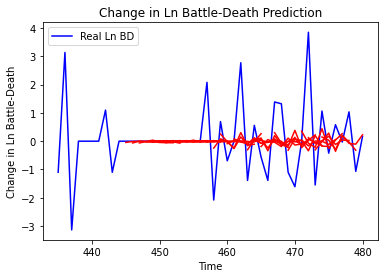

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.4124930551413157, 'mae': 0.7600393671550203, 'r2': 0.1023545346562772, 'tadda_score': 0.7662175542372315}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.133445231208292, 'mae': 0.9302369703200407, 'r2': -0.11504850220223051, 'tadda_score': 0.9927486968509304}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.0430113049744816, 'mae': 1.0102512372380972, 'r2': -0.06750007929346635, 'tadda_score': 1.0390641920612733}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.7302645245381931, 'mae': 0.8861409947438996, 'r2': -0.14812982934309815, 'tadda_score': 0.9763123192676865}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 0.976324726726772, 'mae': 0.6512786809501728, 'r2': -0.19209958904744262, 'tadda_score': 0.6945661631249073}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6

4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

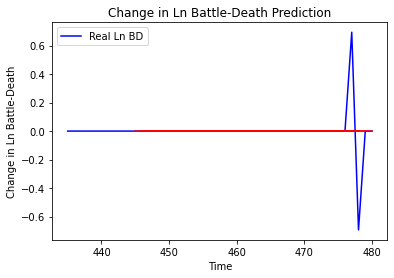

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_971"
_______________________________________________________

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

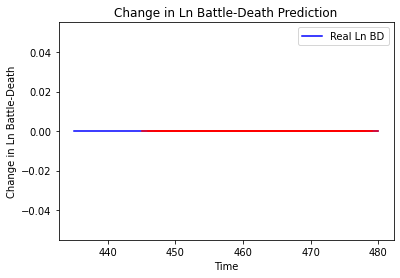

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_972"
_________________________________________________________________
Layer (type) 

4/4 [==============================] - 0s 11ms/step - loss: 3.3775 - val_loss: 0.1223
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3756 - val_loss: 0.1222
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3887 - val_loss: 0.1221
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3828 - val_loss: 0.1219
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3769 - val_loss: 0.1219
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3703 - val_loss: 0.1218
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3671 - val_loss: 0.1218
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3771 - val_loss: 0.1218
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3699 - val_loss: 0.1217
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3672 - val_loss: 0.1216
Epoch 74/100
4/4 [=====

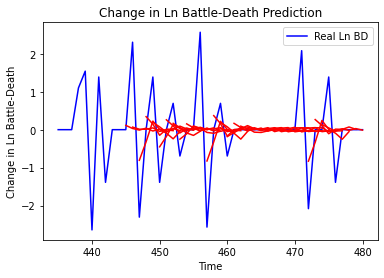

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.8790329735663321, 'mae': 0.5878046580838205, 'r2': 0.30921361644147427, 'tadda_score': 0.5888165561419766}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.6724216696242669, 'mae': 0.8764419960416397, 'r2': -0.31426937519480935, 'tadda_score': 0.9511919630007983}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.0444559888917826, 'mae': 0.6813173996954965, 'r2': -0.19077850626163717, 'tadda_score': 0.7133859035918919}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.0147649991629362, 'mae': 0.713001147531403, 'r2': 0.054603824927405564, 'tadda_score': 0.7236659463474482}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.0341304255526422, 'mae': 0.6210887014873346, 'r2': -0.056208153758492196, 'tadda_score': 0.638556444645675}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.3877971179

4/4 [==============================] - 0s 11ms/step - loss: 2.0014 - val_loss: 0.0561
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9928 - val_loss: 0.0561
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9871 - val_loss: 0.0561
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9925 - val_loss: 0.0561
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9894 - val_loss: 0.0561
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9910 - val_loss: 0.0560
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 1.9819 - val_loss: 0.0560
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9799 - val_loss: 0.0559
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9869 - val_loss: 0.0558
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 1.9781 - val_loss: 0.0558
Epoch 70/100
4/4 [=====

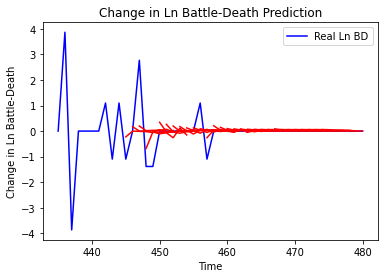

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.3952620923968663, 'mae': 0.33850784499660996, 'r2': 0.21530804259734715, 'tadda_score': 0.33850784499660996}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8648149251877371, 'mae': 0.5329152534271481, 'r2': -0.13797747274690608, 'tadda_score': 0.5809706871574325}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.7609385288003361, 'mae': 0.506974741719208, 'r2': -0.2829859475746639, 'tadda_score': 0.5581835730890848}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.8077807990622625, 'mae': 0.5454226726313848, 'r2': -0.16288861261185938, 'tadda_score': 0.6014925747136691}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.8144804038079366, 'mae': 0.5494832773030219, 'r2': -0.37326061581869396, 'tadda_score': 0.610942461989365}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8201722764722382

4/4 [==============================] - 0s 11ms/step - loss: 3.0370 - val_loss: 3.4751
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0231 - val_loss: 3.4735
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0180 - val_loss: 3.4718
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0129 - val_loss: 3.4701
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0205 - val_loss: 3.4685
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0105 - val_loss: 3.4668
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0001 - val_loss: 3.4651
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0334 - val_loss: 3.4637
Epoch 68/100
4/4 [==============================] - ETA: 0s - loss: 2.340 - 0s 10ms/step - loss: 3.0068 - val_loss: 3.4625
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0071 - val_loss: 3.4617

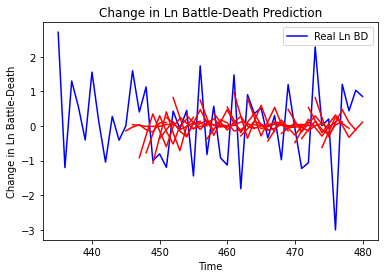

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.9153689896496743, 'mae': 0.7748670892642736, 'r2': 0.16364996702083945, 'tadda_score': 0.9082179323312441}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.452812002954268, 'mae': 1.2316904954990102, 'r2': -0.7347550018446538, 'tadda_score': 1.5838786679387444}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.434925063051875, 'mae': 1.20780679390678, 'r2': -0.4116032179950879, 'tadda_score': 1.4716524820114099}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.823826204305555, 'mae': 1.2961467498370425, 'r2': -0.620859234120531, 'tadda_score': 1.584180430454852}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.332120206074657, 'mae': 1.40577276435159, 'r2': -0.8151491857295183, 'tadda_score': 1.8104766109254198}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse': 3

Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

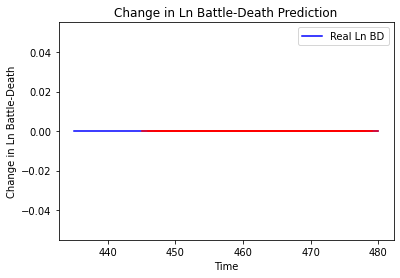

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_976"
_________________________________________________________________
Layer (type)                 Output Shap

4/4 [==============================] - 0s 12ms/step - loss: 0.1458 - val_loss: 2.6850e-06
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1462 - val_loss: 5.5481e-06
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1462 - val_loss: 8.7707e-06
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1448 - val_loss: 1.4784e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1464 - val_loss: 1.4173e-05
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1455 - val_loss: 1.6359e-05
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1455 - val_loss: 2.3254e-05
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1451 - val_loss: 2.1467e-05
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1468 - val_loss: 2.0844e-05
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1460 - val_

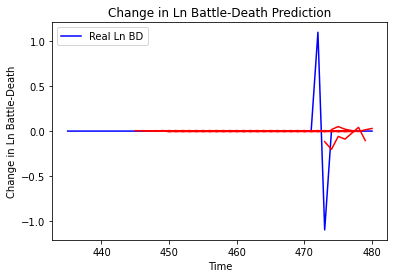

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07200961204819077, 'mae': 0.07358040357650014, 'r2': 0.10506225549450643, 'tadda_score': 0.07358040357650014}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.08845258794168492, 'mae': 0.09281782090063584, 'r2': -0.09929157089791874, 'tadda_score': 0.09504810650543066}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.044740001060733205, 'mae': 0.06004360537675864, 'r2': -0.15040721407572666, 'tadda_score': 0.06004360537675864}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04733847719271519, 'mae': 0.06265499935495701, 'r2': -0.2172222703332749, 'tadda_score': 0.06265499935495701}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04241756699146502, 'mae': 0.056727334754644296, 'r2': -0.09069007406326746, 'tadda_score': 0.056727334754644296}
{'country': 'Namibia', 'country_id': 170, 'step': 't

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

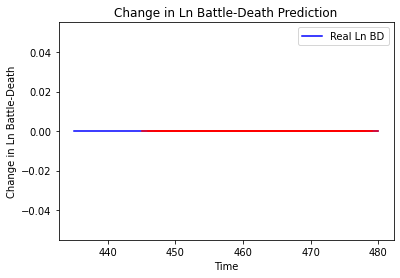

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_978"
_________________________________________________________________
Lay

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

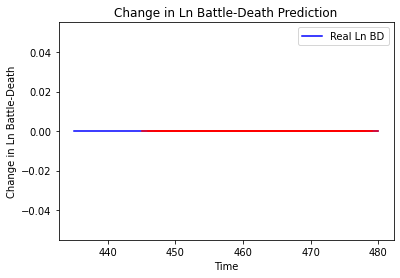

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_979"
_________________________________________________________________
Layer (ty

Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

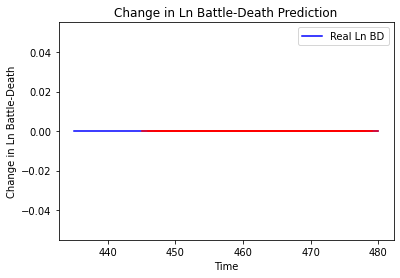

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_980"
_________________________________________________________________
Layer (

4/4 [==============================] - 0s 11ms/step - loss: 0.0012 - val_loss: 2.2100
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0011 - val_loss: 2.2100
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0012 - val_loss: 2.2100
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0012 - val_loss: 2.2100
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0011 - val_loss: 2.2101
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0011 - val_loss: 2.2102
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0012 - val_loss: 2.2103
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0012 - val_loss: 2.2103
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0011 - val_loss: 2.2104
Epoch 73/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0012 - val_loss: 2.2104
Epoch 74/100
4/4 [=====

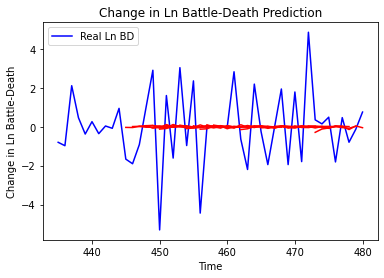

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.6902195802782325, 'mae': 1.6762119711764698, 'r2': 0.032073440014205645, 'tadda_score': 1.6911109031100366}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.591375506584297, 'mae': 1.817233819541233, 'r2': -0.032146791149888054, 'tadda_score': 1.8646611248720657}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.563084122740269, 'mae': 2.1352369292160556, 'r2': -0.01893473195810569, 'tadda_score': 2.1846036066443406}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.037249315433426, 'mae': 2.0040576701333093, 'r2': -0.043272913808816815, 'tadda_score': 2.044929234618442}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.436500493333633, 'mae': 2.2886352011571534, 'r2': -0.022033657449886057, 'tadda_score': 2.3232646887138686}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.429518242592755, 

4/4 [==============================] - 0s 11ms/step - loss: 5.1850 - val_loss: 0.7006
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 5.1435 - val_loss: 0.7007
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1616 - val_loss: 0.7008
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1339 - val_loss: 0.7009
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1370 - val_loss: 0.7011
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 5.1274 - val_loss: 0.7014
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 5.1042 - val_loss: 0.7019
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1364 - val_loss: 0.7022
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1203 - val_loss: 0.7027
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1099 - val_loss: 0.7032
Epoch 70/100
4/4 [=====

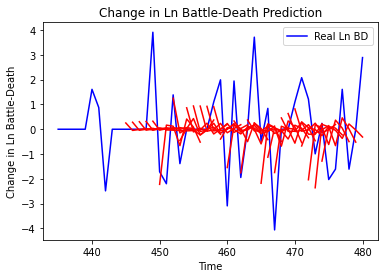

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.680299243409349, 'mae': 1.2712129177821558, 'r2': 0.08691592788603486, 'tadda_score': 1.4552343847525997}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.329942062361968, 'mae': 1.9307092080368908, 'r2': -0.49123996158758776, 'tadda_score': 2.3622036576126333}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 7.9471276666471065, 'mae': 2.1599175436814657, 'r2': -0.5216562441488017, 'tadda_score': 2.620494259746873}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.146803029678646, 'mae': 2.7794687067791375, 'r2': -0.8279644889886848, 'tadda_score': 3.4377772594814067}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 9.71703837231401, 'mae': 2.451091563821568, 'r2': -1.0453217984519583, 'tadda_score': 3.054095311582818}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.600747953570917, 'mae': 2.13435

4/4 [==============================] - 0s 12ms/step - loss: 0.6104 - val_loss: 1.8287
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6071 - val_loss: 1.8284
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6030 - val_loss: 1.8280
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6039 - val_loss: 1.8275
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6084 - val_loss: 1.8270
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6047 - val_loss: 1.8265
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6017 - val_loss: 1.8260
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5996 - val_loss: 1.8254
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6006 - val_loss: 1.8247
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6040 - val_loss: 1.8240
Epoch 70/100
4/4 [=====

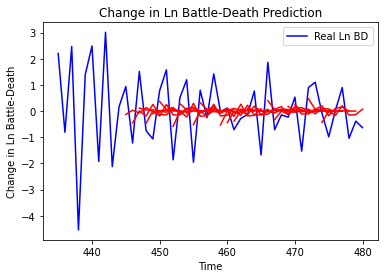

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8190104651586478, 'mae': 0.7602642465936262, 'r2': 0.27331148140680606, 'tadda_score': 0.7950419168231009}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.3326152788171437, 'mae': 0.9709298606465694, 'r2': -0.23224231605976753, 'tadda_score': 1.1252930682898001}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.2041240645654165, 'mae': 0.8787438587640705, 'r2': -0.29835347154718517, 'tadda_score': 1.030315247803428}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2404732932375886, 'mae': 0.9320264785525093, 'r2': -0.007060491403979574, 'tadda_score': 1.0524282260462035}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.4679276843222395, 'mae': 1.0083694468645388, 'r2': -0.23733924941805995, 'tadda_score': 1.2121680580783023}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.403552105477956

4/4 [==============================] - 0s 11ms/step - loss: 2.6708 - val_loss: 0.0017
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 2.6624 - val_loss: 0.0015
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.6692 - val_loss: 0.0015
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 2.6723 - val_loss: 0.0015
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6820 - val_loss: 0.0017
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6735 - val_loss: 0.0017
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 2.6671 - val_loss: 0.0018
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6570 - val_loss: 0.0017
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 2.6685 - val_loss: 0.0016
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 2.6513 - val_loss: 0.0015
Epoch 70/100
4/4 [=====

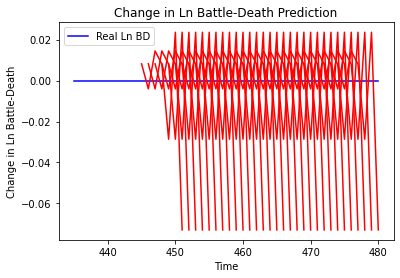

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 6.665198706325148e-05, 'mae': 0.008164066821336746, 'r2': 0.0, 'tadda_score': 0.008164066821336746}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 1.6752677317635224e-05, 'mae': 0.004093003459274769, 'r2': 0.0, 'tadda_score': 0.004093003459274769}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.00034399958278154286, 'mae': 0.01854722574353218, 'r2': 0.0, 'tadda_score': 0.01854722574353218}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0007052759496528754, 'mae': 0.026557032018899918, 'r2': 0.0, 'tadda_score': 0.026557032018899918}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 3.962671990542788e-06, 'mae': 0.0019906461238861084, 'r2': 0.0, 'tadda_score': 0.0019906461238861084}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 0.0006541606984107468, 'mae': 0.02557656541466713, 'r2': 0

4/4 [==============================] - 0s 11ms/step - loss: 0.1213 - val_loss: 1.6632
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1223 - val_loss: 1.6621
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1222 - val_loss: 1.6612
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1227 - val_loss: 1.6604
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1236 - val_loss: 1.6596
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1211 - val_loss: 1.6588
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1229 - val_loss: 1.6580
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1221 - val_loss: 1.6573
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1227 - val_loss: 1.6566
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1213 - val_loss: 1.6557
Epoch 71/100
4/4 [=====

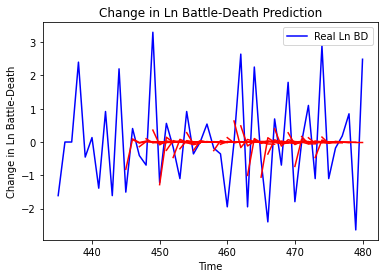

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4847350039829952, 'mae': 0.9109286956775299, 'r2': 0.2834734405387429, 'tadda_score': 0.9268849276292435}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.3451644935732365, 'mae': 1.2562577744645353, 'r2': -0.22854200121020996, 'tadda_score': 1.4499246020811276}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.4400854515135513, 'mae': 1.1965072246766133, 'r2': -0.11746921623686779, 'tadda_score': 1.327913447705512}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.116322462756718, 'mae': 1.4256991663678167, 'r2': -0.10967917669444294, 'tadda_score': 1.556916613849866}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.0146824244823733, 'mae': 1.0993482546800546, 'r2': -0.3301503821044711, 'tadda_score': 1.2827050468493675}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.426016758964128, 'ma

3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [==============================] 

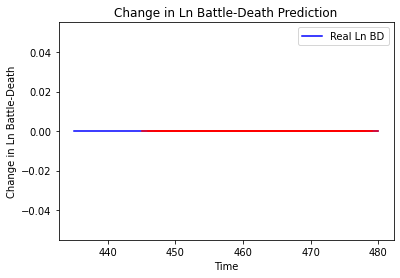

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_986"
_________________________________________________________________
Layer (type)       

4/4 [==============================] - 0s 15ms/step - loss: 0.0745 - val_loss: 7.8742e-06
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0728 - val_loss: 6.9398e-06
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0731 - val_loss: 3.6378e-06
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0739 - val_loss: 1.6940e-06
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0738 - val_loss: 2.4585e-06
Epoch 67/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0729 - val_loss: 2.6411e-06
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0736 - val_loss: 2.6801e-06
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0741 - val_loss: 1.7677e-06
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0732 - val_loss: 2.0867e-06
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0745 - val_

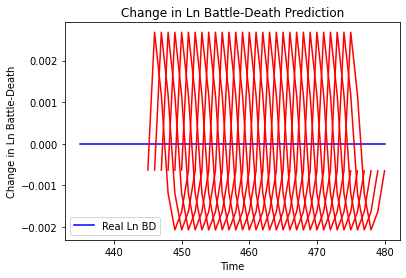

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 3.9898404837011153e-07, 'mae': 0.0006316518411040306, 'r2': 0.0, 'tadda_score': 0.0006316518411040306}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 4.197105387895731e-06, 'mae': 0.0020486838184297085, 'r2': 0.0, 'tadda_score': 0.0020486838184297085}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 1.0393433530833662e-05, 'mae': 0.0032238848507404327, 'r2': 0.0, 'tadda_score': 0.0032238848507404327}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 4.14114023826207e-06, 'mae': 0.002034979173913598, 'r2': 0.0, 'tadda_score': 0.002034979173913598}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 7.3656200271813525e-06, 'mae': 0.0027139675803482533, 'r2': 0.0, 'tadda_score': 0.0027139675803482533}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 1.8895103726995635e-05, 'mae': 0.00434684986

Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0599 - val_loss: 0.1518
Epoch 62/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0608 - val_loss: 0.1518
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0603 - val_loss: 0.1517
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0589 - val_loss: 0.1516
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0594 - val_loss: 0.1515
Epoch 66/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0599 - val_loss: 0.1514
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0593 - val_loss: 0.1513
Epoch 68/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0591 - val_loss: 0.1512
Epoch 69/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0597 - val_loss: 0.1511
Epoch 70/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0604 - val_loss: 0.1510
Epoch 71/1

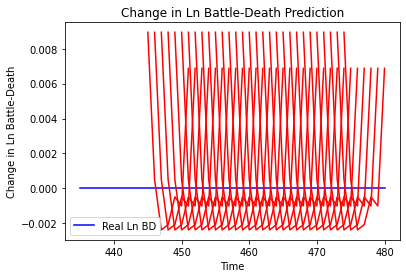

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 8.007222350268298e-05, 'mae': 0.008948308415710926, 'r2': 0.0, 'tadda_score': 0.008948308415710926}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 8.929253337983459e-05, 'mae': 0.009449472650885582, 'r2': 0.0, 'tadda_score': 0.009449472650885582}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 4.9822295183570876e-05, 'mae': 0.007058490999042988, 'r2': 0.0, 'tadda_score': 0.007058490999042988}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 2.469571740504415e-05, 'mae': 0.004969478584825993, 'r2': 0.0, 'tadda_score': 0.004969478584825993}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 1.57263004106989e-05, 'mae': 0.003965639974921942, 'r2': 0.0, 'tadda_score': 0.003965639974921942}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 8.704867702478936e-06, 'mae': 0.0029

Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 3.3632 - val_loss: 1.2993
Epoch 62/100
1/1 [==============================] - 0s 25ms/step - loss: 3.3960 - val_loss: 1.2995
Epoch 63/100
1/1 [==============================] - 0s 25ms/step - loss: 3.3883 - val_loss: 1.2997
Epoch 64/100
1/1 [==============================] - 0s 23ms/step - loss: 3.3697 - val_loss: 1.2999
Epoch 65/100
1/1 [==============================] - 0s 22ms/step - loss: 3.3762 - val_loss: 1.3001
Epoch 66/100
1/1 [==============================] - 0s 25ms/step - loss: 3.3877 - val_loss: 1.3002
Epoch 67/100
1/1 [==============================] - 0s 22ms/step - loss: 3.3853 - val_loss: 1.3004
Epoch 68/100
1/1 [==============================] - 0s 24ms/step - loss: 3.3589 - val_loss: 1.3006
Epoch 69/100
1/1 [==============================] - 0s 23ms/step - loss: 3.3868 - val_loss: 1.3008
Epoch 70/100
1/1 [==============================] - 0s 23ms/step - loss: 3.3857 - val_loss: 1.3011
Epoch 71/1

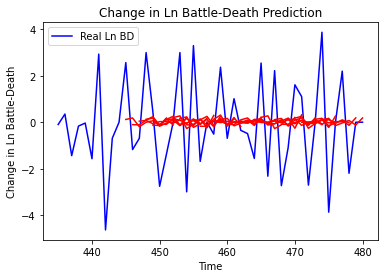

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.749198833772547, 'mae': 1.6357531150026647, 'r2': 0.06301520625344303, 'tadda_score': 1.6547356761836538}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.408482228866635, 'mae': 1.7137127507517194, 'r2': -0.033217379262219016, 'tadda_score': 1.8267401563663737}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.949145563500586, 'mae': 1.6635013164993795, 'r2': -0.018331755172888986, 'tadda_score': 1.7077646076099746}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.339010899368835, 'mae': 1.4420516102589296, 'r2': -0.00569866599791613, 'tadda_score': 1.4820985420621562}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.28877198269007, 'mae': 1.9474801665478525, 'r2': -0.008768621164224832, 'tadda_score': 1.97617306134935}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.676314705086351, 'ma

1/1 [==============================] - 0s 23ms/step - loss: 6.8532 - val_loss: 5.1150
Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 6.9331 - val_loss: 5.1140
Epoch 62/100
1/1 [==============================] - 0s 23ms/step - loss: 6.9744 - val_loss: 5.1131
Epoch 63/100
1/1 [==============================] - 0s 26ms/step - loss: 6.9471 - val_loss: 5.1122
Epoch 64/100
1/1 [==============================] - 0s 23ms/step - loss: 6.9081 - val_loss: 5.1112
Epoch 65/100
1/1 [==============================] - 0s 21ms/step - loss: 6.8820 - val_loss: 5.1101
Epoch 66/100
1/1 [==============================] - 0s 21ms/step - loss: 6.9980 - val_loss: 5.1091
Epoch 67/100
1/1 [==============================] - 0s 24ms/step - loss: 6.8989 - val_loss: 5.1081
Epoch 68/100
1/1 [==============================] - 0s 24ms/step - loss: 6.9449 - val_loss: 5.1070
Epoch 69/100
1/1 [==============================] - 0s 22ms/step - loss: 6.7888 - val_loss: 5.1060
Epoch 70/100
1/1 [=====

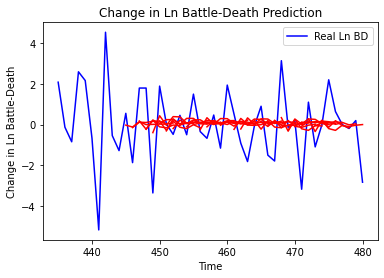

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.0018247795434254, 'mae': 1.1252194674096496, 'r2': 0.10014244104816805, 'tadda_score': 1.1705945912780356}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.7715042137198194, 'mae': 1.3009205221630356, 'r2': -0.025575825066211033, 'tadda_score': 1.3332818701363822}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.904335242003181, 'mae': 1.3989705377846984, 'r2': -0.11082472347707006, 'tadda_score': 1.4799065218895702}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.515618958981801, 'mae': 1.5555020401329596, 'r2': -0.11528818190186207, 'tadda_score': 1.6833758743555147}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 2.9236080891923093, 'mae': 1.2749724435247545, 'r2': -0.15906609290126417, 'tadda_score': 1.3969408559240464}
{'country': 'South Sudan', 'country_id': 246, 'ste

In [62]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=10, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_991"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_972 (LSTM)              (None, 6)                 192       
_________________________________________________________________
dropout_1944 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1944 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_1945 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_1945 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
4/4 [==============================] - 0s 92ms/step - loss: 0.0000e

Epoch 68/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
4/4 [==============================] - 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
4/4 [==============================] - 0s 16ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
4/4 [==============================] - 0s 19ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 77/100
4/4 [===================

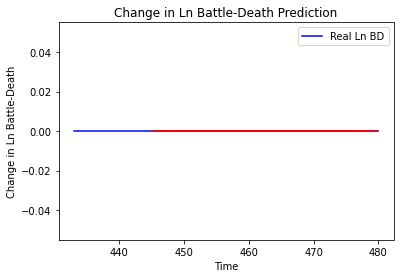

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_992"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 13ms/step - loss: 0.5221 - val_loss: 0.4499
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5256 - val_loss: 0.4498
Epoch 66/100
4/4 [==============================] - 0s 14ms/step - loss: 0.5159 - val_loss: 0.4497
Epoch 67/100
4/4 [==============================] - 0s 15ms/step - loss: 0.5257 - val_loss: 0.4497
Epoch 68/100
4/4 [==============================] - 0s 14ms/step - loss: 0.5200 - val_loss: 0.4496
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5210 - val_loss: 0.4495
Epoch 70/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5211 - val_loss: 0.4494
Epoch 71/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5223 - val_loss: 0.4493
Epoch 72/100
4/4 [==============================] - 0s 14ms/step - loss: 0.5205 - val_loss: 0.4493
Epoch 73/100
4/4 [==============================] - 0s 13ms/step - loss: 0.5206 - val_loss: 0.4492
Epoch 74/100
4/4 [=====

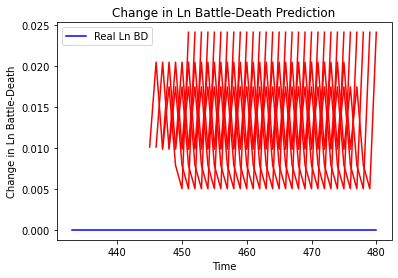

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.00010190056903547698, 'mae': 0.010094581171870232, 'r2': 0.0, 'tadda_score': 0.010094581171870232}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 0.0009323809585385125, 'mae': 0.030534913763403893, 'r2': 0.0, 'tadda_score': 0.030534913763403893}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.0016293554254676185, 'mae': 0.040365274995565414, 'r2': 0.0, 'tadda_score': 0.040365274995565414}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.003341060770139015, 'mae': 0.05780190974473953, 'r2': 0.0, 'tadda_score': 0.05780190974473953}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 0.0020464492896610786, 'mae': 0.045237697660923004, 'r2': 0.0, 'tadda_score': 0.045237697660923004}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.002525135258304667, 'mae

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 18ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

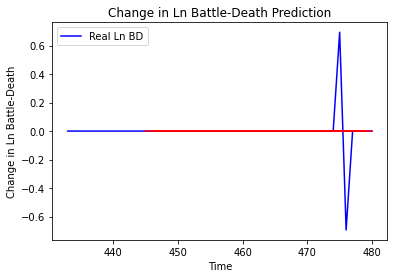

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_994"
_________________________________________________________________
Layer (type)                 Output Shape      

4/4 [==============================] - 0s 13ms/step - loss: 1.2071 - val_loss: 1.4517e-04
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 1.2129 - val_loss: 1.0374e-04
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 1.2117 - val_loss: 8.0025e-05
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 1.2146 - val_loss: 7.6549e-05
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 1.2104 - val_loss: 7.2055e-05
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 1.2236 - val_loss: 6.8437e-05
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 1.2132 - val_loss: 9.0259e-05
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 1.2056 - val_loss: 8.3406e-05
Epoch 70/100
4/4 [==============================] - 0s 13ms/step - loss: 1.2131 - val_loss: 1.2367e-04
Epoch 71/100
4/4 [==============================] - 0s 11ms/step - loss: 1.2223 - val_

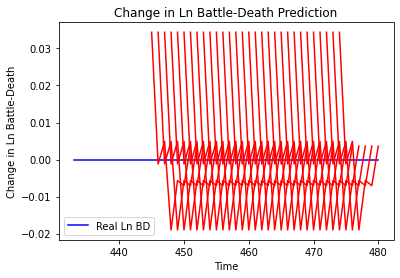

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.001181938042950359, 'mae': 0.034379325807094574, 'r2': 0.0, 'tadda_score': 0.034379325807094574}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.0011012104494284025, 'mae': 0.033184491097927094, 'r2': 0.0, 'tadda_score': 0.033184491097927094}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0014507103165534302, 'mae': 0.03808819130063057, 'r2': 0.0, 'tadda_score': 0.03808819130063057}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.0003644988842675702, 'mae': 0.019091853871941566, 'r2': 0.0, 'tadda_score': 0.019091853871941566}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0002140466861713687, 'mae': 0.014630334451794624, 'r2': 0.0, 'tadda_score': 0.014630334451794624}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 5.760390910382329e-05, 'mae': 0.007589723914861679, 'r2': 0.0, 

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

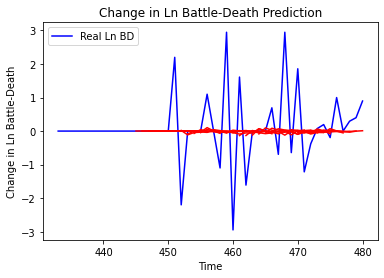

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6742358161988065, 'mae': 0.8328972567027239, 'r2': -0.015253156805776102, 'tadda_score': 0.8470536019186603}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2092589333046275, 'mae': 0.7352377098133078, 'r2': -0.021874229557697022, 'tadda_score': 0.7453250175421348}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.063178738671804, 'mae': 0.9173952916689282, 'r2': -0.034893516678366376, 'tadda_score': 0.9342738175351237}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.4274725216464903, 'mae': 1.0355582448561254, 'r2': -0.09353878648876557, 'tadda_score': 1.0635669937575123}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.3769379789959877, 'mae': 0.9601071440125953, 'r2': -0.14024704256987452, 'tadda_score': 0.9848141024952582}
{'country': 'Burkina Faso', 'country_id': 47, 

Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2728 - val_loss: 2.3055e-05
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2741 - val_loss: 1.6911e-05
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2737 - val_loss: 1.1878e-05
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2710 - val_loss: 8.1278e-06
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.2747 - val_loss: 1.0815e-05
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2732 - val_loss: 8.3104e-06
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2739 - val_loss: 6.2653e-06
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2737 - val_loss: 9.5966e-06
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2737 - val_loss: 1.2235e-05
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 

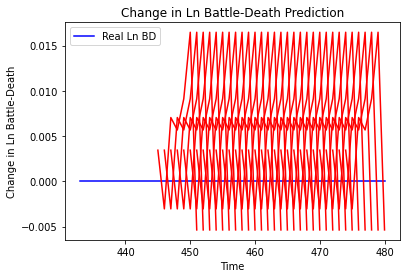

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 1.1874679630227572e-05, 'mae': 0.003445965703576803, 'r2': 0.0, 'tadda_score': 0.003445965703576803}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 1.656172203207476e-07, 'mae': 0.00040696095675230026, 'r2': 0.0, 'tadda_score': 0.00040696095675230026}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 5.563754566047436e-05, 'mae': 0.0074590579606592655, 'r2': 0.0, 'tadda_score': 0.0074590579606592655}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.00017264595372082706, 'mae': 0.013139480724930763, 'r2': 0.0, 'tadda_score': 0.013139480724930763}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.0006403827665493744, 'mae': 0.02530578523874283, 'r2': 0.0, 'tadda_score': 0.02530578523874283}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.001745648291752444, 'mae': 0.04178095608949661, 'r2': 0.0,

Epoch 59/100
4/4 [==============================] - 0s 14ms/step - loss: 0.7132 - val_loss: 1.1615e-04
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7092 - val_loss: 8.6334e-05
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.7003 - val_loss: 7.9765e-05
Epoch 62/100
4/4 [==============================] - 0s 14ms/step - loss: 0.7157 - val_loss: 7.6326e-05
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.7188 - val_loss: 8.3325e-05
Epoch 64/100
4/4 [==============================] - 0s 15ms/step - loss: 0.7100 - val_loss: 7.2549e-05
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.7070 - val_loss: 6.4919e-05
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.7113 - val_loss: 5.8853e-05
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.7118 - val_loss: 7.3014e-05
Epoch 68/100
4/4 [==============================] - 0s 14ms/step - loss: 

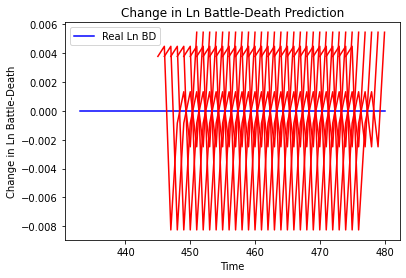

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 1.4312200094451256e-05, 'mae': 0.0037831468507647514, 'r2': 0.0, 'tadda_score': 0.0037831468507647514}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 6.834848363973609e-05, 'mae': 0.008267314173281193, 'r2': 0.0, 'tadda_score': 0.008267314173281193}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 1.7493889149788888e-11, 'mae': 4.182569682598114e-06, 'r2': 0.0, 'tadda_score': 4.182569682598114e-06}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 7.162525287075783e-07, 'mae': 0.0008463170379400253, 'r2': 0.0, 'tadda_score': 0.0008463170379400253}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 1.600205794633305e-05, 'mae': 0.004000257235020399, 'r2': 0.0, 'tadda_score': 0.004000257235020399}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 4.21495596953170

4/4 [==============================] - 0s 16ms/step - loss: 1.0582 - val_loss: 3.2213
Epoch 61/100
4/4 [==============================] - 0s 22ms/step - loss: 1.0532 - val_loss: 3.2204
Epoch 62/100
4/4 [==============================] - 0s 16ms/step - loss: 1.0475 - val_loss: 3.2191
Epoch 63/100
4/4 [==============================] - 0s 15ms/step - loss: 1.0479 - val_loss: 3.2178
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.0539 - val_loss: 3.2165
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 1.0504 - val_loss: 3.2150
Epoch 66/100
4/4 [==============================] - 0s 19ms/step - loss: 1.0476 - val_loss: 3.2135
Epoch 67/100
4/4 [==============================] - 0s 15ms/step - loss: 1.0528 - val_loss: 3.2123
Epoch 68/100
4/4 [==============================] - 0s 17ms/step - loss: 1.0443 - val_loss: 3.2109
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 1.0483 - val_loss: 3.2095
Epoch 70/100
4/4 [=====

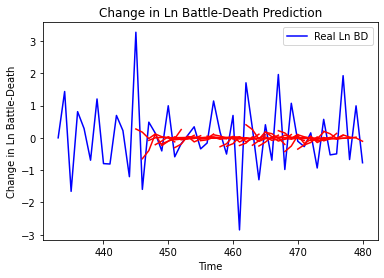

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.9845496224963516, 'mae': 0.7123134436432984, 'r2': 0.22010635353719832, 'tadda_score': 0.7457780106340316}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.2827739263128286, 'mae': 0.879083933966014, 'r2': -0.32493473301755915, 'tadda_score': 1.060595015534911}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.2507724788763555, 'mae': 0.9357229996666107, 'r2': -0.10173037300648402, 'tadda_score': 1.1034395107572075}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 1.7729971925783012, 'mae': 1.1036264782138703, 'r2': -0.18560522366453513, 'tadda_score': 1.3132971661774357}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.4542436101401284, 'mae': 0.9860193237445922, 'r2': -0.34306348192401925, 'tadda_score': 1.1475219332707098}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 1.7768461549033667, 'mae': 1.10

4/4 [==============================] - 0s 13ms/step - loss: 1.6540 - val_loss: 0.5118
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 1.6527 - val_loss: 0.5117
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6540 - val_loss: 0.5117
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6632 - val_loss: 0.5117
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6680 - val_loss: 0.5118
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 1.6601 - val_loss: 0.5118
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6572 - val_loss: 0.5115
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6496 - val_loss: 0.5115
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 1.6389 - val_loss: 0.5113
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 1.6702 - val_loss: 0.5112
Epoch 70/100
4/4 [=====

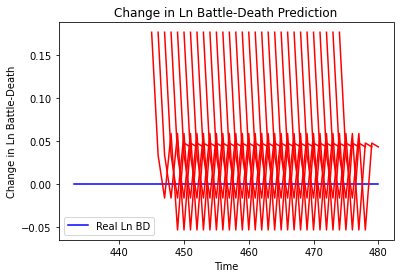

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.0313267585401924, 'mae': 0.17699366807937622, 'r2': 0.0, 'tadda_score': 0.17699366807937622}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.04458923958708372, 'mae': 0.21116164326667786, 'r2': 0.0, 'tadda_score': 0.21116164326667786}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.03813234065366178, 'mae': 0.19527503848075867, 'r2': 0.0, 'tadda_score': 0.19527503848075867}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.06474169005201702, 'mae': 0.254443883895874, 'r2': 0.0, 'tadda_score': 0.254443883895874}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.02798556589852641, 'mae': 0.1672888696193695, 'r2': 0.0, 'tadda_score': 0.1672888696193695}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.04636898106322307, 'mae': 0.21533457934856415, 'r2': 0.0, 'tadda_score': 0.2153345793

4/4 [==============================] - 0s 12ms/step - loss: 2.2507 - val_loss: 5.4254e-04
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 2.2607 - val_loss: 5.2881e-04
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2647 - val_loss: 5.2495e-04
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.2561 - val_loss: 5.2291e-04
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 2.2727 - val_loss: 4.9469e-04
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 2.2536 - val_loss: 4.5514e-04
Epoch 65/100
4/4 [==============================] - 0s 16ms/step - loss: 2.2580 - val_loss: 4.3675e-04
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 2.2553 - val_loss: 4.2159e-04
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 2.2539 - val_loss: 4.2582e-04
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 2.2580 - val_

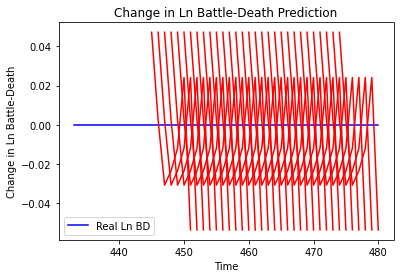

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.002224761680319612, 'mae': 0.04716737940907478, 'r2': 0.0, 'tadda_score': 0.04716737940907478}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.002466932342778172, 'mae': 0.04966822266578674, 'r2': 0.0, 'tadda_score': 0.04966822266578674}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.0003589974082112736, 'mae': 0.01894722692668438, 'r2': 0.0, 'tadda_score': 0.01894722692668438}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 2.0291963016980802e-05, 'mae': 0.00450466014444828, 'r2': 0.0, 'tadda_score': 0.00450466014444828}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.00035922924322348906, 'mae': 0.018953343853354454, 'r2': 0.0, 'tadda_score': 0.018953343853354454}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 2.6814759183677733e-05, 'mae': 0.00517

4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

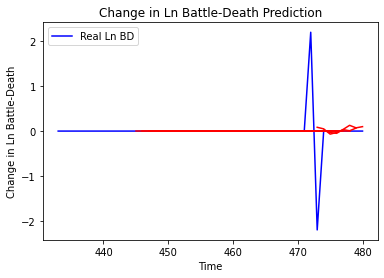

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6660 - val_loss: 5.5963e-05
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6688 - val_loss: 5.1572e-05
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6676 - val_loss: 5.9212e-05
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 0.6668 - val_loss: 4.8162e-05
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6652 - val_loss: 4.8830e-05
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6660 - val_loss: 5.3095e-05
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6690 - val_loss: 6.9241e-05
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.6684 - val_loss: 6.2001e-05
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6647 - val_loss: 7.3361e-05
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 

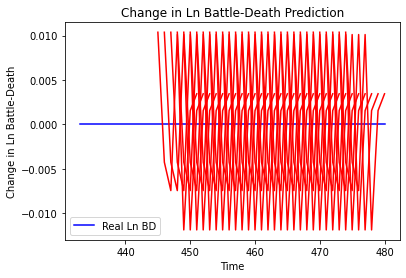

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.00010757776194609062, 'mae': 0.010371970012784004, 'r2': 0.0, 'tadda_score': 0.010371970012784004}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 3.755449113625035e-05, 'mae': 0.0061281719245016575, 'r2': 0.0, 'tadda_score': 0.0061281719245016575}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 1.7057532001674494e-06, 'mae': 0.0013060448691248894, 'r2': 0.0, 'tadda_score': 0.0013060448691248894}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 7.754320021966313e-05, 'mae': 0.008805861696600914, 'r2': 0.0, 'tadda_score': 0.008805861696600914}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 1.42141189583226e-06, 'mae': 0.001192229799926281, 'r2': 0.0, 'tadda_score': 0.001192229799926281}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 7.58233482708008e-06, 'mae': 0.002753603970631957

4/4 [==============================] - 0s 13ms/step - loss: 2.0997 - val_loss: 6.0919e-04
Epoch 59/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0781 - val_loss: 5.5167e-04
Epoch 60/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0637 - val_loss: 5.3741e-04
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0904 - val_loss: 5.7494e-04
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0975 - val_loss: 6.1885e-04
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0743 - val_loss: 6.9347e-04
Epoch 64/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0864 - val_loss: 8.6645e-04
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 2.0754 - val_loss: 0.0011
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0708 - val_loss: 0.0013
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0803 - val_loss: 0.

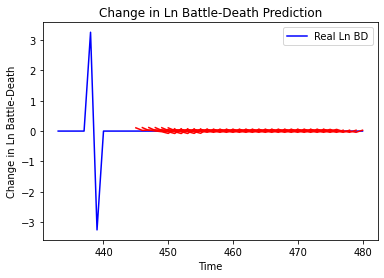

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.0050273029143926805, 'mae': 0.06734451713661353, 'r2': 0.0, 'tadda_score': 0.06734451713661353}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.006173007314315386, 'mae': 0.07255269636710485, 'r2': 0.0, 'tadda_score': 0.07255269636710485}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.016484726880601736, 'mae': 0.1258622708419959, 'r2': 0.0, 'tadda_score': 0.1258622708419959}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.014630356456695467, 'mae': 0.11707611133654912, 'r2': 0.0, 'tadda_score': 0.11707611133654912}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.01168302254693663, 'mae': 0.1069975696504116, 'r2': 0.0, 'tadda_score': 0.1069975696504116}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.003563866442119551, 'mae': 0.05959892384707928, 'r2': 0.0, 'tadda_score': 0.0

4/4 [==============================] - 0s 12ms/step - loss: 4.8871 - val_loss: 2.4546
Epoch 62/100
4/4 [==============================] - 0s 14ms/step - loss: 4.9037 - val_loss: 2.4535
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 4.8913 - val_loss: 2.4523
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 4.8796 - val_loss: 2.4514
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 4.8819 - val_loss: 2.4504
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 4.8848 - val_loss: 2.4495
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 4.8964 - val_loss: 2.4484
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 4.8832 - val_loss: 2.4474
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 4.8690 - val_loss: 2.4461
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 4.8221 - val_loss: 2.4449
Epoch 71/100
4/4 [=====

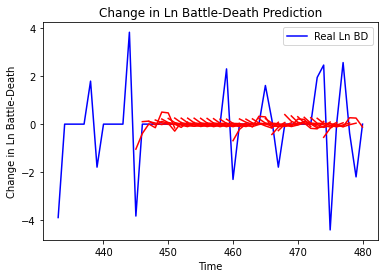

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.0877573268916914, 'mae': 0.66465949973623, 'r2': 0.20266489624063166, 'tadda_score': 0.6973099664962296}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 2.5163360070114087, 'mae': 1.0218606992246415, 'r2': -0.2611724049563031, 'tadda_score': 1.0992969253343052}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 2.5559108216042223, 'mae': 1.0440289674879815, 'r2': -0.2810070629497705, 'tadda_score': 1.1312235433540452}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 2.65809452143174, 'mae': 1.0638220577122477, 'r2': -0.33222091598836423, 'tadda_score': 1.156888595092466}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 2.258559222025695, 'mae': 0.8883543343525834, 'r2': -0.13197623760961807, 'tadda_score': 0.931473716217449}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 1.843391599685

4/4 [==============================] - 0s 13ms/step - loss: 0.9637 - val_loss: 1.0197
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.9600 - val_loss: 1.0192
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9571 - val_loss: 1.0187
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9594 - val_loss: 1.0183
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9641 - val_loss: 1.0179
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.9543 - val_loss: 1.0176
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9565 - val_loss: 1.0173
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.9574 - val_loss: 1.0170
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9620 - val_loss: 1.0166
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9564 - val_loss: 1.0163
Epoch 70/100
4/4 [=====

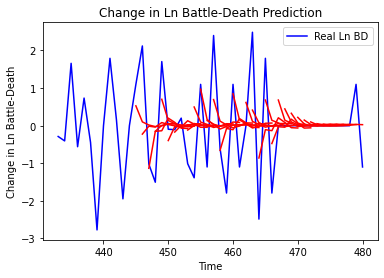

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.1005959869070152, 'mae': 0.7901313205413119, 'r2': 0.3099146477654574, 'tadda_score': 0.819554382423768}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.4276165337632776, 'mae': 1.1642580325028675, 'r2': -0.44140617900871715, 'tadda_score': 1.4238573660077034}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.603207115211184, 'mae': 1.256307742150725, 'r2': -0.45117047727363535, 'tadda_score': 1.5321573391205083}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.7125400699557427, 'mae': 1.250135231807334, 'r2': -0.3287068444453678, 'tadda_score': 1.4728433058107921}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 1.8200235695753981, 'mae': 0.9882100364150936, 'r2': -0.3524026118842509, 'tadda_score': 1.1489390907766754}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.007745198825872,

4/4 [==============================] - 0s 13ms/step - loss: 0.2027 - val_loss: 1.0730
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1997 - val_loss: 1.0727
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.2009 - val_loss: 1.0725
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2014 - val_loss: 1.0724
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.2009 - val_loss: 1.0723
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1993 - val_loss: 1.0721
Epoch 66/100
4/4 [==============================] - 0s 15ms/step - loss: 0.2007 - val_loss: 1.0720
Epoch 67/100
4/4 [==============================] - 0s 17ms/step - loss: 0.2007 - val_loss: 1.0719
Epoch 68/100
4/4 [==============================] - 0s 17ms/step - loss: 0.1999 - val_loss: 1.0718
Epoch 69/100
4/4 [==============================] - 0s 16ms/step - loss: 0.2008 - val_loss: 1.0716
Epoch 70/100
4/4 [=====

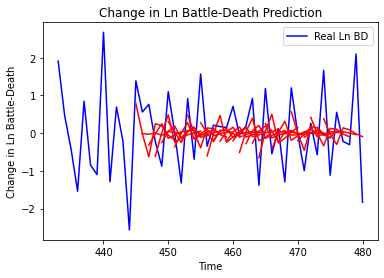

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5386283655170172, 'mae': 0.6412699595915946, 'r2': 0.26862262941229986, 'tadda_score': 0.7024121654421263}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.1253883752496985, 'mae': 0.9204846347205697, 'r2': -0.5246569328273392, 'tadda_score': 1.1506844385050594}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.0601538499474445, 'mae': 0.8219033572757423, 'r2': -0.08178632973906819, 'tadda_score': 0.8543949975644355}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.1220032439150607, 'mae': 0.8546936047647973, 'r2': -0.27400534651451736, 'tadda_score': 0.9615586370303809}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.3939030190368489, 'mae': 0.959391169735742, 'r2': -0.40135095992084624, 'tadda_score': 1.1289344279606666}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.73860

4/4 [==============================] - 0s 11ms/step - loss: 0.7507 - val_loss: 2.6682
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7481 - val_loss: 2.6674
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.7533 - val_loss: 2.6666
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7461 - val_loss: 2.6657
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7501 - val_loss: 2.6648
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7528 - val_loss: 2.6642
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.7484 - val_loss: 2.6636
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7476 - val_loss: 2.6629
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.7491 - val_loss: 2.6623
Epoch 69/100
4/4 [==============================] - 0s 9ms/step - loss: 0.7508 - val_loss: 2.6617
Epoch 70/100
4/4 [======

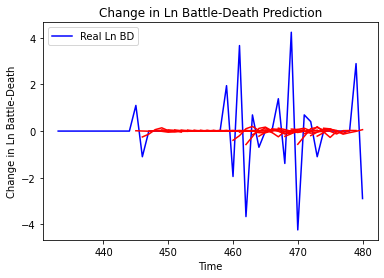

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 2.2564241651416697, 'mae': 0.8903588073990172, 'r2': 0.14682408081875697, 'tadda_score': 0.9071534889480894}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 1.4531551945057364, 'mae': 0.7904448680216345, 'r2': 0.007389481855347491, 'tadda_score': 0.810612735146957}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.1270127592911394, 'mae': 0.8817756903647263, 'r2': 0.09250146398388193, 'tadda_score': 0.8968691580907879}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 2.405900049251103, 'mae': 0.8655478509346267, 'r2': 0.004858761120955402, 'tadda_score': 0.8757393467753748}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.5556292750097307, 'mae': 0.9089949972610151, 'r2': -0.008474166346888579, 'tadda_score': 0.936362135

Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0

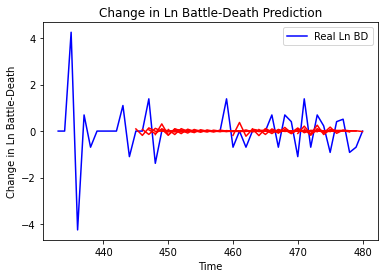

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3649249544204435, 'mae': 0.4031542338610031, 'r2': 0.11606346941573775, 'tadda_score': 0.4081172714809912}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39298325159275416, 'mae': 0.42784020990082233, 'r2': 0.04498935898577194, 'tadda_score': 0.4396079783260684}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.48620740506083066, 'mae': 0.472681433062854, 'r2': -0.01758700161885507, 'tadda_score': 0.47735408933321893}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4918562135339323, 'mae': 0.4625005283129525, 'r2': -0.018611465729420518, 'tadda_score': 0.4644784809447638}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4927238647107475, 'mae': 0.5102808646776542, 'r2': -0.11998319664412871, 'tadda_score': 0.5470029878038432}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.588113

Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

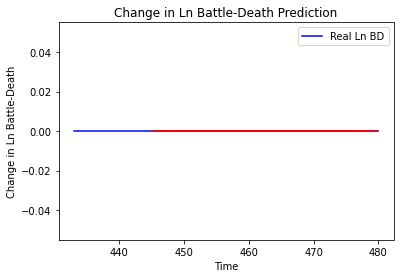

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_1010"
_________________________________________________________________
Layer (type)                 Output 

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] 

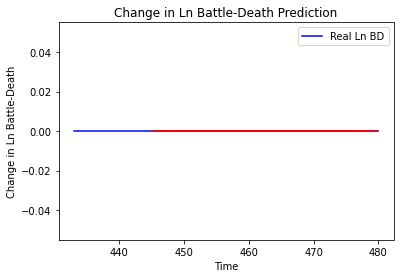

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_1011"
______________________________

4/4 [==============================] - 0s 12ms/step - loss: 0.8999 - val_loss: 1.4202
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.8949 - val_loss: 1.4197
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8972 - val_loss: 1.4192
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.9055 - val_loss: 1.4187
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9038 - val_loss: 1.4182
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8944 - val_loss: 1.4178
Epoch 70/100
4/4 [==============================] - 0s 14ms/step - loss: 0.9011 - val_loss: 1.4175
Epoch 71/100
4/4 [==============================] - 0s 14ms/step - loss: 0.8947 - val_loss: 1.4171
Epoch 72/100
4/4 [==============================] - 0s 13ms/step - loss: 0.8932 - val_loss: 1.4167
Epoch 73/100
4/4 [==============================] - 0s 13ms/step - loss: 0.9008 - val_loss: 1.4164
Epoch 74/100
4/4 [=====

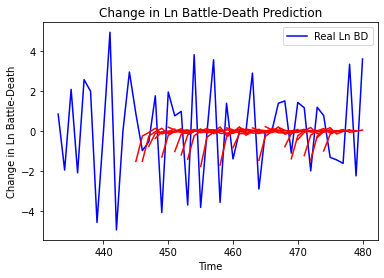

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.375693167009944, 'mae': 1.5207021639646607, 'r2': 0.22073032967388595, 'tadda_score': 1.7812077716888506}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 6.048286907095985, 'mae': 2.043222380182406, 'r2': -0.5402556504604776, 'tadda_score': 2.423963767788073}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 5.584897571030199, 'mae': 1.81304158985079, 'r2': -0.441995269697945, 'tadda_score': 2.2225698527640163}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 5.657138624311907, 'mae': 2.0073573474496285, 'r2': -0.24682711596185825, 'tadda_score': 2.3441598450799472}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 6.936421864492289, 'mae': 2.094414930431197, 'r2': -0.26097774072687163, 'tadda_score': 2.426059546924532}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 6.448321672456653, 'mae': 1.985175258

4/4 [==============================] - 0s 11ms/step - loss: 0.5465 - val_loss: 1.2558
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5398 - val_loss: 1.2555
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5402 - val_loss: 1.2550
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5460 - val_loss: 1.2548
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.5480 - val_loss: 1.2545
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5383 - val_loss: 1.2545
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.5393 - val_loss: 1.2549
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5504 - val_loss: 1.2549
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.5408 - val_loss: 1.2548
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.5448 - val_loss: 1.2548
Epoch 70/100
4/4 [======

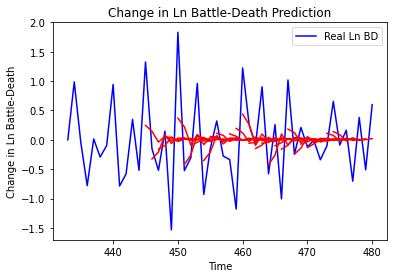

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.4319600790489216, 'mae': 0.4895720785240792, 'r2': 0.24417263061918104, 'tadda_score': 0.5145966912687284}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 0.7755341368747897, 'mae': 0.6922169988947462, 'r2': -0.4333336640977554, 'tadda_score': 0.8377337160182348}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 0.7471504828805969, 'mae': 0.6622981533518373, 'r2': -0.21945949563664313, 'tadda_score': 0.7791557070288497}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 0.941087208330721, 'mae': 0.7314725450139962, 'r2': -0.26511323760510996, 'tadda_score': 0.8934038773234161}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.6468376452356335, 'mae': 0.6172777759467536, 'r2': -0.2634458670545208, 'tadda_score': 0.7149531893677984}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.698417165708

Epoch 56/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

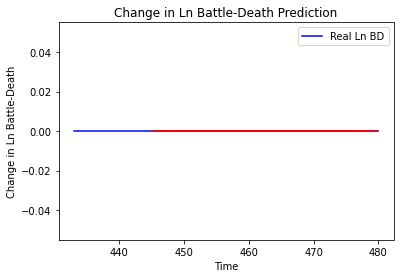

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_1014"
___

4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

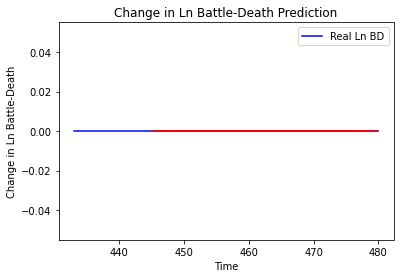

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_1015"
_________________________________________________________________
Layer (type)                 Output Shape            

Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3670 - val_loss: 0.3366
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3750 - val_loss: 0.3365
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3844 - val_loss: 0.3364
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 2.3853 - val_loss: 0.3363
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 2.3764 - val_loss: 0.3363
Epoch 70/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3616 - val_loss: 0.3362
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 2.3687 - val_loss: 0.3361
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 2.3735 - val_loss: 0.3361
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3652 - val_loss: 0.3361
Epoch 74/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3623 - val_loss: 0.3360
Epoch 75/100

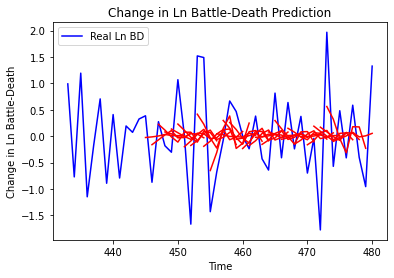

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5878559327635206, 'mae': 0.6051105767020999, 'r2': 0.22831844955485803, 'tadda_score': 0.6631295560081223}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.2468704629101592, 'mae': 0.8380146832886901, 'r2': -0.2714970162279311, 'tadda_score': 1.0014878428601788}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.1435259731425964, 'mae': 0.8093290372341744, 'r2': -0.4328220317322302, 'tadda_score': 0.9799916678319247}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 0.810428508524166, 'mae': 0.7432860821842948, 'r2': -0.16914815191697263, 'tadda_score': 0.8227135534445246}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.8253649887319734, 'mae': 0.6652432951402093, 'r2': -0.07065756089093278, 'tadda_score': 0.7359142062511468}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.752644

Epoch 56/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [=========================

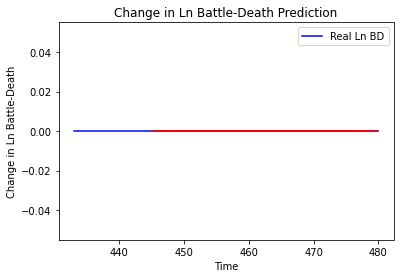

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_1017"
_________________________________________________________________
Layer (type)      

4/4 [==============================] - 0s 10ms/step - loss: 2.0113 - val_loss: 1.1666
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0123 - val_loss: 1.1664
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0074 - val_loss: 1.1662
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0120 - val_loss: 1.1661
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0207 - val_loss: 1.1661
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 2.0182 - val_loss: 1.1661
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 2.0090 - val_loss: 1.1660
Epoch 71/100
4/4 [==============================] - 0s 9ms/step - loss: 2.0041 - val_loss: 1.1657
Epoch 72/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9949 - val_loss: 1.1654
Epoch 73/100
4/4 [==============================] - 0s 9ms/step - loss: 1.9985 - val_loss: 1.1652
Epoch 74/100
4/4 [=========

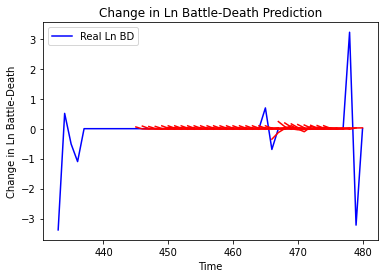

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.027601043871204833, 'mae': 0.13084427279450578, 'r2': 0.13828065164648973, 'tadda_score': 0.13084427279450578}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.06609534673633255, 'mae': 0.1760967788568942, 'r2': -1.0635320672871922, 'tadda_score': 0.18625622366585415}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.06048786222168682, 'mae': 0.16568751446622693, 'r2': -0.8884634023333986, 'tadda_score': 0.17339166414954346}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.054316764320108755, 'mae': 0.16271246360955718, 'r2': -0.6957984260669978, 'tadda_score': 0.1685399526081292}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.041931621907240445, 'mae': 0.12338837111709597, 'r2': -0.3091276574147821, 'tadda_score': 0.12673582359868368}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 

4/4 [==============================] - 0s 10ms/step - loss: 2.4222 - val_loss: 0.1931
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4167 - val_loss: 0.1930
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4167 - val_loss: 0.1929
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4232 - val_loss: 0.1927
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4218 - val_loss: 0.1927
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 2.3982 - val_loss: 0.1925
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 2.4278 - val_loss: 0.1924
Epoch 67/100
4/4 [==============================] - 0s 9ms/step - loss: 2.4054 - val_loss: 0.1923
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4207 - val_loss: 0.1922
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 2.4156 - val_loss: 0.1921
Epoch 70/100
4/4 [========

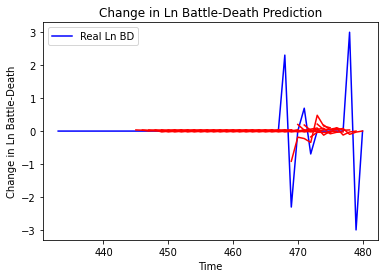

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.258056268084314, 'mae': 0.20230476680034956, 'r2': 0.33057610338932153, 'tadda_score': 0.20230476680034956}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.46554568899927545, 'mae': 0.3048443612718042, 'r2': -0.20767230919721125, 'tadda_score': 0.3210787104828612}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.3837674983842629, 'mae': 0.28909329583661236, 'r2': -0.37507678147432033, 'tadda_score': 0.30655001014884786}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.4143690519115964, 'mae': 0.31556143441821655, 'r2': -0.12313051986312629, 'tadda_score': 0.31556143441821655}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.43257659035481333, 'mae': 0.2588704000316612, 'r2': -0.17248131481950457, 'tadda_score': 0.26694058084513267}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.4

Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [===================

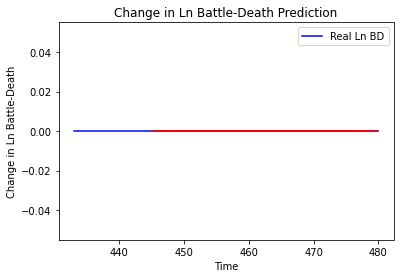

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_1020"
_________________________________________________________________
Layer (type)                 Ou

4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [==============================] - 0s 1

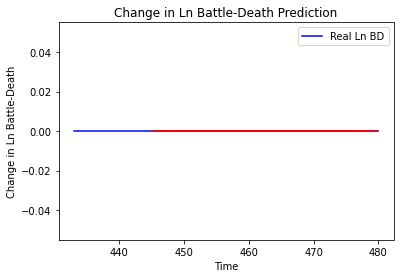

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_1021"
_________________________________________________________________
Layer (type)      

4/4 [==============================] - 0s 12ms/step - loss: 0.1366 - val_loss: 2.6851e-05
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1354 - val_loss: 1.6114e-05
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1350 - val_loss: 1.2955e-05
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1340 - val_loss: 1.1214e-05
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1337 - val_loss: 9.7751e-06
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1354 - val_loss: 2.1266e-05
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1357 - val_loss: 2.9510e-05
Epoch 69/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1337 - val_loss: 3.2168e-05
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1352 - val_loss: 3.7477e-05
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1344 - val_

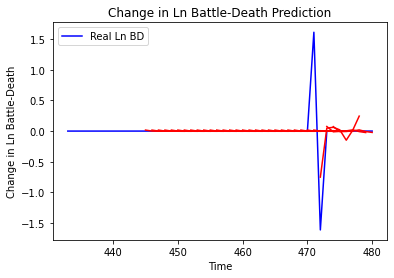

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.10982335356958463, 'mae': 0.10072004166194197, 'r2': 0.36402871764024325, 'tadda_score': 0.10072004166194197}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.19459228035302922, 'mae': 0.14851229468433455, 'r2': -0.12685597417140837, 'tadda_score': 0.15060784076102968}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.19139836721417314, 'mae': 0.14417077959277627, 'r2': -0.1083604814675092, 'tadda_score': 0.14608506322600837}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.09806164332331521, 'mae': 0.09010623509411214, 'r2': -0.17488463304035995, 'tadda_score': 0.09010623509411214}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.10730168983279534, 'mae': 0.1039275210882147, 'r2': -0.2855903920370102, 'tadda_score': 0.1039275210882147}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', '

4/4 [==============================] - 0s 9ms/step - loss: 0.1499 - val_loss: 5.8402e-06
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1503 - val_loss: 5.4051e-06
Epoch 60/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1502 - val_loss: 5.6779e-06
Epoch 61/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1508 - val_loss: 3.0282e-06
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1487 - val_loss: 4.6999e-06
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1514 - val_loss: 9.3479e-06
Epoch 64/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1507 - val_loss: 9.5157e-06
Epoch 65/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1483 - val_loss: 9.8570e-06
Epoch 66/100
4/4 [==============================] - 0s 9ms/step - loss: 0.1512 - val_loss: 9.9970e-06
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1495 - val_loss: 1.1

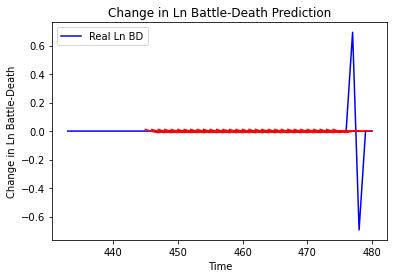

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 0.00013066957528574952, 'mae': 0.011431079357862473, 'r2': 0.0, 'tadda_score': 0.011431079357862473}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 7.233736622869538e-05, 'mae': 0.008505137637257576, 'r2': 0.0, 'tadda_score': 0.008505137637257576}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 4.756501340617315e-06, 'mae': 0.0021809404715895653, 'r2': 0.0, 'tadda_score': 0.0021809404715895653}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 7.465996222479629e-06, 'mae': 0.002732397522777319, 'r2': 0.0, 'tadda_score': 0.002732397522777319}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 1.0936018036457329e-08, 'mae': 0.00010457541793584824, 'r2': 0.0, 'tadda_score': 0.00010457541793584824}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 1.196960191978411e-06, 'mae': 0.00109405675902

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] 

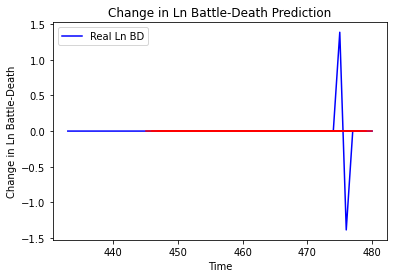

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_1024"
_________________________________________________________________
Layer (type)                 

4/4 [==============================] - 0s 11ms/step - loss: 0.8506 - val_loss: 0.5875
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8198 - val_loss: 0.5876
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8587 - val_loss: 0.5878
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.8431 - val_loss: 0.5878
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8560 - val_loss: 0.5878
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8497 - val_loss: 0.5877
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8423 - val_loss: 0.5877
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8510 - val_loss: 0.5878
Epoch 72/100
4/4 [==============================] - 0s 12ms/step - loss: 0.8689 - val_loss: 0.5877
Epoch 73/100
4/4 [==============================] - 0s 11ms/step - loss: 0.8194 - val_loss: 0.5877
Epoch 74/100
4/4 [=====

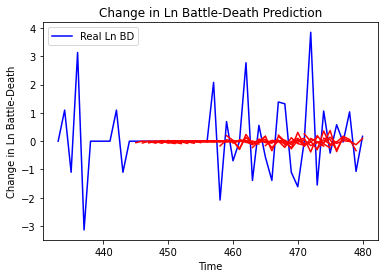

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.4503091381179591, 'mae': 0.7722710380028038, 'r2': 0.07832224984079561, 'tadda_score': 0.7775117322189459}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.114362022724231, 'mae': 0.9187903802814035, 'r2': -0.10507463330412237, 'tadda_score': 0.9765410244437007}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.0124124986462926, 'mae': 1.0036833805997154, 'r2': -0.05151180350561613, 'tadda_score': 1.025651392033595}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 1.7214427996980148, 'mae': 0.8880113150466443, 'r2': -0.14227610854397987, 'tadda_score': 0.9672639819024963}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 0.9639971007862373, 'mae': 0.649360814084379, 'r2': -0.17704746815431416, 'tadda_score': 0.6859225807237308}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] 

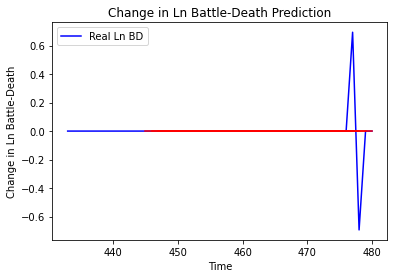

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_1026"
______________________________________________________

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] 

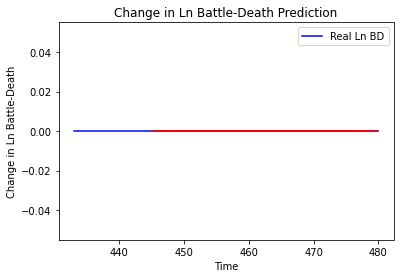

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_1027"
_________________________________________________________________
Layer (type)

4/4 [==============================] - 0s 10ms/step - loss: 3.3640 - val_loss: 0.1396
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3423 - val_loss: 0.1395
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3498 - val_loss: 0.1394
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3412 - val_loss: 0.1393
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3432 - val_loss: 0.1391
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3592 - val_loss: 0.1390
Epoch 70/100
4/4 [==============================] - 0s 9ms/step - loss: 3.3436 - val_loss: 0.1389
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3469 - val_loss: 0.1388
Epoch 72/100
4/4 [==============================] - 0s 11ms/step - loss: 3.3376 - val_loss: 0.1387
Epoch 73/100
4/4 [==============================] - 0s 10ms/step - loss: 3.3607 - val_loss: 0.1386
Epoch 74/100
4/4 [=======

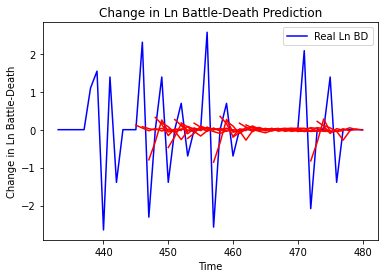

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.8743335147665243, 'mae': 0.5852006054420811, 'r2': 0.3129066771645901, 'tadda_score': 0.5867327514042001}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 1.6557625731763146, 'mae': 0.8757618615962108, 'r2': -0.301177856065618, 'tadda_score': 0.9495123900410574}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.0366225577877541, 'mae': 0.6746277660801816, 'r2': -0.18184765471005027, 'tadda_score': 0.7072124253387062}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.010480723462302, 'mae': 0.7057381736714968, 'r2': 0.05859522969962094, 'tadda_score': 0.7151462314009}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.0310034609282956, 'mae': 0.6093089010573944, 'r2': -0.05301443133128103, 'tadda_score': 0.6247895675408365}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.3913285716155461,

4/4 [==============================] - 0s 14ms/step - loss: 2.0110 - val_loss: 0.0568
Epoch 61/100
4/4 [==============================] - 0s 15ms/step - loss: 2.0142 - val_loss: 0.0568
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 2.0168 - val_loss: 0.0567
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0265 - val_loss: 0.0567
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0079 - val_loss: 0.0567
Epoch 65/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0226 - val_loss: 0.0567
Epoch 66/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0101 - val_loss: 0.0566
Epoch 67/100
4/4 [==============================] - 0s 17ms/step - loss: 2.0081 - val_loss: 0.0566
Epoch 68/100
4/4 [==============================] - 0s 13ms/step - loss: 2.0048 - val_loss: 0.0565
Epoch 69/100
4/4 [==============================] - 0s 14ms/step - loss: 2.0035 - val_loss: 0.0565
Epoch 70/100
4/4 [=====

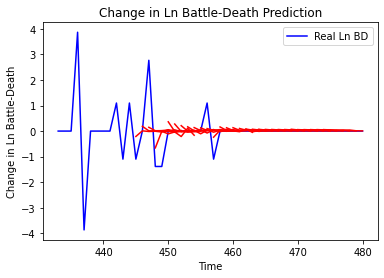

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.411431046188922, 'mae': 0.3436247558720744, 'r2': 0.18320871345777967, 'tadda_score': 0.3436413807406114}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 0.8803784753029584, 'mae': 0.5311291259890002, 'r2': -0.15845696368913842, 'tadda_score': 0.5778801011408571}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 0.7708432928724069, 'mae': 0.5000697500030615, 'r2': -0.2996859471640445, 'tadda_score': 0.5515951962789315}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.8275550734372973, 'mae': 0.533763406080049, 'r2': -0.1913558385227565, 'tadda_score': 0.5921008998175878}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.819006139356326, 'mae': 0.5501826717476466, 'r2': -0.3808912651960845, 'tadda_score': 0.6095189674715618}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8301286934105433, 'ma

4/4 [==============================] - 0s 11ms/step - loss: 3.0456 - val_loss: 3.5917
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 3.0245 - val_loss: 3.5897
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0438 - val_loss: 3.5878
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0460 - val_loss: 3.5861
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 3.0333 - val_loss: 3.5846
Epoch 65/100
4/4 [==============================] - 0s 12ms/step - loss: 3.0202 - val_loss: 3.5830
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0120 - val_loss: 3.5812
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 3.0421 - val_loss: 3.5797
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 3.0371 - val_loss: 3.5783
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 3.0201 - val_loss: 3.5769
Epoch 70/100
4/4 [=====

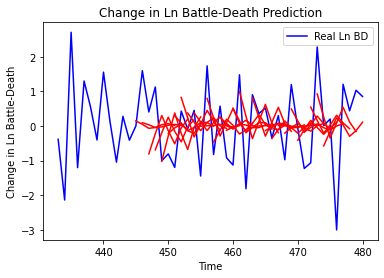

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 0.9041312580044613, 'mae': 0.7712701781816086, 'r2': 0.17391760481320329, 'tadda_score': 0.9023145277526776}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 2.4248833365493168, 'mae': 1.2433465709694196, 'r2': -0.7150024102548844, 'tadda_score': 1.5798522978805472}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 2.4067579010490334, 'mae': 1.2058451085359967, 'r2': -0.3952738216089977, 'tadda_score': 1.4656687864421423}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 2.824896750169621, 'mae': 1.3171254049720487, 'r2': -0.621473720998893, 'tadda_score': 1.6028553296235324}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 3.32902237074541, 'mae': 1.4228922125286791, 'r2': -0.813461661592437, 'tadda_score': 1.80834723881999}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 'mse'

Epoch 56/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [====================

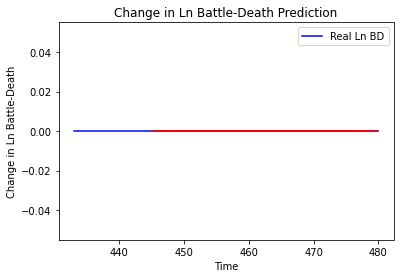

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_1031"
_________________________________________________________________
Layer (type)                 Output Sha

4/4 [==============================] - 0s 12ms/step - loss: 0.1491 - val_loss: 1.1889e-05
Epoch 63/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1488 - val_loss: 7.8856e-06
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1478 - val_loss: 7.2634e-06
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1481 - val_loss: 7.0579e-06
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1488 - val_loss: 6.6899e-06
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1486 - val_loss: 5.9130e-06
Epoch 68/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1478 - val_loss: 6.2726e-06
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1486 - val_loss: 8.6149e-06
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1481 - val_loss: 9.9217e-06
Epoch 71/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1477 - val_

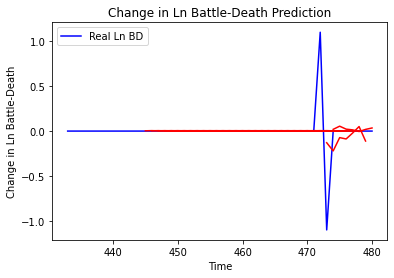

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.07134074756162909, 'mae': 0.07233637249738666, 'r2': 0.1133749245668344, 'tadda_score': 0.07233637249738666}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.0895824095274586, 'mae': 0.09442113747840813, 'r2': -0.11333302943249945, 'tadda_score': 0.09687717517858438}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.045795512532390246, 'mae': 0.06329476431953754, 'r2': -0.1775477590633232, 'tadda_score': 0.06329476431953754}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.04849173840266851, 'mae': 0.06858884104537812, 'r2': -0.2468762708739325, 'tadda_score': 0.06858884104537812}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.04296839332534892, 'mae': 0.056323703959066135, 'r2': -0.10485356474675522, 'tadda_score': 0.056323703959066135}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6'

4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] -

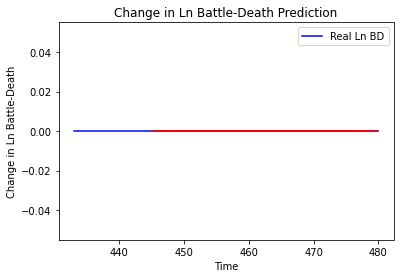

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_1033"
_________________________________________________________________
La

Epoch 60/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

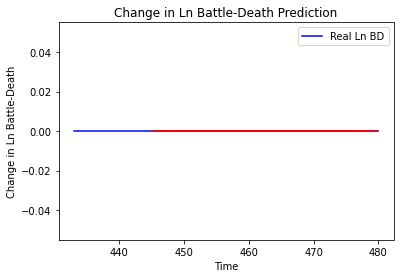

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_1034"
_________________________________________________________________
Layer (t

Epoch 60/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
4/4 [===================

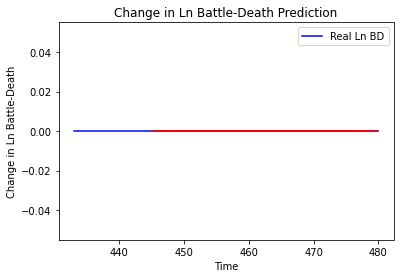

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_1035"
_________________________________________________________________
Layer 

4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 63/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 68/100
4/4 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 71/100
4/4 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - v

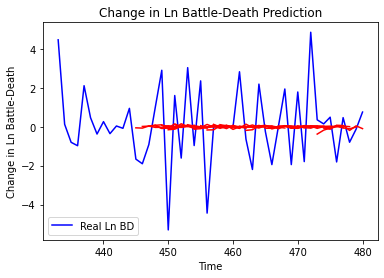

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.643433252019703, 'mae': 1.671504170812348, 'r2': 0.04172879388208539, 'tadda_score': 1.6910171705530876}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.663579217961471, 'mae': 1.830587350231307, 'r2': -0.04547532344382965, 'tadda_score': 1.8964222236493202}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.622663944840786, 'mae': 2.143804372457731, 'r2': -0.026961609496009675, 'tadda_score': 2.210055865951447}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.099672753666329, 'mae': 2.0114379907617934, 'r2': -0.0540600585650759, 'tadda_score': 2.0639347009330953}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.453911947892061, 'mae': 2.29316353614233, 'r2': -0.024426596521136545, 'tadda_score': 2.3358900809298158}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.503529169652828, 'mae': 1

4/4 [==============================] - 0s 10ms/step - loss: 5.1771 - val_loss: 0.5369
Epoch 61/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1524 - val_loss: 0.5367
Epoch 62/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1706 - val_loss: 0.5363
Epoch 63/100
4/4 [==============================] - 0s 9ms/step - loss: 5.1651 - val_loss: 0.5359
Epoch 64/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1581 - val_loss: 0.5356
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1398 - val_loss: 0.5354
Epoch 66/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1351 - val_loss: 0.5351
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1268 - val_loss: 0.5348
Epoch 68/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1208 - val_loss: 0.5347
Epoch 69/100
4/4 [==============================] - 0s 10ms/step - loss: 5.1304 - val_loss: 0.5346
Epoch 70/100
4/4 [=======

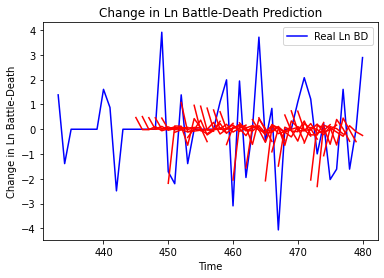

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 2.593337465793637, 'mae': 1.2892788561356945, 'r2': 0.11654075959796784, 'tadda_score': 1.4625378620796285}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 6.2911713194454135, 'mae': 1.9598520509753934, 'r2': -0.4821061526825452, 'tadda_score': 2.3899278295392112}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 8.005161174198092, 'mae': 2.2210527999719014, 'r2': -0.5327680637695467, 'tadda_score': 2.6783322437127466}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 11.164606838419934, 'mae': 2.818592064357616, 'r2': -0.8308841359996859, 'tadda_score': 3.486920817471363}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 9.686408663629967, 'mae': 2.475782933697199, 'r2': -1.038874606576067, 'tadda_score': 3.0846933040669513}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 7.565216337367826, 'mae': 2.162867

4/4 [==============================] - 0s 10ms/step - loss: 0.6165 - val_loss: 1.4926
Epoch 61/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6143 - val_loss: 1.4923
Epoch 62/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6122 - val_loss: 1.4920
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6171 - val_loss: 1.4917
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6125 - val_loss: 1.4914
Epoch 65/100
4/4 [==============================] - 0s 10ms/step - loss: 0.6078 - val_loss: 1.4911
Epoch 66/100
4/4 [==============================] - 0s 12ms/step - loss: 0.6140 - val_loss: 1.4907
Epoch 67/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6131 - val_loss: 1.4904
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6084 - val_loss: 1.4901
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.6101 - val_loss: 1.4899
Epoch 70/100
4/4 [=====

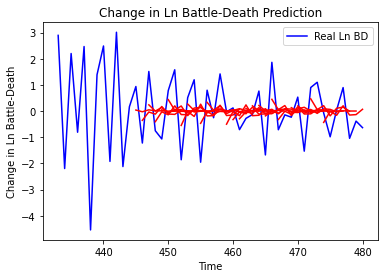

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.8072886185416083, 'mae': 0.7608923536114637, 'r2': 0.28371199729235475, 'tadda_score': 0.7912243175097673}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.3329047949482467, 'mae': 0.9651392285759063, 'r2': -0.2325100257533288, 'tadda_score': 1.1119861180941077}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.1998906239751732, 'mae': 0.877486219975599, 'r2': -0.2937887406787636, 'tadda_score': 1.033963480782507}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2262577920938542, 'mae': 0.9289918570969308, 'r2': 0.0044801597695729445, 'tadda_score': 1.047636534696202}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.443680845017528, 'mae': 1.0028315621439317, 'r2': -0.21690120858915884, 'tadda_score': 1.1998731190660297}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.3220333783031568, 'm

4/4 [==============================] - 0s 13ms/step - loss: 2.6163 - val_loss: 0.0021
Epoch 61/100
4/4 [==============================] - 0s 13ms/step - loss: 2.6108 - val_loss: 0.0021
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6009 - val_loss: 0.0021
Epoch 63/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6120 - val_loss: 0.0020
Epoch 64/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6179 - val_loss: 0.0020
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 2.6156 - val_loss: 0.0019
Epoch 66/100
4/4 [==============================] - 0s 11ms/step - loss: 2.6133 - val_loss: 0.0018
Epoch 67/100
4/4 [==============================] - 0s 12ms/step - loss: 2.5895 - val_loss: 0.0017
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 2.5978 - val_loss: 0.0016
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 2.6024 - val_loss: 0.0014
Epoch 70/100
4/4 [=====

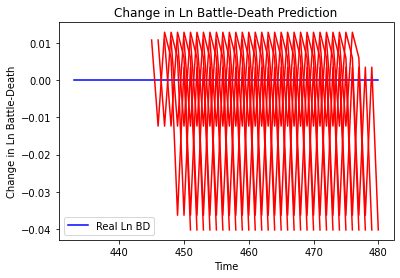

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.00011476996216398805, 'mae': 0.01071307435631752, 'r2': 0.0, 'tadda_score': 0.01071307435631752}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 2.6904505326949893e-06, 'mae': 0.0016402592882514, 'r2': 0.0, 'tadda_score': 0.0016402592882514}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.00012451330398505992, 'mae': 0.011158552952110767, 'r2': 0.0, 'tadda_score': 0.011158552952110767}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0002929078811894116, 'mae': 0.01711455173790455, 'r2': 0.0, 'tadda_score': 0.01711455173790455}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 4.585428736469943e-05, 'mae': 0.006771579384803772, 'r2': 0.0, 'tadda_score': 0.006771579384803772}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 1.115973630901588e-05, 'mae': 0.0033406191505491734, 'r2': 0.0, '

4/4 [==============================] - 0s 12ms/step - loss: 0.1256 - val_loss: 1.6387
Epoch 62/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1233 - val_loss: 1.6381
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1243 - val_loss: 1.6373
Epoch 64/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1249 - val_loss: 1.6365
Epoch 65/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1239 - val_loss: 1.6358
Epoch 66/100
4/4 [==============================] - 0s 14ms/step - loss: 0.1238 - val_loss: 1.6351
Epoch 67/100
4/4 [==============================] - 0s 10ms/step - loss: 0.1238 - val_loss: 1.6342
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.1239 - val_loss: 1.6335
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.1252 - val_loss: 1.6328
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.1231 - val_loss: 1.6321
Epoch 71/100
4/4 [=====

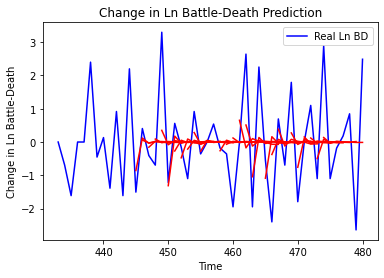

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4800558202598404, 'mae': 0.9082369789767376, 'r2': 0.2857315939501227, 'tadda_score': 0.9242520233281564}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 2.3423822953998337, 'mae': 1.2563281526178096, 'r2': -0.22708451397591034, 'tadda_score': 1.4494055075891292}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 2.458957190344146, 'mae': 1.1966770981936201, 'r2': -0.12611177717135114, 'tadda_score': 1.332346088954662}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 3.14484630925197, 'mae': 1.432615135924635, 'r2': -0.11983612254112241, 'tadda_score': 1.5706019695889133}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.057067354135976, 'mae': 1.1070801427818011, 'r2': -0.3581341127853481, 'tadda_score': 1.2999538585152899}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.425904157570149, 'mae':

Epoch 56/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
3/3 [==============================] - 0s 14ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
3/3 [==============================] - 0s 12ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
3/3 [==============================] - 0s 13ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
3/3 [===================

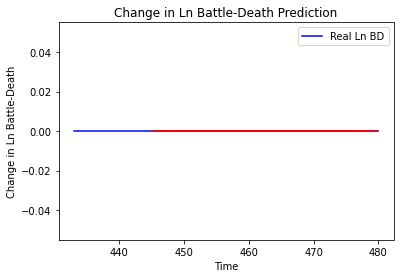

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_1041"
_________________________________________________________________
Layer (type)      

4/4 [==============================] - 0s 10ms/step - loss: 0.0757 - val_loss: 4.0319e-06
Epoch 63/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0751 - val_loss: 7.6842e-06
Epoch 64/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0765 - val_loss: 8.7539e-06
Epoch 65/100
4/4 [==============================] - 0s 18ms/step - loss: 0.0746 - val_loss: 3.4688e-06
Epoch 66/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0750 - val_loss: 1.7531e-06
Epoch 67/100
4/4 [==============================] - 0s 20ms/step - loss: 0.0740 - val_loss: 1.9077e-06
Epoch 68/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0738 - val_loss: 1.5632e-06
Epoch 69/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0749 - val_loss: 1.8252e-06
Epoch 70/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0736 - val_loss: 2.3761e-06
Epoch 71/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0743 - val_

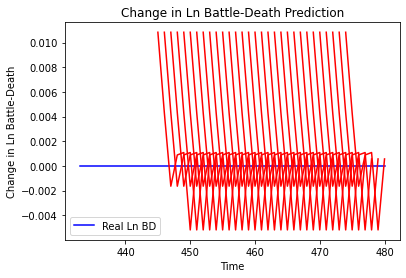

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 0.00011739442655245638, 'mae': 0.010834870859980583, 'r2': 0.0, 'tadda_score': 0.010834870859980583}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 0.00022914173910407523, 'mae': 0.015137428417801857, 'r2': 0.0, 'tadda_score': 0.015137428417801857}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 0.00018208380907319688, 'mae': 0.013493843376636505, 'r2': 0.0, 'tadda_score': 0.013493843376636505}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 0.00020685502615137852, 'mae': 0.014382455497980118, 'r2': 0.0, 'tadda_score': 0.014382455497980118}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 0.00012465008225626129, 'mae': 0.011164680123329163, 'r2': 0.0, 'tadda_score': 0.011164680123329163}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 3.571982676270715e-05, 'mae': 0.00597660662606358

Epoch 61/100
4/4 [==============================] - 0s 19ms/step - loss: 0.0581 - val_loss: 0.1641
Epoch 62/100
4/4 [==============================] - 0s 17ms/step - loss: 0.0595 - val_loss: 0.1640
Epoch 63/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0578 - val_loss: 0.1639
Epoch 64/100
4/4 [==============================] - 0s 13ms/step - loss: 0.0577 - val_loss: 0.1638
Epoch 65/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0577 - val_loss: 0.1638
Epoch 66/100
4/4 [==============================] - 0s 15ms/step - loss: 0.0576 - val_loss: 0.1637
Epoch 67/100
4/4 [==============================] - 0s 14ms/step - loss: 0.0586 - val_loss: 0.1636
Epoch 68/100
4/4 [==============================] - 0s 12ms/step - loss: 0.0591 - val_loss: 0.1635
Epoch 69/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0571 - val_loss: 0.1635
Epoch 70/100
4/4 [==============================] - 0s 11ms/step - loss: 0.0569 - val_loss: 0.1633
Epoch 71/1

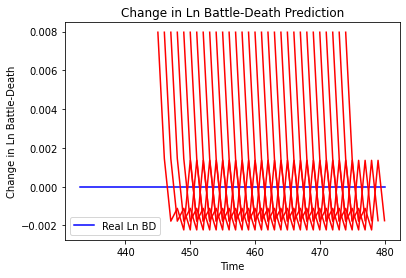

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 6.350637713753438e-05, 'mae': 0.007969088852405548, 'r2': 0.0, 'tadda_score': 0.007969088852405548}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 8.87046973125508e-05, 'mae': 0.00941831711679697, 'r2': 0.0, 'tadda_score': 0.00941831711679697}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 5.837475109088234e-05, 'mae': 0.0076403371058404446, 'r2': 0.0, 'tadda_score': 0.0076403371058404446}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 4.253284963467389e-05, 'mae': 0.0065217213705182076, 'r2': 0.0, 'tadda_score': 0.0065217213705182076}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 8.073363331365796e-06, 'mae': 0.0028413664549589157, 'r2': 0.0, 'tadda_score': 0.0028413664549589157}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 1.7640280375104617e-05, 'mae': 0.

1/1 [==============================] - 0s 22ms/step - loss: 3.5342 - val_loss: 1.3793
Epoch 61/100
1/1 [==============================] - 0s 20ms/step - loss: 3.5302 - val_loss: 1.3796
Epoch 62/100
1/1 [==============================] - 0s 21ms/step - loss: 3.5446 - val_loss: 1.3799
Epoch 63/100
1/1 [==============================] - 0s 20ms/step - loss: 3.4857 - val_loss: 1.3802
Epoch 64/100
1/1 [==============================] - 0s 24ms/step - loss: 3.5092 - val_loss: 1.3805
Epoch 65/100
1/1 [==============================] - 0s 19ms/step - loss: 3.5207 - val_loss: 1.3809
Epoch 66/100
1/1 [==============================] - 0s 20ms/step - loss: 3.5576 - val_loss: 1.3812
Epoch 67/100
1/1 [==============================] - 0s 19ms/step - loss: 3.5045 - val_loss: 1.3816
Epoch 68/100
1/1 [==============================] - 0s 21ms/step - loss: 3.5573 - val_loss: 1.3819
Epoch 69/100
1/1 [==============================] - 0s 21ms/step - loss: 3.5294 - val_loss: 1.3821
Epoch 70/100
1/1 [=====

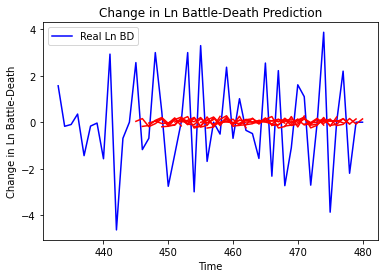

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 3.777094491250493, 'mae': 1.6257647164010534, 'r2': 0.05604363498521625, 'tadda_score': 1.638989451698316}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 4.409864487532869, 'mae': 1.7254114961290812, 'r2': -0.03354133966456274, 'tadda_score': 1.8284668135806377}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 3.977774220618309, 'mae': 1.695255996338325, 'r2': -0.0257139775250812, 'tadda_score': 1.7424466169022492}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.3348010779821013, 'mae': 1.4448894476222125, 'r2': -0.004430682190637247, 'tadda_score': 1.47602397008013}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.2887180338076085, 'mae': 1.945275485980866, 'r2': -0.00875833107420898, 'tadda_score': 1.9710631174031474}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.6717880394497655, 'mae'

1/1 [==============================] - 0s 22ms/step - loss: 7.2600 - val_loss: 5.2814
Epoch 61/100
1/1 [==============================] - 0s 23ms/step - loss: 7.3840 - val_loss: 5.2819
Epoch 62/100
1/1 [==============================] - 0s 22ms/step - loss: 7.3854 - val_loss: 5.2823
Epoch 63/100
1/1 [==============================] - 0s 23ms/step - loss: 7.3521 - val_loss: 5.2827
Epoch 64/100
1/1 [==============================] - 0s 21ms/step - loss: 7.2655 - val_loss: 5.2830
Epoch 65/100
1/1 [==============================] - 0s 24ms/step - loss: 7.1714 - val_loss: 5.2833
Epoch 66/100
1/1 [==============================] - 0s 19ms/step - loss: 7.3380 - val_loss: 5.2833
Epoch 67/100
1/1 [==============================] - 0s 19ms/step - loss: 7.2824 - val_loss: 5.2835
Epoch 68/100
1/1 [==============================] - 0s 18ms/step - loss: 7.2949 - val_loss: 5.2836
Epoch 69/100
1/1 [==============================] - 0s 22ms/step - loss: 7.2771 - val_loss: 5.2837
Epoch 70/100
1/1 [=====

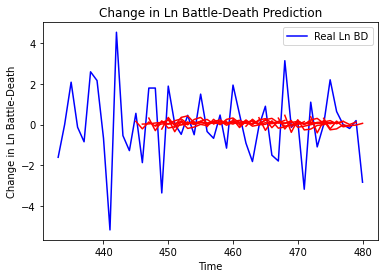

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 2.040549540081146, 'mae': 1.1256620017801022, 'r2': 0.08273493923054376, 'tadda_score': 1.173573689968814}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 2.7868851070548075, 'mae': 1.3230283797520384, 'r2': -0.03126741748530182, 'tadda_score': 1.3854304190216449}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 2.9277125100926544, 'mae': 1.3972726738979446, 'r2': -0.11976585636888726, 'tadda_score': 1.4978651626934636}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.504037213071041, 'mae': 1.553642665540258, 'r2': -0.11161401115390324, 'tadda_score': 1.6818570749909478}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 3.0801847380309657, 'mae': 1.2805432314664402, 'r2': -0.22114099455442382, 'tadda_score': 1.4602831179887332}
{'country': 'South Sudan', 'country_id': 246, 'step':

In [63]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=64, 
              look_back=12, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

['Cape Verde']
Building vanilla Model...
Model: "sequential_1046"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1026 (LSTM)             (None, 6)                 192       
_________________________________________________________________
dropout_2052 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_2052 (Dense)           (None, 6)                 42        
_________________________________________________________________
dropout_2053 (Dropout)       (None, 6)                 0         
_________________________________________________________________
dense_2053 (Dense)           (None, 7)                 49        
Total params: 283
Trainable params: 283
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100
40/40 [==============================] - 1s 16ms/step - loss: 0.00

40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 69/100
40/40 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 70/100
40/40 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 71/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 72/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 73/100
40/40 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 74/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 75/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 76/100
40/40 [=====================

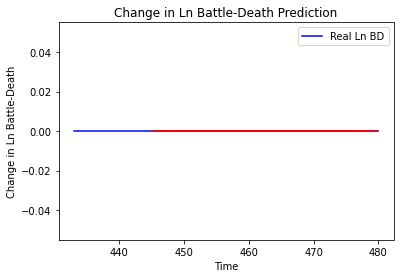

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Cape Verde', 'country_id': 40, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
["Cote d'Ivoire"]
Building vanilla Model...
Model: "sequential_1047"
_________________________________________________________________
Layer

Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5091 - val_loss: 0.4447
Epoch 65/100
40/40 [==============================] - 0s 9ms/step - loss: 0.5047 - val_loss: 0.4449
Epoch 66/100
40/40 [==============================] - 0s 8ms/step - loss: 0.5133 - val_loss: 0.4455
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 0.5152 - val_loss: 0.4454
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 0.5040 - val_loss: 0.4456
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5044 - val_loss: 0.4455
Epoch 70/100
40/40 [==============================] - 0s 8ms/step - loss: 0.5057 - val_loss: 0.4460
Epoch 71/100
40/40 [==============================] - 0s 8ms/step - loss: 0.4958 - val_loss: 0.4462
Epoch 72/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5135 - val_loss: 0.4476
Epoch 73/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5110 - val_loss: 0.4475


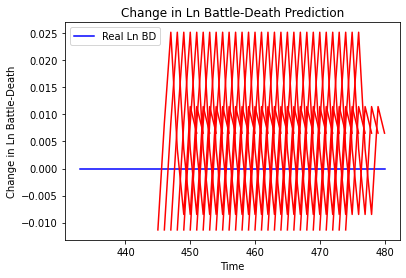

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+1', 'mse': 0.0001289253990466449, 'mae': 0.011354532092809677, 'r2': 0.0, 'tadda_score': 0.011354532092809677}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+2', 'mse': 8.71847312845786e-06, 'mae': 0.002952706068754196, 'r2': 0.0, 'tadda_score': 0.002952706068754196}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+3', 'mse': 0.000494652970910503, 'mae': 0.02224079519510269, 'r2': 0.0, 'tadda_score': 0.02224079519510269}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+4', 'mse': 0.0006667627276653182, 'mae': 0.0258217491209507, 'r2': 0.0, 'tadda_score': 0.0258217491209507}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+5', 'mse': 7.972451723924166e-05, 'mae': 0.008928858675062656, 'r2': 0.0, 'tadda_score': 0.008928858675062656}
{'country': "Cote d'Ivoire", 'country_id': 41, 'step': 't+6', 'mse': 0.00041516173899569866, 'mae': 0

Epoch 56/100
40/40 [==============================] - 0s 10ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [=======

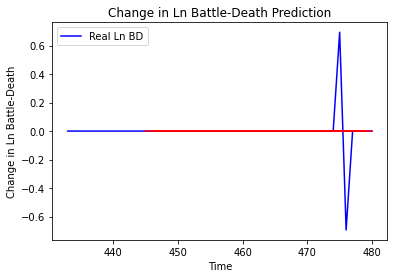

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ghana', 'country_id': 42, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Ghana', 'country_id': 42, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Liberia']
Building vanilla Model...
Model: "sequential_1049"
_________________________________________________________________
Layer (type)                 Output Shape     

Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 1.2171 - val_loss: 2.8233e-04
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1795 - val_loss: 3.8935e-04
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1749 - val_loss: 8.9881e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1737 - val_loss: 0.0012
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1754 - val_loss: 3.3670e-04
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1697 - val_loss: 0.0014
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1773 - val_loss: 1.4035e-04
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1607 - val_loss: 2.6535e-04
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 1.1599 - val_loss: 5.4522e-04
Epoch 71/100
40/40 [==============================] - 0s 7ms/step - loss

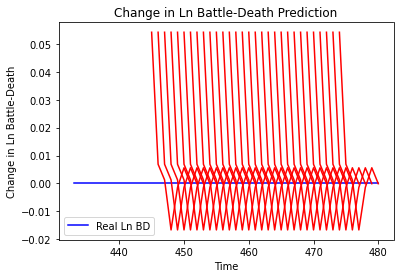

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Liberia', 'country_id': 43, 'step': 't+1', 'mse': 0.002941260277707025, 'mae': 0.05423338711261749, 'r2': 0.0, 'tadda_score': 0.05423338711261749}
{'country': 'Liberia', 'country_id': 43, 'step': 't+2', 'mse': 0.003732272119523705, 'mae': 0.0610923245549202, 'r2': 0.0, 'tadda_score': 0.0610923245549202}
{'country': 'Liberia', 'country_id': 43, 'step': 't+3', 'mse': 0.0038863859925521993, 'mae': 0.062340885400772095, 'r2': 0.0, 'tadda_score': 0.062340885400772095}
{'country': 'Liberia', 'country_id': 43, 'step': 't+4', 'mse': 0.002082544033063863, 'mae': 0.04563489928841591, 'r2': 0.0, 'tadda_score': 0.04563489928841591}
{'country': 'Liberia', 'country_id': 43, 'step': 't+5', 'mse': 0.0013942594844729705, 'mae': 0.03733978420495987, 'r2': 0.0, 'tadda_score': 0.03733978420495987}
{'country': 'Liberia', 'country_id': 43, 'step': 't+6', 'mse': 0.0018431767767218, 'mae': 0.042932234704494476, 'r2': 0.0, 'tadda_score'

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [=====================

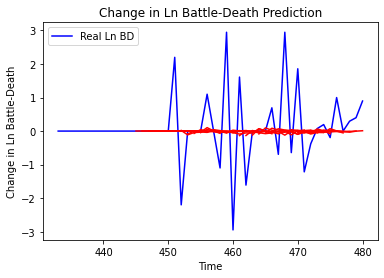

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+1', 'mse': 1.6742358161988065, 'mae': 0.8328972567027239, 'r2': -0.015253156805776102, 'tadda_score': 0.8470536019186603}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+2', 'mse': 1.2092589333046275, 'mae': 0.7352377098133078, 'r2': -0.021874229557697022, 'tadda_score': 0.7453250175421348}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+3', 'mse': 2.063178738671804, 'mae': 0.9173952916689282, 'r2': -0.034893516678366376, 'tadda_score': 0.9342738175351237}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+4', 'mse': 2.4274725216464903, 'mae': 1.0355582448561254, 'r2': -0.09353878648876557, 'tadda_score': 1.0635669937575123}
{'country': 'Burkina Faso', 'country_id': 47, 'step': 't+5', 'mse': 2.3769379789959877, 'mae': 0.9601071440125953, 'r2': -0.14024704256987452, 'tadda_score': 0.9848141024952582}
{'country': 'Burkina Faso', 'country_id': 47, 

40/40 [==============================] - 0s 7ms/step - loss: 0.2666 - val_loss: 9.0624e-05
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2628 - val_loss: 1.3435e-04
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.2606 - val_loss: 1.6484e-04
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2657 - val_loss: 2.3861e-05
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2647 - val_loss: 2.3540e-04
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2616 - val_loss: 1.6118e-04
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2591 - val_loss: 1.8848e-05
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2631 - val_loss: 3.0373e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2650 - val_loss: 1.1459e-04
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.2

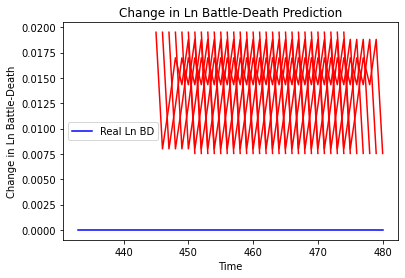

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea', 'country_id': 48, 'step': 't+1', 'mse': 0.00038053105135063894, 'mae': 0.019507205113768578, 'r2': 0.0, 'tadda_score': 0.019507205113768578}
{'country': 'Guinea', 'country_id': 48, 'step': 't+2', 'mse': 0.0007568094475694093, 'mae': 0.02751016989350319, 'r2': 0.0, 'tadda_score': 0.02751016989350319}
{'country': 'Guinea', 'country_id': 48, 'step': 't+3', 'mse': 0.0015821281910622376, 'mae': 0.03977597504854202, 'r2': 0.0, 'tadda_score': 0.03977597504854202}
{'country': 'Guinea', 'country_id': 48, 'step': 't+4', 'mse': 0.0032218940450762373, 'mae': 0.0567617304623127, 'r2': 0.0, 'tadda_score': 0.0567617304623127}
{'country': 'Guinea', 'country_id': 48, 'step': 't+5', 'mse': 0.003980441679974689, 'mae': 0.0630907416343689, 'r2': 0.0, 'tadda_score': 0.0630907416343689}
{'country': 'Guinea', 'country_id': 48, 'step': 't+6', 'mse': 0.006706465402574802, 'mae': 0.08189301192760468, 'r2': 0.0, 'tadda_score': 0.

40/40 [==============================] - 0s 7ms/step - loss: 0.6458 - val_loss: 1.4967e-04
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6518 - val_loss: 2.0342e-04
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6413 - val_loss: 7.3228e-04
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.6198 - val_loss: 9.1828e-05
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.6581 - val_loss: 0.0011
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6180 - val_loss: 5.5056e-05
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6645 - val_loss: 3.0750e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6184 - val_loss: 7.6563e-05
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6339 - val_loss: 4.8729e-04
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6157 

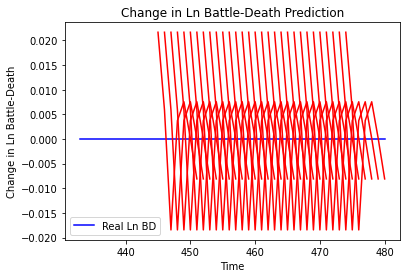

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+1', 'mse': 0.00046930594083522195, 'mae': 0.021663470193743706, 'r2': 0.0, 'tadda_score': 0.021663470193743706}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+2', 'mse': 0.0007607188947172383, 'mae': 0.02758113294839859, 'r2': 0.0, 'tadda_score': 0.02758113294839859}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+3', 'mse': 8.320923726068408e-05, 'mae': 0.009121909737586975, 'r2': 0.0, 'tadda_score': 0.009121909737586975}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+4', 'mse': 0.00016511432777637034, 'mae': 0.01284968201071024, 'r2': 0.0, 'tadda_score': 0.01284968201071024}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+5', 'mse': 0.00020978149218621456, 'mae': 0.01448383554816246, 'r2': 0.0, 'tadda_score': 0.01448383554816246}
{'country': 'Guinea-Bissau', 'country_id': 49, 'step': 't+6', 'mse': 0.0002137009001996898, 'mae

40/40 [==============================] - 0s 7ms/step - loss: 0.9984 - val_loss: 3.1551
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0048 - val_loss: 3.1477
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0088 - val_loss: 3.1514
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0084 - val_loss: 3.1449
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9947 - val_loss: 3.1430
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0004 - val_loss: 3.1502
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9979 - val_loss: 3.1444
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0057 - val_loss: 3.1471
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 1.0064 - val_loss: 3.1433
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 1.0020 - val_loss: 3.1489
Epoch 70/100


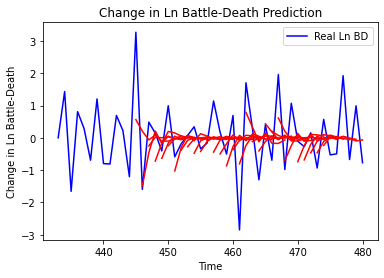

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mali', 'country_id': 50, 'step': 't+1', 'mse': 0.9101730854760127, 'mae': 0.7476872170100667, 'r2': 0.2790224176366314, 'tadda_score': 0.8932940857241609}
{'country': 'Mali', 'country_id': 50, 'step': 't+2', 'mse': 1.7582219502159178, 'mae': 1.0571469785580982, 'r2': -0.8160092611882721, 'tadda_score': 1.4163249171584797}
{'country': 'Mali', 'country_id': 50, 'step': 't+3', 'mse': 1.614915617177195, 'mae': 1.1044305759009299, 'r2': -0.4224821982691782, 'tadda_score': 1.4754759679075653}
{'country': 'Mali', 'country_id': 50, 'step': 't+4', 'mse': 2.2680654646185716, 'mae': 1.251690200019252, 'r2': -0.5166579359071113, 'tadda_score': 1.6397240424388368}
{'country': 'Mali', 'country_id': 50, 'step': 't+5', 'mse': 1.8135941767788955, 'mae': 1.090357773335871, 'r2': -0.6749409059649103, 'tadda_score': 1.3670733328482478}
{'country': 'Mali', 'country_id': 50, 'step': 't+6', 'mse': 2.134954591334883, 'mae': 1.246621160

40/40 [==============================] - 0s 7ms/step - loss: 1.6418 - val_loss: 0.5060
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6381 - val_loss: 0.5057
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6601 - val_loss: 0.5067
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6289 - val_loss: 0.5050
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6474 - val_loss: 0.5058
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6439 - val_loss: 0.5057
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6307 - val_loss: 0.5057
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6310 - val_loss: 0.5080
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6357 - val_loss: 0.5078
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 1.6518 - val_loss: 0.5087
Epoch 70/100


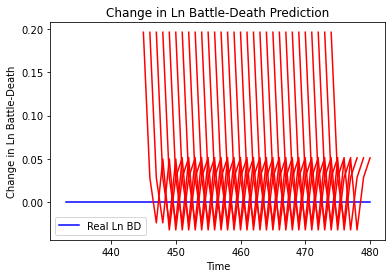

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Senegal', 'country_id': 52, 'step': 't+1', 'mse': 0.03859818025000927, 'mae': 0.1964641958475113, 'r2': 0.0, 'tadda_score': 0.1964641958475113}
{'country': 'Senegal', 'country_id': 52, 'step': 't+2', 'mse': 0.050389391920477644, 'mae': 0.22447581589221954, 'r2': 0.0, 'tadda_score': 0.22447581589221954}
{'country': 'Senegal', 'country_id': 52, 'step': 't+3', 'mse': 0.040173501352769314, 'mae': 0.20043328404426575, 'r2': 0.0, 'tadda_score': 0.20043328404426575}
{'country': 'Senegal', 'country_id': 52, 'step': 't+4', 'mse': 0.06264141741909501, 'mae': 0.2502826750278473, 'r2': 0.0, 'tadda_score': 0.2502826750278473}
{'country': 'Senegal', 'country_id': 52, 'step': 't+5', 'mse': 0.03609970464766832, 'mae': 0.18999922275543213, 'r2': 0.0, 'tadda_score': 0.18999922275543213}
{'country': 'Senegal', 'country_id': 52, 'step': 't+6', 'mse': 0.0477423230364602, 'mae': 0.21850016713142395, 'r2': 0.0, 'tadda_score': 0.218500

40/40 [==============================] - 0s 10ms/step - loss: 2.1982 - val_loss: 0.0010
Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1717 - val_loss: 7.8762e-04
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1861 - val_loss: 8.2041e-04
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1993 - val_loss: 0.0012
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1871 - val_loss: 6.3587e-04
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1874 - val_loss: 8.2184e-04
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 2.2235 - val_loss: 8.0936e-04
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 2.1981 - val_loss: 0.0019
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 2.2132 - val_loss: 0.0014
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 2.1913 - val_loss:

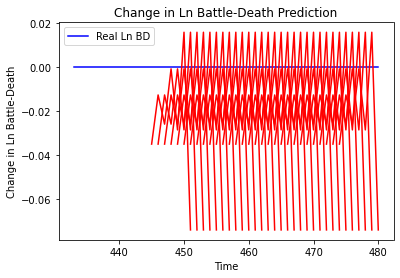

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+1', 'mse': 0.0012231377755274192, 'mae': 0.0349733866751194, 'r2': 0.0, 'tadda_score': 0.0349733866751194}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+2', 'mse': 0.0022696969833226888, 'mae': 0.0476413369178772, 'r2': 0.0, 'tadda_score': 0.0476413369178772}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+3', 'mse': 0.005409414108745958, 'mae': 0.07354871928691864, 'r2': 0.0, 'tadda_score': 0.07354871928691864}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+4', 'mse': 0.005531243293789567, 'mae': 0.07437232881784439, 'r2': 0.0, 'tadda_score': 0.07437232881784439}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+5', 'mse': 0.008140134508961838, 'mae': 0.09022269397974014, 'r2': 0.0, 'tadda_score': 0.09022269397974014}
{'country': 'Sierra Leone', 'country_id': 53, 'step': 't+6', 'mse': 0.0055396213887262125, 'mae': 0.074428632855415

Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [========

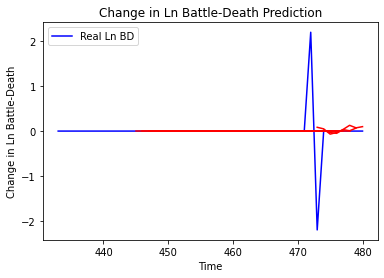

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'The Gambia', 'country_id': 54, 'step': 't+1', 'mse': 0.3344635006101058, 'mae': 0.14996411150983358, 'r2': -0.03918075081110084, 'tadda_score': 0.1527766746410865}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+2', 'mse': 0.3206260668255155, 'mae': 0.15051594397715115, 'r2': 0.00381226577617777, 'tadda_score': 0.15051594397715115}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+3', 'mse': 0.16120023594117155, 'mae': 0.07751101607477359, 'r2': -0.03624223256999781, 'tadda_score': 0.07751101607477359}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+4', 'mse': 0.16098918190446462, 'mae': 0.0752661927729417, 'r2': -0.03488551553473296, 'tadda_score': 0.0752661927729417}
{'country': 'The Gambia', 'country_id': 54, 'step': 't+5', 'mse': 0.16154135505451395, 'mae': 0.07832870462929896, 'r2': -0.0384350459335665, 'tadda_score': 0.07832870462929896}
{'country': 'The Gambia', 'country_id': 54, 'step'

40/40 [==============================] - 0s 7ms/step - loss: 0.6378 - val_loss: 6.6427e-04
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6412 - val_loss: 6.7782e-04
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6425 - val_loss: 3.5688e-04
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6393 - val_loss: 8.4870e-04
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6420 - val_loss: 1.4547e-04
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6368 - val_loss: 8.4844e-04
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6412 - val_loss: 2.8581e-04
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6487 - val_loss: 5.4247e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6422 - val_loss: 3.1941e-04
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6

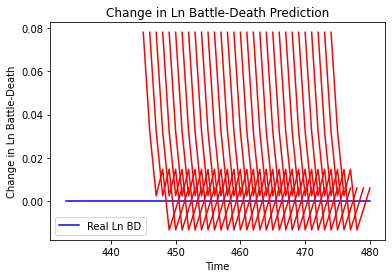

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Djibouti', 'country_id': 55, 'step': 't+1', 'mse': 0.006095553087322125, 'mae': 0.07807402312755585, 'r2': 0.0, 'tadda_score': 0.07807402312755585}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+2', 'mse': 0.012150455535597793, 'mae': 0.11022910475730896, 'r2': 0.0, 'tadda_score': 0.11022910475730896}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+3', 'mse': 0.012687504601823163, 'mae': 0.11263882368803024, 'r2': 0.0, 'tadda_score': 0.11263882368803024}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+4', 'mse': 0.01620817956258236, 'mae': 0.1273113489151001, 'r2': 0.0, 'tadda_score': 0.1273113489151001}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+5', 'mse': 0.006690726663312108, 'mae': 0.08179686218500137, 'r2': 0.0, 'tadda_score': 0.08179686218500137}
{'country': 'Djibouti', 'country_id': 55, 'step': 't+6', 'mse': 0.006075778662220588, 'mae': 0.07794728130102158, 'r2': 0.0, 'tadda_scor

34/34 [==============================] - 0s 7ms/step - loss: 2.0218 - val_loss: 0.0028
Epoch 60/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0251 - val_loss: 0.0015
Epoch 61/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0318 - val_loss: 8.7591e-04
Epoch 62/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0173 - val_loss: 0.0013
Epoch 63/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0043 - val_loss: 6.9508e-04
Epoch 64/100
34/34 [==============================] - 0s 7ms/step - loss: 1.9936 - val_loss: 0.0025
Epoch 65/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0425 - val_loss: 4.6524e-04
Epoch 66/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0222 - val_loss: 0.0025
Epoch 67/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0185 - val_loss: 0.0011
Epoch 68/100
34/34 [==============================] - 0s 7ms/step - loss: 2.0177 - val_loss: 9.1120e-

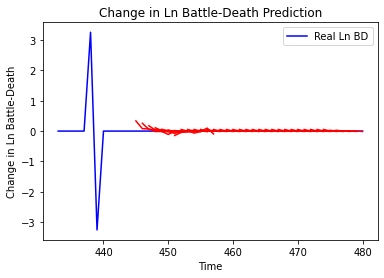

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Eritrea', 'country_id': 56, 'step': 't+1', 'mse': 0.010354190938721674, 'mae': 0.07739638052880764, 'r2': 0.0, 'tadda_score': 0.07739638052880764}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+2', 'mse': 0.01402868622453323, 'mae': 0.08125047584374746, 'r2': 0.0, 'tadda_score': 0.08125047584374746}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+3', 'mse': 0.020551565304366637, 'mae': 0.10772997786601385, 'r2': 0.0, 'tadda_score': 0.10772997786601385}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+4', 'mse': 0.019689664625520315, 'mae': 0.10509887213508289, 'r2': 0.0, 'tadda_score': 0.10509887213508289}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+5', 'mse': 0.015295150317620817, 'mae': 0.1017834173515439, 'r2': 0.0, 'tadda_score': 0.1017834173515439}
{'country': 'Eritrea', 'country_id': 56, 'step': 't+6', 'mse': 0.010409659446741977, 'mae': 0.09289009527613719, 'r2': 0.0, 'tadda_score': 0.

34/34 [==============================] - 0s 7ms/step - loss: 4.6954 - val_loss: 2.3637
Epoch 61/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6723 - val_loss: 2.3664
Epoch 62/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6611 - val_loss: 2.3700
Epoch 63/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6549 - val_loss: 2.3714
Epoch 64/100
34/34 [==============================] - 0s 8ms/step - loss: 4.6842 - val_loss: 2.3699
Epoch 65/100
34/34 [==============================] - 0s 8ms/step - loss: 4.6919 - val_loss: 2.3655
Epoch 66/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6674 - val_loss: 2.3707
Epoch 67/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6534 - val_loss: 2.3720
Epoch 68/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6545 - val_loss: 2.3672
Epoch 69/100
34/34 [==============================] - 0s 7ms/step - loss: 4.6457 - val_loss: 2.3701
Epoch 70/100


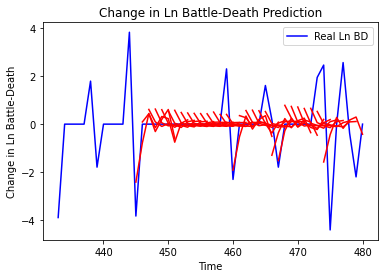

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+1', 'mse': 1.145584728052582, 'mae': 0.7951865669206784, 'r2': 0.16027693362721662, 'tadda_score': 0.8909548159555599}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+2', 'mse': 3.9543547245436317, 'mae': 1.3883922476432593, 'r2': -0.9818986987855001, 'tadda_score': 1.5834850528699027}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+3', 'mse': 3.8463954720700126, 'mae': 1.406139309076638, 'r2': -0.9277901736521068, 'tadda_score': 1.6064763196986624}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+4', 'mse': 4.009361203920061, 'mae': 1.4268401025416166, 'r2': -1.0094676139423209, 'tadda_score': 1.6247000851911015}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+5', 'mse': 3.122289731596908, 'mae': 1.199288141596487, 'r2': -0.5648727510143643, 'tadda_score': 1.3282454976123284}
{'country': 'Ethiopia', 'country_id': 57, 'step': 't+6', 'mse': 2.649602859282

Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.9491 - val_loss: 1.0050
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.9514 - val_loss: 1.0058
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9390 - val_loss: 1.0064
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9488 - val_loss: 1.0059
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9475 - val_loss: 1.0055
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9396 - val_loss: 1.0058
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9564 - val_loss: 1.0050
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9462 - val_loss: 1.0051
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9378 - val_loss: 1.0054
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.9420 - val_loss: 1.0067


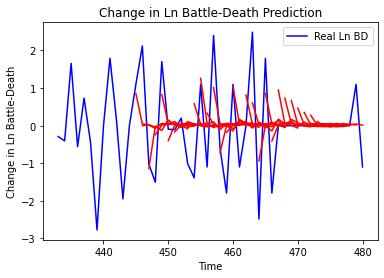

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Algeria', 'country_id': 67, 'step': 't+1', 'mse': 1.0572484011318746, 'mae': 0.8077110894682533, 'r2': 0.3370940436146286, 'tadda_score': 0.8429395589393901}
{'country': 'Algeria', 'country_id': 67, 'step': 't+2', 'mse': 2.406703754393024, 'mae': 1.1901515545376478, 'r2': -0.4289891399149024, 'tadda_score': 1.4576374979742706}
{'country': 'Algeria', 'country_id': 67, 'step': 't+3', 'mse': 2.7383846439515866, 'mae': 1.323431842738987, 'r2': -0.5265258486356128, 'tadda_score': 1.6314842842167627}
{'country': 'Algeria', 'country_id': 67, 'step': 't+4', 'mse': 2.9098039669063622, 'mae': 1.2876974101453411, 'r2': -0.4253343165860948, 'tadda_score': 1.5556607003598797}
{'country': 'Algeria', 'country_id': 67, 'step': 't+5', 'mse': 2.190244974322867, 'mae': 1.100246014565958, 'r2': -0.6275025628550734, 'tadda_score': 1.3221673272507721}
{'country': 'Algeria', 'country_id': 67, 'step': 't+6', 'mse': 2.227739634723719, '

Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1891 - val_loss: 1.0718
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1908 - val_loss: 1.0711
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1947 - val_loss: 1.0716
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1964 - val_loss: 1.0707
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1943 - val_loss: 1.0721
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1934 - val_loss: 1.0716
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1904 - val_loss: 1.0716
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1915 - val_loss: 1.0707
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1926 - val_loss: 1.0715
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1911 - val_loss: 1.0710


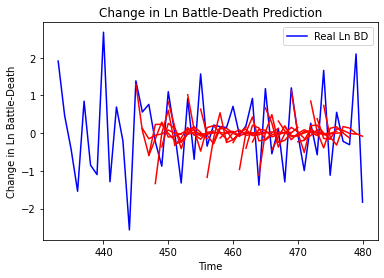

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Cameroon', 'country_id': 69, 'step': 't+1', 'mse': 0.5362097910127059, 'mae': 0.6174947050428344, 'r2': 0.27190669459485983, 'tadda_score': 0.7039603637870105}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+2', 'mse': 1.7086463777697987, 'mae': 1.1396616803985393, 'r2': -1.3148449041327899, 'tadda_score': 1.5710102555534797}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+3', 'mse': 1.3735242611784835, 'mae': 0.9538740770115307, 'r2': -0.4015510761777603, 'tadda_score': 1.131214726700768}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+4', 'mse': 1.5166399210267616, 'mae': 0.9544533414022636, 'r2': -0.7221049748334989, 'tadda_score': 1.1981922464943442}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+5', 'mse': 1.833425415361371, 'mae': 1.1140002471070156, 'r2': -0.8432218243814655, 'tadda_score': 1.4300340783457623}
{'country': 'Cameroon', 'country_id': 69, 'step': 't+6', 'mse': 1.987628349

40/40 [==============================] - 0s 8ms/step - loss: 0.7162 - val_loss: 2.6071
Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7210 - val_loss: 2.6049
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7169 - val_loss: 2.6051
Epoch 62/100
40/40 [==============================] - 0s 9ms/step - loss: 0.7161 - val_loss: 2.6055
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7114 - val_loss: 2.6039
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7093 - val_loss: 2.6057
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7274 - val_loss: 2.6066
Epoch 66/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7080 - val_loss: 2.6057
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7086 - val_loss: 2.6072
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 0.7159 - val_loss: 2.6095
Epoch 69/100


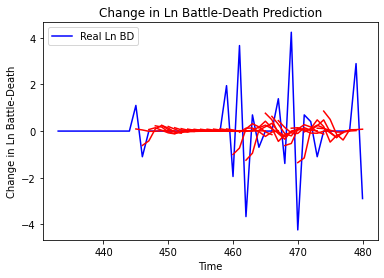

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+1', 'mse': 1.900739962655323, 'mae': 0.8855107807595457, 'r2': 0.28131173658957853, 'tadda_score': 0.8969402646997496}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+2', 'mse': 2.275333505486015, 'mae': 1.1335237944445782, 'r2': -0.5542180067013112, 'tadda_score': 1.2446500332973176}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+3', 'mse': 2.6210353433799036, 'mae': 1.068832902037207, 'r2': -0.11827525555439888, 'tadda_score': 1.1815765588711735}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+4', 'mse': 3.1356491013587755, 'mae': 1.1803311487863084, 'r2': -0.29698394261533934, 'tadda_score': 1.2731933991938449}
{'country': 'Central African Republic', 'country_id': 70, 'step': 't+5', 'mse': 2.791507566781893, 'mae': 0.9686328510746832, 'r2': -0.10155384968763981, 'tadda_score': 1.008482732654

40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 57/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 58/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0809
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0

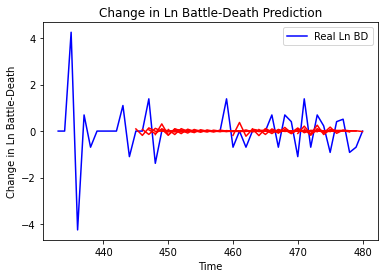

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tunisia', 'country_id': 73, 'step': 't+1', 'mse': 0.3649249544204435, 'mae': 0.4031542338610031, 'r2': 0.11606346941573775, 'tadda_score': 0.4081172714809912}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+2', 'mse': 0.39298325159275416, 'mae': 0.42784020990082233, 'r2': 0.04498935898577194, 'tadda_score': 0.4396079783260684}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+3', 'mse': 0.48620740506083066, 'mae': 0.472681433062854, 'r2': -0.01758700161885507, 'tadda_score': 0.47735408933321893}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+4', 'mse': 0.4918562135339323, 'mae': 0.4625005283129525, 'r2': -0.018611465729420518, 'tadda_score': 0.4644784809447638}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+5', 'mse': 0.4927238647107475, 'mae': 0.5102808646776542, 'r2': -0.11998319664412871, 'tadda_score': 0.5470029878038432}
{'country': 'Tunisia', 'country_id': 73, 'step': 't+6', 'mse': 0.588113

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

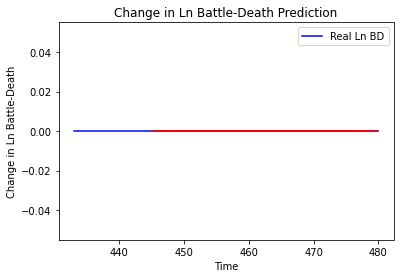

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Benin', 'country_id': 74, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Benin', 'country_id': 74, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Equatorial Guinea']
Building vanilla Model...
Model: "sequential_1065"
_________________________________________________________________
Layer (type)                 Output 

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [=====================

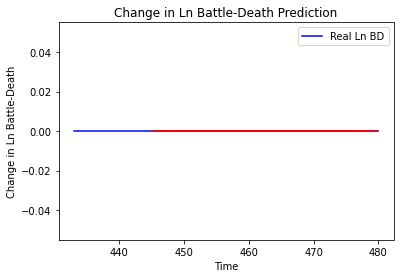

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Equatorial Guinea', 'country_id': 76, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Niger']
Building vanilla Model...
Model: "sequential_1066"
______________________________

40/40 [==============================] - 0s 8ms/step - loss: 0.8775 - val_loss: 1.3997
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8745 - val_loss: 1.3996
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8856 - val_loss: 1.3999
Epoch 66/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8858 - val_loss: 1.3993
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8830 - val_loss: 1.3998
Epoch 68/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8732 - val_loss: 1.3998
Epoch 69/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8798 - val_loss: 1.4008
Epoch 70/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8843 - val_loss: 1.3998
Epoch 71/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8765 - val_loss: 1.4002
Epoch 72/100
40/40 [==============================] - 0s 8ms/step - loss: 0.8784 - val_loss: 1.3997
Epoch 73/100


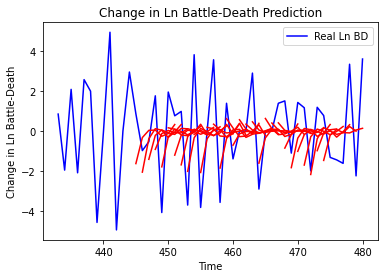

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Niger', 'country_id': 78, 'step': 't+1', 'mse': 3.6627438367333363, 'mae': 1.644471946103288, 'r2': 0.1544654561515173, 'tadda_score': 2.030280997100386}
{'country': 'Niger', 'country_id': 78, 'step': 't+2', 'mse': 7.222390276181973, 'mae': 2.240068896509306, 'r2': -0.8392526021986135, 'tadda_score': 2.8150535065900244}
{'country': 'Niger', 'country_id': 78, 'step': 't+3', 'mse': 6.58460593377782, 'mae': 2.0164659645625593, 'r2': -0.700115443223998, 'tadda_score': 2.6122523691722392}
{'country': 'Niger', 'country_id': 78, 'step': 't+4', 'mse': 7.031785358471942, 'mae': 2.2525529983798345, 'r2': -0.5497977406613048, 'tadda_score': 2.8033467236319862}
{'country': 'Niger', 'country_id': 78, 'step': 't+5', 'mse': 8.398639771653857, 'mae': 2.3066563865553698, 'r2': -0.5267955166700491, 'tadda_score': 2.879327607006964}
{'country': 'Niger', 'country_id': 78, 'step': 't+6', 'mse': 8.01826352500397, 'mae': 2.20636608867

Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5277 - val_loss: 1.2940
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5324 - val_loss: 1.2971
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5287 - val_loss: 1.2905
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5295 - val_loss: 1.2934
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5330 - val_loss: 1.2940
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5218 - val_loss: 1.3048
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5288 - val_loss: 1.3055
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5289 - val_loss: 1.3068
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5323 - val_loss: 1.3023
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5285 - val_loss: 1.3019


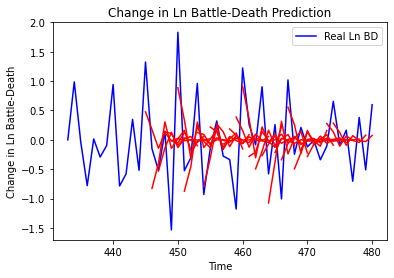

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Nigeria', 'country_id': 79, 'step': 't+1', 'mse': 0.3934926326314787, 'mae': 0.485330230779254, 'r2': 0.31148150994087553, 'tadda_score': 0.5516965238122182}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+2', 'mse': 1.3205481928341747, 'mae': 0.8929549199811966, 'r2': -1.4406226494170018, 'tadda_score': 1.2145764091335087}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+3', 'mse': 1.0288820050891512, 'mae': 0.8312324121096459, 'r2': -0.6792867832438334, 'tadda_score': 1.0641539617874947}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+4', 'mse': 1.3430322947598214, 'mae': 0.912045523964029, 'r2': -0.805452161703081, 'tadda_score': 1.2386342937178028}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+5', 'mse': 0.9323212041457026, 'mae': 0.7207837161560209, 'r2': -0.8210711464019333, 'tadda_score': 0.9460659483710281}
{'country': 'Nigeria', 'country_id': 79, 'step': 't+6', 'mse': 0.7934787325080207

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

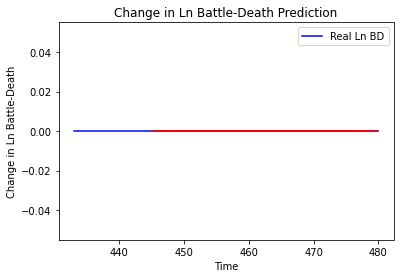

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Sao Tome and Principe', 'country_id': 80, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Togo']
Building vanilla Model...
Model: "sequential_1069"
___

40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [=====================

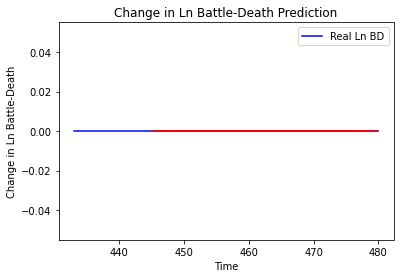

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Togo', 'country_id': 81, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Togo', 'country_id': 81, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Somalia']
Building vanilla Model...
Model: "sequential_1070"
_________________________________________________________________
Layer (type)                 Output Shape            

40/40 [==============================] - 0s 8ms/step - loss: 2.2913 - val_loss: 0.3384
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3163 - val_loss: 0.3386
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3020 - val_loss: 0.3388
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3026 - val_loss: 0.3412
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3097 - val_loss: 0.3380
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 2.2855 - val_loss: 0.3401
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3019 - val_loss: 0.3385
Epoch 71/100
40/40 [==============================] - 0s 8ms/step - loss: 2.2836 - val_loss: 0.3385
Epoch 72/100
40/40 [==============================] - 0s 8ms/step - loss: 2.3186 - val_loss: 0.3392
Epoch 73/100
40/40 [==============================] - 0s 7ms/step - loss: 2.2740 - val_loss: 0.3381
Epoch 74/100


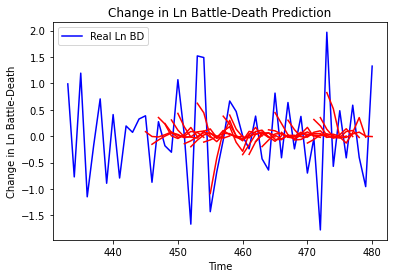

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Somalia', 'country_id': 120, 'step': 't+1', 'mse': 0.5462932449137463, 'mae': 0.5818836510438464, 'r2': 0.2828780067746087, 'tadda_score': 0.6656817584245149}
{'country': 'Somalia', 'country_id': 120, 'step': 't+2', 'mse': 1.416508872936374, 'mae': 0.9244464094515744, 'r2': -0.4444859020842511, 'tadda_score': 1.150132006041815}
{'country': 'Somalia', 'country_id': 120, 'step': 't+3', 'mse': 1.4594436107587634, 'mae': 0.9151926986720392, 'r2': -0.8286624079199931, 'tadda_score': 1.19552687789959}
{'country': 'Somalia', 'country_id': 120, 'step': 't+4', 'mse': 1.101280489511199, 'mae': 0.8491748648089188, 'r2': -0.5887398277720428, 'tadda_score': 1.032064719965261}
{'country': 'Somalia', 'country_id': 120, 'step': 't+5', 'mse': 0.9648718249786717, 'mae': 0.7603329922052607, 'r2': -0.25162483120484835, 'tadda_score': 0.92135838645621}
{'country': 'Somalia', 'country_id': 120, 'step': 't+6', 'mse': 0.974041726257077

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

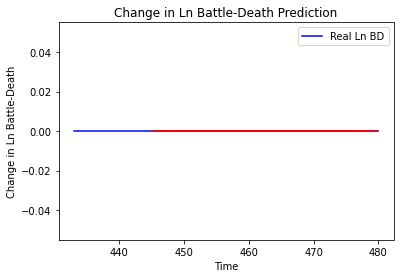

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Botswana', 'country_id': 154, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Botswana', 'country_id': 154, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Burundi']
Building vanilla Model...
Model: "sequential_1072"
_________________________________________________________________
Layer (type)      

Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9986 - val_loss: 1.1679
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9792 - val_loss: 1.1665
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9826 - val_loss: 1.1672
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9882 - val_loss: 1.1666
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9930 - val_loss: 1.1676
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9943 - val_loss: 1.1661
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9902 - val_loss: 1.1703
Epoch 71/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9864 - val_loss: 1.1693
Epoch 72/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9762 - val_loss: 1.1671
Epoch 73/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9895 - val_loss: 1.1683


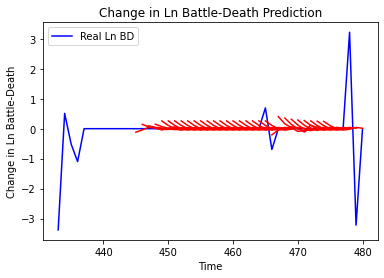

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Burundi', 'country_id': 155, 'step': 't+1', 'mse': 0.07679443884623567, 'mae': 0.26567536182421525, 'r2': -1.3975634439243052, 'tadda_score': 0.26567536182421525}
{'country': 'Burundi', 'country_id': 155, 'step': 't+2', 'mse': 0.17303656274581505, 'mae': 0.37494417714295863, 'r2': -4.402294014184551, 'tadda_score': 0.39375224200107733}
{'country': 'Burundi', 'country_id': 155, 'step': 't+3', 'mse': 0.17053390043886066, 'mae': 0.37530563610015394, 'r2': -4.324159558750148, 'tadda_score': 0.39165748096722447}
{'country': 'Burundi', 'country_id': 155, 'step': 't+4', 'mse': 0.133244639840885, 'mae': 0.3302076008142837, 'r2': -3.1599689037512304, 'tadda_score': 0.3423586434346247}
{'country': 'Burundi', 'country_id': 155, 'step': 't+5', 'mse': 0.0686724320640069, 'mae': 0.21743253183581512, 'r2': -1.1439900492235835, 'tadda_score': 0.22443411561069967}
{'country': 'Burundi', 'country_id': 155, 'step': 't+6', 'mse': 0

40/40 [==============================] - 0s 8ms/step - loss: 2.3448 - val_loss: 0.1900
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3489 - val_loss: 0.1898
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 2.3440 - val_loss: 0.1887
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3349 - val_loss: 0.1892
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3615 - val_loss: 0.1918
Epoch 64/100
40/40 [==============================] - 0s 10ms/step - loss: 2.3228 - val_loss: 0.1929
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3254 - val_loss: 0.1887
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3275 - val_loss: 0.1916
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3306 - val_loss: 0.1909
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 2.3536 - val_loss: 0.1907
Epoch 69/100

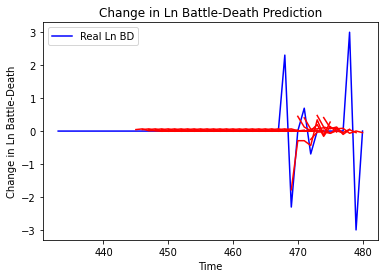

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Rwanda', 'country_id': 156, 'step': 't+1', 'mse': 0.20954549887281715, 'mae': 0.1963408730689144, 'r2': 0.4564179145346773, 'tadda_score': 0.1963408730689144}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+2', 'mse': 0.6558233197789233, 'mae': 0.4002451273067252, 'r2': -0.7012716082180839, 'tadda_score': 0.4390767487151877}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+3', 'mse': 0.5913708948312819, 'mae': 0.41002387240942795, 'r2': -1.1189402180899588, 'tadda_score': 0.4469723426840353}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+4', 'mse': 0.6116064237553206, 'mae': 0.40970258791273356, 'r2': -0.6577344217552483, 'tadda_score': 0.40970258791273356}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+5', 'mse': 0.6211348862199275, 'mae': 0.33913442620660383, 'r2': -0.6835609330547778, 'tadda_score': 0.35797130196318544}
{'country': 'Rwanda', 'country_id': 156, 'step': 't+6', 'mse': 0.63789320

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

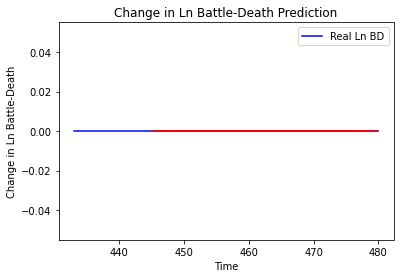

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zambia', 'country_id': 157, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zambia', 'country_id': 157, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Zimbabwe']
Building vanilla Model...
Model: "sequential_1075"
_________________________________________________________________
Layer (type)                 Ou

40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [=====================

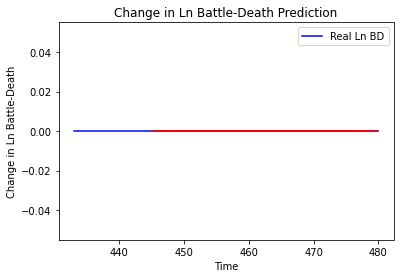

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Zimbabwe', 'country_id': 158, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Comoros']
Building vanilla Model...
Model: "sequential_1076"
_________________________________________________________________
Layer (type)      

40/40 [==============================] - 0s 7ms/step - loss: 0.1314 - val_loss: 7.8919e-05
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1295 - val_loss: 6.7813e-06
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1297 - val_loss: 4.6346e-06
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1307 - val_loss: 5.0302e-05
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1339 - val_loss: 5.1532e-06
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1301 - val_loss: 7.0624e-05
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1308 - val_loss: 1.1943e-05
Epoch 68/100
40/40 [==============================] - 1s 14ms/step - loss: 0.1299 - val_loss: 8.5430e-06
Epoch 69/100
40/40 [==============================] - 0s 9ms/step - loss: 0.1322 - val_loss: 2.8078e-04
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 0.

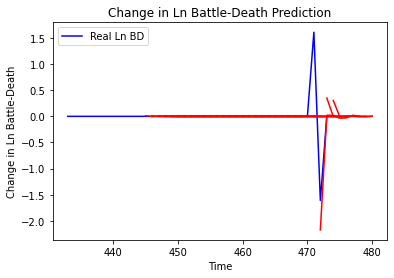

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Comoros', 'country_id': 159, 'step': 't+1', 'mse': 0.10287066951578537, 'mae': 0.10494176081071298, 'r2': 0.40429071337993194, 'tadda_score': 0.10494176081071298}
{'country': 'Comoros', 'country_id': 159, 'step': 't+2', 'mse': 0.37017680946140363, 'mae': 0.20842906681893664, 'r2': -1.143640788239523, 'tadda_score': 0.21998023041286466}
{'country': 'Comoros', 'country_id': 159, 'step': 't+3', 'mse': 0.3615620167137319, 'mae': 0.2086002628139992, 'r2': -1.0937537595436733, 'tadda_score': 0.2184049785268644}
{'country': 'Comoros', 'country_id': 159, 'step': 't+4', 'mse': 0.2492205758762797, 'mae': 0.15386196408146816, 'r2': -1.9859322657801353, 'tadda_score': 0.15386196408146816}
{'country': 'Comoros', 'country_id': 159, 'step': 't+5', 'mse': 0.25674782114011546, 'mae': 0.15758918591190574, 'r2': -2.0761168118462097, 'tadda_score': 0.15758918591190574}
{'country': 'Comoros', 'country_id': 159, 'step': 't+6', 'mse':

40/40 [==============================] - 0s 8ms/step - loss: 0.1430 - val_loss: 3.7429e-05
Epoch 58/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1443 - val_loss: 4.6239e-05
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1455 - val_loss: 2.7663e-05
Epoch 60/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1455 - val_loss: 1.0637e-05
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1421 - val_loss: 2.8043e-04
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1430 - val_loss: 2.2386e-05
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1451 - val_loss: 1.6324e-06
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1433 - val_loss: 3.8678e-05
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1432 - val_loss: 9.3155e-05
Epoch 66/100
40/40 [==============================] - 0s 8ms/step - loss: 0.1

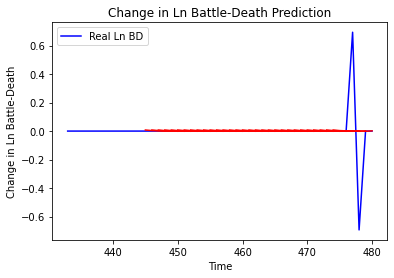

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Lesotho', 'country_id': 160, 'step': 't+1', 'mse': 5.623520439939169e-05, 'mae': 0.007499013561755419, 'r2': 0.0, 'tadda_score': 0.007499013561755419}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+2', 'mse': 0.0001200824808464708, 'mae': 0.010958215221762657, 'r2': 0.0, 'tadda_score': 0.010958215221762657}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+3', 'mse': 0.0001564870928414397, 'mae': 0.012509480118751526, 'r2': 0.0, 'tadda_score': 0.012509480118751526}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+4', 'mse': 0.00014349409127373258, 'mae': 0.01197890192270279, 'r2': 0.0, 'tadda_score': 0.01197890192270279}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+5', 'mse': 0.00010954084184586991, 'mae': 0.010466176085174084, 'r2': 0.0, 'tadda_score': 0.010466176085174084}
{'country': 'Lesotho', 'country_id': 160, 'step': 't+6', 'mse': 8.054783541159086e-05, 'mae': 0.008974844589829445, 'r

Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 9ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [========

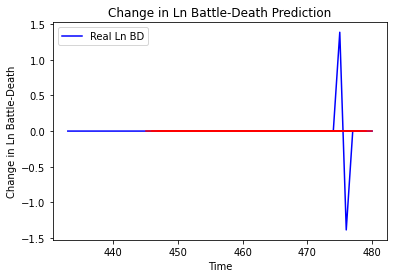

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Malawi', 'country_id': 161, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Malawi', 'country_id': 161, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mozambique']
Building vanilla Model...
Model: "sequential_1079"
_________________________________________________________________
Layer (type)                 

40/40 [==============================] - 0s 7ms/step - loss: 0.7357 - val_loss: 0.5834
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.8441 - val_loss: 0.5813
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7515 - val_loss: 0.5826
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7799 - val_loss: 0.5814
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.8219 - val_loss: 0.5802
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7486 - val_loss: 0.5810
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7316 - val_loss: 0.5817
Epoch 71/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7383 - val_loss: 0.5820
Epoch 72/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7387 - val_loss: 0.5811
Epoch 73/100
40/40 [==============================] - 0s 7ms/step - loss: 0.7834 - val_loss: 0.5799
Epoch 74/100


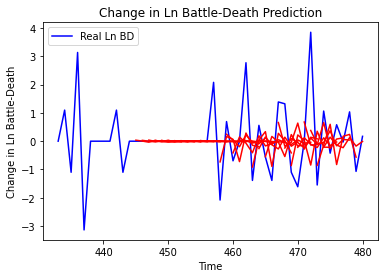

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mozambique', 'country_id': 162, 'step': 't+1', 'mse': 1.2042482025969286, 'mae': 0.6608206223393825, 'r2': 0.23469504202177338, 'tadda_score': 0.6845217626239208}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+2', 'mse': 2.309032808346094, 'mae': 0.9922960850692737, 'r2': -0.2068196252799659, 'tadda_score': 1.1099988982674425}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+3', 'mse': 2.26968904643264, 'mae': 1.0632137867655833, 'r2': -0.18594215858664498, 'tadda_score': 1.1651045288924355}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+4', 'mse': 2.4163024885569615, 'mae': 1.1075296120260123, 'r2': -0.6033553970995553, 'tadda_score': 1.3595233802225652}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+5', 'mse': 1.443121013772668, 'mae': 0.82579161537115, 'r2': -0.762061249059782, 'tadda_score': 0.9761053093391082}
{'country': 'Mozambique', 'country_id': 162, 'step': 't+6', 'mse

39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
39/39 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
39/39 [=====================

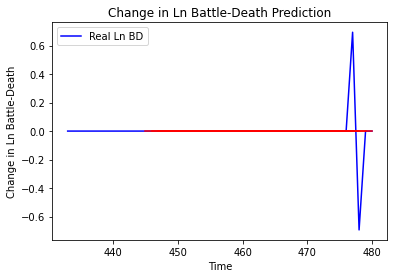

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Africa', 'country_id': 163, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'South Africa', 'country_id': 163, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Swaziland']
Building vanilla Model...
Model: "sequential_1081"
______________________________________________________

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [=====================

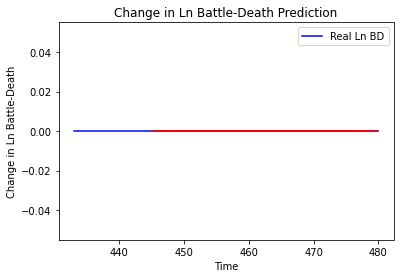

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Swaziland', 'country_id': 164, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Swaziland', 'country_id': 164, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Angola']
Building vanilla Model...
Model: "sequential_1082"
_________________________________________________________________
Layer (type)

Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2334 - val_loss: 0.1379
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2514 - val_loss: 0.1385
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2333 - val_loss: 0.1389
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2400 - val_loss: 0.1396
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2237 - val_loss: 0.1384
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2251 - val_loss: 0.1383
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2245 - val_loss: 0.1391
Epoch 71/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2348 - val_loss: 0.1386
Epoch 72/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2173 - val_loss: 0.1391
Epoch 73/100
40/40 [==============================] - 0s 7ms/step - loss: 3.2086 - val_loss: 0.1408


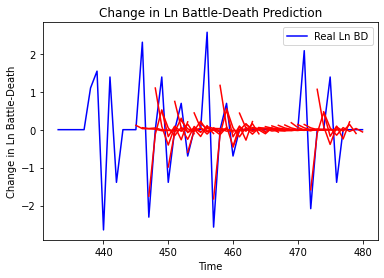

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Angola', 'country_id': 165, 'step': 't+1', 'mse': 0.74596343442083, 'mae': 0.5791233614645444, 'r2': 0.41378605965163173, 'tadda_score': 0.5791233614645444}
{'country': 'Angola', 'country_id': 165, 'step': 't+2', 'mse': 2.416036649778911, 'mae': 1.0943131852211596, 'r2': -0.8986377872430171, 'tadda_score': 1.2722049899957617}
{'country': 'Angola', 'country_id': 165, 'step': 't+3', 'mse': 1.2750886777625203, 'mae': 0.8574583821669031, 'r2': -0.45372156146877907, 'tadda_score': 0.9155326776876855}
{'country': 'Angola', 'country_id': 165, 'step': 't+4', 'mse': 1.1317237890039162, 'mae': 0.8318633832016914, 'r2': -0.054359720965477365, 'tadda_score': 0.8419833508610058}
{'country': 'Angola', 'country_id': 165, 'step': 't+5', 'mse': 1.2722951141589154, 'mae': 0.789893667403431, 'r2': -0.29945743820814785, 'tadda_score': 0.8308041160340819}
{'country': 'Angola', 'country_id': 165, 'step': 't+6', 'mse': 1.6040628292435

Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9374 - val_loss: 0.0563
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 1.9584 - val_loss: 0.0569
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9335 - val_loss: 0.0562
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9693 - val_loss: 0.0556
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9520 - val_loss: 0.0565
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9492 - val_loss: 0.0572
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9424 - val_loss: 0.0573
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9516 - val_loss: 0.0561
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9285 - val_loss: 0.0568
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 1.9129 - val_loss: 0.0569


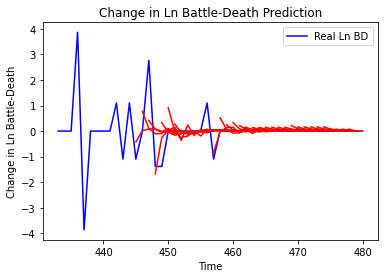

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo', 'country_id': 166, 'step': 't+1', 'mse': 0.424345411466387, 'mae': 0.4051170001405448, 'r2': 0.15757053878047733, 'tadda_score': 0.4169141134846181}
{'country': 'Congo', 'country_id': 166, 'step': 't+2', 'mse': 1.3637316430027995, 'mae': 0.7263765917336149, 'r2': -0.7944832396046133, 'tadda_score': 0.8796591774737043}
{'country': 'Congo', 'country_id': 166, 'step': 't+3', 'mse': 1.0875208671289402, 'mae': 0.6508762078007478, 'r2': -0.8336224772589376, 'tadda_score': 0.7488808583736836}
{'country': 'Congo', 'country_id': 166, 'step': 't+4', 'mse': 0.9252018226289228, 'mae': 0.6405363238374808, 'r2': -0.33192899008234833, 'tadda_score': 0.7364580744525213}
{'country': 'Congo', 'country_id': 166, 'step': 't+5', 'mse': 0.9324006883647897, 'mae': 0.6374158200145182, 'r2': -0.5720809702814464, 'tadda_score': 0.7117299899727522}
{'country': 'Congo', 'country_id': 166, 'step': 't+6', 'mse': 0.8512180238433247, '

Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9648 - val_loss: 3.5689
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9683 - val_loss: 3.5657
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9706 - val_loss: 3.5674
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9830 - val_loss: 3.5665
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9831 - val_loss: 3.5692
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9568 - val_loss: 3.5660
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9467 - val_loss: 3.5638
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9571 - val_loss: 3.5672
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9583 - val_loss: 3.5669
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 2.9733 - val_loss: 3.5698


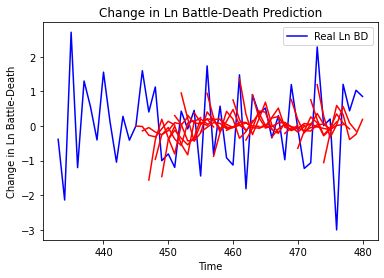

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+1', 'mse': 1.0432052616165068, 'mae': 0.7930102093991441, 'r2': 0.046849123334500864, 'tadda_score': 0.9919832519170447}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+2', 'mse': 3.1322269743146265, 'mae': 1.3943135072468833, 'r2': -1.2152722687513497, 'tadda_score': 1.8581726379373784}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+3', 'mse': 3.0868926877046063, 'mae': 1.3607895689443648, 'r2': -0.7895695098344366, 'tadda_score': 1.7684795794125299}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+4', 'mse': 3.897645916187233, 'mae': 1.5081484807112235, 'r2': -1.2372252814113551, 'tadda_score': 1.973871234067124}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+5', 'mse': 4.694421519707276, 'mae': 1.6538258370995644, 'r2': -1.5572533017966617, 'tadda_score': 2.2790434681862717}
{'country': 'Congo, DRC', 'country_id': 167, 'step': 't+6', 

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

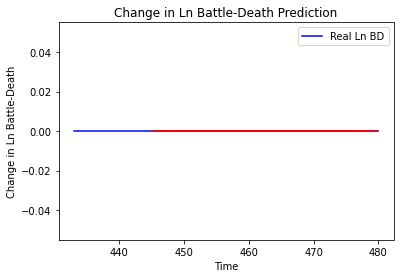

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Gabon', 'country_id': 169, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Gabon', 'country_id': 169, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Namibia']
Building vanilla Model...
Model: "sequential_1086"
_________________________________________________________________
Layer (type)                 Output Sha

Epoch 62/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1453 - val_loss: 8.3239e-05
Epoch 63/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1428 - val_loss: 5.7366e-05
Epoch 64/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1438 - val_loss: 8.1097e-05
Epoch 65/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1425 - val_loss: 1.0522e-04
Epoch 66/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1425 - val_loss: 2.2792e-05
Epoch 67/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1423 - val_loss: 2.4007e-05
Epoch 68/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1438 - val_loss: 3.4621e-05
Epoch 69/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1429 - val_loss: 2.0597e-05
Epoch 70/100
39/39 [==============================] - 0s 7ms/step - loss: 0.1480 - val_loss: 3.7582e-04
Epoch 71/100
39/39 [==============================] - 0s 7ms/ste

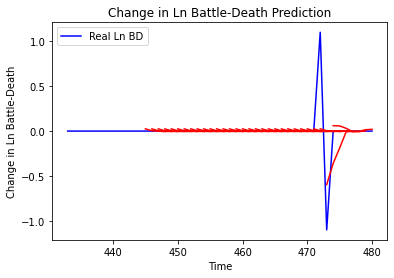

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Namibia', 'country_id': 170, 'step': 't+1', 'mse': 0.04756890890734196, 'mae': 0.07677273195878359, 'r2': 0.40881209000773266, 'tadda_score': 0.07677273195878359}
{'country': 'Namibia', 'country_id': 170, 'step': 't+2', 'mse': 0.11852415087462663, 'mae': 0.13348262947694156, 'r2': -0.4730219096609092, 'tadda_score': 0.13739403080836626}
{'country': 'Namibia', 'country_id': 170, 'step': 't+3', 'mse': 0.08307224669868164, 'mae': 0.10377053266711878, 'r2': -1.1360507292324962, 'tadda_score': 0.10377053266711878}
{'country': 'Namibia', 'country_id': 170, 'step': 't+4', 'mse': 0.08376419423777334, 'mae': 0.09857747314818548, 'r2': -1.153842893333084, 'tadda_score': 0.09857747314818548}
{'country': 'Namibia', 'country_id': 170, 'step': 't+5', 'mse': 0.06043776079388918, 'mae': 0.08205939043013102, 'r2': -0.5540463650300544, 'tadda_score': 0.08205939043013102}
{'country': 'Namibia', 'country_id': 170, 'step': 't+6', 'm

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [=====================

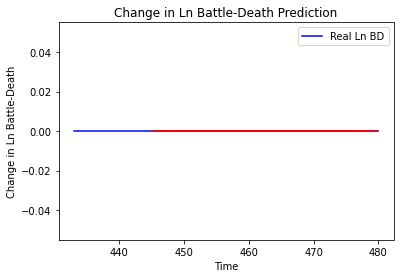

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Madagascar', 'country_id': 172, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Madagascar', 'country_id': 172, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Mauritius']
Building vanilla Model...
Model: "sequential_1088"
_________________________________________________________________
La

40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [=====================

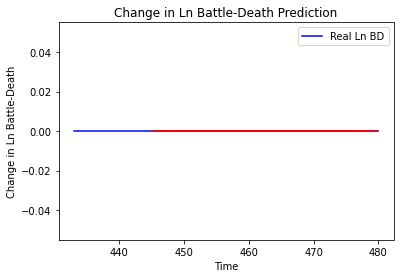

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritius', 'country_id': 173, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Mauritius', 'country_id': 173, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Seychelles']
Building vanilla Model...
Model: "sequential_1089"
_________________________________________________________________
Layer (t

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 67/100
40/40 [==============================] - 0s 8ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 68/100
40/40 [=====================

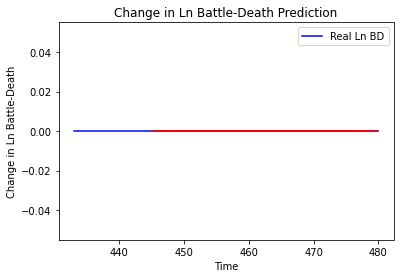

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Seychelles', 'country_id': 174, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Seychelles', 'country_id': 174, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Libya']
Building vanilla Model...
Model: "sequential_1090"
_________________________________________________________________
Layer 

40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 2.0810
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0

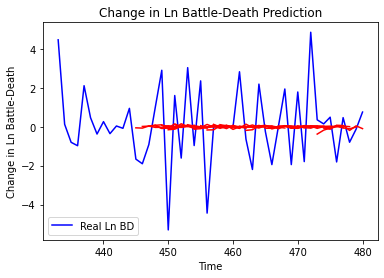

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Libya', 'country_id': 213, 'step': 't+1', 'mse': 4.643433252019703, 'mae': 1.671504170812348, 'r2': 0.04172879388208539, 'tadda_score': 1.6910171705530876}
{'country': 'Libya', 'country_id': 213, 'step': 't+2', 'mse': 5.663579217961471, 'mae': 1.830587350231307, 'r2': -0.04547532344382965, 'tadda_score': 1.8964222236493202}
{'country': 'Libya', 'country_id': 213, 'step': 't+3', 'mse': 7.622663944840786, 'mae': 2.143804372457731, 'r2': -0.026961609496009675, 'tadda_score': 2.210055865951447}
{'country': 'Libya', 'country_id': 213, 'step': 't+4', 'mse': 6.099672753666329, 'mae': 2.0114379907617934, 'r2': -0.0540600585650759, 'tadda_score': 2.0639347009330953}
{'country': 'Libya', 'country_id': 213, 'step': 't+5', 'mse': 7.453911947892061, 'mae': 2.29316353614233, 'r2': -0.024426596521136545, 'tadda_score': 2.3358900809298158}
{'country': 'Libya', 'country_id': 213, 'step': 't+6', 'mse': 6.503529169652828, 'mae': 1

40/40 [==============================] - 0s 7ms/step - loss: 4.9429 - val_loss: 0.5463
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9110 - val_loss: 0.5466
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9080 - val_loss: 0.5422
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9411 - val_loss: 0.5432
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9216 - val_loss: 0.5453
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9459 - val_loss: 0.5463
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9004 - val_loss: 0.5499
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9258 - val_loss: 0.5524
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9354 - val_loss: 0.5510
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 4.9456 - val_loss: 0.5463
Epoch 70/100


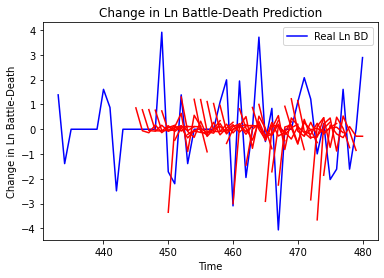

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Chad', 'country_id': 214, 'step': 't+1', 'mse': 3.0847773287046585, 'mae': 1.4568871565643264, 'r2': -0.050875588531557936, 'tadda_score': 1.6977880634847593}
{'country': 'Chad', 'country_id': 214, 'step': 't+2', 'mse': 7.934590215978427, 'mae': 2.2377519550278104, 'r2': -0.8692711390274177, 'tadda_score': 2.896916863556138}
{'country': 'Chad', 'country_id': 214, 'step': 't+3', 'mse': 9.194237662940017, 'mae': 2.375028135728839, 'r2': -0.7604434881191913, 'tadda_score': 2.9575534287611682}
{'country': 'Chad', 'country_id': 214, 'step': 't+4', 'mse': 13.302231741522608, 'mae': 3.053199339684663, 'r2': -1.1814332937488397, 'tadda_score': 3.9099692104029833}
{'country': 'Chad', 'country_id': 214, 'step': 't+5', 'mse': 11.632529289646907, 'mae': 2.711818704711484, 'r2': -1.448510010522869, 'tadda_score': 3.5092746145596965}
{'country': 'Chad', 'country_id': 214, 'step': 't+6', 'mse': 9.455092470687278, 'mae': 2.3853

40/40 [==============================] - 0s 7ms/step - loss: 0.5809 - val_loss: 1.4789
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5880 - val_loss: 1.4793
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5955 - val_loss: 1.4787
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5934 - val_loss: 1.4808
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5943 - val_loss: 1.4823
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5945 - val_loss: 1.4839
Epoch 66/100
40/40 [==============================] - 0s 8ms/step - loss: 0.5886 - val_loss: 1.4831
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5920 - val_loss: 1.4834
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.5926 - val_loss: 1.4836
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.6009 - val_loss: 1.4844
Epoch 70/100


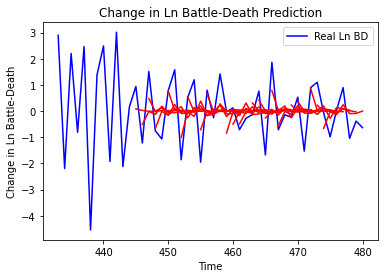

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Egypt', 'country_id': 222, 'step': 't+1', 'mse': 0.6425146266685725, 'mae': 0.651774195046658, 'r2': 0.4299120437517233, 'tadda_score': 0.6976884372149256}
{'country': 'Egypt', 'country_id': 222, 'step': 't+2', 'mse': 1.5205885581144813, 'mae': 1.0365639217548455, 'r2': -0.40605739436526256, 'tadda_score': 1.2673687855753186}
{'country': 'Egypt', 'country_id': 222, 'step': 't+3', 'mse': 1.424913474225062, 'mae': 0.9639869232785467, 'r2': -0.5364208808352096, 'tadda_score': 1.1895958998053535}
{'country': 'Egypt', 'country_id': 222, 'step': 't+4', 'mse': 1.2926674619890925, 'mae': 0.9671941409333367, 'r2': -0.04943358038369072, 'tadda_score': 1.139897394162796}
{'country': 'Egypt', 'country_id': 222, 'step': 't+5', 'mse': 1.5789216282517156, 'mae': 1.060857568154603, 'r2': -0.3308977841731684, 'tadda_score': 1.3310179383505085}
{'country': 'Egypt', 'country_id': 222, 'step': 't+6', 'mse': 1.4320617398908857, 'mae

Epoch 59/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5284 - val_loss: 5.1892e-04
Epoch 60/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5454 - val_loss: 3.3672e-04
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5398 - val_loss: 3.7176e-04
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5356 - val_loss: 5.0447e-04
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5503 - val_loss: 5.1936e-04
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5264 - val_loss: 5.7128e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5611 - val_loss: 2.8614e-04
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5438 - val_loss: 2.8905e-04
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 2.5079 - val_loss: 8.5984e-04
Epoch 68/100
40/40 [==============================] - 0s 7ms/ste

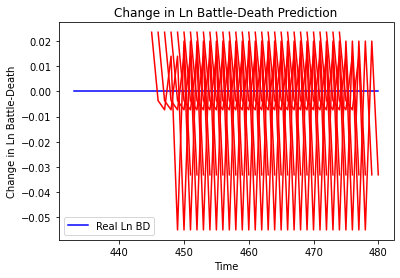

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Uganda', 'country_id': 235, 'step': 't+1', 'mse': 0.0005515192090155829, 'mae': 0.023484446108341217, 'r2': 0.0, 'tadda_score': 0.023484446108341217}
{'country': 'Uganda', 'country_id': 235, 'step': 't+2', 'mse': 0.0003925593695555986, 'mae': 0.019813111051917076, 'r2': 0.0, 'tadda_score': 0.019813111051917076}
{'country': 'Uganda', 'country_id': 235, 'step': 't+3', 'mse': 0.00015629417575166796, 'mae': 0.01250176690518856, 'r2': 0.0, 'tadda_score': 0.01250176690518856}
{'country': 'Uganda', 'country_id': 235, 'step': 't+4', 'mse': 0.0007018420321265456, 'mae': 0.026492301374673843, 'r2': 0.0, 'tadda_score': 0.026492301374673843}
{'country': 'Uganda', 'country_id': 235, 'step': 't+5', 'mse': 0.0006160133497221804, 'mae': 0.024819616228342056, 'r2': 0.0, 'tadda_score': 0.024819616228342056}
{'country': 'Uganda', 'country_id': 235, 'step': 't+6', 'mse': 2.3547441363513943e-05, 'mae': 0.004852570593357086, 'r2': 0.

40/40 [==============================] - 0s 7ms/step - loss: 0.1210 - val_loss: 1.6076
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1186 - val_loss: 1.6023
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1191 - val_loss: 1.6034
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1190 - val_loss: 1.6033
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1187 - val_loss: 1.6065
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1197 - val_loss: 1.6085
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1190 - val_loss: 1.6097
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1185 - val_loss: 1.6055
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1183 - val_loss: 1.6022
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.1183 - val_loss: 1.6049
Epoch 70/100


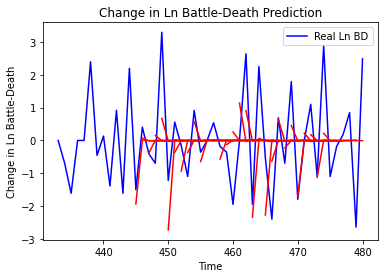

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Kenya', 'country_id': 237, 'step': 't+1', 'mse': 1.4369190658037663, 'mae': 0.8965256020202798, 'r2': 0.30654920124962026, 'tadda_score': 0.9222254454865617}
{'country': 'Kenya', 'country_id': 237, 'step': 't+2', 'mse': 3.6361452471230775, 'mae': 1.5407165575006332, 'r2': -0.9048374520565696, 'tadda_score': 2.016696592607595}
{'country': 'Kenya', 'country_id': 237, 'step': 't+3', 'mse': 3.346018491800435, 'mae': 1.4163632661918717, 'r2': -0.5323531637906385, 'tadda_score': 1.7113715886332015}
{'country': 'Kenya', 'country_id': 237, 'step': 't+4', 'mse': 4.150040835432606, 'mae': 1.6637964388811348, 'r2': -0.47777194194382977, 'tadda_score': 1.962850505811101}
{'country': 'Kenya', 'country_id': 237, 'step': 't+5', 'mse': 2.9730254324993335, 'mae': 1.2669699942226924, 'r2': -0.9628755713503263, 'tadda_score': 1.6149659568909027}
{'country': 'Kenya', 'country_id': 237, 'step': 't+6', 'mse': 2.7398325926181326, 'mae

30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 56/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 57/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 58/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 59/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 60/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 61/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 62/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 63/100
30/30 [==============================] - 0s 7ms/step - loss: 0.0000e+00 - val_loss: 0.0000e+00
Epoch 64/100
30/30 [=====================

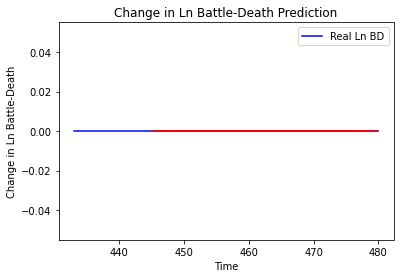

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Tanzania', 'country_id': 242, 'step': 't+1', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+2', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+3', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+4', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+5', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+6', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
{'country': 'Tanzania', 'country_id': 242, 'step': 't+7', 'mse': 0.0, 'mae': 0.0, 'r2': 1.0, 'tadda_score': 0.0}
['Morocco']
Building vanilla Model...
Model: "sequential_1096"
_________________________________________________________________
Layer (type)      

40/40 [==============================] - 0s 7ms/step - loss: 0.0713 - val_loss: 1.9039e-05
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0713 - val_loss: 8.5522e-05
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0725 - val_loss: 4.9854e-05
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0712 - val_loss: 1.0831e-04
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0716 - val_loss: 6.2722e-05
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0722 - val_loss: 2.9063e-05
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0718 - val_loss: 5.9285e-06
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0721 - val_loss: 1.9244e-04
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0750 - val_loss: 5.3619e-06
Epoch 70/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0

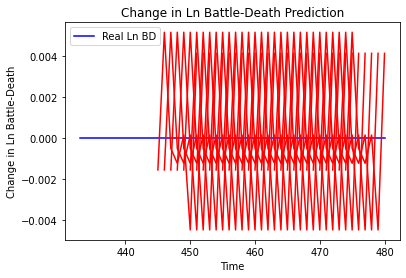

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Morocco', 'country_id': 243, 'step': 't+1', 'mse': 2.4712011371108566e-06, 'mae': 0.0015720054507255554, 'r2': 0.0, 'tadda_score': 0.0015720054507255554}
{'country': 'Morocco', 'country_id': 243, 'step': 't+2', 'mse': 1.284124980491957e-05, 'mae': 0.0035834689624607563, 'r2': 0.0, 'tadda_score': 0.0035834689624607563}
{'country': 'Morocco', 'country_id': 243, 'step': 't+3', 'mse': 9.37908116902756e-06, 'mae': 0.003062528558075428, 'r2': 0.0, 'tadda_score': 0.003062528558075428}
{'country': 'Morocco', 'country_id': 243, 'step': 't+4', 'mse': 3.3021214299288324e-06, 'mae': 0.0018171740230172873, 'r2': 0.0, 'tadda_score': 0.0018171740230172873}
{'country': 'Morocco', 'country_id': 243, 'step': 't+5', 'mse': 1.0268210392128324e-05, 'mae': 0.003204404842108488, 'r2': 0.0, 'tadda_score': 0.003204404842108488}
{'country': 'Morocco', 'country_id': 243, 'step': 't+6', 'mse': 5.9372173720883626e-05, 'mae': 0.0077053341083

40/40 [==============================] - 0s 7ms/step - loss: 0.0557 - val_loss: 0.1555
Epoch 61/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0555 - val_loss: 0.1557
Epoch 62/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0567 - val_loss: 0.1557
Epoch 63/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0560 - val_loss: 0.1558
Epoch 64/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0554 - val_loss: 0.1559
Epoch 65/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0557 - val_loss: 0.1557
Epoch 66/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0557 - val_loss: 0.1555
Epoch 67/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0554 - val_loss: 0.1556
Epoch 68/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0556 - val_loss: 0.1555
Epoch 69/100
40/40 [==============================] - 0s 7ms/step - loss: 0.0564 - val_loss: 0.1555
Epoch 70/100


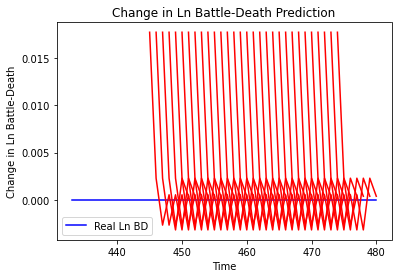

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Mauritania', 'country_id': 244, 'step': 't+1', 'mse': 0.0003148144064825248, 'mae': 0.017743010073900223, 'r2': 0.0, 'tadda_score': 0.017743010073900223}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+2', 'mse': 0.00040072174711872424, 'mae': 0.020018035545945168, 'r2': 0.0, 'tadda_score': 0.020018035545945168}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+3', 'mse': 0.00030033807362364953, 'mae': 0.017330264672636986, 'r2': 0.0, 'tadda_score': 0.017330264672636986}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+4', 'mse': 0.00031882928562898885, 'mae': 0.017855791375041008, 'r2': 0.0, 'tadda_score': 0.017855791375041008}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+5', 'mse': 0.00015336666813276292, 'mae': 0.01238412968814373, 'r2': 0.0, 'tadda_score': 0.01238412968814373}
{'country': 'Mauritania', 'country_id': 244, 'step': 't+6', 'mse': 0.00021510593645240883, 'mae': 0.0

Epoch 61/100
5/5 [==============================] - 0s 11ms/step - loss: 3.3944 - val_loss: 1.3955
Epoch 62/100
5/5 [==============================] - 0s 11ms/step - loss: 3.4444 - val_loss: 1.3965
Epoch 63/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4375 - val_loss: 1.3963
Epoch 64/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4234 - val_loss: 1.3969
Epoch 65/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4085 - val_loss: 1.3971
Epoch 66/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4235 - val_loss: 1.3980
Epoch 67/100
5/5 [==============================] - 0s 11ms/step - loss: 3.3737 - val_loss: 1.3995
Epoch 68/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4136 - val_loss: 1.4015
Epoch 69/100
5/5 [==============================] - 0s 11ms/step - loss: 3.3765 - val_loss: 1.4040
Epoch 70/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4546 - val_loss: 1.4065
Epoch 71/1

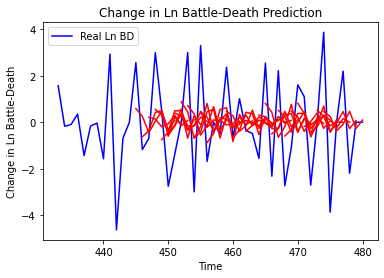

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'Sudan', 'country_id': 245, 'step': 't+1', 'mse': 2.831411554128984, 'mae': 1.4517538426071963, 'r2': 0.2923849364404999, 'tadda_score': 1.5360267287990015}
{'country': 'Sudan', 'country_id': 245, 'step': 't+2', 'mse': 5.344793460933833, 'mae': 1.920743819647367, 'r2': -0.25266093991346805, 'tadda_score': 2.3139358307653026}
{'country': 'Sudan', 'country_id': 245, 'step': 't+3', 'mse': 4.22758557573498, 'mae': 1.7047081214583122, 'r2': -0.09013065491201977, 'tadda_score': 1.8694666770494186}
{'country': 'Sudan', 'country_id': 245, 'step': 't+4', 'mse': 3.5807064727801357, 'mae': 1.5044514874749375, 'r2': -0.07849654629333358, 'tadda_score': 1.6020328914257875}
{'country': 'Sudan', 'country_id': 245, 'step': 't+5', 'mse': 5.1479905245247135, 'mae': 1.9539119869439106, 'r2': 0.01808372147859827, 'tadda_score': 2.136422730979155}
{'country': 'Sudan', 'country_id': 245, 'step': 't+6', 'mse': 4.860345902133893, 'mae':

5/5 [==============================] - 0s 9ms/step - loss: 7.1836 - val_loss: 5.2493
Epoch 62/100
5/5 [==============================] - 0s 9ms/step - loss: 7.1168 - val_loss: 5.2497
Epoch 63/100
5/5 [==============================] - 0s 8ms/step - loss: 7.0942 - val_loss: 5.2506
Epoch 64/100
5/5 [==============================] - 0s 9ms/step - loss: 6.9890 - val_loss: 5.2515
Epoch 65/100
5/5 [==============================] - 0s 9ms/step - loss: 7.2047 - val_loss: 5.2538
Epoch 66/100
5/5 [==============================] - 0s 8ms/step - loss: 7.1419 - val_loss: 5.2538
Epoch 67/100
5/5 [==============================] - 0s 9ms/step - loss: 7.0790 - val_loss: 5.2558
Epoch 68/100
5/5 [==============================] - 0s 10ms/step - loss: 7.1147 - val_loss: 5.2585
Epoch 69/100
5/5 [==============================] - 0s 10ms/step - loss: 7.0355 - val_loss: 5.2620
Epoch 70/100
5/5 [==============================] - 0s 9ms/step - loss: 7.1913 - val_loss: 5.2656
Epoch 71/100
5/5 [=============

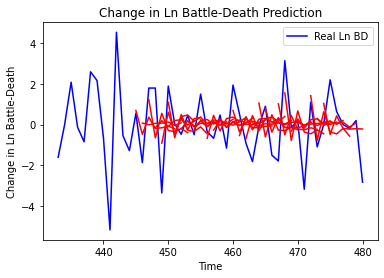

Storing forecasts...
Evaluating delta multi-step forecasts...
{'country': 'South Sudan', 'country_id': 246, 'step': 't+1', 'mse': 1.7157355048059806, 'mae': 1.006059853331752, 'r2': 0.2287449036804139, 'tadda_score': 1.1315467984442982}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+2', 'mse': 3.128654946049095, 'mae': 1.3697188291190052, 'r2': -0.15773696527605496, 'tadda_score': 1.517732791675924}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+3', 'mse': 3.8134638055005303, 'mae': 1.6760502205655157, 'r2': -0.4585402593927901, 'tadda_score': 2.0010510674481767}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+4', 'mse': 3.953639927515541, 'mae': 1.624808501756416, 'r2': -0.25424510963795965, 'tadda_score': 1.8349755672675632}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+5', 'mse': 3.903674665470059, 'mae': 1.5029785750092233, 'r2': -0.547614045531672, 'tadda_score': 1.7955146576246783}
{'country': 'South Sudan', 'country_id': 246, 'step': 't+6'

In [64]:
np.random.seed(1)
tf.random.set_seed(1)
model = Sequential()
summary_model(dataset=df,
              modelname = "Vanilla",
              pred_africa=True,
              period=period_test, 
              epochs=100, 
              batch_size=6, 
              look_back=12, 
              look_forward=7,
              num_neurons=6, 
              val_split=0.2)

###### 